# Anime Face Stable Diffusion Model 

**What are stable diffusion models**  

Stable diffusion models are state-of-art deep generative models in the machine learning field. They are capable of generating photo-realistic images from latent space and have been gaining significant attention in the past several years. Many famous generative AI websites [DALL-E 2](https://openai.com/dall-e-2), [Midjourney](https://www.midjourney.com/home/?callbackUrl=%2Fapp%2F), etc are based on the technique of stable diffusion models. 


**What is the goal of this notebook**  
  
In this notebook, I tried to built an ***unconditional*** denoising diffusion model from scratch and used the model to generate anime faces.    


**Anime faces generated from latent space:**
  
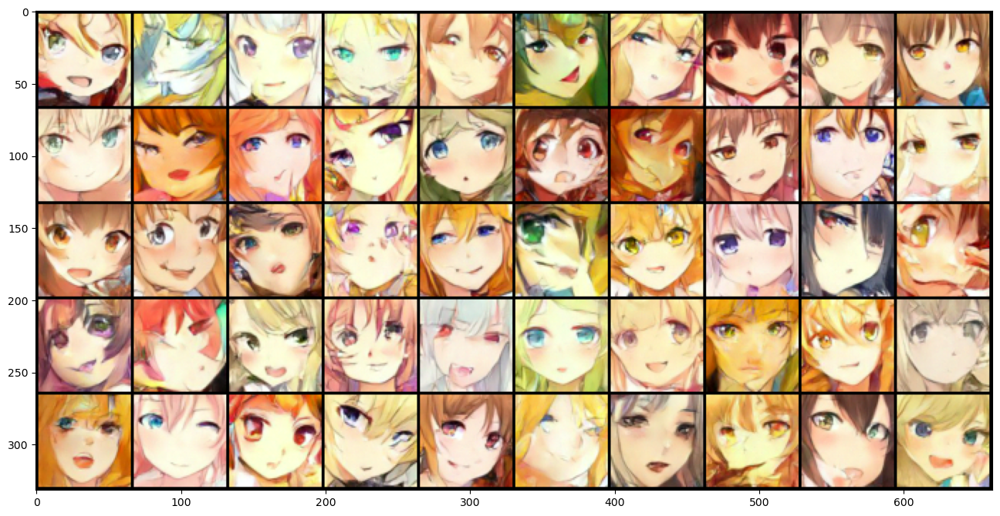

  
My codes and results are shown in below. 
  

**References**:  
[Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2006.11239)  
[Improved Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2102.09672?ref=assemblyai.com)  
[How stable diffusion work](https://stable-diffusion-art.com/how-stable-diffusion-work/#:~:text=Stable%20Diffusion%20is%20a%20latent,why%20it's%20a%20lot%20faster)  

**Github**:  
[Sung-Soo Kim's implementation](https://colab.research.google.com/drive/1sjy9odlSSy0RBVgMTgP7s99NXsqglsUL?usp=sharing)  
[Niels Rogge & Kashif Rasul's implementation](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)

## Datasets for Training

I used Anime_Faces_Dataset_128 scraped from [kaggle](https://www.kaggle.com/datasets/dimensi0n/anime-faces-dataset) which consists of around 100K high quality anime faces images (128*128 - white background - same pose)

In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
from torch.optim import Adam, SGD, AdamW
from torchvision import transforms
from torch.utils.data import DataLoader
from torchinfo import summary
from PIL import Image
from tqdm import tqdm

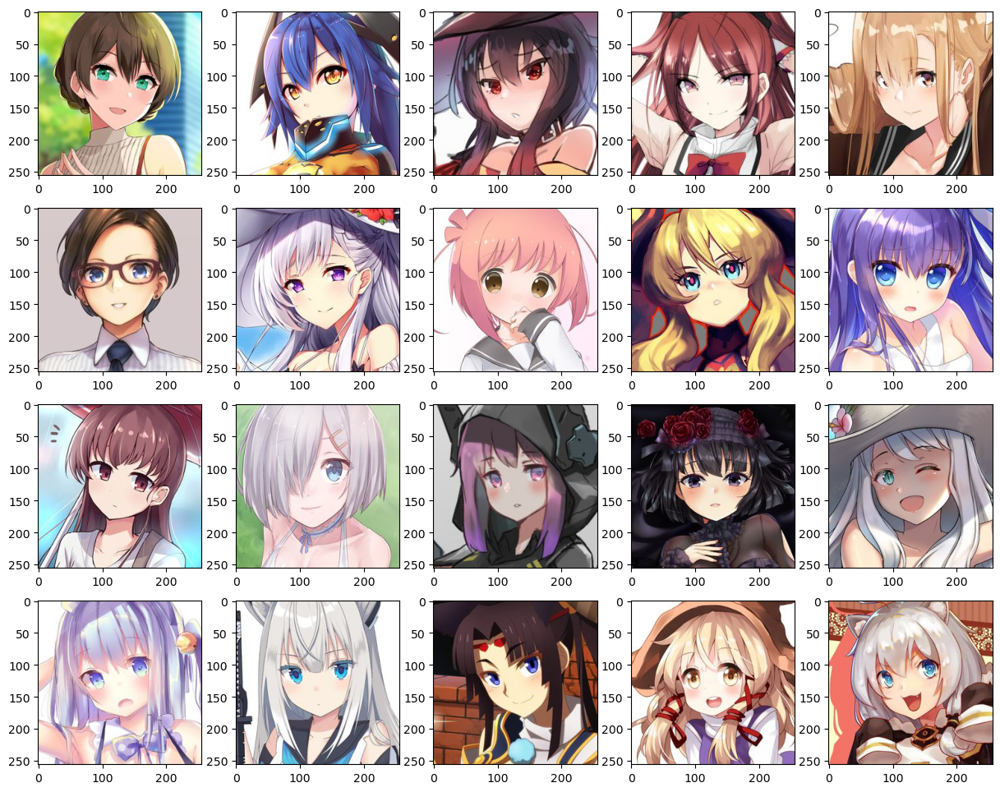

In [2]:
""" Plots some samples from the dataset """
nsamples = 20
ncols = 5
data = torchvision.datasets.ImageFolder(root=r'/Users/mwchang/Downloads/faces')
indices = torch.randint(low=0, high=len(data), size=(nsamples,))
samples = torch.utils.data.Subset(data, indices)
plt.figure(figsize=(15,15))
for i, img in enumerate(samples):
    plt.subplot(int(nsamples/ncols) + 1, ncols, i + 1)
    plt.imshow(img[0])
del(data)

##  Forward and Reverse Diffusion Process

In a denoise diffusion model, the noise-corrupted input data is treated as the initial state. The model then applies a series of denoising steps, where each step reduces the noise level and refines the data. 

During the denoising process, the model estimates the posterior distribution of the clean data given the current state and noise level. It leverages the inherent patterns and structure in the data to guide the denoising process. By iteratively applying these denoising steps, the model gradually removes the noise and converges towards a cleaner representation of the original data.

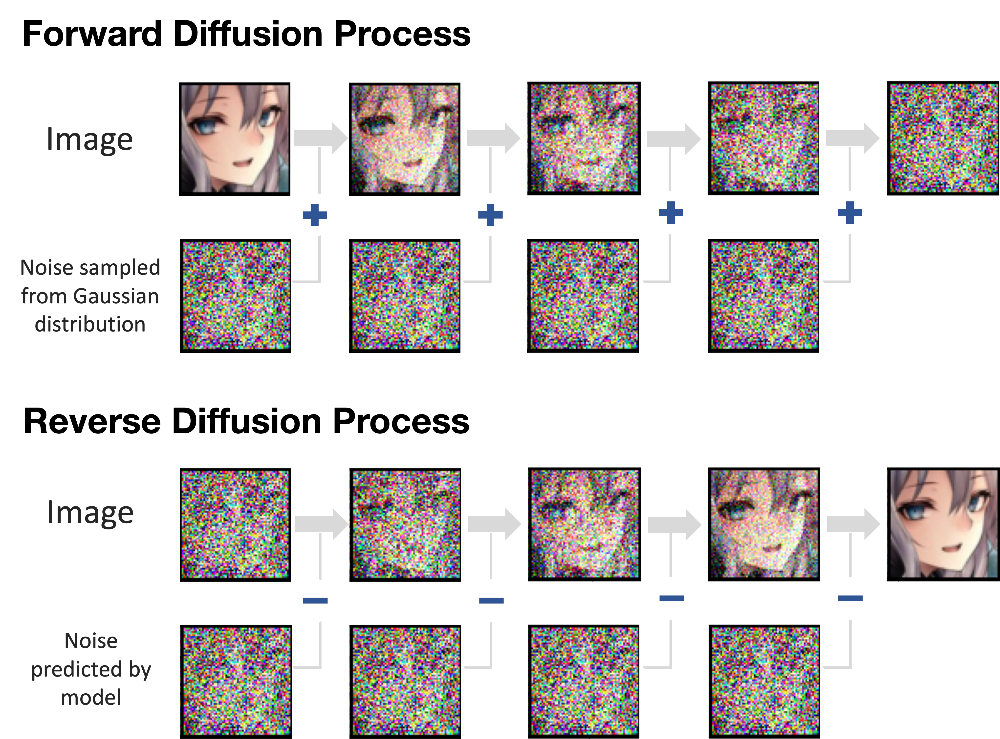

**Ref websites:**  
[Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2006.11239)  
[Improved Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2102.09672?ref=assemblyai.com)  
[How stable diffusion work](https://stable-diffusion-art.com/how-stable-diffusion-work/#:~:text=Stable%20Diffusion%20is%20a%20latent,why%20it's%20a%20lot%20faster)  
[Positional Encoding](https://machinelearningmastery.com/a-gentle-introduction-to-positional-encoding-in-transformer-models-part-1/)  

### Implementation of Diffusion

In [3]:
class Diffusion:
    """ This class implements the diffusion process described in the papers:
        https://arxiv.org/abs/2006.11239
        https://arxiv.org/abs/2102.09672?ref=assemblyai.com
    """

    def __init__(
            self,
            noise_steps: int = 1000,
            beta_1: float = 1e-4,
            beta_t: float = 0.02,
            img_size: int = 64,
            device: str = 'cpu') -> None:

        self.noise_steps = noise_steps  # T
        self.img_size = img_size
        self.device = device

        # Gaussian noise to the data according to a variance schedule β1, . . . , βT:
        self.beta = torch.linspace(beta_1, beta_t, noise_steps)  # shape: (noise_steps,)

        # alpha = 1 − βt
        self.alpha = 1.0 - self.beta  # shape: (noise_steps,)

        # alpha_bar = ∏t′=1,...,t (1 − αt′)
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)  # shape: (noise_steps,)

        # Move to the target device:
        self.beta = self.beta.to(self.device)   # shape: (noise_steps,)
        self.alpha = self.alpha.to(self.device)  # shape: (noise_steps,)
        self.alpha_bar = self.alpha_bar.to(self.device)  # shape: (noise_steps,)

    def sample_timesteps(self, n: int = 1) -> torch.Tensor:
        """ Sample n timesteps uniformly from [1, noise_steps]"""
        return torch.randint(low=1, high=self.noise_steps, size=(n,)).long().to(self.device)  # shape: (n,)

    def noise_image_at_time_t(self, x0: torch.Tensor, t: int or torch.Tensor) -> tuple[torch.Tensor]:
        """ Forward diffusion process:
        Add Gaussian noise to the image according to:

            xt(x0, epsilon) = √ᾱt x0 + √(1 − ᾱt) epsilon, where epsilon ~ N(0, I)

        Parameters:
            x0: image_to_be_noised, shape: (N, C, H, W)
            t: time step, shape: (N, )
        """
        if type(t) == int:
            # Convert t to a tensor:
            t = (torch.ones(x0.shape[0]) * t).long().to(self.device)   # shape: (N, )

        # Get the alpha_bar at time step t:
        alpha_bar_t = self.alpha_bar[t][:, None, None, None]  # shape: (N, 1, 1, 1)

        # Generate Gaussian noise:
        epsilon = torch.randn_like(x0)  # shape: (N, C, H, W); normal distribution with mean=0, std=1

        # Add Gaussian noise to the data:
        xt = torch.sqrt(alpha_bar_t) * x0 + torch.sqrt(1.0 - alpha_bar_t) * epsilon  # shape: (N, C, H, W)
        return xt, epsilon

    def denoise_at_time_t(self, model: nn.Module, xt: torch.Tensor, t: int) -> torch.Tensor:
        """ Denoise at time step t

         xt-1 = 1/√αt * (xt - (1 - αt)/√(1 - ᾱt) * e(xt, t)) + √βt * z,

        where:
            xt-1 is the denoised image at time step t-1,
            xt is the noised image at time step t,
            z ~ N(0, I), and
            e(xt, t) is the predicted noise at time step t, x

        Parameters:
            model: the model used to predict the noise
            xt: the noised image at time step t, shape: (N, C, H, W)
            t: time step, shape: (N, )

        Returns:
            xt_1: the denoised image at time step t-1, shape: (N, C, H, W)
        """

        if t > 1:
            z = torch.randn(xt.shape).to(self.device)  # shape: (N, C, H, W)
        else:
            z = torch.zeros(xt.shape).to(self.device)  # shape: (N, C, H, W)

        # Convert t to a tensor:
        t = (torch.ones(xt.shape[0]) * t).long().to(self.device)   # shape: (N, )

        # Get the predicted noise:
        predicted_noise = model(xt, t)  # shape: (N, C, H, W)

        # Get the alpha at time step t:
        alpha_t = self.alpha[t][:, None, None, None]  # shape: (N, 1, 1, 1)

        # Get the alpha_bar at time step t:
        alpha_bar_t = self.alpha_bar[t][:, None, None, None]  # shape: (N, 1, 1, 1)

        # Get the beta at time step t:
        beta_t = self.beta[t][:, None, None, None]  # shape: (N, 1, 1, 1)

        # Denoise:
        xt_1 = 1 / torch.sqrt(alpha_t) * (
                xt - ((1 - alpha_t) / (torch.sqrt(1 - alpha_bar_t))) * predicted_noise
        ) + torch.sqrt(beta_t) * z  # shape: (N, C, H, W)

        return xt_1  # x at time step t-1

    @torch.no_grad()
    def sample(self, model: nn.Module, n: int) -> torch.Tensor:
        """ Sample n images from the model.
         This is the implementation of Algorithm 2 in the paper: https://arxiv.org/abs/2006.11239

        Parameters:
            model: the model used to predict the noise
            n: number of images to be sampled
         """
        # Set the model to evaluation mode:
        model.eval()

        # Sample noise: xT ~ N(0, I)
        x = torch.randn((n, 3, self.img_size, self.img_size)).to(self.device)  # shape: (N, C, H, W)

        # Denoise from time step T to 1:
        for t in tqdm(reversed(range(1, self.noise_steps)), position=0):   # t = T, T-1, ..., 1
            x = self.denoise_at_time_t(model=model, xt=x, t=t)  # x at time step t-1

        # Clamp the values to [-1, 1]
        x0 = x  # x at time step 0

        # # Set the model back to training mode:
        model.train()
        return x0  # shape: (N, C, H, W)

##  Positional Encoding

Diffusion models typically involve modeling the noise distribution at each step of the diffusion process. The noise distribution may vary over time, and one needs to incorporate time-dependent information or time-related features into the model the model to capture temporal variations in the noise characteristics. Such time series data can be considered as sequential information. It can be described by the position of an entity in a sequence so that each position is assigned a unique representation. 

Positional encoding is a technique first proposed in a transformer paper: [Attention Is All You Need](https://arxiv.org/abs/1706.03762) to address the lack of sequential information in transformer models. The technique is applied for encoding time sequential information as well.

 
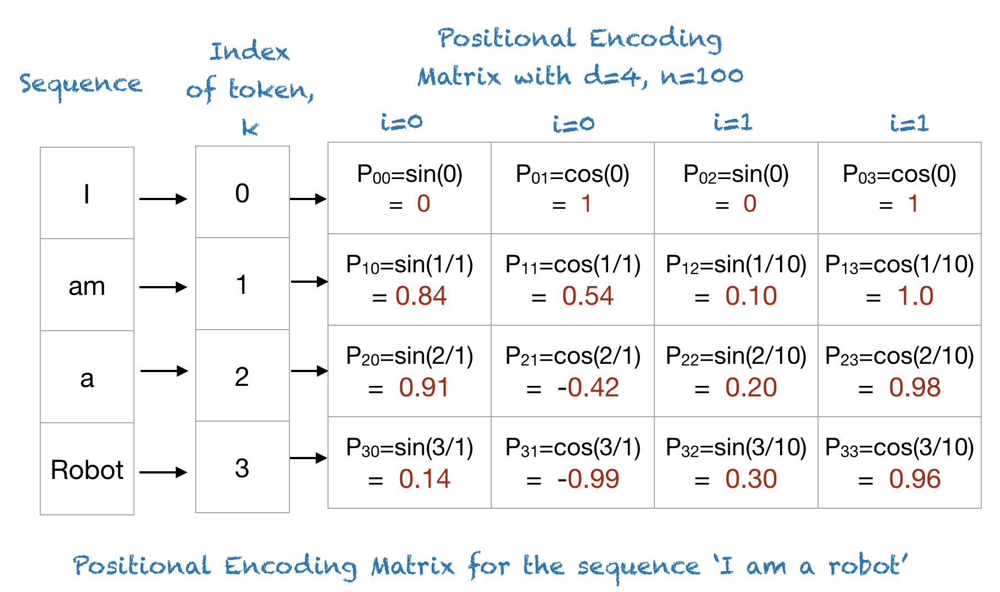
 
**Ref websites:**  
https://kazemnejad.com/blog/transformer_architecture_positional_encoding/  
https://machinelearningmastery.com/a-gentle-introduction-to-positional-encoding-in-transformer-models-part-1/  

### Implementation of PositionalEncoder 

In [4]:
class PositionalEncoder(nn.Module):
    """ This class implements the Position Encoder from the paper:
        https://arxiv.org/abs/1706.03762

        Ref website:
        https://kazemnejad.com/blog/transformer_architecture_positional_encoding/
        https://machinelearningmastery.com/a-gentle-introduction-to-positional-encoding-in-transformer-models-part-1/
    """

    _pem = None  # positional embedding matrix

    def __init__(self, seq_len: int, emb_dim: int) -> None:
        """
        Parameters:
        out_features: the number of output features of the layer
        seq_len: the length of the sequence or total time steps,
        emb_dim: the dimension of the embedding vector
        """

        super().__init__()
        self.seq_len = seq_len
        self.emb_dim = emb_dim

        # To save memory, we will only create the positional embedding matrix once
        if self._pem is None or self._pem.shape != (seq_len, emb_dim):
            self._pem = self.create_sinusoidal_pos_emb(seq_len, emb_dim)

    @staticmethod
    def create_sinusoidal_pos_emb(seq_len: int, dim: int) -> torch.Tensor:
        """
        PE(pos, 2i) = sin(pos / 10000^(2i/dim))
        PE(pos, 2i+1) = cos(pos / 10000^(2i/dim))

        where:
            pos is the time position,
            i is the index of the dimension,
            dim is the dimension of the embedding vector.

        """
        pem = torch.zeros(seq_len, dim)  # shape: (seq_length, dim)
        pos = torch.arange(0, seq_len).unsqueeze(1)  # shape: (seq_length, 1)
        i = torch.arange(0, dim, 2)  # shape: (dim / 2, )
        pem[:, 0::2] = torch.sin(pos / 10000 ** (2 * i / dim))
        pem[:, 1::2] = torch.cos(pos / 10000 ** (2 * i / dim))
        return pem

    def forward(self, t: torch.Tensor) -> torch.Tensor:
        """ Forward pass of the Positional Embedding Layer
         Parameters:
            t: the time step, shape: (N, ), where N is the batch size,

         Returns:
             time embedding vectors, shape: (N, dim)
         """
        # Move the positional embedding matrix to the same device as t:
        if self._pem.device != t.device:
            self._pem = self._pem.to(t.device)

        # Get the positional embedding vector for each time step:
        return self._pem[t, :]  # shape: (N, dim)

## UNet architecture and diffusion models

UNet has been widely adopted in various computer vision tasks. It was introduced by Olaf Ronneberger, Philipp Fischer, and Thomas Brox in their 2015 paper titled [U-Net: Convolutional Networks for Biomedical Image Segmentation](https://arxiv.org/abs/1505.04597). The name "UNet" comes from the U-shaped architecture of the network, which consists of a contracting path (downsampling path) and an expanding path (upsampling path). 

In this Notebook, the UNet architecture is adopted as the denoiser or generator component within the diffusion model framework. At each step, the UNet takes the noisy image as input and produces a denoised version. This denoised version is then used as the input for the next step, progressively reducing the noise level. The UNet can leverage its ability to capture both local and global features to enhance the denoising process. The network looks like:

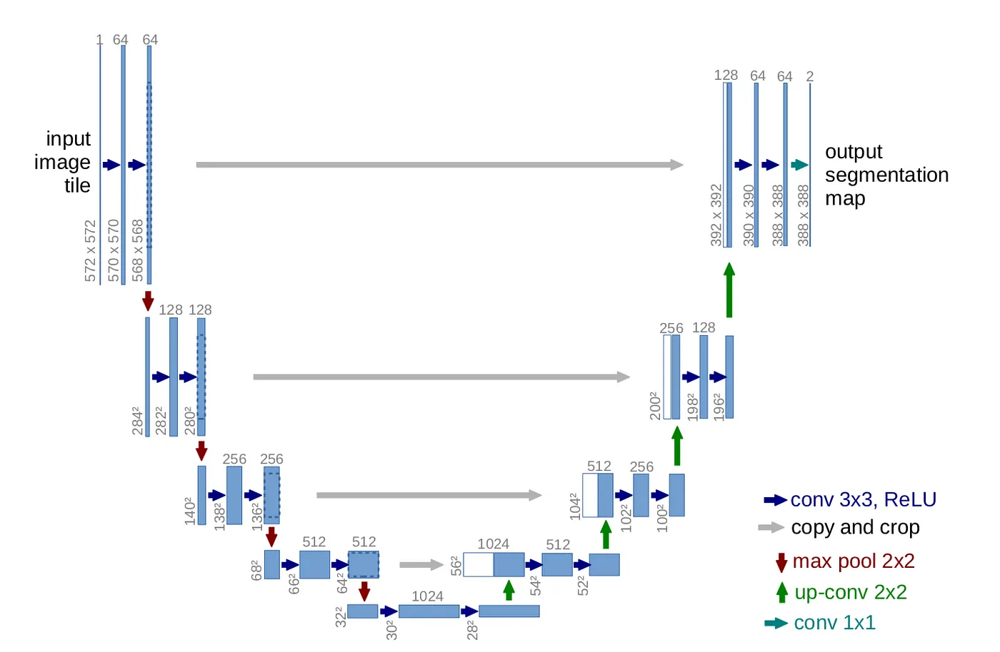

**Ref websites:**  
[What is UNET?](https://medium.com/analytics-vidhya/what-is-unet-157314c87634#:~:text=UNET%20is%20a%20U%2Dshaped,channels\)%20at%20each%20encoder%20block.)  
[UNet — Line by Line Explanation](https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5). 

### Implementation of Unet

In [5]:
class Block(nn.Module):
    """ This class implements the Double Convolutional Layers """

    def __init__(self, in_channels: int, out_channels: int, emb_dim: int = 256, residual=True) -> None:
        super().__init__()
        self.residual = residual

        # First Convolutional Layer
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)  # shape: (N, out_channels, H, W)
        self.batchnorm1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()

        # Time Embedding Layer
        self.time_emb = nn.Sequential(
            nn.Linear(emb_dim, out_channels),
            nn.ReLU(),
        )

        # Second Convolutional Layer
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)  # shape: (N, out_channels, H, W)
        self.batchnorm2 = nn.BatchNorm2d(out_channels)

    def forward(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """  shape of x: (N, in_channels, H, W),
             shape of t: (N, emb_dim)
        """
        # Pass the input tensor through the first convolutional layer:
        x = self.conv1(x)  # shape: (N, in_channels, H, W) -> (N, out_channels, H, W)
        x = self.relu(x)  # shape: (N, out_channels, H, W) -> (N, out_channels, H, W)
        x = self.batchnorm1(x)  # shape: (N, out_channels, H, W) -> (N, out_channels, H, W)

        # Add the time embedding vector:
        t = self.time_emb(t)  # shape: (N, emb_dim) -> (N, out_channels)
        t = t.unsqueeze(-1).unsqueeze(-1)  # shape: (N, out_channels, 1, 1)

        # Add the time embedding vector to the input tensor:
        x = x + t  # shape: (N, out_channels, H, W)  -> (N, out_channels, H, W)

        # Pass the input tensor through the second convolutional layer:
        x = self.conv2(x)  # shape: (N, out_channels, H, W) -> (N, out_channels, H, W)

        # Add the residual:
        if self.residual:
            x = x + self.relu(x)  # shape:  (N, out_channels, H, W) -> (N, out_channels, H, W)
        else:
            x = self.relu(x)  # shape:  (N, out_channels, H, W) -> (N, out_channels, H, W)

        x = self.batchnorm2(x)  # shape:  (N, out_channels, H, W) -> (N, out_channels, H, W)

        return x  # shape: (N, out_channels, H, W)


class Down(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, emb_dim: int = 256, residual: bool = True):
        super().__init__()

        # self.down = nn.MaxPool2d(2)  # shape: (N, in_channels, H/2, W/2)
        self.down = nn.Conv2d(in_channels, in_channels, kernel_size=4, stride=2, padding=1)
        self.conv = Block(in_channels, out_channels, emb_dim, residual)  # shape: (N, out_channels, H/2, W/2)

    def forward(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """  shape of x: (N, in_channels, H, W),
             shape of t: (N, emb_dim)"""
        x = self.down(x)  # shape: (N, in_channels, H, W) -> (N, in_channels, H/2, W/2)
        x = self.conv(x, t)  # shape: (N, in_channels, H/2, W/2) -> (N, out_channels, H/2, W/2)
        return x # shape: (N, out_channels, H/2, W/2) + (N, out_channels, 1, 1) -> (N, out_channels, H/2, W/2)


class Up(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, emb_dim: int = 256, residual: bool = True):
        super().__init__()

        # self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)  # shape: (N, in_channels, H*2, W*2)
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)  # shape: (N, in_channels, H*2, W*2)
        self.conv = Block(2 * out_channels, out_channels, emb_dim, residual)  # shape: (N, out_channels, H*2, W*2)

    def forward(self, x: torch.Tensor, skip_x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """  shape of x: (N, in_channels, H, W),
             shape of skip_x: (N, in_channels, H*2, W*2)
             shape of t: (N, emb_dim)
        """
        x = self.up(x)  # shape: (N, in_channels, H, W) -> (N, out_channels, H*2, W*2)
        x = torch.cat([x, skip_x], dim=1)  # shape: (N, in_channels + in_channels, H*2, W*2) -> (N, 2*in_channels, H*2, W*2)
        x = self.conv(x, t)  # shape: (N, 2*in_channels, H*2, W*2) -> (N, out_channels, H*2, W*2)
        return x  # shape: (N, out_channels, H*2, W*2) -> (N, out_channels, H*2, W*2)


class UNet(nn.Module):
    def __init__(self,
                 in_channels: int = 3,
                 out_channels: int = 3,
                 seq_len: int = 1000,
                 emb_dim: int = 256):
        super().__init__()

        self.time_emb = nn.Sequential(
            PositionalEncoder(seq_len, emb_dim),  # shape: (N, dim)
            nn.Linear(emb_dim, emb_dim),  # shape: (N, dim)
            nn.ReLU(),  # shape: (N, dim)
        )  # shape: (N, dim)

        self.inc = Block(in_channels, 64, emb_dim=emb_dim)  # (N, 64, img_size, img_size)
        self.down1 = Down(64, 128, emb_dim=emb_dim)  # (N, 128, img_size/2, img_size/2)
        self.down2 = Down(128, 256, emb_dim=emb_dim)  # (N, 256, img_size/4, img_size/4)
        self.down3 = Down(256, 512, emb_dim=emb_dim)  # (N, 512, img_size/8, img_size/8)
        self.down4 = Down(512, 512, emb_dim=emb_dim)  # (N, 512, img_size/16, img_size/16)
        self.bot1 = Block(512, 1024, emb_dim=emb_dim)  # (N, 1024, img_size/16, img_size/16)
        self.up1 = Up(1024, 512, emb_dim=emb_dim)  # (N, 512, img_size/8, img_size/8)
        self.up2 = Up(512, 256, emb_dim=emb_dim)  # (N, 256, img_size/4, img_size/4))
        self.up3 = Up(256, 128, emb_dim=emb_dim)  # (N, 128, img_size/2, img_size/2)
        self.up4 = Up(128, 64, emb_dim=emb_dim)  # (N, 64, img_size, img_size)
        self.outc = Block(64, out_channels, emb_dim=emb_dim)  # (N, out_channels, img_size, img_size)

    def forward(self, x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """ shape of x (N, in_channels, H, W),
            shape of t (N, )
         """
        # Initial:
        t = self.time_emb(t)  # shape: (N, emb_dim)
        xi1 = self.inc(x, t)  # shape: (N, in_channels, H, W) -> (N, 64, H, W)

        # Down:
        xd1 = self.down1(xi1, t)  # shape: (N, 64, H, W) -> (N, 128, H/2, W/2)
        xd2 = self.down2(xd1, t)  # shape: (N, 128, H/2, W/2) -> (N, 256, H/4, W/4)
        xd3 = self.down3(xd2, t)  # shape: (N, 256, H/4, W/4) -> (N, 512, H/8, W/8)
        xd4 = self.down4(xd3, t)  # shape: (N, 512, H/8, W/8) -> (N, 512, H/16, W/16)

        # Bottom:
        xb1 = self.bot1(xd4, t)  # shape: (N, 512, H/16, W/16) -> (N, 1024, H/16, W/16)

        # Up:
        x = self.up1(xb1, skip_x=xd3, t=t)  # shape: (N, 1024, H/16, W/16) -> (N, 512, H/8, W/8)
        x = self.up2(x, skip_x=xd2, t=t)  # shape: (N, 512, H/8, W/8) -> (N, 256, H/4, W/4)
        x = self.up3(x, skip_x=xd1, t=t)  # shape: (N, 256, H/4, W/4) -> (N, 128, H/2, W/2)
        x = self.up4(x, skip_x=xi1, t=t)  # shape: (N, 128, H/2, W/2) -> (N, 64, H, W)

        # Output
        x = self.outc(x, t)  # shape: (N, 64, H, W) -> (N, out_channels, H, W)
        return x

## Helper functions

In [6]:
def plot_tensor_images(images: torch.Tensor,  path: str=None, **kwargs):
    images = images.clamp(-1, 1)  # clamp the values to [-1, 1]
    images = (images + 1) / 2.0  # mean = 0, std = 1 -> mean = 0.5, std = 0.5
    images = (images * 255).type(torch.uint8)  # convert x0 to [0, 255] and type: uint8

    # Create a grid of images:
    grid = torchvision.utils.make_grid(images, **kwargs)  # shape: (C, H, W)
    grid = grid.permute(1, 2, 0)  # shape: (H, W, C)
    
    # Convert to PIL image:
    img = Image.fromarray(grid.detach().cpu().numpy())
    
    plt.imshow(img)
    
    if path:
        img.save(path)

def save_checkpoint(model, optimizer, epoch, path=None):
    if path is None:
        path = f'model_epoch{epoch}.chk'
    
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epoch
    }, path)
    
    
def load_checkpoint(model, optimizer, path):
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    return model, optimizer, epoch

## Hyper parameters

In [7]:
T = 1000
IMG_SIZE = 64
IN_CHANNELS = 3
BATCH_SIZE = 128
TIME_EBD_DIM = 256
SUBSET = 20000
DEVICE = 'mps'
ROOT = r'/Users/mwchang/Downloads/faces'

In [8]:
# Load data 
transformer = transforms.Compose([
    transforms.CenterCrop((128, 128)),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(), # Scales data into [0,1]
    transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
])

# Truncate the dataset to a smaller size, so that it's faster to train this example.
data = torchvision.datasets.ImageFolder(root=ROOT, transform=transformer)
data = torch.utils.data.Subset(data, range(SUBSET))
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

## Initiate Model

In [9]:
#model = UNet(in_channels=IN_CHANNELS, out_channels=IN_CHANNELS, seq_len=T, emb_dim=TIME_EBD_DIM)
model = UNet()
model.to(DEVICE)
diffusion = Diffusion(noise_steps=T, device=DEVICE)

# choose an optimizer
optimizer = AdamW(model.parameters(), lr=0.001)

# choose an loss function
mse = nn.MSELoss()

# Load previous check point if needed
# model, optimizer, epoch = load_checkpoint(model, optimizer, path='model_500.chk')

## Print model summary

In [10]:
# Fake data:
x = torch.randn(BATCH_SIZE, IN_CHANNELS, IMG_SIZE, IMG_SIZE).to(DEVICE)
t = torch.randint(0, T, (BATCH_SIZE,)).to(DEVICE)
summary(model, input_data=(x, t), verbose=1)

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [128, 3, 64, 64]          --
├─Sequential: 1-1                        [128, 256]                --
│    └─PositionalEncoder: 2-1            [128, 256]                --
│    └─Linear: 2-2                       [128, 256]                65,792
│    └─ReLU: 2-3                         [128, 256]                --
├─Block: 1-2                             [128, 64, 64, 64]         --
│    └─Conv2d: 2-4                       [128, 64, 64, 64]         1,792
│    └─ReLU: 2-5                         [128, 64, 64, 64]         --
│    └─BatchNorm2d: 2-6                  [128, 64, 64, 64]         128
│    └─Sequential: 2-7                   [128, 64]                 --
│    │    └─Linear: 3-1                  [128, 64]                 16,448
│    │    └─ReLU: 3-2                    [128, 64]                 --
│    └─Conv2d: 2-8                       [128, 64, 64, 64]         36,928

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [128, 3, 64, 64]          --
├─Sequential: 1-1                        [128, 256]                --
│    └─PositionalEncoder: 2-1            [128, 256]                --
│    └─Linear: 2-2                       [128, 256]                65,792
│    └─ReLU: 2-3                         [128, 256]                --
├─Block: 1-2                             [128, 64, 64, 64]         --
│    └─Conv2d: 2-4                       [128, 64, 64, 64]         1,792
│    └─ReLU: 2-5                         [128, 64, 64, 64]         --
│    └─BatchNorm2d: 2-6                  [128, 64, 64, 64]         128
│    └─Sequential: 2-7                   [128, 64]                 --
│    │    └─Linear: 3-1                  [128, 64]                 16,448
│    │    └─ReLU: 3-2                    [128, 64]                 --
│    └─Conv2d: 2-8                       [128, 64, 64, 64]         36,928

## Test forward diffusion

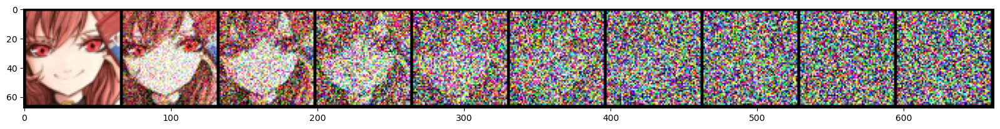

In [90]:
images, _ = next(iter(dataloader))
images = images.to(DEVICE)  # shape: (N, C, H, W)
img = images[0]  # shape: (C, H, W)
img = img.unsqueeze(0)  # shape: (1, C, H, W)
plt.figure(figsize=(20, 20))

num_images = 10
stepsize = int(T/num_images)

noised_imgs = []
for t in range(0, T, stepsize):
    noised_img, epsilon = diffusion.noise_image_at_time_t(img, t)  # shape: (N, C, H, W)
    noised_imgs.append(noised_img)
    
noised_imgs = torch.cat(noised_imgs, dim=0)  # shape: (N, C, H, W)
plot_tensor_images(noised_imgs, nrow=num_images)

## Training

Epoch 201 | step 000 Loss: 0.03541649505496025 
Epoch 201 | step 001 Loss: 0.026051755994558334 
Epoch 201 | step 002 Loss: 0.030889078974723816 
Epoch 201 | step 003 Loss: 0.027605412527918816 
Epoch 201 | step 004 Loss: 0.030872337520122528 
Epoch 201 | step 005 Loss: 0.021101107820868492 
Epoch 201 | step 006 Loss: 0.023470764979720116 
Epoch 201 | step 007 Loss: 0.03559809923171997 
Epoch 201 | step 008 Loss: 0.039235495030879974 
Epoch 201 | step 009 Loss: 0.022020256146788597 
Epoch 201 | step 010 Loss: 0.019388852640986443 
Epoch 201 | step 011 Loss: 0.028561925515532494 
Epoch 201 | step 012 Loss: 0.026241740211844444 
Epoch 201 | step 013 Loss: 0.02603524550795555 
Epoch 201 | step 014 Loss: 0.03245148807764053 
Epoch 201 | step 015 Loss: 0.02997840940952301 
Epoch 201 | step 016 Loss: 0.026307379826903343 
Epoch 201 | step 017 Loss: 0.02169327437877655 
Epoch 201 | step 018 Loss: 0.024328112602233887 
Epoch 201 | step 019 Loss: 0.02855750173330307 
Epoch 201 | step 020 Loss: 

Epoch 202 | step 013 Loss: 0.02266746759414673 
Epoch 202 | step 014 Loss: 0.030760999768972397 
Epoch 202 | step 015 Loss: 0.029688015580177307 
Epoch 202 | step 016 Loss: 0.02086476981639862 
Epoch 202 | step 017 Loss: 0.02534324675798416 
Epoch 202 | step 018 Loss: 0.026333078742027283 
Epoch 202 | step 019 Loss: 0.01907915249466896 
Epoch 202 | step 020 Loss: 0.017687123268842697 
Epoch 202 | step 021 Loss: 0.02027956396341324 
Epoch 202 | step 022 Loss: 0.016934003680944443 
Epoch 202 | step 023 Loss: 0.026801683008670807 
Epoch 202 | step 024 Loss: 0.022933151572942734 
Epoch 202 | step 025 Loss: 0.0165285374969244 
Epoch 202 | step 026 Loss: 0.028473764657974243 
Epoch 202 | step 027 Loss: 0.022460147738456726 
Epoch 202 | step 028 Loss: 0.03681093454360962 
Epoch 202 | step 029 Loss: 0.027015632018446922 
Epoch 202 | step 030 Loss: 0.02144549787044525 
Epoch 202 | step 031 Loss: 0.055417388677597046 
Epoch 202 | step 032 Loss: 0.021915605291724205 
Epoch 202 | step 033 Loss: 0.

Epoch 203 | step 026 Loss: 0.031549692153930664 
Epoch 203 | step 027 Loss: 0.0197785384953022 
Epoch 203 | step 028 Loss: 0.027075793594121933 
Epoch 203 | step 029 Loss: 0.025972552597522736 
Epoch 203 | step 030 Loss: 0.022760702297091484 
Epoch 203 | step 031 Loss: 0.025674786418676376 
Epoch 203 | step 032 Loss: 0.02007756382226944 
Epoch 203 | step 033 Loss: 0.019527290016412735 
Epoch 203 | step 034 Loss: 0.02353057824075222 
Epoch 203 | step 035 Loss: 0.03102213144302368 
Epoch 203 | step 036 Loss: 0.01854936219751835 
Epoch 203 | step 037 Loss: 0.021204378455877304 
Epoch 203 | step 038 Loss: 0.03127042576670647 
Epoch 203 | step 039 Loss: 0.025029074400663376 
Epoch 203 | step 040 Loss: 0.020861482247710228 
Epoch 203 | step 041 Loss: 0.02312927506864071 
Epoch 203 | step 042 Loss: 0.024015992879867554 
Epoch 203 | step 043 Loss: 0.03143906593322754 
Epoch 203 | step 044 Loss: 0.022315852344036102 
Epoch 203 | step 045 Loss: 0.020399563014507294 
Epoch 203 | step 046 Loss: 0.

Epoch 204 | step 039 Loss: 0.021503053605556488 
Epoch 204 | step 040 Loss: 0.024184763431549072 
Epoch 204 | step 041 Loss: 0.02089354209601879 
Epoch 204 | step 042 Loss: 0.025623321533203125 
Epoch 204 | step 043 Loss: 0.030293410643935204 
Epoch 204 | step 044 Loss: 0.026085980236530304 
Epoch 204 | step 045 Loss: 0.018366163596510887 
Epoch 204 | step 046 Loss: 0.025872131809592247 
Epoch 204 | step 047 Loss: 0.019708210602402687 
Epoch 204 | step 048 Loss: 0.02048259787261486 
Epoch 204 | step 049 Loss: 0.024151280522346497 
Epoch 204 | step 050 Loss: 0.02903672121465206 
Epoch 204 | step 051 Loss: 0.02135421894490719 
Epoch 204 | step 052 Loss: 0.021694820374250412 
Epoch 204 | step 053 Loss: 0.025249425321817398 
Epoch 204 | step 054 Loss: 0.026232730597257614 
Epoch 204 | step 055 Loss: 0.017259981483221054 
Epoch 204 | step 056 Loss: 0.021844401955604553 
Epoch 204 | step 057 Loss: 0.02108987793326378 
Epoch 204 | step 058 Loss: 0.026999235153198242 
Epoch 204 | step 059 Loss

999it [00:12, 81.56it/s]


Epoch 205 | step 001 Loss: 0.02201918326318264 
Epoch 205 | step 002 Loss: 0.022767243906855583 
Epoch 205 | step 003 Loss: 0.01886957697570324 
Epoch 205 | step 004 Loss: 0.025386255234479904 
Epoch 205 | step 005 Loss: 0.036061134189367294 
Epoch 205 | step 006 Loss: 0.029855385422706604 
Epoch 205 | step 007 Loss: 0.02461320161819458 
Epoch 205 | step 008 Loss: 0.019398478791117668 
Epoch 205 | step 009 Loss: 0.031196897849440575 
Epoch 205 | step 010 Loss: 0.021626543253660202 
Epoch 205 | step 011 Loss: 0.022312473505735397 
Epoch 205 | step 012 Loss: 0.024066608399152756 
Epoch 205 | step 013 Loss: 0.01923021487891674 
Epoch 205 | step 014 Loss: 0.035051099956035614 
Epoch 205 | step 015 Loss: 0.03162775933742523 
Epoch 205 | step 016 Loss: 0.027591988444328308 
Epoch 205 | step 017 Loss: 0.021259089931845665 
Epoch 205 | step 018 Loss: 0.027361711487174034 
Epoch 205 | step 019 Loss: 0.023367341607809067 
Epoch 205 | step 020 Loss: 0.023565061390399933 
Epoch 205 | step 021 Loss

Epoch 206 | step 014 Loss: 0.02265840768814087 
Epoch 206 | step 015 Loss: 0.033598922193050385 
Epoch 206 | step 016 Loss: 0.021360237151384354 
Epoch 206 | step 017 Loss: 0.027346184477210045 
Epoch 206 | step 018 Loss: 0.023584557697176933 
Epoch 206 | step 019 Loss: 0.019968917593359947 
Epoch 206 | step 020 Loss: 0.024907752871513367 
Epoch 206 | step 021 Loss: 0.025871194899082184 
Epoch 206 | step 022 Loss: 0.019820619374513626 
Epoch 206 | step 023 Loss: 0.028164803981781006 
Epoch 206 | step 024 Loss: 0.03163807839155197 
Epoch 206 | step 025 Loss: 0.02394217997789383 
Epoch 206 | step 026 Loss: 0.023427870124578476 
Epoch 206 | step 027 Loss: 0.02805900387465954 
Epoch 206 | step 028 Loss: 0.02355353534221649 
Epoch 206 | step 029 Loss: 0.024386346340179443 
Epoch 206 | step 030 Loss: 0.01728873699903488 
Epoch 206 | step 031 Loss: 0.015764322131872177 
Epoch 206 | step 032 Loss: 0.01843993365764618 
Epoch 206 | step 033 Loss: 0.026531165465712547 
Epoch 206 | step 034 Loss: 

Epoch 207 | step 027 Loss: 0.02871186099946499 
Epoch 207 | step 028 Loss: 0.022407030686736107 
Epoch 207 | step 029 Loss: 0.021232828497886658 
Epoch 207 | step 030 Loss: 0.040108926594257355 
Epoch 207 | step 031 Loss: 0.022941378876566887 
Epoch 207 | step 032 Loss: 0.02883816324174404 
Epoch 207 | step 033 Loss: 0.02342619001865387 
Epoch 207 | step 034 Loss: 0.03201626241207123 
Epoch 207 | step 035 Loss: 0.021788736805319786 
Epoch 207 | step 036 Loss: 0.02452348731458187 
Epoch 207 | step 037 Loss: 0.020255982875823975 
Epoch 207 | step 038 Loss: 0.028387796133756638 
Epoch 207 | step 039 Loss: 0.02592397853732109 
Epoch 207 | step 040 Loss: 0.03195531293749809 
Epoch 207 | step 041 Loss: 0.02436727285385132 
Epoch 207 | step 042 Loss: 0.029364822432398796 
Epoch 207 | step 043 Loss: 0.025221263989806175 
Epoch 207 | step 044 Loss: 0.024135496467351913 
Epoch 207 | step 045 Loss: 0.021521616727113724 
Epoch 207 | step 046 Loss: 0.028099261224269867 
Epoch 207 | step 047 Loss: 0

Epoch 208 | step 040 Loss: 0.023809708654880524 
Epoch 208 | step 041 Loss: 0.022065788507461548 
Epoch 208 | step 042 Loss: 0.03151176497340202 
Epoch 208 | step 043 Loss: 0.019550634548068047 
Epoch 208 | step 044 Loss: 0.0385114960372448 
Epoch 208 | step 045 Loss: 0.03011855110526085 
Epoch 208 | step 046 Loss: 0.020737186074256897 
Epoch 208 | step 047 Loss: 0.026530390605330467 
Epoch 208 | step 048 Loss: 0.02830687165260315 
Epoch 208 | step 049 Loss: 0.024954792112112045 
Epoch 208 | step 050 Loss: 0.02300875447690487 
Epoch 208 | step 051 Loss: 0.031380828469991684 
Epoch 208 | step 052 Loss: 0.034743212163448334 
Epoch 208 | step 053 Loss: 0.02834627591073513 
Epoch 208 | step 054 Loss: 0.02394765242934227 
Epoch 208 | step 055 Loss: 0.02563588321208954 
Epoch 208 | step 056 Loss: 0.026773428544402122 
Epoch 208 | step 057 Loss: 0.02424180880188942 
Epoch 208 | step 058 Loss: 0.019087186083197594 
Epoch 208 | step 059 Loss: 0.025418519973754883 
Epoch 208 | step 060 Loss: 0.0

Epoch 209 | step 053 Loss: 0.026682626456022263 
Epoch 209 | step 054 Loss: 0.030118277296423912 
Epoch 209 | step 055 Loss: 0.026564892381429672 
Epoch 209 | step 056 Loss: 0.021367868408560753 
Epoch 209 | step 057 Loss: 0.023453470319509506 
Epoch 209 | step 058 Loss: 0.023831553757190704 
Epoch 209 | step 059 Loss: 0.02946442924439907 
Epoch 209 | step 060 Loss: 0.020004549995064735 
Epoch 209 | step 061 Loss: 0.027317194268107414 
Epoch 209 | step 062 Loss: 0.022568613290786743 
Epoch 209 | step 063 Loss: 0.0229671448469162 
Epoch 209 | step 064 Loss: 0.02169216424226761 
Epoch 209 | step 065 Loss: 0.02265910618007183 
Epoch 209 | step 066 Loss: 0.02782149240374565 
Epoch 209 | step 067 Loss: 0.021683182567358017 
Epoch 209 | step 068 Loss: 0.027104109525680542 
Epoch 209 | step 069 Loss: 0.02706480585038662 
Epoch 209 | step 070 Loss: 0.0186906885355711 
Epoch 209 | step 071 Loss: 0.02716003730893135 
Epoch 209 | step 072 Loss: 0.027241703122854233 
Epoch 209 | step 073 Loss: 0.0

999it [00:12, 82.34it/s]


Epoch 210 | step 001 Loss: 0.02881460264325142 
Epoch 210 | step 002 Loss: 0.019775450229644775 
Epoch 210 | step 003 Loss: 0.025549978017807007 
Epoch 210 | step 004 Loss: 0.026636749505996704 
Epoch 210 | step 005 Loss: 0.02549237757921219 
Epoch 210 | step 006 Loss: 0.023996349424123764 
Epoch 210 | step 007 Loss: 0.028592636808753014 
Epoch 210 | step 008 Loss: 0.02136433869600296 
Epoch 210 | step 009 Loss: 0.023211395367980003 
Epoch 210 | step 010 Loss: 0.027598043903708458 
Epoch 210 | step 011 Loss: 0.019722508266568184 
Epoch 210 | step 012 Loss: 0.01755143329501152 
Epoch 210 | step 013 Loss: 0.017417147755622864 
Epoch 210 | step 014 Loss: 0.02896123193204403 
Epoch 210 | step 015 Loss: 0.018103240057826042 
Epoch 210 | step 016 Loss: 0.0281074196100235 
Epoch 210 | step 017 Loss: 0.024970507249236107 
Epoch 210 | step 018 Loss: 0.022898312658071518 
Epoch 210 | step 019 Loss: 0.015377300791442394 
Epoch 210 | step 020 Loss: 0.021689344197511673 
Epoch 210 | step 021 Loss: 

Epoch 211 | step 014 Loss: 0.02278822660446167 
Epoch 211 | step 015 Loss: 0.023099100217223167 
Epoch 211 | step 016 Loss: 0.029992595314979553 
Epoch 211 | step 017 Loss: 0.018632303923368454 
Epoch 211 | step 018 Loss: 0.02049614116549492 
Epoch 211 | step 019 Loss: 0.031438689678907394 
Epoch 211 | step 020 Loss: 0.02738950215280056 
Epoch 211 | step 021 Loss: 0.022859005257487297 
Epoch 211 | step 022 Loss: 0.036631543189287186 
Epoch 211 | step 023 Loss: 0.021562643349170685 
Epoch 211 | step 024 Loss: 0.02402373217046261 
Epoch 211 | step 025 Loss: 0.024456948041915894 
Epoch 211 | step 026 Loss: 0.02523849904537201 
Epoch 211 | step 027 Loss: 0.023734714835882187 
Epoch 211 | step 028 Loss: 0.025621172040700912 
Epoch 211 | step 029 Loss: 0.021668044850230217 
Epoch 211 | step 030 Loss: 0.024979323148727417 
Epoch 211 | step 031 Loss: 0.027828797698020935 
Epoch 211 | step 032 Loss: 0.026427989825606346 
Epoch 211 | step 033 Loss: 0.023697776719927788 
Epoch 211 | step 034 Loss

Epoch 212 | step 027 Loss: 0.02727259323000908 
Epoch 212 | step 028 Loss: 0.016775786876678467 
Epoch 212 | step 029 Loss: 0.016992174088954926 
Epoch 212 | step 030 Loss: 0.0257446076720953 
Epoch 212 | step 031 Loss: 0.028401806950569153 
Epoch 212 | step 032 Loss: 0.017617693170905113 
Epoch 212 | step 033 Loss: 0.0215169545263052 
Epoch 212 | step 034 Loss: 0.024898730218410492 
Epoch 212 | step 035 Loss: 0.01766684278845787 
Epoch 212 | step 036 Loss: 0.022190485149621964 
Epoch 212 | step 037 Loss: 0.02939852699637413 
Epoch 212 | step 038 Loss: 0.024324890226125717 
Epoch 212 | step 039 Loss: 0.022047212347388268 
Epoch 212 | step 040 Loss: 0.02711598202586174 
Epoch 212 | step 041 Loss: 0.02444659173488617 
Epoch 212 | step 042 Loss: 0.029726967215538025 
Epoch 212 | step 043 Loss: 0.028771519660949707 
Epoch 212 | step 044 Loss: 0.021347299218177795 
Epoch 212 | step 045 Loss: 0.027609579265117645 
Epoch 212 | step 046 Loss: 0.022221345454454422 
Epoch 212 | step 047 Loss: 0.

Epoch 213 | step 040 Loss: 0.021198894828557968 
Epoch 213 | step 041 Loss: 0.01817338913679123 
Epoch 213 | step 042 Loss: 0.022470993921160698 
Epoch 213 | step 043 Loss: 0.022206325083971024 
Epoch 213 | step 044 Loss: 0.021707331761717796 
Epoch 213 | step 045 Loss: 0.01972505822777748 
Epoch 213 | step 046 Loss: 0.016974423080682755 
Epoch 213 | step 047 Loss: 0.03234730288386345 
Epoch 213 | step 048 Loss: 0.029795920476317406 
Epoch 213 | step 049 Loss: 0.022319652140140533 
Epoch 213 | step 050 Loss: 0.01825249008834362 
Epoch 213 | step 051 Loss: 0.023230955004692078 
Epoch 213 | step 052 Loss: 0.021435802802443504 
Epoch 213 | step 053 Loss: 0.024236006662249565 
Epoch 213 | step 054 Loss: 0.026261836290359497 
Epoch 213 | step 055 Loss: 0.01586017943918705 
Epoch 213 | step 056 Loss: 0.026157401502132416 
Epoch 213 | step 057 Loss: 0.020312361419200897 
Epoch 213 | step 058 Loss: 0.026132753118872643 
Epoch 213 | step 059 Loss: 0.022197624668478966 
Epoch 213 | step 060 Loss

Epoch 214 | step 053 Loss: 0.027039121836423874 
Epoch 214 | step 054 Loss: 0.024053728207945824 
Epoch 214 | step 055 Loss: 0.025991318747401237 
Epoch 214 | step 056 Loss: 0.02229487895965576 
Epoch 214 | step 057 Loss: 0.025189533829689026 
Epoch 214 | step 058 Loss: 0.026641380041837692 
Epoch 214 | step 059 Loss: 0.022373272106051445 
Epoch 214 | step 060 Loss: 0.020254475995898247 
Epoch 214 | step 061 Loss: 0.026348616927862167 
Epoch 214 | step 062 Loss: 0.028688553720712662 
Epoch 214 | step 063 Loss: 0.021985765546560287 
Epoch 214 | step 064 Loss: 0.022322548553347588 
Epoch 214 | step 065 Loss: 0.024730142205953598 
Epoch 214 | step 066 Loss: 0.021044371649622917 
Epoch 214 | step 067 Loss: 0.03067888133227825 
Epoch 214 | step 068 Loss: 0.02842380665242672 
Epoch 214 | step 069 Loss: 0.02659033238887787 
Epoch 214 | step 070 Loss: 0.026732638478279114 
Epoch 214 | step 071 Loss: 0.026217523962259293 
Epoch 214 | step 072 Loss: 0.018927358090877533 
Epoch 214 | step 073 Los

999it [00:12, 82.50it/s]


Epoch 215 | step 001 Loss: 0.02002168446779251 
Epoch 215 | step 002 Loss: 0.023884987458586693 
Epoch 215 | step 003 Loss: 0.0329979732632637 
Epoch 215 | step 004 Loss: 0.021303389221429825 
Epoch 215 | step 005 Loss: 0.026792924851179123 
Epoch 215 | step 006 Loss: 0.02809179574251175 
Epoch 215 | step 007 Loss: 0.026833539828658104 
Epoch 215 | step 008 Loss: 0.022587552666664124 
Epoch 215 | step 009 Loss: 0.022674642503261566 
Epoch 215 | step 010 Loss: 0.030120348557829857 
Epoch 215 | step 011 Loss: 0.030726589262485504 
Epoch 215 | step 012 Loss: 0.024887850508093834 
Epoch 215 | step 013 Loss: 0.019348269328475 
Epoch 215 | step 014 Loss: 0.02658252790570259 
Epoch 215 | step 015 Loss: 0.016281740739941597 
Epoch 215 | step 016 Loss: 0.027457088232040405 
Epoch 215 | step 017 Loss: 0.017899826169013977 
Epoch 215 | step 018 Loss: 0.024818167090415955 
Epoch 215 | step 019 Loss: 0.028284071013331413 
Epoch 215 | step 020 Loss: 0.021253112703561783 
Epoch 215 | step 021 Loss: 0

Epoch 216 | step 014 Loss: 0.019584208726882935 
Epoch 216 | step 015 Loss: 0.025571957230567932 
Epoch 216 | step 016 Loss: 0.03448890894651413 
Epoch 216 | step 017 Loss: 0.02366313710808754 
Epoch 216 | step 018 Loss: 0.02603071928024292 
Epoch 216 | step 019 Loss: 0.019532913342118263 
Epoch 216 | step 020 Loss: 0.01857941597700119 
Epoch 216 | step 021 Loss: 0.031121497973799706 
Epoch 216 | step 022 Loss: 0.024229303002357483 
Epoch 216 | step 023 Loss: 0.027630891650915146 
Epoch 216 | step 024 Loss: 0.021894296631217003 
Epoch 216 | step 025 Loss: 0.016870049759745598 
Epoch 216 | step 026 Loss: 0.021336160600185394 
Epoch 216 | step 027 Loss: 0.021949071437120438 
Epoch 216 | step 028 Loss: 0.022706538438796997 
Epoch 216 | step 029 Loss: 0.025373240932822227 
Epoch 216 | step 030 Loss: 0.014380954205989838 
Epoch 216 | step 031 Loss: 0.022478608414530754 
Epoch 216 | step 032 Loss: 0.0181527528911829 
Epoch 216 | step 033 Loss: 0.019365206360816956 
Epoch 216 | step 034 Loss:

Epoch 217 | step 027 Loss: 0.026765912771224976 
Epoch 217 | step 028 Loss: 0.020072828978300095 
Epoch 217 | step 029 Loss: 0.02218138799071312 
Epoch 217 | step 030 Loss: 0.02395530603826046 
Epoch 217 | step 031 Loss: 0.02129102312028408 
Epoch 217 | step 032 Loss: 0.020922450348734856 
Epoch 217 | step 033 Loss: 0.023131396621465683 
Epoch 217 | step 034 Loss: 0.019237546250224113 
Epoch 217 | step 035 Loss: 0.03232660889625549 
Epoch 217 | step 036 Loss: 0.02094566822052002 
Epoch 217 | step 037 Loss: 0.03150820732116699 
Epoch 217 | step 038 Loss: 0.024682998657226562 
Epoch 217 | step 039 Loss: 0.01865239255130291 
Epoch 217 | step 040 Loss: 0.017789622768759727 
Epoch 217 | step 041 Loss: 0.020938917994499207 
Epoch 217 | step 042 Loss: 0.02118759974837303 
Epoch 217 | step 043 Loss: 0.018788399174809456 
Epoch 217 | step 044 Loss: 0.017318174242973328 
Epoch 217 | step 045 Loss: 0.030355118215084076 
Epoch 217 | step 046 Loss: 0.02738894149661064 
Epoch 217 | step 047 Loss: 0.

Epoch 218 | step 040 Loss: 0.022082235664129257 
Epoch 218 | step 041 Loss: 0.022133909165859222 
Epoch 218 | step 042 Loss: 0.025867922231554985 
Epoch 218 | step 043 Loss: 0.025782858952879906 
Epoch 218 | step 044 Loss: 0.02184130623936653 
Epoch 218 | step 045 Loss: 0.02339579164981842 
Epoch 218 | step 046 Loss: 0.027631524950265884 
Epoch 218 | step 047 Loss: 0.024466922506690025 
Epoch 218 | step 048 Loss: 0.021062936633825302 
Epoch 218 | step 049 Loss: 0.028687193989753723 
Epoch 218 | step 050 Loss: 0.0204548891633749 
Epoch 218 | step 051 Loss: 0.02256881259381771 
Epoch 218 | step 052 Loss: 0.023791488260030746 
Epoch 218 | step 053 Loss: 0.02554807811975479 
Epoch 218 | step 054 Loss: 0.028736189007759094 
Epoch 218 | step 055 Loss: 0.028324726969003677 
Epoch 218 | step 056 Loss: 0.02671848237514496 
Epoch 218 | step 057 Loss: 0.025508224964141846 
Epoch 218 | step 058 Loss: 0.021100882440805435 
Epoch 218 | step 059 Loss: 0.020265815779566765 
Epoch 218 | step 060 Loss: 

Epoch 219 | step 053 Loss: 0.022286463528871536 
Epoch 219 | step 054 Loss: 0.016870735213160515 
Epoch 219 | step 055 Loss: 0.026045387610793114 
Epoch 219 | step 056 Loss: 0.0204655472189188 
Epoch 219 | step 057 Loss: 0.02953912876546383 
Epoch 219 | step 058 Loss: 0.02433059737086296 
Epoch 219 | step 059 Loss: 0.02839241735637188 
Epoch 219 | step 060 Loss: 0.01973687671124935 
Epoch 219 | step 061 Loss: 0.02146283909678459 
Epoch 219 | step 062 Loss: 0.022847983986139297 
Epoch 219 | step 063 Loss: 0.017598941922187805 
Epoch 219 | step 064 Loss: 0.022087184712290764 
Epoch 219 | step 065 Loss: 0.02333029732108116 
Epoch 219 | step 066 Loss: 0.02701021544635296 
Epoch 219 | step 067 Loss: 0.028030455112457275 
Epoch 219 | step 068 Loss: 0.02458476647734642 
Epoch 219 | step 069 Loss: 0.022487103939056396 
Epoch 219 | step 070 Loss: 0.02112504467368126 
Epoch 219 | step 071 Loss: 0.025777136906981468 
Epoch 219 | step 072 Loss: 0.017634257674217224 
Epoch 219 | step 073 Loss: 0.02

999it [00:12, 82.60it/s]


Epoch 220 | step 001 Loss: 0.019533095881342888 
Epoch 220 | step 002 Loss: 0.019212964922189713 
Epoch 220 | step 003 Loss: 0.026813268661499023 
Epoch 220 | step 004 Loss: 0.02649112045764923 
Epoch 220 | step 005 Loss: 0.02844109758734703 
Epoch 220 | step 006 Loss: 0.02158951386809349 
Epoch 220 | step 007 Loss: 0.018068714067339897 
Epoch 220 | step 008 Loss: 0.03117062710225582 
Epoch 220 | step 009 Loss: 0.018327586352825165 
Epoch 220 | step 010 Loss: 0.022433942183852196 
Epoch 220 | step 011 Loss: 0.0193992480635643 
Epoch 220 | step 012 Loss: 0.02303001657128334 
Epoch 220 | step 013 Loss: 0.02825707197189331 
Epoch 220 | step 014 Loss: 0.02665954828262329 
Epoch 220 | step 015 Loss: 0.027926698327064514 
Epoch 220 | step 016 Loss: 0.020949309691786766 
Epoch 220 | step 017 Loss: 0.025568893179297447 
Epoch 220 | step 018 Loss: 0.027338244020938873 
Epoch 220 | step 019 Loss: 0.02514452487230301 
Epoch 220 | step 020 Loss: 0.025477923452854156 
Epoch 220 | step 021 Loss: 0.0

Epoch 221 | step 014 Loss: 0.02508626878261566 
Epoch 221 | step 015 Loss: 0.020983487367630005 
Epoch 221 | step 016 Loss: 0.024274330586194992 
Epoch 221 | step 017 Loss: 0.02647099457681179 
Epoch 221 | step 018 Loss: 0.02322484366595745 
Epoch 221 | step 019 Loss: 0.01908939518034458 
Epoch 221 | step 020 Loss: 0.027567189186811447 
Epoch 221 | step 021 Loss: 0.03185644373297691 
Epoch 221 | step 022 Loss: 0.018728308379650116 
Epoch 221 | step 023 Loss: 0.02645290456712246 
Epoch 221 | step 024 Loss: 0.024425670504570007 
Epoch 221 | step 025 Loss: 0.031485967338085175 
Epoch 221 | step 026 Loss: 0.021556969732046127 
Epoch 221 | step 027 Loss: 0.01829058676958084 
Epoch 221 | step 028 Loss: 0.02014249563217163 
Epoch 221 | step 029 Loss: 0.02029392495751381 
Epoch 221 | step 030 Loss: 0.024134669452905655 
Epoch 221 | step 031 Loss: 0.026622727513313293 
Epoch 221 | step 032 Loss: 0.023467374965548515 
Epoch 221 | step 033 Loss: 0.027820684015750885 
Epoch 221 | step 034 Loss: 0.

Epoch 222 | step 027 Loss: 0.029472406953573227 
Epoch 222 | step 028 Loss: 0.022010188549757004 
Epoch 222 | step 029 Loss: 0.022873973473906517 
Epoch 222 | step 030 Loss: 0.026673203334212303 
Epoch 222 | step 031 Loss: 0.016607897356152534 
Epoch 222 | step 032 Loss: 0.022303078323602676 
Epoch 222 | step 033 Loss: 0.021568840369582176 
Epoch 222 | step 034 Loss: 0.025760626420378685 
Epoch 222 | step 035 Loss: 0.02082247845828533 
Epoch 222 | step 036 Loss: 0.025692349299788475 
Epoch 222 | step 037 Loss: 0.022840134799480438 
Epoch 222 | step 038 Loss: 0.02571389637887478 
Epoch 222 | step 039 Loss: 0.032951682806015015 
Epoch 222 | step 040 Loss: 0.021090595051646233 
Epoch 222 | step 041 Loss: 0.025141676887869835 
Epoch 222 | step 042 Loss: 0.027158334851264954 
Epoch 222 | step 043 Loss: 0.02664943039417267 
Epoch 222 | step 044 Loss: 0.021952299401164055 
Epoch 222 | step 045 Loss: 0.02245957776904106 
Epoch 222 | step 046 Loss: 0.028224702924489975 
Epoch 222 | step 047 Los

Epoch 223 | step 040 Loss: 0.018421541899442673 
Epoch 223 | step 041 Loss: 0.029420536011457443 
Epoch 223 | step 042 Loss: 0.025392703711986542 
Epoch 223 | step 043 Loss: 0.02256127819418907 
Epoch 223 | step 044 Loss: 0.03205234557390213 
Epoch 223 | step 045 Loss: 0.02452935092151165 
Epoch 223 | step 046 Loss: 0.018997710198163986 
Epoch 223 | step 047 Loss: 0.020022381097078323 
Epoch 223 | step 048 Loss: 0.026322683319449425 
Epoch 223 | step 049 Loss: 0.02596830390393734 
Epoch 223 | step 050 Loss: 0.018899869173765182 
Epoch 223 | step 051 Loss: 0.03588218241930008 
Epoch 223 | step 052 Loss: 0.02441849187016487 
Epoch 223 | step 053 Loss: 0.028630603104829788 
Epoch 223 | step 054 Loss: 0.017536474391818047 
Epoch 223 | step 055 Loss: 0.0228411965072155 
Epoch 223 | step 056 Loss: 0.02905510738492012 
Epoch 223 | step 057 Loss: 0.018259942531585693 
Epoch 223 | step 058 Loss: 0.024348098784685135 
Epoch 223 | step 059 Loss: 0.031037544831633568 
Epoch 223 | step 060 Loss: 0.

Epoch 224 | step 053 Loss: 0.02677489072084427 
Epoch 224 | step 054 Loss: 0.0245355274528265 
Epoch 224 | step 055 Loss: 0.02989739179611206 
Epoch 224 | step 056 Loss: 0.020609542727470398 
Epoch 224 | step 057 Loss: 0.025476910173892975 
Epoch 224 | step 058 Loss: 0.02662072889506817 
Epoch 224 | step 059 Loss: 0.024270758032798767 
Epoch 224 | step 060 Loss: 0.01733441650867462 
Epoch 224 | step 061 Loss: 0.02368347905576229 
Epoch 224 | step 062 Loss: 0.024080729112029076 
Epoch 224 | step 063 Loss: 0.019513431936502457 
Epoch 224 | step 064 Loss: 0.028386160731315613 
Epoch 224 | step 065 Loss: 0.02745307795703411 
Epoch 224 | step 066 Loss: 0.025640301406383514 
Epoch 224 | step 067 Loss: 0.017858164384961128 
Epoch 224 | step 068 Loss: 0.025884829461574554 
Epoch 224 | step 069 Loss: 0.018194517120718956 
Epoch 224 | step 070 Loss: 0.025714542716741562 
Epoch 224 | step 071 Loss: 0.02872970700263977 
Epoch 224 | step 072 Loss: 0.022161483764648438 
Epoch 224 | step 073 Loss: 0.

999it [00:12, 82.90it/s]


Epoch 225 | step 001 Loss: 0.023623596876859665 
Epoch 225 | step 002 Loss: 0.023717893287539482 
Epoch 225 | step 003 Loss: 0.026206064969301224 
Epoch 225 | step 004 Loss: 0.017449965700507164 
Epoch 225 | step 005 Loss: 0.022507797926664352 
Epoch 225 | step 006 Loss: 0.024868439882993698 
Epoch 225 | step 007 Loss: 0.020848466083407402 
Epoch 225 | step 008 Loss: 0.019337980076670647 
Epoch 225 | step 009 Loss: 0.018811944872140884 
Epoch 225 | step 010 Loss: 0.024573348462581635 
Epoch 225 | step 011 Loss: 0.02829226478934288 
Epoch 225 | step 012 Loss: 0.02556498907506466 
Epoch 225 | step 013 Loss: 0.024152006953954697 
Epoch 225 | step 014 Loss: 0.022204101085662842 
Epoch 225 | step 015 Loss: 0.02898164466023445 
Epoch 225 | step 016 Loss: 0.03306422382593155 
Epoch 225 | step 017 Loss: 0.019064102321863174 
Epoch 225 | step 018 Loss: 0.030025068670511246 
Epoch 225 | step 019 Loss: 0.026758771389722824 
Epoch 225 | step 020 Loss: 0.023269034922122955 
Epoch 225 | step 021 Los

Epoch 226 | step 014 Loss: 0.028811579570174217 
Epoch 226 | step 015 Loss: 0.030455056577920914 
Epoch 226 | step 016 Loss: 0.018980352208018303 
Epoch 226 | step 017 Loss: 0.016811219975352287 
Epoch 226 | step 018 Loss: 0.03287934884428978 
Epoch 226 | step 019 Loss: 0.018884599208831787 
Epoch 226 | step 020 Loss: 0.03594706952571869 
Epoch 226 | step 021 Loss: 0.028345149010419846 
Epoch 226 | step 022 Loss: 0.025852877646684647 
Epoch 226 | step 023 Loss: 0.02332363650202751 
Epoch 226 | step 024 Loss: 0.018589286133646965 
Epoch 226 | step 025 Loss: 0.02453165128827095 
Epoch 226 | step 026 Loss: 0.024968808516860008 
Epoch 226 | step 027 Loss: 0.03362896665930748 
Epoch 226 | step 028 Loss: 0.0254894457757473 
Epoch 226 | step 029 Loss: 0.016085924580693245 
Epoch 226 | step 030 Loss: 0.016130564734339714 
Epoch 226 | step 031 Loss: 0.02089669369161129 
Epoch 226 | step 032 Loss: 0.020610980689525604 
Epoch 226 | step 033 Loss: 0.02812862955033779 
Epoch 226 | step 034 Loss: 0.

Epoch 227 | step 027 Loss: 0.0227467343211174 
Epoch 227 | step 028 Loss: 0.028539225459098816 
Epoch 227 | step 029 Loss: 0.02048705890774727 
Epoch 227 | step 030 Loss: 0.028824985027313232 
Epoch 227 | step 031 Loss: 0.019650466740131378 
Epoch 227 | step 032 Loss: 0.018173394724726677 
Epoch 227 | step 033 Loss: 0.026308860629796982 
Epoch 227 | step 034 Loss: 0.026085559278726578 
Epoch 227 | step 035 Loss: 0.03094988688826561 
Epoch 227 | step 036 Loss: 0.025654669851064682 
Epoch 227 | step 037 Loss: 0.0216669999063015 
Epoch 227 | step 038 Loss: 0.024149924516677856 
Epoch 227 | step 039 Loss: 0.026567956432700157 
Epoch 227 | step 040 Loss: 0.024098029360175133 
Epoch 227 | step 041 Loss: 0.020745985209941864 
Epoch 227 | step 042 Loss: 0.02053866535425186 
Epoch 227 | step 043 Loss: 0.02651321515440941 
Epoch 227 | step 044 Loss: 0.029006993398070335 
Epoch 227 | step 045 Loss: 0.024588365107774734 
Epoch 227 | step 046 Loss: 0.023950904607772827 
Epoch 227 | step 047 Loss: 0

Epoch 228 | step 040 Loss: 0.026822000741958618 
Epoch 228 | step 041 Loss: 0.020572923123836517 
Epoch 228 | step 042 Loss: 0.03263735771179199 
Epoch 228 | step 043 Loss: 0.0243823304772377 
Epoch 228 | step 044 Loss: 0.02358921617269516 
Epoch 228 | step 045 Loss: 0.025455813854932785 
Epoch 228 | step 046 Loss: 0.02419976145029068 
Epoch 228 | step 047 Loss: 0.01664934679865837 
Epoch 228 | step 048 Loss: 0.027239181101322174 
Epoch 228 | step 049 Loss: 0.02347462624311447 
Epoch 228 | step 050 Loss: 0.026543378829956055 
Epoch 228 | step 051 Loss: 0.02732101082801819 
Epoch 228 | step 052 Loss: 0.021311020478606224 
Epoch 228 | step 053 Loss: 0.02447373978793621 
Epoch 228 | step 054 Loss: 0.030035650357604027 
Epoch 228 | step 055 Loss: 0.023280581459403038 
Epoch 228 | step 056 Loss: 0.018276065587997437 
Epoch 228 | step 057 Loss: 0.029094835743308067 
Epoch 228 | step 058 Loss: 0.030103012919425964 
Epoch 228 | step 059 Loss: 0.025391345843672752 
Epoch 228 | step 060 Loss: 0.

Epoch 229 | step 053 Loss: 0.030329879373311996 
Epoch 229 | step 054 Loss: 0.028829425573349 
Epoch 229 | step 055 Loss: 0.025644904002547264 
Epoch 229 | step 056 Loss: 0.02108088880777359 
Epoch 229 | step 057 Loss: 0.02829173021018505 
Epoch 229 | step 058 Loss: 0.02261226996779442 
Epoch 229 | step 059 Loss: 0.02865762636065483 
Epoch 229 | step 060 Loss: 0.024780265986919403 
Epoch 229 | step 061 Loss: 0.021109770983457565 
Epoch 229 | step 062 Loss: 0.02988303266465664 
Epoch 229 | step 063 Loss: 0.03120363876223564 
Epoch 229 | step 064 Loss: 0.0380152091383934 
Epoch 229 | step 065 Loss: 0.028719117864966393 
Epoch 229 | step 066 Loss: 0.028186386451125145 
Epoch 229 | step 067 Loss: 0.03053734265267849 
Epoch 229 | step 068 Loss: 0.022105446085333824 
Epoch 229 | step 069 Loss: 0.02325068973004818 
Epoch 229 | step 070 Loss: 0.028252627700567245 
Epoch 229 | step 071 Loss: 0.02411084994673729 
Epoch 229 | step 072 Loss: 0.020485281944274902 
Epoch 229 | step 073 Loss: 0.02883

999it [00:12, 82.89it/s]


Epoch 230 | step 001 Loss: 0.01968814991414547 
Epoch 230 | step 002 Loss: 0.019656874239444733 
Epoch 230 | step 003 Loss: 0.022107362747192383 
Epoch 230 | step 004 Loss: 0.027407687157392502 
Epoch 230 | step 005 Loss: 0.024839114397764206 
Epoch 230 | step 006 Loss: 0.03217396140098572 
Epoch 230 | step 007 Loss: 0.023379137739539146 
Epoch 230 | step 008 Loss: 0.018973520025610924 
Epoch 230 | step 009 Loss: 0.020061446353793144 
Epoch 230 | step 010 Loss: 0.01789425127208233 
Epoch 230 | step 011 Loss: 0.023682303726673126 
Epoch 230 | step 012 Loss: 0.02827957272529602 
Epoch 230 | step 013 Loss: 0.024714164435863495 
Epoch 230 | step 014 Loss: 0.022192128002643585 
Epoch 230 | step 015 Loss: 0.021496860310435295 
Epoch 230 | step 016 Loss: 0.03136055916547775 
Epoch 230 | step 017 Loss: 0.022040335461497307 
Epoch 230 | step 018 Loss: 0.020592089742422104 
Epoch 230 | step 019 Loss: 0.019925687462091446 
Epoch 230 | step 020 Loss: 0.02399563416838646 
Epoch 230 | step 021 Loss:

Epoch 231 | step 014 Loss: 0.01858859695494175 
Epoch 231 | step 015 Loss: 0.022922394797205925 
Epoch 231 | step 016 Loss: 0.02411927655339241 
Epoch 231 | step 017 Loss: 0.02442634105682373 
Epoch 231 | step 018 Loss: 0.029397284612059593 
Epoch 231 | step 019 Loss: 0.023121722042560577 
Epoch 231 | step 020 Loss: 0.018522771075367928 
Epoch 231 | step 021 Loss: 0.024399936199188232 
Epoch 231 | step 022 Loss: 0.023325204849243164 
Epoch 231 | step 023 Loss: 0.023473918437957764 
Epoch 231 | step 024 Loss: 0.02886149287223816 
Epoch 231 | step 025 Loss: 0.020333867520093918 
Epoch 231 | step 026 Loss: 0.023590873926877975 
Epoch 231 | step 027 Loss: 0.02764957956969738 
Epoch 231 | step 028 Loss: 0.02416762337088585 
Epoch 231 | step 029 Loss: 0.02495613321661949 
Epoch 231 | step 030 Loss: 0.028535036370158195 
Epoch 231 | step 031 Loss: 0.02292438969016075 
Epoch 231 | step 032 Loss: 0.027752963826060295 
Epoch 231 | step 033 Loss: 0.02368195354938507 
Epoch 231 | step 034 Loss: 0.

Epoch 232 | step 027 Loss: 0.016555164009332657 
Epoch 232 | step 028 Loss: 0.021564779803156853 
Epoch 232 | step 029 Loss: 0.019239280372858047 
Epoch 232 | step 030 Loss: 0.02616402506828308 
Epoch 232 | step 031 Loss: 0.02942650020122528 
Epoch 232 | step 032 Loss: 0.02022223360836506 
Epoch 232 | step 033 Loss: 0.02522299811244011 
Epoch 232 | step 034 Loss: 0.025171387940645218 
Epoch 232 | step 035 Loss: 0.027062617242336273 
Epoch 232 | step 036 Loss: 0.02219124138355255 
Epoch 232 | step 037 Loss: 0.023320555686950684 
Epoch 232 | step 038 Loss: 0.015158450230956078 
Epoch 232 | step 039 Loss: 0.030300026759505272 
Epoch 232 | step 040 Loss: 0.023906942456960678 
Epoch 232 | step 041 Loss: 0.026299765333533287 
Epoch 232 | step 042 Loss: 0.02235950157046318 
Epoch 232 | step 043 Loss: 0.02196337841451168 
Epoch 232 | step 044 Loss: 0.024469338357448578 
Epoch 232 | step 045 Loss: 0.021569374948740005 
Epoch 232 | step 046 Loss: 0.027297113090753555 
Epoch 232 | step 047 Loss: 

Epoch 233 | step 040 Loss: 0.02245750091969967 
Epoch 233 | step 041 Loss: 0.021411191672086716 
Epoch 233 | step 042 Loss: 0.027623599395155907 
Epoch 233 | step 043 Loss: 0.018704181537032127 
Epoch 233 | step 044 Loss: 0.0279536172747612 
Epoch 233 | step 045 Loss: 0.0181829035282135 
Epoch 233 | step 046 Loss: 0.021336153149604797 
Epoch 233 | step 047 Loss: 0.014868284575641155 
Epoch 233 | step 048 Loss: 0.028141822665929794 
Epoch 233 | step 049 Loss: 0.022861003875732422 
Epoch 233 | step 050 Loss: 0.023501083254814148 
Epoch 233 | step 051 Loss: 0.024818336591124535 
Epoch 233 | step 052 Loss: 0.017447579652071 
Epoch 233 | step 053 Loss: 0.03207296133041382 
Epoch 233 | step 054 Loss: 0.019581280648708344 
Epoch 233 | step 055 Loss: 0.025383224710822105 
Epoch 233 | step 056 Loss: 0.02634459361433983 
Epoch 233 | step 057 Loss: 0.026294467970728874 
Epoch 233 | step 058 Loss: 0.03124900721013546 
Epoch 233 | step 059 Loss: 0.020115487277507782 
Epoch 233 | step 060 Loss: 0.02

Epoch 234 | step 053 Loss: 0.02391330525279045 
Epoch 234 | step 054 Loss: 0.020011723041534424 
Epoch 234 | step 055 Loss: 0.023278608918190002 
Epoch 234 | step 056 Loss: 0.021652594208717346 
Epoch 234 | step 057 Loss: 0.024696767330169678 
Epoch 234 | step 058 Loss: 0.024733100086450577 
Epoch 234 | step 059 Loss: 0.02911151573061943 
Epoch 234 | step 060 Loss: 0.02256050519645214 
Epoch 234 | step 061 Loss: 0.02325519733130932 
Epoch 234 | step 062 Loss: 0.019566835835576057 
Epoch 234 | step 063 Loss: 0.018134314566850662 
Epoch 234 | step 064 Loss: 0.01776808686554432 
Epoch 234 | step 065 Loss: 0.01840502768754959 
Epoch 234 | step 066 Loss: 0.02930055931210518 
Epoch 234 | step 067 Loss: 0.018217746168375015 
Epoch 234 | step 068 Loss: 0.022216713055968285 
Epoch 234 | step 069 Loss: 0.025015350431203842 
Epoch 234 | step 070 Loss: 0.020274315029382706 
Epoch 234 | step 071 Loss: 0.025057431310415268 
Epoch 234 | step 072 Loss: 0.029577946290373802 
Epoch 234 | step 073 Loss: 

999it [00:12, 82.70it/s]


Epoch 235 | step 001 Loss: 0.02738150581717491 
Epoch 235 | step 002 Loss: 0.023716021329164505 
Epoch 235 | step 003 Loss: 0.023048244416713715 
Epoch 235 | step 004 Loss: 0.016582664102315903 
Epoch 235 | step 005 Loss: 0.02470282092690468 
Epoch 235 | step 006 Loss: 0.016150878742337227 
Epoch 235 | step 007 Loss: 0.0214228518307209 
Epoch 235 | step 008 Loss: 0.021557411178946495 
Epoch 235 | step 009 Loss: 0.03021213971078396 
Epoch 235 | step 010 Loss: 0.02516922727227211 
Epoch 235 | step 011 Loss: 0.02627807855606079 
Epoch 235 | step 012 Loss: 0.02835204266011715 
Epoch 235 | step 013 Loss: 0.0342133603990078 
Epoch 235 | step 014 Loss: 0.018852487206459045 
Epoch 235 | step 015 Loss: 0.021688995882868767 
Epoch 235 | step 016 Loss: 0.01933397352695465 
Epoch 235 | step 017 Loss: 0.024618126451969147 
Epoch 235 | step 018 Loss: 0.02913554012775421 
Epoch 235 | step 019 Loss: 0.02288033440709114 
Epoch 235 | step 020 Loss: 0.019021248444914818 
Epoch 235 | step 021 Loss: 0.0316

Epoch 236 | step 014 Loss: 0.028870170935988426 
Epoch 236 | step 015 Loss: 0.028114840388298035 
Epoch 236 | step 016 Loss: 0.01800839975476265 
Epoch 236 | step 017 Loss: 0.018208254128694534 
Epoch 236 | step 018 Loss: 0.026768069714307785 
Epoch 236 | step 019 Loss: 0.021000351756811142 
Epoch 236 | step 020 Loss: 0.025300292298197746 
Epoch 236 | step 021 Loss: 0.02510874532163143 
Epoch 236 | step 022 Loss: 0.020786911249160767 
Epoch 236 | step 023 Loss: 0.024604713544249535 
Epoch 236 | step 024 Loss: 0.027184491977095604 
Epoch 236 | step 025 Loss: 0.025993777438998222 
Epoch 236 | step 026 Loss: 0.026225224137306213 
Epoch 236 | step 027 Loss: 0.020966555923223495 
Epoch 236 | step 028 Loss: 0.021727360785007477 
Epoch 236 | step 029 Loss: 0.02149890922009945 
Epoch 236 | step 030 Loss: 0.021628644317388535 
Epoch 236 | step 031 Loss: 0.03484588861465454 
Epoch 236 | step 032 Loss: 0.024521231651306152 
Epoch 236 | step 033 Loss: 0.017020193859934807 
Epoch 236 | step 034 Los

Epoch 237 | step 027 Loss: 0.020386118441820145 
Epoch 237 | step 028 Loss: 0.027344796806573868 
Epoch 237 | step 029 Loss: 0.020076265558600426 
Epoch 237 | step 030 Loss: 0.024222975596785545 
Epoch 237 | step 031 Loss: 0.015843499451875687 
Epoch 237 | step 032 Loss: 0.016607195138931274 
Epoch 237 | step 033 Loss: 0.022363867610692978 
Epoch 237 | step 034 Loss: 0.01915155164897442 
Epoch 237 | step 035 Loss: 0.024862436577677727 
Epoch 237 | step 036 Loss: 0.020068444311618805 
Epoch 237 | step 037 Loss: 0.021751221269369125 
Epoch 237 | step 038 Loss: 0.024057850241661072 
Epoch 237 | step 039 Loss: 0.021911028772592545 
Epoch 237 | step 040 Loss: 0.024252206087112427 
Epoch 237 | step 041 Loss: 0.02546020969748497 
Epoch 237 | step 042 Loss: 0.021228473633527756 
Epoch 237 | step 043 Loss: 0.02771749161183834 
Epoch 237 | step 044 Loss: 0.029671717435121536 
Epoch 237 | step 045 Loss: 0.028308680281043053 
Epoch 237 | step 046 Loss: 0.027455661445856094 
Epoch 237 | step 047 Lo

Epoch 238 | step 040 Loss: 0.017791956663131714 
Epoch 238 | step 041 Loss: 0.024656780064105988 
Epoch 238 | step 042 Loss: 0.025314610451459885 
Epoch 238 | step 043 Loss: 0.026219910010695457 
Epoch 238 | step 044 Loss: 0.017903896048665047 
Epoch 238 | step 045 Loss: 0.019560743123292923 
Epoch 238 | step 046 Loss: 0.02301916293799877 
Epoch 238 | step 047 Loss: 0.018909860402345657 
Epoch 238 | step 048 Loss: 0.029754672199487686 
Epoch 238 | step 049 Loss: 0.017253071069717407 
Epoch 238 | step 050 Loss: 0.02370063215494156 
Epoch 238 | step 051 Loss: 0.028002772480249405 
Epoch 238 | step 052 Loss: 0.027449574321508408 
Epoch 238 | step 053 Loss: 0.01989416405558586 
Epoch 238 | step 054 Loss: 0.02013733796775341 
Epoch 238 | step 055 Loss: 0.02174532413482666 
Epoch 238 | step 056 Loss: 0.03264394402503967 
Epoch 238 | step 057 Loss: 0.0268433578312397 
Epoch 238 | step 058 Loss: 0.028594044968485832 
Epoch 238 | step 059 Loss: 0.02251286804676056 
Epoch 238 | step 060 Loss: 0.

Epoch 239 | step 053 Loss: 0.02531694993376732 
Epoch 239 | step 054 Loss: 0.028335440903902054 
Epoch 239 | step 055 Loss: 0.01898999512195587 
Epoch 239 | step 056 Loss: 0.02539857104420662 
Epoch 239 | step 057 Loss: 0.02133757434785366 
Epoch 239 | step 058 Loss: 0.02252371422946453 
Epoch 239 | step 059 Loss: 0.017717093229293823 
Epoch 239 | step 060 Loss: 0.025739356875419617 
Epoch 239 | step 061 Loss: 0.01826273649930954 
Epoch 239 | step 062 Loss: 0.026878362521529198 
Epoch 239 | step 063 Loss: 0.03191346675157547 
Epoch 239 | step 064 Loss: 0.032821979373693466 
Epoch 239 | step 065 Loss: 0.022768203169107437 
Epoch 239 | step 066 Loss: 0.01979273371398449 
Epoch 239 | step 067 Loss: 0.015504850074648857 
Epoch 239 | step 068 Loss: 0.026606200262904167 
Epoch 239 | step 069 Loss: 0.034136172384023666 
Epoch 239 | step 070 Loss: 0.02602635696530342 
Epoch 239 | step 071 Loss: 0.02008894458413124 
Epoch 239 | step 072 Loss: 0.02720978856086731 
Epoch 239 | step 073 Loss: 0.02

999it [00:12, 82.50it/s]


Epoch 240 | step 001 Loss: 0.024265235289931297 
Epoch 240 | step 002 Loss: 0.021276261657476425 
Epoch 240 | step 003 Loss: 0.02367406152188778 
Epoch 240 | step 004 Loss: 0.02451525256037712 
Epoch 240 | step 005 Loss: 0.017865650355815887 
Epoch 240 | step 006 Loss: 0.03131353110074997 
Epoch 240 | step 007 Loss: 0.02289947122335434 
Epoch 240 | step 008 Loss: 0.031893014907836914 
Epoch 240 | step 009 Loss: 0.019884835928678513 
Epoch 240 | step 010 Loss: 0.020318498834967613 
Epoch 240 | step 011 Loss: 0.01725141704082489 
Epoch 240 | step 012 Loss: 0.022239256650209427 
Epoch 240 | step 013 Loss: 0.022411294281482697 
Epoch 240 | step 014 Loss: 0.02350740134716034 
Epoch 240 | step 015 Loss: 0.02199523150920868 
Epoch 240 | step 016 Loss: 0.020226657390594482 
Epoch 240 | step 017 Loss: 0.021755650639533997 
Epoch 240 | step 018 Loss: 0.02837119996547699 
Epoch 240 | step 019 Loss: 0.01854383386671543 
Epoch 240 | step 020 Loss: 0.01628268137574196 
Epoch 240 | step 021 Loss: 0.0

Epoch 241 | step 014 Loss: 0.022093109786510468 
Epoch 241 | step 015 Loss: 0.025786368176341057 
Epoch 241 | step 016 Loss: 0.02501497231423855 
Epoch 241 | step 017 Loss: 0.024193041026592255 
Epoch 241 | step 018 Loss: 0.019863534718751907 
Epoch 241 | step 019 Loss: 0.0237998366355896 
Epoch 241 | step 020 Loss: 0.019553761929273605 
Epoch 241 | step 021 Loss: 0.0160298403352499 
Epoch 241 | step 022 Loss: 0.022413870319724083 
Epoch 241 | step 023 Loss: 0.021203115582466125 
Epoch 241 | step 024 Loss: 0.013234219513833523 
Epoch 241 | step 025 Loss: 0.03073027729988098 
Epoch 241 | step 026 Loss: 0.018812034279108047 
Epoch 241 | step 027 Loss: 0.01834498904645443 
Epoch 241 | step 028 Loss: 0.021572038531303406 
Epoch 241 | step 029 Loss: 0.02527330070734024 
Epoch 241 | step 030 Loss: 0.022535614669322968 
Epoch 241 | step 031 Loss: 0.028432389721274376 
Epoch 241 | step 032 Loss: 0.022199884057044983 
Epoch 241 | step 033 Loss: 0.024307649582624435 
Epoch 241 | step 034 Loss: 0

Epoch 242 | step 027 Loss: 0.02036471664905548 
Epoch 242 | step 028 Loss: 0.027390575036406517 
Epoch 242 | step 029 Loss: 0.02125726453959942 
Epoch 242 | step 030 Loss: 0.021398093551397324 
Epoch 242 | step 031 Loss: 0.02206285297870636 
Epoch 242 | step 032 Loss: 0.019116517156362534 
Epoch 242 | step 033 Loss: 0.02253425493836403 
Epoch 242 | step 034 Loss: 0.01960129663348198 
Epoch 242 | step 035 Loss: 0.020054316148161888 
Epoch 242 | step 036 Loss: 0.028944041579961777 
Epoch 242 | step 037 Loss: 0.030351482331752777 
Epoch 242 | step 038 Loss: 0.0205916166305542 
Epoch 242 | step 039 Loss: 0.021384065970778465 
Epoch 242 | step 040 Loss: 0.019738776609301567 
Epoch 242 | step 041 Loss: 0.022662818431854248 
Epoch 242 | step 042 Loss: 0.022811567410826683 
Epoch 242 | step 043 Loss: 0.020937945693731308 
Epoch 242 | step 044 Loss: 0.02651824615895748 
Epoch 242 | step 045 Loss: 0.022159185260534286 
Epoch 242 | step 046 Loss: 0.0219123438000679 
Epoch 242 | step 047 Loss: 0.0

Epoch 243 | step 040 Loss: 0.01594473049044609 
Epoch 243 | step 041 Loss: 0.02147979848086834 
Epoch 243 | step 042 Loss: 0.02024247497320175 
Epoch 243 | step 043 Loss: 0.02350069209933281 
Epoch 243 | step 044 Loss: 0.026644408702850342 
Epoch 243 | step 045 Loss: 0.02630537375807762 
Epoch 243 | step 046 Loss: 0.028290580958127975 
Epoch 243 | step 047 Loss: 0.022804826498031616 
Epoch 243 | step 048 Loss: 0.015762273222208023 
Epoch 243 | step 049 Loss: 0.025332709774374962 
Epoch 243 | step 050 Loss: 0.029609037563204765 
Epoch 243 | step 051 Loss: 0.018439151346683502 
Epoch 243 | step 052 Loss: 0.02524188533425331 
Epoch 243 | step 053 Loss: 0.02636100910604 
Epoch 243 | step 054 Loss: 0.021452253684401512 
Epoch 243 | step 055 Loss: 0.03177927806973457 
Epoch 243 | step 056 Loss: 0.03574729338288307 
Epoch 243 | step 057 Loss: 0.021589038893580437 
Epoch 243 | step 058 Loss: 0.018536755815148354 
Epoch 243 | step 059 Loss: 0.02136458456516266 
Epoch 243 | step 060 Loss: 0.0257

Epoch 244 | step 053 Loss: 0.02849053218960762 
Epoch 244 | step 054 Loss: 0.021343862637877464 
Epoch 244 | step 055 Loss: 0.027056289836764336 
Epoch 244 | step 056 Loss: 0.02075934037566185 
Epoch 244 | step 057 Loss: 0.026727309450507164 
Epoch 244 | step 058 Loss: 0.026299674063920975 
Epoch 244 | step 059 Loss: 0.02594427764415741 
Epoch 244 | step 060 Loss: 0.022691918537020683 
Epoch 244 | step 061 Loss: 0.027810633182525635 
Epoch 244 | step 062 Loss: 0.026522431522607803 
Epoch 244 | step 063 Loss: 0.0173196941614151 
Epoch 244 | step 064 Loss: 0.02273513190448284 
Epoch 244 | step 065 Loss: 0.023092685267329216 
Epoch 244 | step 066 Loss: 0.023077411577105522 
Epoch 244 | step 067 Loss: 0.027600964531302452 
Epoch 244 | step 068 Loss: 0.02052575908601284 
Epoch 244 | step 069 Loss: 0.03190654143691063 
Epoch 244 | step 070 Loss: 0.022488106042146683 
Epoch 244 | step 071 Loss: 0.019724613055586815 
Epoch 244 | step 072 Loss: 0.028819633647799492 
Epoch 244 | step 073 Loss: 0

999it [00:12, 82.65it/s]


Epoch 245 | step 001 Loss: 0.021602047607302666 
Epoch 245 | step 002 Loss: 0.026594338938593864 
Epoch 245 | step 003 Loss: 0.0210358165204525 
Epoch 245 | step 004 Loss: 0.023094579577445984 
Epoch 245 | step 005 Loss: 0.023959528654813766 
Epoch 245 | step 006 Loss: 0.01963828131556511 
Epoch 245 | step 007 Loss: 0.03162568435072899 
Epoch 245 | step 008 Loss: 0.021370841190218925 
Epoch 245 | step 009 Loss: 0.022114142775535583 
Epoch 245 | step 010 Loss: 0.0233758594840765 
Epoch 245 | step 011 Loss: 0.030601024627685547 
Epoch 245 | step 012 Loss: 0.027628904208540916 
Epoch 245 | step 013 Loss: 0.025127112865447998 
Epoch 245 | step 014 Loss: 0.020684190094470978 
Epoch 245 | step 015 Loss: 0.02065645158290863 
Epoch 245 | step 016 Loss: 0.021828100085258484 
Epoch 245 | step 017 Loss: 0.017529113218188286 
Epoch 245 | step 018 Loss: 0.025276899337768555 
Epoch 245 | step 019 Loss: 0.023000627756118774 
Epoch 245 | step 020 Loss: 0.02590355835855007 
Epoch 245 | step 021 Loss: 0

Epoch 246 | step 014 Loss: 0.021182075142860413 
Epoch 246 | step 015 Loss: 0.020297382026910782 
Epoch 246 | step 016 Loss: 0.02026533894240856 
Epoch 246 | step 017 Loss: 0.018888015300035477 
Epoch 246 | step 018 Loss: 0.02090035378932953 
Epoch 246 | step 019 Loss: 0.025939341634511948 
Epoch 246 | step 020 Loss: 0.019573496654629707 
Epoch 246 | step 021 Loss: 0.029078787192702293 
Epoch 246 | step 022 Loss: 0.027822328731417656 
Epoch 246 | step 023 Loss: 0.025423988699913025 
Epoch 246 | step 024 Loss: 0.02250663749873638 
Epoch 246 | step 025 Loss: 0.02228400856256485 
Epoch 246 | step 026 Loss: 0.02034180611371994 
Epoch 246 | step 027 Loss: 0.025731950998306274 
Epoch 246 | step 028 Loss: 0.02059490792453289 
Epoch 246 | step 029 Loss: 0.033004723489284515 
Epoch 246 | step 030 Loss: 0.020103849470615387 
Epoch 246 | step 031 Loss: 0.024026211351156235 
Epoch 246 | step 032 Loss: 0.023482896387577057 
Epoch 246 | step 033 Loss: 0.0192701518535614 
Epoch 246 | step 034 Loss: 0

Epoch 247 | step 027 Loss: 0.024226266890764236 
Epoch 247 | step 028 Loss: 0.019486717879772186 
Epoch 247 | step 029 Loss: 0.023608332499861717 
Epoch 247 | step 030 Loss: 0.020682696253061295 
Epoch 247 | step 031 Loss: 0.026560453698039055 
Epoch 247 | step 032 Loss: 0.02894313633441925 
Epoch 247 | step 033 Loss: 0.021832212805747986 
Epoch 247 | step 034 Loss: 0.021551091223955154 
Epoch 247 | step 035 Loss: 0.02925874851644039 
Epoch 247 | step 036 Loss: 0.018922856077551842 
Epoch 247 | step 037 Loss: 0.030200904235243797 
Epoch 247 | step 038 Loss: 0.017000554129481316 
Epoch 247 | step 039 Loss: 0.02440713346004486 
Epoch 247 | step 040 Loss: 0.02788734808564186 
Epoch 247 | step 041 Loss: 0.023231089115142822 
Epoch 247 | step 042 Loss: 0.023864731192588806 
Epoch 247 | step 043 Loss: 0.027656998485326767 
Epoch 247 | step 044 Loss: 0.015792224556207657 
Epoch 247 | step 045 Loss: 0.021942583844065666 
Epoch 247 | step 046 Loss: 0.027611350640654564 
Epoch 247 | step 047 Los

Epoch 248 | step 040 Loss: 0.017703155055642128 
Epoch 248 | step 041 Loss: 0.02473192662000656 
Epoch 248 | step 042 Loss: 0.02331654354929924 
Epoch 248 | step 043 Loss: 0.02690555714070797 
Epoch 248 | step 044 Loss: 0.026203732937574387 
Epoch 248 | step 045 Loss: 0.022846542298793793 
Epoch 248 | step 046 Loss: 0.0194538626819849 
Epoch 248 | step 047 Loss: 0.028689131140708923 
Epoch 248 | step 048 Loss: 0.02099735662341118 
Epoch 248 | step 049 Loss: 0.019833127036690712 
Epoch 248 | step 050 Loss: 0.025767963379621506 
Epoch 248 | step 051 Loss: 0.02936363033950329 
Epoch 248 | step 052 Loss: 0.02143700420856476 
Epoch 248 | step 053 Loss: 0.026441259309649467 
Epoch 248 | step 054 Loss: 0.022873427718877792 
Epoch 248 | step 055 Loss: 0.024478010833263397 
Epoch 248 | step 056 Loss: 0.02481098845601082 
Epoch 248 | step 057 Loss: 0.030380040407180786 
Epoch 248 | step 058 Loss: 0.016424912959337234 
Epoch 248 | step 059 Loss: 0.02383151650428772 
Epoch 248 | step 060 Loss: 0.0

Epoch 249 | step 053 Loss: 0.03314755856990814 
Epoch 249 | step 054 Loss: 0.0256764255464077 
Epoch 249 | step 055 Loss: 0.01988549530506134 
Epoch 249 | step 056 Loss: 0.023614533245563507 
Epoch 249 | step 057 Loss: 0.024889899417757988 
Epoch 249 | step 058 Loss: 0.020542919635772705 
Epoch 249 | step 059 Loss: 0.018092025071382523 
Epoch 249 | step 060 Loss: 0.021012810990214348 
Epoch 249 | step 061 Loss: 0.023155808448791504 
Epoch 249 | step 062 Loss: 0.01671898551285267 
Epoch 249 | step 063 Loss: 0.01781480759382248 
Epoch 249 | step 064 Loss: 0.018658291548490524 
Epoch 249 | step 065 Loss: 0.02166120335459709 
Epoch 249 | step 066 Loss: 0.022691696882247925 
Epoch 249 | step 067 Loss: 0.03118365816771984 
Epoch 249 | step 068 Loss: 0.025129538029432297 
Epoch 249 | step 069 Loss: 0.02338252030313015 
Epoch 249 | step 070 Loss: 0.026069998741149902 
Epoch 249 | step 071 Loss: 0.020054053515195847 
Epoch 249 | step 072 Loss: 0.026680974289774895 
Epoch 249 | step 073 Loss: 0.

999it [00:12, 82.64it/s]


Epoch 250 | step 001 Loss: 0.023361485451459885 
Epoch 250 | step 002 Loss: 0.03201493248343468 
Epoch 250 | step 003 Loss: 0.018920134752988815 
Epoch 250 | step 004 Loss: 0.029433976858854294 
Epoch 250 | step 005 Loss: 0.026311613619327545 
Epoch 250 | step 006 Loss: 0.01902804523706436 
Epoch 250 | step 007 Loss: 0.028789769858121872 
Epoch 250 | step 008 Loss: 0.016878759488463402 
Epoch 250 | step 009 Loss: 0.02366301417350769 
Epoch 250 | step 010 Loss: 0.030324876308441162 
Epoch 250 | step 011 Loss: 0.029813675209879875 
Epoch 250 | step 012 Loss: 0.02389734610915184 
Epoch 250 | step 013 Loss: 0.027846690267324448 
Epoch 250 | step 014 Loss: 0.024517308920621872 
Epoch 250 | step 015 Loss: 0.032734211534261703 
Epoch 250 | step 016 Loss: 0.027663417160511017 
Epoch 250 | step 017 Loss: 0.027082135900855064 
Epoch 250 | step 018 Loss: 0.031026165932416916 
Epoch 250 | step 019 Loss: 0.026928341016173363 
Epoch 250 | step 020 Loss: 0.022690188139677048 
Epoch 250 | step 021 Los

Epoch 251 | step 014 Loss: 0.023488586768507957 
Epoch 251 | step 015 Loss: 0.025323018431663513 
Epoch 251 | step 016 Loss: 0.01951199397444725 
Epoch 251 | step 017 Loss: 0.02463933639228344 
Epoch 251 | step 018 Loss: 0.02609836682677269 
Epoch 251 | step 019 Loss: 0.02258533239364624 
Epoch 251 | step 020 Loss: 0.019378524273633957 
Epoch 251 | step 021 Loss: 0.01893426850438118 
Epoch 251 | step 022 Loss: 0.024829711765050888 
Epoch 251 | step 023 Loss: 0.021308045834302902 
Epoch 251 | step 024 Loss: 0.0195438414812088 
Epoch 251 | step 025 Loss: 0.030971869826316833 
Epoch 251 | step 026 Loss: 0.022983966395258904 
Epoch 251 | step 027 Loss: 0.03020443022251129 
Epoch 251 | step 028 Loss: 0.02034643664956093 
Epoch 251 | step 029 Loss: 0.02020835131406784 
Epoch 251 | step 030 Loss: 0.02028367668390274 
Epoch 251 | step 031 Loss: 0.02714252471923828 
Epoch 251 | step 032 Loss: 0.020376630127429962 
Epoch 251 | step 033 Loss: 0.026174228638410568 
Epoch 251 | step 034 Loss: 0.035

Epoch 252 | step 027 Loss: 0.01840135268867016 
Epoch 252 | step 028 Loss: 0.018190592527389526 
Epoch 252 | step 029 Loss: 0.02760413847863674 
Epoch 252 | step 030 Loss: 0.025337249040603638 
Epoch 252 | step 031 Loss: 0.023056775331497192 
Epoch 252 | step 032 Loss: 0.020544806495308876 
Epoch 252 | step 033 Loss: 0.020147915929555893 
Epoch 252 | step 034 Loss: 0.02594601735472679 
Epoch 252 | step 035 Loss: 0.024313386529684067 
Epoch 252 | step 036 Loss: 0.027514657005667686 
Epoch 252 | step 037 Loss: 0.026007389649748802 
Epoch 252 | step 038 Loss: 0.02330167219042778 
Epoch 252 | step 039 Loss: 0.029326921328902245 
Epoch 252 | step 040 Loss: 0.024616217240691185 
Epoch 252 | step 041 Loss: 0.020747056230902672 
Epoch 252 | step 042 Loss: 0.024076290428638458 
Epoch 252 | step 043 Loss: 0.021243557333946228 
Epoch 252 | step 044 Loss: 0.026609119027853012 
Epoch 252 | step 045 Loss: 0.023467300459742546 
Epoch 252 | step 046 Loss: 0.02681305818259716 
Epoch 252 | step 047 Loss

Epoch 253 | step 040 Loss: 0.020477265119552612 
Epoch 253 | step 041 Loss: 0.029034074395895004 
Epoch 253 | step 042 Loss: 0.023420710116624832 
Epoch 253 | step 043 Loss: 0.015471654944121838 
Epoch 253 | step 044 Loss: 0.03366036340594292 
Epoch 253 | step 045 Loss: 0.023852040991187096 
Epoch 253 | step 046 Loss: 0.02013177052140236 
Epoch 253 | step 047 Loss: 0.028828218579292297 
Epoch 253 | step 048 Loss: 0.02722049318253994 
Epoch 253 | step 049 Loss: 0.02260556071996689 
Epoch 253 | step 050 Loss: 0.02120860293507576 
Epoch 253 | step 051 Loss: 0.019881432875990868 
Epoch 253 | step 052 Loss: 0.024371927604079247 
Epoch 253 | step 053 Loss: 0.02596069686114788 
Epoch 253 | step 054 Loss: 0.020442143082618713 
Epoch 253 | step 055 Loss: 0.01936911791563034 
Epoch 253 | step 056 Loss: 0.02686796896159649 
Epoch 253 | step 057 Loss: 0.026106975972652435 
Epoch 253 | step 058 Loss: 0.02413901686668396 
Epoch 253 | step 059 Loss: 0.02340507321059704 
Epoch 253 | step 060 Loss: 0.0

Epoch 254 | step 053 Loss: 0.01698211580514908 
Epoch 254 | step 054 Loss: 0.02774190716445446 
Epoch 254 | step 055 Loss: 0.028957799077033997 
Epoch 254 | step 056 Loss: 0.027232125401496887 
Epoch 254 | step 057 Loss: 0.021582383662462234 
Epoch 254 | step 058 Loss: 0.014693502336740494 
Epoch 254 | step 059 Loss: 0.022010264918208122 
Epoch 254 | step 060 Loss: 0.030155804008245468 
Epoch 254 | step 061 Loss: 0.027898665517568588 
Epoch 254 | step 062 Loss: 0.021730024367570877 
Epoch 254 | step 063 Loss: 0.018841175362467766 
Epoch 254 | step 064 Loss: 0.026177316904067993 
Epoch 254 | step 065 Loss: 0.017853297293186188 
Epoch 254 | step 066 Loss: 0.024148892611265182 
Epoch 254 | step 067 Loss: 0.017331592738628387 
Epoch 254 | step 068 Loss: 0.02209065854549408 
Epoch 254 | step 069 Loss: 0.022626284509897232 
Epoch 254 | step 070 Loss: 0.019034910947084427 
Epoch 254 | step 071 Loss: 0.021951477974653244 
Epoch 254 | step 072 Loss: 0.01632997952401638 
Epoch 254 | step 073 Los

999it [00:12, 80.47it/s]


Epoch 255 | step 001 Loss: 0.02257370576262474 
Epoch 255 | step 002 Loss: 0.0271393284201622 
Epoch 255 | step 003 Loss: 0.01704568788409233 
Epoch 255 | step 004 Loss: 0.02055400423705578 
Epoch 255 | step 005 Loss: 0.023969586938619614 
Epoch 255 | step 006 Loss: 0.025989901274442673 
Epoch 255 | step 007 Loss: 0.023453816771507263 
Epoch 255 | step 008 Loss: 0.020563097670674324 
Epoch 255 | step 009 Loss: 0.021628638729453087 
Epoch 255 | step 010 Loss: 0.023691833019256592 
Epoch 255 | step 011 Loss: 0.030572693794965744 
Epoch 255 | step 012 Loss: 0.018422815948724747 
Epoch 255 | step 013 Loss: 0.023379847407341003 
Epoch 255 | step 014 Loss: 0.02332232892513275 
Epoch 255 | step 015 Loss: 0.027678485959768295 
Epoch 255 | step 016 Loss: 0.023446451872587204 
Epoch 255 | step 017 Loss: 0.01674788072705269 
Epoch 255 | step 018 Loss: 0.019510440528392792 
Epoch 255 | step 019 Loss: 0.025122877210378647 
Epoch 255 | step 020 Loss: 0.01777121238410473 
Epoch 255 | step 021 Loss: 0

Epoch 256 | step 014 Loss: 0.02585155889391899 
Epoch 256 | step 015 Loss: 0.01852899231016636 
Epoch 256 | step 016 Loss: 0.02078796736896038 
Epoch 256 | step 017 Loss: 0.0222918801009655 
Epoch 256 | step 018 Loss: 0.024407878518104553 
Epoch 256 | step 019 Loss: 0.02237086556851864 
Epoch 256 | step 020 Loss: 0.0205539520829916 
Epoch 256 | step 021 Loss: 0.029251687228679657 
Epoch 256 | step 022 Loss: 0.02526024729013443 
Epoch 256 | step 023 Loss: 0.02526211366057396 
Epoch 256 | step 024 Loss: 0.029576975852251053 
Epoch 256 | step 025 Loss: 0.026784565299749374 
Epoch 256 | step 026 Loss: 0.018251528963446617 
Epoch 256 | step 027 Loss: 0.017650039866566658 
Epoch 256 | step 028 Loss: 0.02274182438850403 
Epoch 256 | step 029 Loss: 0.023554544895887375 
Epoch 256 | step 030 Loss: 0.027548670768737793 
Epoch 256 | step 031 Loss: 0.02401888370513916 
Epoch 256 | step 032 Loss: 0.02081635594367981 
Epoch 256 | step 033 Loss: 0.025362592190504074 
Epoch 256 | step 034 Loss: 0.0268

Epoch 257 | step 027 Loss: 0.016578420996665955 
Epoch 257 | step 028 Loss: 0.020388443022966385 
Epoch 257 | step 029 Loss: 0.024876587092876434 
Epoch 257 | step 030 Loss: 0.0331256166100502 
Epoch 257 | step 031 Loss: 0.023021822795271873 
Epoch 257 | step 032 Loss: 0.024191660806536674 
Epoch 257 | step 033 Loss: 0.031662262976169586 
Epoch 257 | step 034 Loss: 0.02416171133518219 
Epoch 257 | step 035 Loss: 0.020650668069720268 
Epoch 257 | step 036 Loss: 0.027046946808695793 
Epoch 257 | step 037 Loss: 0.02886030450463295 
Epoch 257 | step 038 Loss: 0.02043331228196621 
Epoch 257 | step 039 Loss: 0.02356872707605362 
Epoch 257 | step 040 Loss: 0.02062888815999031 
Epoch 257 | step 041 Loss: 0.022089151665568352 
Epoch 257 | step 042 Loss: 0.03525160625576973 
Epoch 257 | step 043 Loss: 0.024201354011893272 
Epoch 257 | step 044 Loss: 0.02204524725675583 
Epoch 257 | step 045 Loss: 0.03206761181354523 
Epoch 257 | step 046 Loss: 0.021917399019002914 
Epoch 257 | step 047 Loss: 0.0

Epoch 258 | step 040 Loss: 0.02373240888118744 
Epoch 258 | step 041 Loss: 0.024333864450454712 
Epoch 258 | step 042 Loss: 0.02525310218334198 
Epoch 258 | step 043 Loss: 0.018563522025942802 
Epoch 258 | step 044 Loss: 0.01927957683801651 
Epoch 258 | step 045 Loss: 0.021775230765342712 
Epoch 258 | step 046 Loss: 0.0271063894033432 
Epoch 258 | step 047 Loss: 0.019233338534832 
Epoch 258 | step 048 Loss: 0.01994948647916317 
Epoch 258 | step 049 Loss: 0.020928189158439636 
Epoch 258 | step 050 Loss: 0.02468479797244072 
Epoch 258 | step 051 Loss: 0.03208742290735245 
Epoch 258 | step 052 Loss: 0.021453652530908585 
Epoch 258 | step 053 Loss: 0.026731273159384727 
Epoch 258 | step 054 Loss: 0.028787313029170036 
Epoch 258 | step 055 Loss: 0.03037939965724945 
Epoch 258 | step 056 Loss: 0.028272241353988647 
Epoch 258 | step 057 Loss: 0.024549763649702072 
Epoch 258 | step 058 Loss: 0.03014402464032173 
Epoch 258 | step 059 Loss: 0.02188335731625557 
Epoch 258 | step 060 Loss: 0.02276

Epoch 259 | step 053 Loss: 0.027448397129774094 
Epoch 259 | step 054 Loss: 0.02184213325381279 
Epoch 259 | step 055 Loss: 0.03724924102425575 
Epoch 259 | step 056 Loss: 0.021749161183834076 
Epoch 259 | step 057 Loss: 0.024580394849181175 
Epoch 259 | step 058 Loss: 0.031007466837763786 
Epoch 259 | step 059 Loss: 0.018068570643663406 
Epoch 259 | step 060 Loss: 0.026254883036017418 
Epoch 259 | step 061 Loss: 0.02175997942686081 
Epoch 259 | step 062 Loss: 0.029230255633592606 
Epoch 259 | step 063 Loss: 0.02246319130063057 
Epoch 259 | step 064 Loss: 0.01798541657626629 
Epoch 259 | step 065 Loss: 0.024040549993515015 
Epoch 259 | step 066 Loss: 0.018319807946681976 
Epoch 259 | step 067 Loss: 0.02609862945973873 
Epoch 259 | step 068 Loss: 0.03253665938973427 
Epoch 259 | step 069 Loss: 0.022529324516654015 
Epoch 259 | step 070 Loss: 0.03238704428076744 
Epoch 259 | step 071 Loss: 0.024017473682761192 
Epoch 259 | step 072 Loss: 0.01904783770442009 
Epoch 259 | step 073 Loss: 0.

999it [00:12, 82.76it/s]


Epoch 260 | step 001 Loss: 0.02845403552055359 
Epoch 260 | step 002 Loss: 0.021053126081824303 
Epoch 260 | step 003 Loss: 0.027350788936018944 
Epoch 260 | step 004 Loss: 0.032220955938100815 
Epoch 260 | step 005 Loss: 0.01870049349963665 
Epoch 260 | step 006 Loss: 0.024203842505812645 
Epoch 260 | step 007 Loss: 0.021134253591299057 
Epoch 260 | step 008 Loss: 0.023707624524831772 
Epoch 260 | step 009 Loss: 0.02062978781759739 
Epoch 260 | step 010 Loss: 0.021228183060884476 
Epoch 260 | step 011 Loss: 0.023427125066518784 
Epoch 260 | step 012 Loss: 0.02227490022778511 
Epoch 260 | step 013 Loss: 0.02483481727540493 
Epoch 260 | step 014 Loss: 0.0330539308488369 
Epoch 260 | step 015 Loss: 0.026740528643131256 
Epoch 260 | step 016 Loss: 0.023438846692442894 
Epoch 260 | step 017 Loss: 0.024685725569725037 
Epoch 260 | step 018 Loss: 0.022213544696569443 
Epoch 260 | step 019 Loss: 0.022285908460617065 
Epoch 260 | step 020 Loss: 0.02558985725045204 
Epoch 260 | step 021 Loss: 0

Epoch 261 | step 014 Loss: 0.025879856199026108 
Epoch 261 | step 015 Loss: 0.025243593379855156 
Epoch 261 | step 016 Loss: 0.03171814978122711 
Epoch 261 | step 017 Loss: 0.02359066717326641 
Epoch 261 | step 018 Loss: 0.024625932797789574 
Epoch 261 | step 019 Loss: 0.027124306187033653 
Epoch 261 | step 020 Loss: 0.02417648956179619 
Epoch 261 | step 021 Loss: 0.017915992066264153 
Epoch 261 | step 022 Loss: 0.017593195661902428 
Epoch 261 | step 023 Loss: 0.027885576710104942 
Epoch 261 | step 024 Loss: 0.0202878899872303 
Epoch 261 | step 025 Loss: 0.027148589491844177 
Epoch 261 | step 026 Loss: 0.030571838840842247 
Epoch 261 | step 027 Loss: 0.022987965494394302 
Epoch 261 | step 028 Loss: 0.0220396276563406 
Epoch 261 | step 029 Loss: 0.02612455002963543 
Epoch 261 | step 030 Loss: 0.021126095205545425 
Epoch 261 | step 031 Loss: 0.01945671997964382 
Epoch 261 | step 032 Loss: 0.0272044874727726 
Epoch 261 | step 033 Loss: 0.03770589083433151 
Epoch 261 | step 034 Loss: 0.025

Epoch 262 | step 027 Loss: 0.02886117249727249 
Epoch 262 | step 028 Loss: 0.023208238184452057 
Epoch 262 | step 029 Loss: 0.020716508850455284 
Epoch 262 | step 030 Loss: 0.021949350833892822 
Epoch 262 | step 031 Loss: 0.016943633556365967 
Epoch 262 | step 032 Loss: 0.017955413088202477 
Epoch 262 | step 033 Loss: 0.02062905579805374 
Epoch 262 | step 034 Loss: 0.01886025443673134 
Epoch 262 | step 035 Loss: 0.024162275716662407 
Epoch 262 | step 036 Loss: 0.017588337883353233 
Epoch 262 | step 037 Loss: 0.031639404594898224 
Epoch 262 | step 038 Loss: 0.02420378476381302 
Epoch 262 | step 039 Loss: 0.02528853341937065 
Epoch 262 | step 040 Loss: 0.02977229654788971 
Epoch 262 | step 041 Loss: 0.017724696546792984 
Epoch 262 | step 042 Loss: 0.020738443359732628 
Epoch 262 | step 043 Loss: 0.02671758458018303 
Epoch 262 | step 044 Loss: 0.015876278281211853 
Epoch 262 | step 045 Loss: 0.0212186798453331 
Epoch 262 | step 046 Loss: 0.032377175986766815 
Epoch 262 | step 047 Loss: 0.

Epoch 263 | step 040 Loss: 0.022632479667663574 
Epoch 263 | step 041 Loss: 0.023573365062475204 
Epoch 263 | step 042 Loss: 0.030141253024339676 
Epoch 263 | step 043 Loss: 0.022700410336256027 
Epoch 263 | step 044 Loss: 0.029620349407196045 
Epoch 263 | step 045 Loss: 0.025363771244883537 
Epoch 263 | step 046 Loss: 0.027437131851911545 
Epoch 263 | step 047 Loss: 0.022594161331653595 
Epoch 263 | step 048 Loss: 0.02383795939385891 
Epoch 263 | step 049 Loss: 0.018052663654088974 
Epoch 263 | step 050 Loss: 0.031200271099805832 
Epoch 263 | step 051 Loss: 0.022415094077587128 
Epoch 263 | step 052 Loss: 0.024815689772367477 
Epoch 263 | step 053 Loss: 0.017794298008084297 
Epoch 263 | step 054 Loss: 0.02102261409163475 
Epoch 263 | step 055 Loss: 0.02976391837000847 
Epoch 263 | step 056 Loss: 0.02882404439151287 
Epoch 263 | step 057 Loss: 0.025782980024814606 
Epoch 263 | step 058 Loss: 0.023222675547003746 
Epoch 263 | step 059 Loss: 0.021212857216596603 
Epoch 263 | step 060 Los

Epoch 264 | step 053 Loss: 0.019517112523317337 
Epoch 264 | step 054 Loss: 0.021594643592834473 
Epoch 264 | step 055 Loss: 0.023125939071178436 
Epoch 264 | step 056 Loss: 0.023139163851737976 
Epoch 264 | step 057 Loss: 0.03278256952762604 
Epoch 264 | step 058 Loss: 0.02120724320411682 
Epoch 264 | step 059 Loss: 0.02346973679959774 
Epoch 264 | step 060 Loss: 0.02061622589826584 
Epoch 264 | step 061 Loss: 0.027430158108472824 
Epoch 264 | step 062 Loss: 0.023225173354148865 
Epoch 264 | step 063 Loss: 0.03424736484885216 
Epoch 264 | step 064 Loss: 0.01895955577492714 
Epoch 264 | step 065 Loss: 0.024325301870703697 
Epoch 264 | step 066 Loss: 0.022007761523127556 
Epoch 264 | step 067 Loss: 0.02429942600429058 
Epoch 264 | step 068 Loss: 0.019723322242498398 
Epoch 264 | step 069 Loss: 0.02502351813018322 
Epoch 264 | step 070 Loss: 0.022231534123420715 
Epoch 264 | step 071 Loss: 0.02024810016155243 
Epoch 264 | step 072 Loss: 0.023664359003305435 
Epoch 264 | step 073 Loss: 0.

999it [00:12, 82.64it/s]


Epoch 265 | step 001 Loss: 0.018086537718772888 
Epoch 265 | step 002 Loss: 0.025981318205595016 
Epoch 265 | step 003 Loss: 0.02383316680788994 
Epoch 265 | step 004 Loss: 0.020496830344200134 
Epoch 265 | step 005 Loss: 0.028165994212031364 
Epoch 265 | step 006 Loss: 0.023869261145591736 
Epoch 265 | step 007 Loss: 0.027669642120599747 
Epoch 265 | step 008 Loss: 0.021676328033208847 
Epoch 265 | step 009 Loss: 0.01928691379725933 
Epoch 265 | step 010 Loss: 0.026674464344978333 
Epoch 265 | step 011 Loss: 0.02649678848683834 
Epoch 265 | step 012 Loss: 0.02903043106198311 
Epoch 265 | step 013 Loss: 0.021446434780955315 
Epoch 265 | step 014 Loss: 0.020783323794603348 
Epoch 265 | step 015 Loss: 0.03176761418581009 
Epoch 265 | step 016 Loss: 0.024422740563750267 
Epoch 265 | step 017 Loss: 0.020291531458497047 
Epoch 265 | step 018 Loss: 0.02054503560066223 
Epoch 265 | step 019 Loss: 0.02358810417354107 
Epoch 265 | step 020 Loss: 0.018329914659261703 
Epoch 265 | step 021 Loss: 

Epoch 266 | step 014 Loss: 0.029003307223320007 
Epoch 266 | step 015 Loss: 0.01885697990655899 
Epoch 266 | step 016 Loss: 0.021083509549498558 
Epoch 266 | step 017 Loss: 0.02629709616303444 
Epoch 266 | step 018 Loss: 0.020243115723133087 
Epoch 266 | step 019 Loss: 0.022430598735809326 
Epoch 266 | step 020 Loss: 0.02048370987176895 
Epoch 266 | step 021 Loss: 0.020255129784345627 
Epoch 266 | step 022 Loss: 0.02290838211774826 
Epoch 266 | step 023 Loss: 0.019341202452778816 
Epoch 266 | step 024 Loss: 0.02141674980521202 
Epoch 266 | step 025 Loss: 0.019880345091223717 
Epoch 266 | step 026 Loss: 0.021371424198150635 
Epoch 266 | step 027 Loss: 0.027994349598884583 
Epoch 266 | step 028 Loss: 0.028061211109161377 
Epoch 266 | step 029 Loss: 0.02371065318584442 
Epoch 266 | step 030 Loss: 0.0312209390103817 
Epoch 266 | step 031 Loss: 0.02771126851439476 
Epoch 266 | step 032 Loss: 0.03154062479734421 
Epoch 266 | step 033 Loss: 0.017101099714636803 
Epoch 266 | step 034 Loss: 0.0

Epoch 267 | step 027 Loss: 0.016362063586711884 
Epoch 267 | step 028 Loss: 0.023919906467199326 
Epoch 267 | step 029 Loss: 0.019502829760313034 
Epoch 267 | step 030 Loss: 0.023090939968824387 
Epoch 267 | step 031 Loss: 0.02156190201640129 
Epoch 267 | step 032 Loss: 0.026286421343684196 
Epoch 267 | step 033 Loss: 0.023308252915740013 
Epoch 267 | step 034 Loss: 0.022305406630039215 
Epoch 267 | step 035 Loss: 0.022562295198440552 
Epoch 267 | step 036 Loss: 0.02605295740067959 
Epoch 267 | step 037 Loss: 0.03284275159239769 
Epoch 267 | step 038 Loss: 0.02226867526769638 
Epoch 267 | step 039 Loss: 0.01808997616171837 
Epoch 267 | step 040 Loss: 0.021333500742912292 
Epoch 267 | step 041 Loss: 0.023274263367056847 
Epoch 267 | step 042 Loss: 0.017237892374396324 
Epoch 267 | step 043 Loss: 0.017606593668460846 
Epoch 267 | step 044 Loss: 0.02221531979739666 
Epoch 267 | step 045 Loss: 0.02833632193505764 
Epoch 267 | step 046 Loss: 0.022056324407458305 
Epoch 267 | step 047 Loss: 

Epoch 268 | step 040 Loss: 0.025036677718162537 
Epoch 268 | step 041 Loss: 0.024520477280020714 
Epoch 268 | step 042 Loss: 0.022309085354208946 
Epoch 268 | step 043 Loss: 0.019724732264876366 
Epoch 268 | step 044 Loss: 0.0280311219394207 
Epoch 268 | step 045 Loss: 0.023253217339515686 
Epoch 268 | step 046 Loss: 0.023504702374339104 
Epoch 268 | step 047 Loss: 0.02356969565153122 
Epoch 268 | step 048 Loss: 0.02026863768696785 
Epoch 268 | step 049 Loss: 0.02164582535624504 
Epoch 268 | step 050 Loss: 0.01797863468527794 
Epoch 268 | step 051 Loss: 0.023378778249025345 
Epoch 268 | step 052 Loss: 0.03093665838241577 
Epoch 268 | step 053 Loss: 0.025226879864931107 
Epoch 268 | step 054 Loss: 0.014297697693109512 
Epoch 268 | step 055 Loss: 0.023053232580423355 
Epoch 268 | step 056 Loss: 0.019649770110845566 
Epoch 268 | step 057 Loss: 0.022215597331523895 
Epoch 268 | step 058 Loss: 0.026318594813346863 
Epoch 268 | step 059 Loss: 0.020674683153629303 
Epoch 268 | step 060 Loss: 

Epoch 269 | step 053 Loss: 0.018947139382362366 
Epoch 269 | step 054 Loss: 0.02846471592783928 
Epoch 269 | step 055 Loss: 0.023554380983114243 
Epoch 269 | step 056 Loss: 0.027435332536697388 
Epoch 269 | step 057 Loss: 0.01453796774148941 
Epoch 269 | step 058 Loss: 0.024456515908241272 
Epoch 269 | step 059 Loss: 0.02898244559764862 
Epoch 269 | step 060 Loss: 0.02118196338415146 
Epoch 269 | step 061 Loss: 0.025851499289274216 
Epoch 269 | step 062 Loss: 0.017556143924593925 
Epoch 269 | step 063 Loss: 0.02384861931204796 
Epoch 269 | step 064 Loss: 0.02115226350724697 
Epoch 269 | step 065 Loss: 0.025179697200655937 
Epoch 269 | step 066 Loss: 0.029901325702667236 
Epoch 269 | step 067 Loss: 0.024113520979881287 
Epoch 269 | step 068 Loss: 0.023095309734344482 
Epoch 269 | step 069 Loss: 0.018376372754573822 
Epoch 269 | step 070 Loss: 0.02028758078813553 
Epoch 269 | step 071 Loss: 0.020131099969148636 
Epoch 269 | step 072 Loss: 0.026362203061580658 
Epoch 269 | step 073 Loss: 

999it [00:12, 81.95it/s]


Epoch 270 | step 001 Loss: 0.021864932030439377 
Epoch 270 | step 002 Loss: 0.02375655435025692 
Epoch 270 | step 003 Loss: 0.03136160224676132 
Epoch 270 | step 004 Loss: 0.018484223634004593 
Epoch 270 | step 005 Loss: 0.02157723531126976 
Epoch 270 | step 006 Loss: 0.022513126954436302 
Epoch 270 | step 007 Loss: 0.02244311198592186 
Epoch 270 | step 008 Loss: 0.027626976370811462 
Epoch 270 | step 009 Loss: 0.019094932824373245 
Epoch 270 | step 010 Loss: 0.020721569657325745 
Epoch 270 | step 011 Loss: 0.025233149528503418 
Epoch 270 | step 012 Loss: 0.020742719992995262 
Epoch 270 | step 013 Loss: 0.025081217288970947 
Epoch 270 | step 014 Loss: 0.021606897935271263 
Epoch 270 | step 015 Loss: 0.019235923886299133 
Epoch 270 | step 016 Loss: 0.019988469779491425 
Epoch 270 | step 017 Loss: 0.02879902347922325 
Epoch 270 | step 018 Loss: 0.019023101776838303 
Epoch 270 | step 019 Loss: 0.020512916147708893 
Epoch 270 | step 020 Loss: 0.016368821263313293 
Epoch 270 | step 021 Loss

Epoch 271 | step 014 Loss: 0.021274857223033905 
Epoch 271 | step 015 Loss: 0.02530691586434841 
Epoch 271 | step 016 Loss: 0.02544889971613884 
Epoch 271 | step 017 Loss: 0.027363916859030724 
Epoch 271 | step 018 Loss: 0.019885381683707237 
Epoch 271 | step 019 Loss: 0.018723612651228905 
Epoch 271 | step 020 Loss: 0.02296449802815914 
Epoch 271 | step 021 Loss: 0.02001408487558365 
Epoch 271 | step 022 Loss: 0.028616752475500107 
Epoch 271 | step 023 Loss: 0.021443307399749756 
Epoch 271 | step 024 Loss: 0.022571584209799767 
Epoch 271 | step 025 Loss: 0.023727115243673325 
Epoch 271 | step 026 Loss: 0.02841784618794918 
Epoch 271 | step 027 Loss: 0.02091062441468239 
Epoch 271 | step 028 Loss: 0.020433668047189713 
Epoch 271 | step 029 Loss: 0.023929134011268616 
Epoch 271 | step 030 Loss: 0.018758423626422882 
Epoch 271 | step 031 Loss: 0.02259322628378868 
Epoch 271 | step 032 Loss: 0.02428143285214901 
Epoch 271 | step 033 Loss: 0.0243486650288105 
Epoch 271 | step 034 Loss: 0.0

Epoch 272 | step 027 Loss: 0.020703870803117752 
Epoch 272 | step 028 Loss: 0.02603067457675934 
Epoch 272 | step 029 Loss: 0.020647715777158737 
Epoch 272 | step 030 Loss: 0.02034560963511467 
Epoch 272 | step 031 Loss: 0.026005752384662628 
Epoch 272 | step 032 Loss: 0.02237202599644661 
Epoch 272 | step 033 Loss: 0.02859014831483364 
Epoch 272 | step 034 Loss: 0.022681212052702904 
Epoch 272 | step 035 Loss: 0.025454839691519737 
Epoch 272 | step 036 Loss: 0.027125921100378036 
Epoch 272 | step 037 Loss: 0.030591627582907677 
Epoch 272 | step 038 Loss: 0.021239474415779114 
Epoch 272 | step 039 Loss: 0.026670757681131363 
Epoch 272 | step 040 Loss: 0.03185258433222771 
Epoch 272 | step 041 Loss: 0.027879608795046806 
Epoch 272 | step 042 Loss: 0.031643904745578766 
Epoch 272 | step 043 Loss: 0.021670546382665634 
Epoch 272 | step 044 Loss: 0.019343361258506775 
Epoch 272 | step 045 Loss: 0.022698551416397095 
Epoch 272 | step 046 Loss: 0.01998819410800934 
Epoch 272 | step 047 Loss:

Epoch 273 | step 040 Loss: 0.02310311421751976 
Epoch 273 | step 041 Loss: 0.023208318278193474 
Epoch 273 | step 042 Loss: 0.017702549695968628 
Epoch 273 | step 043 Loss: 0.018537482246756554 
Epoch 273 | step 044 Loss: 0.027193082496523857 
Epoch 273 | step 045 Loss: 0.02182045578956604 
Epoch 273 | step 046 Loss: 0.022227779030799866 
Epoch 273 | step 047 Loss: 0.01897483319044113 
Epoch 273 | step 048 Loss: 0.019330063834786415 
Epoch 273 | step 049 Loss: 0.019751816987991333 
Epoch 273 | step 050 Loss: 0.02301768772304058 
Epoch 273 | step 051 Loss: 0.026137452572584152 
Epoch 273 | step 052 Loss: 0.018511604517698288 
Epoch 273 | step 053 Loss: 0.02418854832649231 
Epoch 273 | step 054 Loss: 0.0274012740701437 
Epoch 273 | step 055 Loss: 0.020302072167396545 
Epoch 273 | step 056 Loss: 0.022398969158530235 
Epoch 273 | step 057 Loss: 0.01635192707180977 
Epoch 273 | step 058 Loss: 0.024515151977539062 
Epoch 273 | step 059 Loss: 0.024372536689043045 
Epoch 273 | step 060 Loss: 0

Epoch 274 | step 053 Loss: 0.022639360278844833 
Epoch 274 | step 054 Loss: 0.022494366392493248 
Epoch 274 | step 055 Loss: 0.029345732182264328 
Epoch 274 | step 056 Loss: 0.029529189690947533 
Epoch 274 | step 057 Loss: 0.01481655053794384 
Epoch 274 | step 058 Loss: 0.025486288592219353 
Epoch 274 | step 059 Loss: 0.020281121134757996 
Epoch 274 | step 060 Loss: 0.023738950490951538 
Epoch 274 | step 061 Loss: 0.027443109080195427 
Epoch 274 | step 062 Loss: 0.02157381735742092 
Epoch 274 | step 063 Loss: 0.020961791276931763 
Epoch 274 | step 064 Loss: 0.02669817954301834 
Epoch 274 | step 065 Loss: 0.020205341279506683 
Epoch 274 | step 066 Loss: 0.025790922343730927 
Epoch 274 | step 067 Loss: 0.01863490790128708 
Epoch 274 | step 068 Loss: 0.026123400777578354 
Epoch 274 | step 069 Loss: 0.018736764788627625 
Epoch 274 | step 070 Loss: 0.02075020968914032 
Epoch 274 | step 071 Loss: 0.01813875325024128 
Epoch 274 | step 072 Loss: 0.024617105722427368 
Epoch 274 | step 073 Loss:

999it [00:12, 81.42it/s]


Epoch 275 | step 001 Loss: 0.023929111659526825 
Epoch 275 | step 002 Loss: 0.01855686865746975 
Epoch 275 | step 003 Loss: 0.015142031013965607 
Epoch 275 | step 004 Loss: 0.03921305388212204 
Epoch 275 | step 005 Loss: 0.019992858171463013 
Epoch 275 | step 006 Loss: 0.03245797008275986 
Epoch 275 | step 007 Loss: 0.021737802773714066 
Epoch 275 | step 008 Loss: 0.021692246198654175 
Epoch 275 | step 009 Loss: 0.021638240665197372 
Epoch 275 | step 010 Loss: 0.02078096941113472 
Epoch 275 | step 011 Loss: 0.03318389877676964 
Epoch 275 | step 012 Loss: 0.021087680011987686 
Epoch 275 | step 013 Loss: 0.024242442101240158 
Epoch 275 | step 014 Loss: 0.026728764176368713 
Epoch 275 | step 015 Loss: 0.024479147046804428 
Epoch 275 | step 016 Loss: 0.02127007767558098 
Epoch 275 | step 017 Loss: 0.024921581149101257 
Epoch 275 | step 018 Loss: 0.02481144480407238 
Epoch 275 | step 019 Loss: 0.02530374936759472 
Epoch 275 | step 020 Loss: 0.025958891957998276 
Epoch 275 | step 021 Loss: 0

Epoch 276 | step 014 Loss: 0.022818144410848618 
Epoch 276 | step 015 Loss: 0.03392834961414337 
Epoch 276 | step 016 Loss: 0.019252918660640717 
Epoch 276 | step 017 Loss: 0.020902402698993683 
Epoch 276 | step 018 Loss: 0.022265098989009857 
Epoch 276 | step 019 Loss: 0.025211907923221588 
Epoch 276 | step 020 Loss: 0.025811385363340378 
Epoch 276 | step 021 Loss: 0.018447456881403923 
Epoch 276 | step 022 Loss: 0.024089939892292023 
Epoch 276 | step 023 Loss: 0.02364000678062439 
Epoch 276 | step 024 Loss: 0.02760288119316101 
Epoch 276 | step 025 Loss: 0.01886853016912937 
Epoch 276 | step 026 Loss: 0.017644882202148438 
Epoch 276 | step 027 Loss: 0.01987909898161888 
Epoch 276 | step 028 Loss: 0.02335122600197792 
Epoch 276 | step 029 Loss: 0.023254504427313805 
Epoch 276 | step 030 Loss: 0.03869103640317917 
Epoch 276 | step 031 Loss: 0.01921616867184639 
Epoch 276 | step 032 Loss: 0.03310080245137215 
Epoch 276 | step 033 Loss: 0.022459983825683594 
Epoch 276 | step 034 Loss: 0.

Epoch 277 | step 027 Loss: 0.02899055741727352 
Epoch 277 | step 028 Loss: 0.02184700220823288 
Epoch 277 | step 029 Loss: 0.018753953278064728 
Epoch 277 | step 030 Loss: 0.019872203469276428 
Epoch 277 | step 031 Loss: 0.026215001940727234 
Epoch 277 | step 032 Loss: 0.02125445380806923 
Epoch 277 | step 033 Loss: 0.024020303040742874 
Epoch 277 | step 034 Loss: 0.026244312524795532 
Epoch 277 | step 035 Loss: 0.020448289811611176 
Epoch 277 | step 036 Loss: 0.025944484397768974 
Epoch 277 | step 037 Loss: 0.019880449399352074 
Epoch 277 | step 038 Loss: 0.020705051720142365 
Epoch 277 | step 039 Loss: 0.022004244849085808 
Epoch 277 | step 040 Loss: 0.021760553121566772 
Epoch 277 | step 041 Loss: 0.02401970885694027 
Epoch 277 | step 042 Loss: 0.02530035749077797 
Epoch 277 | step 043 Loss: 0.02598777413368225 
Epoch 277 | step 044 Loss: 0.030899595469236374 
Epoch 277 | step 045 Loss: 0.0215019341558218 
Epoch 277 | step 046 Loss: 0.029591724276542664 
Epoch 277 | step 047 Loss: 0

Epoch 278 | step 040 Loss: 0.02376287803053856 
Epoch 278 | step 041 Loss: 0.02129620872437954 
Epoch 278 | step 042 Loss: 0.019877975806593895 
Epoch 278 | step 043 Loss: 0.015512807294726372 
Epoch 278 | step 044 Loss: 0.02598065696656704 
Epoch 278 | step 045 Loss: 0.017050500959157944 
Epoch 278 | step 046 Loss: 0.021179165691137314 
Epoch 278 | step 047 Loss: 0.01721036806702614 
Epoch 278 | step 048 Loss: 0.02360258251428604 
Epoch 278 | step 049 Loss: 0.012749938294291496 
Epoch 278 | step 050 Loss: 0.02376880869269371 
Epoch 278 | step 051 Loss: 0.02578369900584221 
Epoch 278 | step 052 Loss: 0.02504391223192215 
Epoch 278 | step 053 Loss: 0.020657574757933617 
Epoch 278 | step 054 Loss: 0.022865667939186096 
Epoch 278 | step 055 Loss: 0.019776327535510063 
Epoch 278 | step 056 Loss: 0.03185508772730827 
Epoch 278 | step 057 Loss: 0.021536532789468765 
Epoch 278 | step 058 Loss: 0.023462414741516113 
Epoch 278 | step 059 Loss: 0.017731061205267906 
Epoch 278 | step 060 Loss: 0.

Epoch 279 | step 053 Loss: 0.026283657178282738 
Epoch 279 | step 054 Loss: 0.026416486129164696 
Epoch 279 | step 055 Loss: 0.03297736495733261 
Epoch 279 | step 056 Loss: 0.024246154353022575 
Epoch 279 | step 057 Loss: 0.01942315697669983 
Epoch 279 | step 058 Loss: 0.03408879041671753 
Epoch 279 | step 059 Loss: 0.02096591517329216 
Epoch 279 | step 060 Loss: 0.026690863072872162 
Epoch 279 | step 061 Loss: 0.018170461058616638 
Epoch 279 | step 062 Loss: 0.023893505334854126 
Epoch 279 | step 063 Loss: 0.020473269745707512 
Epoch 279 | step 064 Loss: 0.020679952576756477 
Epoch 279 | step 065 Loss: 0.021469546481966972 
Epoch 279 | step 066 Loss: 0.01991613209247589 
Epoch 279 | step 067 Loss: 0.02254423312842846 
Epoch 279 | step 068 Loss: 0.02146819792687893 
Epoch 279 | step 069 Loss: 0.02102203294634819 
Epoch 279 | step 070 Loss: 0.016033731400966644 
Epoch 279 | step 071 Loss: 0.020106317475438118 
Epoch 279 | step 072 Loss: 0.02648811601102352 
Epoch 279 | step 073 Loss: 0.

999it [00:12, 82.70it/s]


Epoch 280 | step 001 Loss: 0.019793616607785225 
Epoch 280 | step 002 Loss: 0.015587132424116135 
Epoch 280 | step 003 Loss: 0.02238660678267479 
Epoch 280 | step 004 Loss: 0.02448589727282524 
Epoch 280 | step 005 Loss: 0.01982865482568741 
Epoch 280 | step 006 Loss: 0.018660761415958405 
Epoch 280 | step 007 Loss: 0.024144217371940613 
Epoch 280 | step 008 Loss: 0.024315908551216125 
Epoch 280 | step 009 Loss: 0.020150788128376007 
Epoch 280 | step 010 Loss: 0.019839290529489517 
Epoch 280 | step 011 Loss: 0.01916457712650299 
Epoch 280 | step 012 Loss: 0.022663747891783714 
Epoch 280 | step 013 Loss: 0.021066632121801376 
Epoch 280 | step 014 Loss: 0.0245282631367445 
Epoch 280 | step 015 Loss: 0.02061976119875908 
Epoch 280 | step 016 Loss: 0.03737270087003708 
Epoch 280 | step 017 Loss: 0.018689490854740143 
Epoch 280 | step 018 Loss: 0.018670961260795593 
Epoch 280 | step 019 Loss: 0.023992277681827545 
Epoch 280 | step 020 Loss: 0.018160542473196983 
Epoch 280 | step 021 Loss: 0

Epoch 281 | step 014 Loss: 0.01977166347205639 
Epoch 281 | step 015 Loss: 0.028309371322393417 
Epoch 281 | step 016 Loss: 0.019442003220319748 
Epoch 281 | step 017 Loss: 0.020701531320810318 
Epoch 281 | step 018 Loss: 0.016818946227431297 
Epoch 281 | step 019 Loss: 0.019757429137825966 
Epoch 281 | step 020 Loss: 0.025799017399549484 
Epoch 281 | step 021 Loss: 0.022204726934432983 
Epoch 281 | step 022 Loss: 0.02058093249797821 
Epoch 281 | step 023 Loss: 0.022235587239265442 
Epoch 281 | step 024 Loss: 0.02467053011059761 
Epoch 281 | step 025 Loss: 0.020114656537771225 
Epoch 281 | step 026 Loss: 0.02361079305410385 
Epoch 281 | step 027 Loss: 0.014605384320020676 
Epoch 281 | step 028 Loss: 0.027623478323221207 
Epoch 281 | step 029 Loss: 0.02545131742954254 
Epoch 281 | step 030 Loss: 0.022643737494945526 
Epoch 281 | step 031 Loss: 0.02624308131635189 
Epoch 281 | step 032 Loss: 0.02046870067715645 
Epoch 281 | step 033 Loss: 0.024603402242064476 
Epoch 281 | step 034 Loss: 

Epoch 282 | step 027 Loss: 0.016767706722021103 
Epoch 282 | step 028 Loss: 0.01731489598751068 
Epoch 282 | step 029 Loss: 0.022905778139829636 
Epoch 282 | step 030 Loss: 0.027141017839312553 
Epoch 282 | step 031 Loss: 0.0204835943877697 
Epoch 282 | step 032 Loss: 0.023029476404190063 
Epoch 282 | step 033 Loss: 0.025486430153250694 
Epoch 282 | step 034 Loss: 0.02709314040839672 
Epoch 282 | step 035 Loss: 0.021187787875533104 
Epoch 282 | step 036 Loss: 0.01636551320552826 
Epoch 282 | step 037 Loss: 0.022545725107192993 
Epoch 282 | step 038 Loss: 0.018384121358394623 
Epoch 282 | step 039 Loss: 0.020826268941164017 
Epoch 282 | step 040 Loss: 0.018278907984495163 
Epoch 282 | step 041 Loss: 0.025133095681667328 
Epoch 282 | step 042 Loss: 0.019840437918901443 
Epoch 282 | step 043 Loss: 0.027684396132826805 
Epoch 282 | step 044 Loss: 0.03425413370132446 
Epoch 282 | step 045 Loss: 0.024080200120806694 
Epoch 282 | step 046 Loss: 0.02093120664358139 
Epoch 282 | step 047 Loss: 

Epoch 283 | step 040 Loss: 0.025670751929283142 
Epoch 283 | step 041 Loss: 0.025035034865140915 
Epoch 283 | step 042 Loss: 0.02556913159787655 
Epoch 283 | step 043 Loss: 0.020177360624074936 
Epoch 283 | step 044 Loss: 0.018597226589918137 
Epoch 283 | step 045 Loss: 0.020400529727339745 
Epoch 283 | step 046 Loss: 0.022269874811172485 
Epoch 283 | step 047 Loss: 0.02461305260658264 
Epoch 283 | step 048 Loss: 0.027944451197981834 
Epoch 283 | step 049 Loss: 0.017783865332603455 
Epoch 283 | step 050 Loss: 0.022560467943549156 
Epoch 283 | step 051 Loss: 0.017195865511894226 
Epoch 283 | step 052 Loss: 0.02480212412774563 
Epoch 283 | step 053 Loss: 0.02027919515967369 
Epoch 283 | step 054 Loss: 0.022551676258444786 
Epoch 283 | step 055 Loss: 0.02354859560728073 
Epoch 283 | step 056 Loss: 0.01865079440176487 
Epoch 283 | step 057 Loss: 0.028667500242590904 
Epoch 283 | step 058 Loss: 0.02719303034245968 
Epoch 283 | step 059 Loss: 0.01957881823182106 
Epoch 283 | step 060 Loss: 0

Epoch 284 | step 053 Loss: 0.03200496360659599 
Epoch 284 | step 054 Loss: 0.023313205689191818 
Epoch 284 | step 055 Loss: 0.021683406084775925 
Epoch 284 | step 056 Loss: 0.018891677260398865 
Epoch 284 | step 057 Loss: 0.01690361462533474 
Epoch 284 | step 058 Loss: 0.021177610382437706 
Epoch 284 | step 059 Loss: 0.02599402889609337 
Epoch 284 | step 060 Loss: 0.021643351763486862 
Epoch 284 | step 061 Loss: 0.022517947480082512 
Epoch 284 | step 062 Loss: 0.022684168070554733 
Epoch 284 | step 063 Loss: 0.025099467486143112 
Epoch 284 | step 064 Loss: 0.020574962720274925 
Epoch 284 | step 065 Loss: 0.016016578301787376 
Epoch 284 | step 066 Loss: 0.02185281179845333 
Epoch 284 | step 067 Loss: 0.018550880253314972 
Epoch 284 | step 068 Loss: 0.024517185986042023 
Epoch 284 | step 069 Loss: 0.02791103534400463 
Epoch 284 | step 070 Loss: 0.02361438237130642 
Epoch 284 | step 071 Loss: 0.02541293017566204 
Epoch 284 | step 072 Loss: 0.02669989876449108 
Epoch 284 | step 073 Loss: 0

999it [00:12, 82.48it/s]


Epoch 285 | step 001 Loss: 0.017999595031142235 
Epoch 285 | step 002 Loss: 0.027361927554011345 
Epoch 285 | step 003 Loss: 0.02520756423473358 
Epoch 285 | step 004 Loss: 0.01568414270877838 
Epoch 285 | step 005 Loss: 0.021818695589900017 
Epoch 285 | step 006 Loss: 0.019103994593024254 
Epoch 285 | step 007 Loss: 0.02133401483297348 
Epoch 285 | step 008 Loss: 0.025928249582648277 
Epoch 285 | step 009 Loss: 0.02638963982462883 
Epoch 285 | step 010 Loss: 0.02897113561630249 
Epoch 285 | step 011 Loss: 0.02805383875966072 
Epoch 285 | step 012 Loss: 0.021049227565526962 
Epoch 285 | step 013 Loss: 0.02132852002978325 
Epoch 285 | step 014 Loss: 0.02290859818458557 
Epoch 285 | step 015 Loss: 0.019108178094029427 
Epoch 285 | step 016 Loss: 0.023080918937921524 
Epoch 285 | step 017 Loss: 0.01936149038374424 
Epoch 285 | step 018 Loss: 0.019624806940555573 
Epoch 285 | step 019 Loss: 0.021626930683851242 
Epoch 285 | step 020 Loss: 0.02374512329697609 
Epoch 285 | step 021 Loss: 0.0

Epoch 286 | step 014 Loss: 0.034162238240242004 
Epoch 286 | step 015 Loss: 0.022123290225863457 
Epoch 286 | step 016 Loss: 0.024156194180250168 
Epoch 286 | step 017 Loss: 0.0234818272292614 
Epoch 286 | step 018 Loss: 0.019515132531523705 
Epoch 286 | step 019 Loss: 0.027697741985321045 
Epoch 286 | step 020 Loss: 0.024604272097349167 
Epoch 286 | step 021 Loss: 0.01944803074002266 
Epoch 286 | step 022 Loss: 0.0237567275762558 
Epoch 286 | step 023 Loss: 0.024282529950141907 
Epoch 286 | step 024 Loss: 0.02275018021464348 
Epoch 286 | step 025 Loss: 0.022039610892534256 
Epoch 286 | step 026 Loss: 0.03280468285083771 
Epoch 286 | step 027 Loss: 0.01990266889333725 
Epoch 286 | step 028 Loss: 0.021688168868422508 
Epoch 286 | step 029 Loss: 0.021305277943611145 
Epoch 286 | step 030 Loss: 0.0164792500436306 
Epoch 286 | step 031 Loss: 0.02721085213124752 
Epoch 286 | step 032 Loss: 0.022995969280600548 
Epoch 286 | step 033 Loss: 0.020920932292938232 
Epoch 286 | step 034 Loss: 0.02

Epoch 287 | step 027 Loss: 0.021963631734251976 
Epoch 287 | step 028 Loss: 0.020882783457636833 
Epoch 287 | step 029 Loss: 0.019378436729311943 
Epoch 287 | step 030 Loss: 0.02347460761666298 
Epoch 287 | step 031 Loss: 0.026433587074279785 
Epoch 287 | step 032 Loss: 0.026967858895659447 
Epoch 287 | step 033 Loss: 0.01820690743625164 
Epoch 287 | step 034 Loss: 0.02551926299929619 
Epoch 287 | step 035 Loss: 0.025090180337429047 
Epoch 287 | step 036 Loss: 0.019700773060321808 
Epoch 287 | step 037 Loss: 0.027303822338581085 
Epoch 287 | step 038 Loss: 0.026952292770147324 
Epoch 287 | step 039 Loss: 0.021314477548003197 
Epoch 287 | step 040 Loss: 0.024987775832414627 
Epoch 287 | step 041 Loss: 0.022730950266122818 
Epoch 287 | step 042 Loss: 0.02221643552184105 
Epoch 287 | step 043 Loss: 0.02497340738773346 
Epoch 287 | step 044 Loss: 0.026489224284887314 
Epoch 287 | step 045 Loss: 0.017495909705758095 
Epoch 287 | step 046 Loss: 0.02073044329881668 
Epoch 287 | step 047 Loss:

Epoch 288 | step 040 Loss: 0.016588961705565453 
Epoch 288 | step 041 Loss: 0.027770329266786575 
Epoch 288 | step 042 Loss: 0.0220448337495327 
Epoch 288 | step 043 Loss: 0.022159045562148094 
Epoch 288 | step 044 Loss: 0.020607925951480865 
Epoch 288 | step 045 Loss: 0.02479461207985878 
Epoch 288 | step 046 Loss: 0.02704770490527153 
Epoch 288 | step 047 Loss: 0.01885663904249668 
Epoch 288 | step 048 Loss: 0.026666060090065002 
Epoch 288 | step 049 Loss: 0.021448742598295212 
Epoch 288 | step 050 Loss: 0.02825802192091942 
Epoch 288 | step 051 Loss: 0.01984468661248684 
Epoch 288 | step 052 Loss: 0.024445727467536926 
Epoch 288 | step 053 Loss: 0.02369110845029354 
Epoch 288 | step 054 Loss: 0.022580241784453392 
Epoch 288 | step 055 Loss: 0.02259833738207817 
Epoch 288 | step 056 Loss: 0.02212401106953621 
Epoch 288 | step 057 Loss: 0.02170441672205925 
Epoch 288 | step 058 Loss: 0.018990494310855865 
Epoch 288 | step 059 Loss: 0.02304723486304283 
Epoch 288 | step 060 Loss: 0.025

Epoch 289 | step 053 Loss: 0.02860330604016781 
Epoch 289 | step 054 Loss: 0.022744853049516678 
Epoch 289 | step 055 Loss: 0.024088263511657715 
Epoch 289 | step 056 Loss: 0.019103791564702988 
Epoch 289 | step 057 Loss: 0.02760639414191246 
Epoch 289 | step 058 Loss: 0.025000816211104393 
Epoch 289 | step 059 Loss: 0.025206681340932846 
Epoch 289 | step 060 Loss: 0.02737455628812313 
Epoch 289 | step 061 Loss: 0.019269978627562523 
Epoch 289 | step 062 Loss: 0.023974742740392685 
Epoch 289 | step 063 Loss: 0.019435716792941093 
Epoch 289 | step 064 Loss: 0.024452511221170425 
Epoch 289 | step 065 Loss: 0.02617095783352852 
Epoch 289 | step 066 Loss: 0.02226552926003933 
Epoch 289 | step 067 Loss: 0.01898226886987686 
Epoch 289 | step 068 Loss: 0.022575851529836655 
Epoch 289 | step 069 Loss: 0.021202340722084045 
Epoch 289 | step 070 Loss: 0.022551216185092926 
Epoch 289 | step 071 Loss: 0.030010759830474854 
Epoch 289 | step 072 Loss: 0.02155725657939911 
Epoch 289 | step 073 Loss: 

999it [00:12, 82.77it/s]


Epoch 290 | step 001 Loss: 0.025615841150283813 
Epoch 290 | step 002 Loss: 0.01659412682056427 
Epoch 290 | step 003 Loss: 0.021944260224699974 
Epoch 290 | step 004 Loss: 0.01900220476090908 
Epoch 290 | step 005 Loss: 0.027888216078281403 
Epoch 290 | step 006 Loss: 0.02326529286801815 
Epoch 290 | step 007 Loss: 0.02075239270925522 
Epoch 290 | step 008 Loss: 0.030157625675201416 
Epoch 290 | step 009 Loss: 0.027337096631526947 
Epoch 290 | step 010 Loss: 0.024422943592071533 
Epoch 290 | step 011 Loss: 0.01919892057776451 
Epoch 290 | step 012 Loss: 0.02253079041838646 
Epoch 290 | step 013 Loss: 0.025706376880407333 
Epoch 290 | step 014 Loss: 0.02864527516067028 
Epoch 290 | step 015 Loss: 0.01855846866965294 
Epoch 290 | step 016 Loss: 0.018711663782596588 
Epoch 290 | step 017 Loss: 0.023668628185987473 
Epoch 290 | step 018 Loss: 0.023060854524374008 
Epoch 290 | step 019 Loss: 0.014941154047846794 
Epoch 290 | step 020 Loss: 0.02020864561200142 
Epoch 290 | step 021 Loss: 0.

Epoch 291 | step 014 Loss: 0.02391236647963524 
Epoch 291 | step 015 Loss: 0.017873821780085564 
Epoch 291 | step 016 Loss: 0.019009020179510117 
Epoch 291 | step 017 Loss: 0.02056839130818844 
Epoch 291 | step 018 Loss: 0.02506232261657715 
Epoch 291 | step 019 Loss: 0.02585500106215477 
Epoch 291 | step 020 Loss: 0.023990828543901443 
Epoch 291 | step 021 Loss: 0.023090720176696777 
Epoch 291 | step 022 Loss: 0.020533956587314606 
Epoch 291 | step 023 Loss: 0.021719906479120255 
Epoch 291 | step 024 Loss: 0.02739088237285614 
Epoch 291 | step 025 Loss: 0.021268267184495926 
Epoch 291 | step 026 Loss: 0.02565266750752926 
Epoch 291 | step 027 Loss: 0.01843203976750374 
Epoch 291 | step 028 Loss: 0.01908555068075657 
Epoch 291 | step 029 Loss: 0.024470604956150055 
Epoch 291 | step 030 Loss: 0.022639643400907516 
Epoch 291 | step 031 Loss: 0.025245703756809235 
Epoch 291 | step 032 Loss: 0.025141354650259018 
Epoch 291 | step 033 Loss: 0.035738419741392136 
Epoch 291 | step 034 Loss: 0

Epoch 292 | step 027 Loss: 0.01929325982928276 
Epoch 292 | step 028 Loss: 0.02539966069161892 
Epoch 292 | step 029 Loss: 0.02045133337378502 
Epoch 292 | step 030 Loss: 0.022797171026468277 
Epoch 292 | step 031 Loss: 0.01977178081870079 
Epoch 292 | step 032 Loss: 0.019919585436582565 
Epoch 292 | step 033 Loss: 0.025448938831686974 
Epoch 292 | step 034 Loss: 0.025335364043712616 
Epoch 292 | step 035 Loss: 0.02392924576997757 
Epoch 292 | step 036 Loss: 0.02111745998263359 
Epoch 292 | step 037 Loss: 0.021885281428694725 
Epoch 292 | step 038 Loss: 0.026775864884257317 
Epoch 292 | step 039 Loss: 0.019279584288597107 
Epoch 292 | step 040 Loss: 0.028698761016130447 
Epoch 292 | step 041 Loss: 0.01796962320804596 
Epoch 292 | step 042 Loss: 0.01937676966190338 
Epoch 292 | step 043 Loss: 0.022593794390559196 
Epoch 292 | step 044 Loss: 0.023524006828665733 
Epoch 292 | step 045 Loss: 0.02603369578719139 
Epoch 292 | step 046 Loss: 0.02243528515100479 
Epoch 292 | step 047 Loss: 0.0

Epoch 293 | step 040 Loss: 0.015314518474042416 
Epoch 293 | step 041 Loss: 0.015746697783470154 
Epoch 293 | step 042 Loss: 0.01797732710838318 
Epoch 293 | step 043 Loss: 0.03274720162153244 
Epoch 293 | step 044 Loss: 0.02346920222043991 
Epoch 293 | step 045 Loss: 0.02235991880297661 
Epoch 293 | step 046 Loss: 0.023774614557623863 
Epoch 293 | step 047 Loss: 0.021487314254045486 
Epoch 293 | step 048 Loss: 0.01697533205151558 
Epoch 293 | step 049 Loss: 0.021032270044088364 
Epoch 293 | step 050 Loss: 0.025896480306982994 
Epoch 293 | step 051 Loss: 0.019701875746250153 
Epoch 293 | step 052 Loss: 0.015981070697307587 
Epoch 293 | step 053 Loss: 0.023920681327581406 
Epoch 293 | step 054 Loss: 0.02051747962832451 
Epoch 293 | step 055 Loss: 0.021488776430487633 
Epoch 293 | step 056 Loss: 0.022680087015032768 
Epoch 293 | step 057 Loss: 0.022456182166934013 
Epoch 293 | step 058 Loss: 0.023616112768650055 
Epoch 293 | step 059 Loss: 0.020077697932720184 
Epoch 293 | step 060 Loss:

Epoch 294 | step 053 Loss: 0.02138887345790863 
Epoch 294 | step 054 Loss: 0.024927347898483276 
Epoch 294 | step 055 Loss: 0.02008318156003952 
Epoch 294 | step 056 Loss: 0.0258355550467968 
Epoch 294 | step 057 Loss: 0.019555766135454178 
Epoch 294 | step 058 Loss: 0.02362699806690216 
Epoch 294 | step 059 Loss: 0.026927223429083824 
Epoch 294 | step 060 Loss: 0.02398616075515747 
Epoch 294 | step 061 Loss: 0.020482394844293594 
Epoch 294 | step 062 Loss: 0.02345050871372223 
Epoch 294 | step 063 Loss: 0.018274720758199692 
Epoch 294 | step 064 Loss: 0.01897541433572769 
Epoch 294 | step 065 Loss: 0.020837444812059402 
Epoch 294 | step 066 Loss: 0.020142555236816406 
Epoch 294 | step 067 Loss: 0.029203038662672043 
Epoch 294 | step 068 Loss: 0.017719771713018417 
Epoch 294 | step 069 Loss: 0.016608228906989098 
Epoch 294 | step 070 Loss: 0.015679482370615005 
Epoch 294 | step 071 Loss: 0.023669114336371422 
Epoch 294 | step 072 Loss: 0.020040098577737808 
Epoch 294 | step 073 Loss: 0

999it [00:12, 82.84it/s]


Epoch 295 | step 001 Loss: 0.018919533118605614 
Epoch 295 | step 002 Loss: 0.023941196501255035 
Epoch 295 | step 003 Loss: 0.023663073778152466 
Epoch 295 | step 004 Loss: 0.024278249591588974 
Epoch 295 | step 005 Loss: 0.020602915436029434 
Epoch 295 | step 006 Loss: 0.021930856630206108 
Epoch 295 | step 007 Loss: 0.026132991537451744 
Epoch 295 | step 008 Loss: 0.023780357092618942 
Epoch 295 | step 009 Loss: 0.028568308800458908 
Epoch 295 | step 010 Loss: 0.022538846358656883 
Epoch 295 | step 011 Loss: 0.030650487169623375 
Epoch 295 | step 012 Loss: 0.030874496325850487 
Epoch 295 | step 013 Loss: 0.016394853591918945 
Epoch 295 | step 014 Loss: 0.020514938980340958 
Epoch 295 | step 015 Loss: 0.02890910767018795 
Epoch 295 | step 016 Loss: 0.019782964140176773 
Epoch 295 | step 017 Loss: 0.024301912635564804 
Epoch 295 | step 018 Loss: 0.02697085216641426 
Epoch 295 | step 019 Loss: 0.018668413162231445 
Epoch 295 | step 020 Loss: 0.024287700653076172 
Epoch 295 | step 021 L

Epoch 296 | step 014 Loss: 0.020116319879889488 
Epoch 296 | step 015 Loss: 0.024798912927508354 
Epoch 296 | step 016 Loss: 0.030951930209994316 
Epoch 296 | step 017 Loss: 0.026842433959245682 
Epoch 296 | step 018 Loss: 0.027188612148165703 
Epoch 296 | step 019 Loss: 0.026496049016714096 
Epoch 296 | step 020 Loss: 0.02887388877570629 
Epoch 296 | step 021 Loss: 0.018732335418462753 
Epoch 296 | step 022 Loss: 0.0240088552236557 
Epoch 296 | step 023 Loss: 0.024815231561660767 
Epoch 296 | step 024 Loss: 0.0231460090726614 
Epoch 296 | step 025 Loss: 0.02453004941344261 
Epoch 296 | step 026 Loss: 0.02597345970571041 
Epoch 296 | step 027 Loss: 0.025534380227327347 
Epoch 296 | step 028 Loss: 0.024752672761678696 
Epoch 296 | step 029 Loss: 0.033088669180870056 
Epoch 296 | step 030 Loss: 0.019179191440343857 
Epoch 296 | step 031 Loss: 0.0248698852956295 
Epoch 296 | step 032 Loss: 0.02842838317155838 
Epoch 296 | step 033 Loss: 0.026303190737962723 
Epoch 296 | step 034 Loss: 0.0

Epoch 297 | step 027 Loss: 0.02813844382762909 
Epoch 297 | step 028 Loss: 0.024591170251369476 
Epoch 297 | step 029 Loss: 0.01729498617351055 
Epoch 297 | step 030 Loss: 0.018622448667883873 
Epoch 297 | step 031 Loss: 0.023601418361067772 
Epoch 297 | step 032 Loss: 0.02520294301211834 
Epoch 297 | step 033 Loss: 0.01950683444738388 
Epoch 297 | step 034 Loss: 0.026949409395456314 
Epoch 297 | step 035 Loss: 0.027610093355178833 
Epoch 297 | step 036 Loss: 0.024802885949611664 
Epoch 297 | step 037 Loss: 0.019131243228912354 
Epoch 297 | step 038 Loss: 0.02052130550146103 
Epoch 297 | step 039 Loss: 0.0182026494294405 
Epoch 297 | step 040 Loss: 0.0234508216381073 
Epoch 297 | step 041 Loss: 0.014972865581512451 
Epoch 297 | step 042 Loss: 0.019420871511101723 
Epoch 297 | step 043 Loss: 0.026056885719299316 
Epoch 297 | step 044 Loss: 0.026732105761766434 
Epoch 297 | step 045 Loss: 0.025011731311678886 
Epoch 297 | step 046 Loss: 0.019394200295209885 
Epoch 297 | step 047 Loss: 0.

Epoch 298 | step 040 Loss: 0.026545371860265732 
Epoch 298 | step 041 Loss: 0.025791630148887634 
Epoch 298 | step 042 Loss: 0.023294448852539062 
Epoch 298 | step 043 Loss: 0.021860752254724503 
Epoch 298 | step 044 Loss: 0.021277068182826042 
Epoch 298 | step 045 Loss: 0.020430292934179306 
Epoch 298 | step 046 Loss: 0.026385698467493057 
Epoch 298 | step 047 Loss: 0.019441749900579453 
Epoch 298 | step 048 Loss: 0.018068654462695122 
Epoch 298 | step 049 Loss: 0.015526935458183289 
Epoch 298 | step 050 Loss: 0.020399581640958786 
Epoch 298 | step 051 Loss: 0.02296563610434532 
Epoch 298 | step 052 Loss: 0.019649891182780266 
Epoch 298 | step 053 Loss: 0.016493873670697212 
Epoch 298 | step 054 Loss: 0.029731284826993942 
Epoch 298 | step 055 Loss: 0.019550900906324387 
Epoch 298 | step 056 Loss: 0.02559305727481842 
Epoch 298 | step 057 Loss: 0.025482986122369766 
Epoch 298 | step 058 Loss: 0.020218629390001297 
Epoch 298 | step 059 Loss: 0.02697674185037613 
Epoch 298 | step 060 Lo

Epoch 299 | step 053 Loss: 0.024362027645111084 
Epoch 299 | step 054 Loss: 0.021306287497282028 
Epoch 299 | step 055 Loss: 0.024586156010627747 
Epoch 299 | step 056 Loss: 0.02657954953610897 
Epoch 299 | step 057 Loss: 0.03219863399863243 
Epoch 299 | step 058 Loss: 0.023713208734989166 
Epoch 299 | step 059 Loss: 0.017008431255817413 
Epoch 299 | step 060 Loss: 0.02266668900847435 
Epoch 299 | step 061 Loss: 0.028730127960443497 
Epoch 299 | step 062 Loss: 0.026644553989171982 
Epoch 299 | step 063 Loss: 0.022360166534781456 
Epoch 299 | step 064 Loss: 0.019100848585367203 
Epoch 299 | step 065 Loss: 0.027896851301193237 
Epoch 299 | step 066 Loss: 0.018915312364697456 
Epoch 299 | step 067 Loss: 0.034285858273506165 
Epoch 299 | step 068 Loss: 0.025607433170080185 
Epoch 299 | step 069 Loss: 0.027719883248209953 
Epoch 299 | step 070 Loss: 0.02461656741797924 
Epoch 299 | step 071 Loss: 0.027715688571333885 
Epoch 299 | step 072 Loss: 0.02816067263484001 
Epoch 299 | step 073 Loss

999it [00:12, 81.40it/s]


Epoch 300 | step 001 Loss: 0.024556895717978477 
Epoch 300 | step 002 Loss: 0.02262350544333458 
Epoch 300 | step 003 Loss: 0.021621301770210266 
Epoch 300 | step 004 Loss: 0.023797135800123215 
Epoch 300 | step 005 Loss: 0.024407407268881798 
Epoch 300 | step 006 Loss: 0.019246673211455345 
Epoch 300 | step 007 Loss: 0.021896477788686752 
Epoch 300 | step 008 Loss: 0.021821891888976097 
Epoch 300 | step 009 Loss: 0.030207395553588867 
Epoch 300 | step 010 Loss: 0.020144257694482803 
Epoch 300 | step 011 Loss: 0.021552136167883873 
Epoch 300 | step 012 Loss: 0.016326885670423508 
Epoch 300 | step 013 Loss: 0.025740917772054672 
Epoch 300 | step 014 Loss: 0.020320432260632515 
Epoch 300 | step 015 Loss: 0.02341349422931671 
Epoch 300 | step 016 Loss: 0.02220875583589077 
Epoch 300 | step 017 Loss: 0.024398937821388245 
Epoch 300 | step 018 Loss: 0.024532604962587357 
Epoch 300 | step 019 Loss: 0.027616938576102257 
Epoch 300 | step 020 Loss: 0.014566983096301556 
Epoch 300 | step 021 Lo

Epoch 301 | step 014 Loss: 0.027324512600898743 
Epoch 301 | step 015 Loss: 0.025078143924474716 
Epoch 301 | step 016 Loss: 0.026614878326654434 
Epoch 301 | step 017 Loss: 0.022818010300397873 
Epoch 301 | step 018 Loss: 0.027237525209784508 
Epoch 301 | step 019 Loss: 0.019708970561623573 
Epoch 301 | step 020 Loss: 0.025698598474264145 
Epoch 301 | step 021 Loss: 0.01668783277273178 
Epoch 301 | step 022 Loss: 0.029606830328702927 
Epoch 301 | step 023 Loss: 0.021516351029276848 
Epoch 301 | step 024 Loss: 0.02683214098215103 
Epoch 301 | step 025 Loss: 0.024563994258642197 
Epoch 301 | step 026 Loss: 0.022117897868156433 
Epoch 301 | step 027 Loss: 0.02196444943547249 
Epoch 301 | step 028 Loss: 0.02088635228574276 
Epoch 301 | step 029 Loss: 0.02062811329960823 
Epoch 301 | step 030 Loss: 0.025167185813188553 
Epoch 301 | step 031 Loss: 0.025454189628362656 
Epoch 301 | step 032 Loss: 0.026145583018660545 
Epoch 301 | step 033 Loss: 0.022030945867300034 
Epoch 301 | step 034 Loss

Epoch 302 | step 027 Loss: 0.023075079545378685 
Epoch 302 | step 028 Loss: 0.021351277828216553 
Epoch 302 | step 029 Loss: 0.02748258411884308 
Epoch 302 | step 030 Loss: 0.026112716645002365 
Epoch 302 | step 031 Loss: 0.023641904816031456 
Epoch 302 | step 032 Loss: 0.02584005892276764 
Epoch 302 | step 033 Loss: 0.01860404945909977 
Epoch 302 | step 034 Loss: 0.018944580107927322 
Epoch 302 | step 035 Loss: 0.022324901074171066 
Epoch 302 | step 036 Loss: 0.025662465021014214 
Epoch 302 | step 037 Loss: 0.020813897252082825 
Epoch 302 | step 038 Loss: 0.030309569090604782 
Epoch 302 | step 039 Loss: 0.021138621494174004 
Epoch 302 | step 040 Loss: 0.02751307189464569 
Epoch 302 | step 041 Loss: 0.027928216382861137 
Epoch 302 | step 042 Loss: 0.018387380987405777 
Epoch 302 | step 043 Loss: 0.023904483765363693 
Epoch 302 | step 044 Loss: 0.029907550662755966 
Epoch 302 | step 045 Loss: 0.020367536693811417 
Epoch 302 | step 046 Loss: 0.025976981967687607 
Epoch 302 | step 047 Los

Epoch 303 | step 040 Loss: 0.026667501777410507 
Epoch 303 | step 041 Loss: 0.02355778217315674 
Epoch 303 | step 042 Loss: 0.02230307087302208 
Epoch 303 | step 043 Loss: 0.02196589484810829 
Epoch 303 | step 044 Loss: 0.019718274474143982 
Epoch 303 | step 045 Loss: 0.0214539747685194 
Epoch 303 | step 046 Loss: 0.015759509056806564 
Epoch 303 | step 047 Loss: 0.025391336530447006 
Epoch 303 | step 048 Loss: 0.019890015944838524 
Epoch 303 | step 049 Loss: 0.031083470210433006 
Epoch 303 | step 050 Loss: 0.02446979656815529 
Epoch 303 | step 051 Loss: 0.018867844715714455 
Epoch 303 | step 052 Loss: 0.025302499532699585 
Epoch 303 | step 053 Loss: 0.02945302426815033 
Epoch 303 | step 054 Loss: 0.03059535287320614 
Epoch 303 | step 055 Loss: 0.030485671013593674 
Epoch 303 | step 056 Loss: 0.02479727566242218 
Epoch 303 | step 057 Loss: 0.01762932538986206 
Epoch 303 | step 058 Loss: 0.02060607448220253 
Epoch 303 | step 059 Loss: 0.026951542124152184 
Epoch 303 | step 060 Loss: 0.02

Epoch 304 | step 053 Loss: 0.019245248287916183 
Epoch 304 | step 054 Loss: 0.02042512223124504 
Epoch 304 | step 055 Loss: 0.02666226588189602 
Epoch 304 | step 056 Loss: 0.02076926827430725 
Epoch 304 | step 057 Loss: 0.023189276456832886 
Epoch 304 | step 058 Loss: 0.018195249140262604 
Epoch 304 | step 059 Loss: 0.022091094404459 
Epoch 304 | step 060 Loss: 0.023274272680282593 
Epoch 304 | step 061 Loss: 0.024156298488378525 
Epoch 304 | step 062 Loss: 0.02268601581454277 
Epoch 304 | step 063 Loss: 0.021086305379867554 
Epoch 304 | step 064 Loss: 0.022310778498649597 
Epoch 304 | step 065 Loss: 0.0228652935475111 
Epoch 304 | step 066 Loss: 0.01825070194900036 
Epoch 304 | step 067 Loss: 0.021470775827765465 
Epoch 304 | step 068 Loss: 0.01867619901895523 
Epoch 304 | step 069 Loss: 0.031152252107858658 
Epoch 304 | step 070 Loss: 0.023898806422948837 
Epoch 304 | step 071 Loss: 0.02928968146443367 
Epoch 304 | step 072 Loss: 0.026168016716837883 
Epoch 304 | step 073 Loss: 0.024

999it [00:12, 82.48it/s]


Epoch 305 | step 001 Loss: 0.017150573432445526 
Epoch 305 | step 002 Loss: 0.030249450355768204 
Epoch 305 | step 003 Loss: 0.01835855469107628 
Epoch 305 | step 004 Loss: 0.022099696099758148 
Epoch 305 | step 005 Loss: 0.019332867115736008 
Epoch 305 | step 006 Loss: 0.016802148893475533 
Epoch 305 | step 007 Loss: 0.023541778326034546 
Epoch 305 | step 008 Loss: 0.024565648287534714 
Epoch 305 | step 009 Loss: 0.02363666705787182 
Epoch 305 | step 010 Loss: 0.0216788612306118 
Epoch 305 | step 011 Loss: 0.0198792964220047 
Epoch 305 | step 012 Loss: 0.017311682924628258 
Epoch 305 | step 013 Loss: 0.015645598992705345 
Epoch 305 | step 014 Loss: 0.02945983223617077 
Epoch 305 | step 015 Loss: 0.033794574439525604 
Epoch 305 | step 016 Loss: 0.01622537523508072 
Epoch 305 | step 017 Loss: 0.024267952889204025 
Epoch 305 | step 018 Loss: 0.02229243330657482 
Epoch 305 | step 019 Loss: 0.021985385566949844 
Epoch 305 | step 020 Loss: 0.02694409340620041 
Epoch 305 | step 021 Loss: 0.0

Epoch 306 | step 014 Loss: 0.026343565434217453 
Epoch 306 | step 015 Loss: 0.0281686894595623 
Epoch 306 | step 016 Loss: 0.013177236542105675 
Epoch 306 | step 017 Loss: 0.022936217486858368 
Epoch 306 | step 018 Loss: 0.021915500983595848 
Epoch 306 | step 019 Loss: 0.02734343707561493 
Epoch 306 | step 020 Loss: 0.03281214460730553 
Epoch 306 | step 021 Loss: 0.018507687374949455 
Epoch 306 | step 022 Loss: 0.020332682877779007 
Epoch 306 | step 023 Loss: 0.03482886031270027 
Epoch 306 | step 024 Loss: 0.01780269294977188 
Epoch 306 | step 025 Loss: 0.032369330525398254 
Epoch 306 | step 026 Loss: 0.026393873617053032 
Epoch 306 | step 027 Loss: 0.022892972454428673 
Epoch 306 | step 028 Loss: 0.023658744990825653 
Epoch 306 | step 029 Loss: 0.023901503533124924 
Epoch 306 | step 030 Loss: 0.02189616486430168 
Epoch 306 | step 031 Loss: 0.02497091516852379 
Epoch 306 | step 032 Loss: 0.026119414716959 
Epoch 306 | step 033 Loss: 0.02124645933508873 
Epoch 306 | step 034 Loss: 0.024

Epoch 307 | step 027 Loss: 0.025322606787085533 
Epoch 307 | step 028 Loss: 0.028595706447958946 
Epoch 307 | step 029 Loss: 0.016745679080486298 
Epoch 307 | step 030 Loss: 0.024367019534111023 
Epoch 307 | step 031 Loss: 0.02305019646883011 
Epoch 307 | step 032 Loss: 0.027787884697318077 
Epoch 307 | step 033 Loss: 0.02210511825978756 
Epoch 307 | step 034 Loss: 0.021624520421028137 
Epoch 307 | step 035 Loss: 0.026603475213050842 
Epoch 307 | step 036 Loss: 0.02351066842675209 
Epoch 307 | step 037 Loss: 0.021451672539114952 
Epoch 307 | step 038 Loss: 0.021645542234182358 
Epoch 307 | step 039 Loss: 0.019106514751911163 
Epoch 307 | step 040 Loss: 0.02100510708987713 
Epoch 307 | step 041 Loss: 0.01492900401353836 
Epoch 307 | step 042 Loss: 0.019380927085876465 
Epoch 307 | step 043 Loss: 0.018664313480257988 
Epoch 307 | step 044 Loss: 0.020833244547247887 
Epoch 307 | step 045 Loss: 0.01989385113120079 
Epoch 307 | step 046 Loss: 0.024474382400512695 
Epoch 307 | step 047 Loss:

Epoch 308 | step 040 Loss: 0.025626501068472862 
Epoch 308 | step 041 Loss: 0.02284659445285797 
Epoch 308 | step 042 Loss: 0.021202562376856804 
Epoch 308 | step 043 Loss: 0.019478660076856613 
Epoch 308 | step 044 Loss: 0.02260224148631096 
Epoch 308 | step 045 Loss: 0.015181626193225384 
Epoch 308 | step 046 Loss: 0.01723797433078289 
Epoch 308 | step 047 Loss: 0.018818892538547516 
Epoch 308 | step 048 Loss: 0.028573384508490562 
Epoch 308 | step 049 Loss: 0.021356169134378433 
Epoch 308 | step 050 Loss: 0.020527321845293045 
Epoch 308 | step 051 Loss: 0.01890602894127369 
Epoch 308 | step 052 Loss: 0.02480483055114746 
Epoch 308 | step 053 Loss: 0.03028494119644165 
Epoch 308 | step 054 Loss: 0.02265075221657753 
Epoch 308 | step 055 Loss: 0.023278873413801193 
Epoch 308 | step 056 Loss: 0.025930030271410942 
Epoch 308 | step 057 Loss: 0.020433664321899414 
Epoch 308 | step 058 Loss: 0.018735099583864212 
Epoch 308 | step 059 Loss: 0.020279938355088234 
Epoch 308 | step 060 Loss: 

Epoch 309 | step 053 Loss: 0.03271729499101639 
Epoch 309 | step 054 Loss: 0.021040108054876328 
Epoch 309 | step 055 Loss: 0.024369314312934875 
Epoch 309 | step 056 Loss: 0.01853960193693638 
Epoch 309 | step 057 Loss: 0.020422423258423805 
Epoch 309 | step 058 Loss: 0.019973833113908768 
Epoch 309 | step 059 Loss: 0.01978623867034912 
Epoch 309 | step 060 Loss: 0.021441008895635605 
Epoch 309 | step 061 Loss: 0.026239437982439995 
Epoch 309 | step 062 Loss: 0.021670259535312653 
Epoch 309 | step 063 Loss: 0.022591277956962585 
Epoch 309 | step 064 Loss: 0.02002343162894249 
Epoch 309 | step 065 Loss: 0.019953560084104538 
Epoch 309 | step 066 Loss: 0.02647296153008938 
Epoch 309 | step 067 Loss: 0.020368892699480057 
Epoch 309 | step 068 Loss: 0.023184126242995262 
Epoch 309 | step 069 Loss: 0.02500252239406109 
Epoch 309 | step 070 Loss: 0.020942434668540955 
Epoch 309 | step 071 Loss: 0.0162368081510067 
Epoch 309 | step 072 Loss: 0.02431531809270382 
Epoch 309 | step 073 Loss: 0.

999it [00:12, 82.41it/s]


Epoch 310 | step 001 Loss: 0.023271948099136353 
Epoch 310 | step 002 Loss: 0.025597577914595604 
Epoch 310 | step 003 Loss: 0.023682668805122375 
Epoch 310 | step 004 Loss: 0.01860516518354416 
Epoch 310 | step 005 Loss: 0.027215084061026573 
Epoch 310 | step 006 Loss: 0.03425285220146179 
Epoch 310 | step 007 Loss: 0.020877782255411148 
Epoch 310 | step 008 Loss: 0.018148107454180717 
Epoch 310 | step 009 Loss: 0.026845544576644897 
Epoch 310 | step 010 Loss: 0.015987403690814972 
Epoch 310 | step 011 Loss: 0.02327459305524826 
Epoch 310 | step 012 Loss: 0.021875929087400436 
Epoch 310 | step 013 Loss: 0.021702563390135765 
Epoch 310 | step 014 Loss: 0.01981409266591072 
Epoch 310 | step 015 Loss: 0.024393770843744278 
Epoch 310 | step 016 Loss: 0.022124169394373894 
Epoch 310 | step 017 Loss: 0.022649412974715233 
Epoch 310 | step 018 Loss: 0.022910580039024353 
Epoch 310 | step 019 Loss: 0.03289855271577835 
Epoch 310 | step 020 Loss: 0.024465402588248253 
Epoch 310 | step 021 Loss

Epoch 311 | step 014 Loss: 0.0244156401604414 
Epoch 311 | step 015 Loss: 0.028352512046694756 
Epoch 311 | step 016 Loss: 0.02149892970919609 
Epoch 311 | step 017 Loss: 0.021968726068735123 
Epoch 311 | step 018 Loss: 0.02583405002951622 
Epoch 311 | step 019 Loss: 0.016534235328435898 
Epoch 311 | step 020 Loss: 0.02141439914703369 
Epoch 311 | step 021 Loss: 0.028556114062666893 
Epoch 311 | step 022 Loss: 0.023276437073946 
Epoch 311 | step 023 Loss: 0.015634208917617798 
Epoch 311 | step 024 Loss: 0.026405533775687218 
Epoch 311 | step 025 Loss: 0.019692152738571167 
Epoch 311 | step 026 Loss: 0.022328529506921768 
Epoch 311 | step 027 Loss: 0.018865134567022324 
Epoch 311 | step 028 Loss: 0.02564975619316101 
Epoch 311 | step 029 Loss: 0.03422190994024277 
Epoch 311 | step 030 Loss: 0.02445882558822632 
Epoch 311 | step 031 Loss: 0.021226149052381516 
Epoch 311 | step 032 Loss: 0.017202435061335564 
Epoch 311 | step 033 Loss: 0.03182309865951538 
Epoch 311 | step 034 Loss: 0.018

Epoch 312 | step 027 Loss: 0.020335184410214424 
Epoch 312 | step 028 Loss: 0.030098548159003258 
Epoch 312 | step 029 Loss: 0.02144937962293625 
Epoch 312 | step 030 Loss: 0.023289835080504417 
Epoch 312 | step 031 Loss: 0.017845021560788155 
Epoch 312 | step 032 Loss: 0.021017950028181076 
Epoch 312 | step 033 Loss: 0.01833559386432171 
Epoch 312 | step 034 Loss: 0.026740750297904015 
Epoch 312 | step 035 Loss: 0.017642928287386894 
Epoch 312 | step 036 Loss: 0.012787013314664364 
Epoch 312 | step 037 Loss: 0.02602715790271759 
Epoch 312 | step 038 Loss: 0.019136667251586914 
Epoch 312 | step 039 Loss: 0.019523950293660164 
Epoch 312 | step 040 Loss: 0.022803669795393944 
Epoch 312 | step 041 Loss: 0.0276369359344244 
Epoch 312 | step 042 Loss: 0.01580272987484932 
Epoch 312 | step 043 Loss: 0.02178611420094967 
Epoch 312 | step 044 Loss: 0.018339935690164566 
Epoch 312 | step 045 Loss: 0.02333053946495056 
Epoch 312 | step 046 Loss: 0.032029397785663605 
Epoch 312 | step 047 Loss: 0

Epoch 313 | step 040 Loss: 0.02203642949461937 
Epoch 313 | step 041 Loss: 0.022514119744300842 
Epoch 313 | step 042 Loss: 0.017281491309404373 
Epoch 313 | step 043 Loss: 0.02428760752081871 
Epoch 313 | step 044 Loss: 0.0185830220580101 
Epoch 313 | step 045 Loss: 0.018094025552272797 
Epoch 313 | step 046 Loss: 0.026234980672597885 
Epoch 313 | step 047 Loss: 0.027069389820098877 
Epoch 313 | step 048 Loss: 0.028894251212477684 
Epoch 313 | step 049 Loss: 0.020353522151708603 
Epoch 313 | step 050 Loss: 0.01988966390490532 
Epoch 313 | step 051 Loss: 0.02003619819879532 
Epoch 313 | step 052 Loss: 0.023427998647093773 
Epoch 313 | step 053 Loss: 0.023056617006659508 
Epoch 313 | step 054 Loss: 0.020871788263320923 
Epoch 313 | step 055 Loss: 0.021675413474440575 
Epoch 313 | step 056 Loss: 0.02649051509797573 
Epoch 313 | step 057 Loss: 0.026352155953645706 
Epoch 313 | step 058 Loss: 0.022785894572734833 
Epoch 313 | step 059 Loss: 0.024480080232024193 
Epoch 313 | step 060 Loss: 

Epoch 314 | step 053 Loss: 0.021614648401737213 
Epoch 314 | step 054 Loss: 0.019826112315058708 
Epoch 314 | step 055 Loss: 0.018490834161639214 
Epoch 314 | step 056 Loss: 0.027960916981101036 
Epoch 314 | step 057 Loss: 0.020924052223563194 
Epoch 314 | step 058 Loss: 0.022867968305945396 
Epoch 314 | step 059 Loss: 0.027596846222877502 
Epoch 314 | step 060 Loss: 0.028133397921919823 
Epoch 314 | step 061 Loss: 0.019617078825831413 
Epoch 314 | step 062 Loss: 0.022590097039937973 
Epoch 314 | step 063 Loss: 0.026529628783464432 
Epoch 314 | step 064 Loss: 0.02261488139629364 
Epoch 314 | step 065 Loss: 0.018242448568344116 
Epoch 314 | step 066 Loss: 0.023671051487326622 
Epoch 314 | step 067 Loss: 0.02168266847729683 
Epoch 314 | step 068 Loss: 0.021268781274557114 
Epoch 314 | step 069 Loss: 0.022147107869386673 
Epoch 314 | step 070 Loss: 0.02695375308394432 
Epoch 314 | step 071 Loss: 0.019659053534269333 
Epoch 314 | step 072 Loss: 0.026401635259389877 
Epoch 314 | step 073 Lo

999it [00:12, 81.42it/s]


Epoch 315 | step 001 Loss: 0.022224511951208115 
Epoch 315 | step 002 Loss: 0.024545004591345787 
Epoch 315 | step 003 Loss: 0.017839238047599792 
Epoch 315 | step 004 Loss: 0.021951626986265182 
Epoch 315 | step 005 Loss: 0.023097697645425797 
Epoch 315 | step 006 Loss: 0.024298567324876785 
Epoch 315 | step 007 Loss: 0.018263287842273712 
Epoch 315 | step 008 Loss: 0.01995423249900341 
Epoch 315 | step 009 Loss: 0.024194112047553062 
Epoch 315 | step 010 Loss: 0.024723723530769348 
Epoch 315 | step 011 Loss: 0.01862240396440029 
Epoch 315 | step 012 Loss: 0.02097177878022194 
Epoch 315 | step 013 Loss: 0.023761313408613205 
Epoch 315 | step 014 Loss: 0.020401589572429657 
Epoch 315 | step 015 Loss: 0.01817402057349682 
Epoch 315 | step 016 Loss: 0.021503781899809837 
Epoch 315 | step 017 Loss: 0.029461612924933434 
Epoch 315 | step 018 Loss: 0.028578434139490128 
Epoch 315 | step 019 Loss: 0.021422013640403748 
Epoch 315 | step 020 Loss: 0.01836385950446129 
Epoch 315 | step 021 Loss

Epoch 316 | step 014 Loss: 0.025210505351424217 
Epoch 316 | step 015 Loss: 0.023153454065322876 
Epoch 316 | step 016 Loss: 0.02417447231709957 
Epoch 316 | step 017 Loss: 0.02353476546704769 
Epoch 316 | step 018 Loss: 0.019816836342215538 
Epoch 316 | step 019 Loss: 0.02610253542661667 
Epoch 316 | step 020 Loss: 0.027589093893766403 
Epoch 316 | step 021 Loss: 0.028359591960906982 
Epoch 316 | step 022 Loss: 0.018948160111904144 
Epoch 316 | step 023 Loss: 0.028184715658426285 
Epoch 316 | step 024 Loss: 0.023534927517175674 
Epoch 316 | step 025 Loss: 0.017603199928998947 
Epoch 316 | step 026 Loss: 0.019179970026016235 
Epoch 316 | step 027 Loss: 0.022762730717658997 
Epoch 316 | step 028 Loss: 0.02177250385284424 
Epoch 316 | step 029 Loss: 0.01763271540403366 
Epoch 316 | step 030 Loss: 0.020384997129440308 
Epoch 316 | step 031 Loss: 0.01925019919872284 
Epoch 316 | step 032 Loss: 0.02813532017171383 
Epoch 316 | step 033 Loss: 0.026698708534240723 
Epoch 316 | step 034 Loss: 

Epoch 317 | step 027 Loss: 0.018694031983613968 
Epoch 317 | step 028 Loss: 0.026392817497253418 
Epoch 317 | step 029 Loss: 0.019485976547002792 
Epoch 317 | step 030 Loss: 0.01868378184735775 
Epoch 317 | step 031 Loss: 0.025922976434230804 
Epoch 317 | step 032 Loss: 0.02210105024278164 
Epoch 317 | step 033 Loss: 0.023684587329626083 
Epoch 317 | step 034 Loss: 0.021730586886405945 
Epoch 317 | step 035 Loss: 0.023626340553164482 
Epoch 317 | step 036 Loss: 0.025563541799783707 
Epoch 317 | step 037 Loss: 0.020115841180086136 
Epoch 317 | step 038 Loss: 0.02084389701485634 
Epoch 317 | step 039 Loss: 0.024879004806280136 
Epoch 317 | step 040 Loss: 0.020223835483193398 
Epoch 317 | step 041 Loss: 0.02744361013174057 
Epoch 317 | step 042 Loss: 0.017840316519141197 
Epoch 317 | step 043 Loss: 0.021614663302898407 
Epoch 317 | step 044 Loss: 0.026949647814035416 
Epoch 317 | step 045 Loss: 0.024336427450180054 
Epoch 317 | step 046 Loss: 0.01827792450785637 
Epoch 317 | step 047 Loss

Epoch 318 | step 040 Loss: 0.02068222314119339 
Epoch 318 | step 041 Loss: 0.024456225335597992 
Epoch 318 | step 042 Loss: 0.027938907966017723 
Epoch 318 | step 043 Loss: 0.017213616520166397 
Epoch 318 | step 044 Loss: 0.026590872555971146 
Epoch 318 | step 045 Loss: 0.020060237497091293 
Epoch 318 | step 046 Loss: 0.022009029984474182 
Epoch 318 | step 047 Loss: 0.01741921529173851 
Epoch 318 | step 048 Loss: 0.02474946901202202 
Epoch 318 | step 049 Loss: 0.01719035394489765 
Epoch 318 | step 050 Loss: 0.025548577308654785 
Epoch 318 | step 051 Loss: 0.020119886845350266 
Epoch 318 | step 052 Loss: 0.015401500277221203 
Epoch 318 | step 053 Loss: 0.016444042325019836 
Epoch 318 | step 054 Loss: 0.032470494508743286 
Epoch 318 | step 055 Loss: 0.02285214141011238 
Epoch 318 | step 056 Loss: 0.02301420085132122 
Epoch 318 | step 057 Loss: 0.025449518114328384 
Epoch 318 | step 058 Loss: 0.02329561859369278 
Epoch 318 | step 059 Loss: 0.02667534351348877 
Epoch 318 | step 060 Loss: 0

Epoch 319 | step 053 Loss: 0.02156955562531948 
Epoch 319 | step 054 Loss: 0.01798911765217781 
Epoch 319 | step 055 Loss: 0.018821539357304573 
Epoch 319 | step 056 Loss: 0.019588321447372437 
Epoch 319 | step 057 Loss: 0.02775472216308117 
Epoch 319 | step 058 Loss: 0.017975494265556335 
Epoch 319 | step 059 Loss: 0.021220063790678978 
Epoch 319 | step 060 Loss: 0.023508697748184204 
Epoch 319 | step 061 Loss: 0.021673230454325676 
Epoch 319 | step 062 Loss: 0.02547610178589821 
Epoch 319 | step 063 Loss: 0.02272217348217964 
Epoch 319 | step 064 Loss: 0.020900603383779526 
Epoch 319 | step 065 Loss: 0.019144603982567787 
Epoch 319 | step 066 Loss: 0.025150617584586143 
Epoch 319 | step 067 Loss: 0.02031867951154709 
Epoch 319 | step 068 Loss: 0.02225891314446926 
Epoch 319 | step 069 Loss: 0.02426149509847164 
Epoch 319 | step 070 Loss: 0.02234954759478569 
Epoch 319 | step 071 Loss: 0.021507231518626213 
Epoch 319 | step 072 Loss: 0.021114442497491837 
Epoch 319 | step 073 Loss: 0.

999it [00:12, 82.74it/s]


Epoch 320 | step 001 Loss: 0.016566457226872444 
Epoch 320 | step 002 Loss: 0.021225279197096825 
Epoch 320 | step 003 Loss: 0.021370908245444298 
Epoch 320 | step 004 Loss: 0.025753948837518692 
Epoch 320 | step 005 Loss: 0.02833685278892517 
Epoch 320 | step 006 Loss: 0.021030118688941002 
Epoch 320 | step 007 Loss: 0.0159971471875906 
Epoch 320 | step 008 Loss: 0.018300537019968033 
Epoch 320 | step 009 Loss: 0.023287460207939148 
Epoch 320 | step 010 Loss: 0.02109258621931076 
Epoch 320 | step 011 Loss: 0.02456398867070675 
Epoch 320 | step 012 Loss: 0.018724605441093445 
Epoch 320 | step 013 Loss: 0.029630135744810104 
Epoch 320 | step 014 Loss: 0.026958784088492393 
Epoch 320 | step 015 Loss: 0.024409037083387375 
Epoch 320 | step 016 Loss: 0.019475441426038742 
Epoch 320 | step 017 Loss: 0.02330475114285946 
Epoch 320 | step 018 Loss: 0.02084791287779808 
Epoch 320 | step 019 Loss: 0.026051238179206848 
Epoch 320 | step 020 Loss: 0.02184254489839077 
Epoch 320 | step 021 Loss: 0

Epoch 321 | step 014 Loss: 0.030712824314832687 
Epoch 321 | step 015 Loss: 0.02671220898628235 
Epoch 321 | step 016 Loss: 0.01943068951368332 
Epoch 321 | step 017 Loss: 0.02340853214263916 
Epoch 321 | step 018 Loss: 0.026608770713210106 
Epoch 321 | step 019 Loss: 0.016440927982330322 
Epoch 321 | step 020 Loss: 0.030259599909186363 
Epoch 321 | step 021 Loss: 0.0225771963596344 
Epoch 321 | step 022 Loss: 0.025158941745758057 
Epoch 321 | step 023 Loss: 0.025394482538104057 
Epoch 321 | step 024 Loss: 0.030655324459075928 
Epoch 321 | step 025 Loss: 0.020661622285842896 
Epoch 321 | step 026 Loss: 0.020154427736997604 
Epoch 321 | step 027 Loss: 0.01863337680697441 
Epoch 321 | step 028 Loss: 0.01712215319275856 
Epoch 321 | step 029 Loss: 0.021268455311655998 
Epoch 321 | step 030 Loss: 0.02333971858024597 
Epoch 321 | step 031 Loss: 0.02614123933017254 
Epoch 321 | step 032 Loss: 0.02142302319407463 
Epoch 321 | step 033 Loss: 0.02929229848086834 
Epoch 321 | step 034 Loss: 0.02

Epoch 322 | step 027 Loss: 0.016999874264001846 
Epoch 322 | step 028 Loss: 0.020983006805181503 
Epoch 322 | step 029 Loss: 0.023750510066747665 
Epoch 322 | step 030 Loss: 0.02319031022489071 
Epoch 322 | step 031 Loss: 0.02694026194512844 
Epoch 322 | step 032 Loss: 0.024388328194618225 
Epoch 322 | step 033 Loss: 0.021319355815649033 
Epoch 322 | step 034 Loss: 0.025793418288230896 
Epoch 322 | step 035 Loss: 0.021242564544081688 
Epoch 322 | step 036 Loss: 0.02231522463262081 
Epoch 322 | step 037 Loss: 0.024056147783994675 
Epoch 322 | step 038 Loss: 0.024042941629886627 
Epoch 322 | step 039 Loss: 0.018856769427657127 
Epoch 322 | step 040 Loss: 0.01734261028468609 
Epoch 322 | step 041 Loss: 0.024582326412200928 
Epoch 322 | step 042 Loss: 0.023013001307845116 
Epoch 322 | step 043 Loss: 0.023411046713590622 
Epoch 322 | step 044 Loss: 0.0172549020498991 
Epoch 322 | step 045 Loss: 0.023723771795630455 
Epoch 322 | step 046 Loss: 0.023913636803627014 
Epoch 322 | step 047 Loss:

Epoch 323 | step 040 Loss: 0.026206856593489647 
Epoch 323 | step 041 Loss: 0.023356443271040916 
Epoch 323 | step 042 Loss: 0.02265777811408043 
Epoch 323 | step 043 Loss: 0.022910937666893005 
Epoch 323 | step 044 Loss: 0.021159043535590172 
Epoch 323 | step 045 Loss: 0.0228964202105999 
Epoch 323 | step 046 Loss: 0.018292173743247986 
Epoch 323 | step 047 Loss: 0.021402357146143913 
Epoch 323 | step 048 Loss: 0.017996296286582947 
Epoch 323 | step 049 Loss: 0.025953948497772217 
Epoch 323 | step 050 Loss: 0.02572796307504177 
Epoch 323 | step 051 Loss: 0.019042853266000748 
Epoch 323 | step 052 Loss: 0.027386147528886795 
Epoch 323 | step 053 Loss: 0.020908255130052567 
Epoch 323 | step 054 Loss: 0.03340977430343628 
Epoch 323 | step 055 Loss: 0.018501656129956245 
Epoch 323 | step 056 Loss: 0.019634872674942017 
Epoch 323 | step 057 Loss: 0.025836557149887085 
Epoch 323 | step 058 Loss: 0.02141638845205307 
Epoch 323 | step 059 Loss: 0.015713883563876152 
Epoch 323 | step 060 Loss:

Epoch 324 | step 053 Loss: 0.023080453276634216 
Epoch 324 | step 054 Loss: 0.02242399752140045 
Epoch 324 | step 055 Loss: 0.023695535957813263 
Epoch 324 | step 056 Loss: 0.019693447276949883 
Epoch 324 | step 057 Loss: 0.018224937841296196 
Epoch 324 | step 058 Loss: 0.022510018199682236 
Epoch 324 | step 059 Loss: 0.025223296135663986 
Epoch 324 | step 060 Loss: 0.01784733682870865 
Epoch 324 | step 061 Loss: 0.022749124094843864 
Epoch 324 | step 062 Loss: 0.018125656992197037 
Epoch 324 | step 063 Loss: 0.01723555475473404 
Epoch 324 | step 064 Loss: 0.02256656065583229 
Epoch 324 | step 065 Loss: 0.021642429754137993 
Epoch 324 | step 066 Loss: 0.028679348528385162 
Epoch 324 | step 067 Loss: 0.02768516167998314 
Epoch 324 | step 068 Loss: 0.0198969803750515 
Epoch 324 | step 069 Loss: 0.024837156757712364 
Epoch 324 | step 070 Loss: 0.020639576017856598 
Epoch 324 | step 071 Loss: 0.02186588943004608 
Epoch 324 | step 072 Loss: 0.02013986185193062 
Epoch 324 | step 073 Loss: 0.

999it [00:12, 81.70it/s]


Epoch 325 | step 001 Loss: 0.022466585040092468 
Epoch 325 | step 002 Loss: 0.021134838461875916 
Epoch 325 | step 003 Loss: 0.029440056532621384 
Epoch 325 | step 004 Loss: 0.02043580263853073 
Epoch 325 | step 005 Loss: 0.027489377185702324 
Epoch 325 | step 006 Loss: 0.026132576167583466 
Epoch 325 | step 007 Loss: 0.025806119665503502 
Epoch 325 | step 008 Loss: 0.020743487402796745 
Epoch 325 | step 009 Loss: 0.024411512538790703 
Epoch 325 | step 010 Loss: 0.017919423058629036 
Epoch 325 | step 011 Loss: 0.02279556170105934 
Epoch 325 | step 012 Loss: 0.02277539297938347 
Epoch 325 | step 013 Loss: 0.02460354194045067 
Epoch 325 | step 014 Loss: 0.021368712186813354 
Epoch 325 | step 015 Loss: 0.019337154924869537 
Epoch 325 | step 016 Loss: 0.025647936388850212 
Epoch 325 | step 017 Loss: 0.027043793350458145 
Epoch 325 | step 018 Loss: 0.018119661137461662 
Epoch 325 | step 019 Loss: 0.022939754649996758 
Epoch 325 | step 020 Loss: 0.01961580291390419 
Epoch 325 | step 021 Loss

Epoch 326 | step 014 Loss: 0.017682954668998718 
Epoch 326 | step 015 Loss: 0.024798139929771423 
Epoch 326 | step 016 Loss: 0.02098793163895607 
Epoch 326 | step 017 Loss: 0.01981467567384243 
Epoch 326 | step 018 Loss: 0.018986688926815987 
Epoch 326 | step 019 Loss: 0.020724264904856682 
Epoch 326 | step 020 Loss: 0.027266163378953934 
Epoch 326 | step 021 Loss: 0.02530975639820099 
Epoch 326 | step 022 Loss: 0.024911021813750267 
Epoch 326 | step 023 Loss: 0.02208799496293068 
Epoch 326 | step 024 Loss: 0.02522783726453781 
Epoch 326 | step 025 Loss: 0.021659046411514282 
Epoch 326 | step 026 Loss: 0.017934441566467285 
Epoch 326 | step 027 Loss: 0.01963724195957184 
Epoch 326 | step 028 Loss: 0.024412423372268677 
Epoch 326 | step 029 Loss: 0.020919442176818848 
Epoch 326 | step 030 Loss: 0.026792019605636597 
Epoch 326 | step 031 Loss: 0.030863245949149132 
Epoch 326 | step 032 Loss: 0.025426998734474182 
Epoch 326 | step 033 Loss: 0.016536682844161987 
Epoch 326 | step 034 Loss:

Epoch 327 | step 027 Loss: 0.01924717053771019 
Epoch 327 | step 028 Loss: 0.017933256924152374 
Epoch 327 | step 029 Loss: 0.017233680933713913 
Epoch 327 | step 030 Loss: 0.018567640334367752 
Epoch 327 | step 031 Loss: 0.024149924516677856 
Epoch 327 | step 032 Loss: 0.02245449647307396 
Epoch 327 | step 033 Loss: 0.015103804878890514 
Epoch 327 | step 034 Loss: 0.021688422188162804 
Epoch 327 | step 035 Loss: 0.02157403528690338 
Epoch 327 | step 036 Loss: 0.019051294773817062 
Epoch 327 | step 037 Loss: 0.01774461194872856 
Epoch 327 | step 038 Loss: 0.01734297350049019 
Epoch 327 | step 039 Loss: 0.018051527440547943 
Epoch 327 | step 040 Loss: 0.021609395742416382 
Epoch 327 | step 041 Loss: 0.023739133030176163 
Epoch 327 | step 042 Loss: 0.02376808226108551 
Epoch 327 | step 043 Loss: 0.02812284603714943 
Epoch 327 | step 044 Loss: 0.01977583020925522 
Epoch 327 | step 045 Loss: 0.023021122440695763 
Epoch 327 | step 046 Loss: 0.02760993503034115 
Epoch 327 | step 047 Loss: 0.

Epoch 328 | step 040 Loss: 0.021029820665717125 
Epoch 328 | step 041 Loss: 0.028146913275122643 
Epoch 328 | step 042 Loss: 0.02055533230304718 
Epoch 328 | step 043 Loss: 0.019731856882572174 
Epoch 328 | step 044 Loss: 0.022061189636588097 
Epoch 328 | step 045 Loss: 0.023495350033044815 
Epoch 328 | step 046 Loss: 0.0275310929864645 
Epoch 328 | step 047 Loss: 0.02024734951555729 
Epoch 328 | step 048 Loss: 0.021123483777046204 
Epoch 328 | step 049 Loss: 0.020405661314725876 
Epoch 328 | step 050 Loss: 0.025091305375099182 
Epoch 328 | step 051 Loss: 0.023934882134199142 
Epoch 328 | step 052 Loss: 0.019102688878774643 
Epoch 328 | step 053 Loss: 0.022656258195638657 
Epoch 328 | step 054 Loss: 0.02884495258331299 
Epoch 328 | step 055 Loss: 0.02899027429521084 
Epoch 328 | step 056 Loss: 0.027528982609510422 
Epoch 328 | step 057 Loss: 0.025377407670021057 
Epoch 328 | step 058 Loss: 0.023267731070518494 
Epoch 328 | step 059 Loss: 0.026562780141830444 
Epoch 328 | step 060 Loss:

Epoch 329 | step 053 Loss: 0.020801924169063568 
Epoch 329 | step 054 Loss: 0.01845017820596695 
Epoch 329 | step 055 Loss: 0.020914388820528984 
Epoch 329 | step 056 Loss: 0.01715211570262909 
Epoch 329 | step 057 Loss: 0.024807803332805634 
Epoch 329 | step 058 Loss: 0.02446291409432888 
Epoch 329 | step 059 Loss: 0.022202976047992706 
Epoch 329 | step 060 Loss: 0.019916517660021782 
Epoch 329 | step 061 Loss: 0.02372027188539505 
Epoch 329 | step 062 Loss: 0.027356967329978943 
Epoch 329 | step 063 Loss: 0.024154402315616608 
Epoch 329 | step 064 Loss: 0.020652076229453087 
Epoch 329 | step 065 Loss: 0.020256465300917625 
Epoch 329 | step 066 Loss: 0.018360409885644913 
Epoch 329 | step 067 Loss: 0.024128060787916183 
Epoch 329 | step 068 Loss: 0.021169263869524002 
Epoch 329 | step 069 Loss: 0.01660529151558876 
Epoch 329 | step 070 Loss: 0.01974809728562832 
Epoch 329 | step 071 Loss: 0.020335428416728973 
Epoch 329 | step 072 Loss: 0.020746203139424324 
Epoch 329 | step 073 Loss:

999it [00:12, 82.70it/s]


Epoch 330 | step 001 Loss: 0.018432684242725372 
Epoch 330 | step 002 Loss: 0.018981292843818665 
Epoch 330 | step 003 Loss: 0.022624623030424118 
Epoch 330 | step 004 Loss: 0.027956876903772354 
Epoch 330 | step 005 Loss: 0.020504163578152657 
Epoch 330 | step 006 Loss: 0.023284267634153366 
Epoch 330 | step 007 Loss: 0.02197073958814144 
Epoch 330 | step 008 Loss: 0.0201650932431221 
Epoch 330 | step 009 Loss: 0.016775911673903465 
Epoch 330 | step 010 Loss: 0.023869400843977928 
Epoch 330 | step 011 Loss: 0.02264656126499176 
Epoch 330 | step 012 Loss: 0.025265885517001152 
Epoch 330 | step 013 Loss: 0.020575106143951416 
Epoch 330 | step 014 Loss: 0.021398445591330528 
Epoch 330 | step 015 Loss: 0.022838754579424858 
Epoch 330 | step 016 Loss: 0.0268231313675642 
Epoch 330 | step 017 Loss: 0.01849115639925003 
Epoch 330 | step 018 Loss: 0.019099872559309006 
Epoch 330 | step 019 Loss: 0.021765319630503654 
Epoch 330 | step 020 Loss: 0.021125566214323044 
Epoch 330 | step 021 Loss: 

Epoch 331 | step 014 Loss: 0.02260703220963478 
Epoch 331 | step 015 Loss: 0.020158812403678894 
Epoch 331 | step 016 Loss: 0.02127361297607422 
Epoch 331 | step 017 Loss: 0.01998591236770153 
Epoch 331 | step 018 Loss: 0.019565746188163757 
Epoch 331 | step 019 Loss: 0.027313843369483948 
Epoch 331 | step 020 Loss: 0.028924472630023956 
Epoch 331 | step 021 Loss: 0.02527690678834915 
Epoch 331 | step 022 Loss: 0.0170133113861084 
Epoch 331 | step 023 Loss: 0.016875024884939194 
Epoch 331 | step 024 Loss: 0.01858660578727722 
Epoch 331 | step 025 Loss: 0.026435216888785362 
Epoch 331 | step 026 Loss: 0.023086052387952805 
Epoch 331 | step 027 Loss: 0.016972439363598824 
Epoch 331 | step 028 Loss: 0.028209999203681946 
Epoch 331 | step 029 Loss: 0.021253203973174095 
Epoch 331 | step 030 Loss: 0.02554643712937832 
Epoch 331 | step 031 Loss: 0.017293719574809074 
Epoch 331 | step 032 Loss: 0.021703917533159256 
Epoch 331 | step 033 Loss: 0.020942553877830505 
Epoch 331 | step 034 Loss: 0

Epoch 332 | step 027 Loss: 0.016565516591072083 
Epoch 332 | step 028 Loss: 0.025559216737747192 
Epoch 332 | step 029 Loss: 0.022608682513237 
Epoch 332 | step 030 Loss: 0.024212589487433434 
Epoch 332 | step 031 Loss: 0.023371651768684387 
Epoch 332 | step 032 Loss: 0.014227822422981262 
Epoch 332 | step 033 Loss: 0.019199635833501816 
Epoch 332 | step 034 Loss: 0.018024146556854248 
Epoch 332 | step 035 Loss: 0.0178514551371336 
Epoch 332 | step 036 Loss: 0.024548454210162163 
Epoch 332 | step 037 Loss: 0.022388523444533348 
Epoch 332 | step 038 Loss: 0.016268379986286163 
Epoch 332 | step 039 Loss: 0.023927610367536545 
Epoch 332 | step 040 Loss: 0.022650908678770065 
Epoch 332 | step 041 Loss: 0.021695800125598907 
Epoch 332 | step 042 Loss: 0.01713177189230919 
Epoch 332 | step 043 Loss: 0.016493473201990128 
Epoch 332 | step 044 Loss: 0.02233588509261608 
Epoch 332 | step 045 Loss: 0.02454449236392975 
Epoch 332 | step 046 Loss: 0.02542734146118164 
Epoch 332 | step 047 Loss: 0.

Epoch 333 | step 040 Loss: 0.02230544202029705 
Epoch 333 | step 041 Loss: 0.018068067729473114 
Epoch 333 | step 042 Loss: 0.021575231105089188 
Epoch 333 | step 043 Loss: 0.020134564489126205 
Epoch 333 | step 044 Loss: 0.024933844804763794 
Epoch 333 | step 045 Loss: 0.02119191735982895 
Epoch 333 | step 046 Loss: 0.02292206697165966 
Epoch 333 | step 047 Loss: 0.030530866235494614 
Epoch 333 | step 048 Loss: 0.02509204111993313 
Epoch 333 | step 049 Loss: 0.025796813890337944 
Epoch 333 | step 050 Loss: 0.017080727964639664 
Epoch 333 | step 051 Loss: 0.021774744614958763 
Epoch 333 | step 052 Loss: 0.01710054837167263 
Epoch 333 | step 053 Loss: 0.024951893836259842 
Epoch 333 | step 054 Loss: 0.017026027664542198 
Epoch 333 | step 055 Loss: 0.018429191783070564 
Epoch 333 | step 056 Loss: 0.02516523003578186 
Epoch 333 | step 057 Loss: 0.016699548810720444 
Epoch 333 | step 058 Loss: 0.02299012616276741 
Epoch 333 | step 059 Loss: 0.02737489342689514 
Epoch 333 | step 060 Loss: 0

Epoch 334 | step 053 Loss: 0.017774153500795364 
Epoch 334 | step 054 Loss: 0.014518498443067074 
Epoch 334 | step 055 Loss: 0.03047798201441765 
Epoch 334 | step 056 Loss: 0.0205369982868433 
Epoch 334 | step 057 Loss: 0.020801151171326637 
Epoch 334 | step 058 Loss: 0.020794764161109924 
Epoch 334 | step 059 Loss: 0.023727402091026306 
Epoch 334 | step 060 Loss: 0.027692105621099472 
Epoch 334 | step 061 Loss: 0.02218303456902504 
Epoch 334 | step 062 Loss: 0.02127166837453842 
Epoch 334 | step 063 Loss: 0.020364267751574516 
Epoch 334 | step 064 Loss: 0.01955406740307808 
Epoch 334 | step 065 Loss: 0.016458269208669662 
Epoch 334 | step 066 Loss: 0.01791369915008545 
Epoch 334 | step 067 Loss: 0.02303052507340908 
Epoch 334 | step 068 Loss: 0.018142621964216232 
Epoch 334 | step 069 Loss: 0.020820992067456245 
Epoch 334 | step 070 Loss: 0.02365410141646862 
Epoch 334 | step 071 Loss: 0.0189238078892231 
Epoch 334 | step 072 Loss: 0.019743576645851135 
Epoch 334 | step 073 Loss: 0.02

999it [00:12, 81.53it/s]


Epoch 335 | step 001 Loss: 0.02176739275455475 
Epoch 335 | step 002 Loss: 0.02359268069267273 
Epoch 335 | step 003 Loss: 0.02717220038175583 
Epoch 335 | step 004 Loss: 0.021210437640547752 
Epoch 335 | step 005 Loss: 0.017795007675886154 
Epoch 335 | step 006 Loss: 0.018837621435523033 
Epoch 335 | step 007 Loss: 0.024226680397987366 
Epoch 335 | step 008 Loss: 0.028772911056876183 
Epoch 335 | step 009 Loss: 0.01983403041958809 
Epoch 335 | step 010 Loss: 0.023304715752601624 
Epoch 335 | step 011 Loss: 0.024302713572978973 
Epoch 335 | step 012 Loss: 0.02092452347278595 
Epoch 335 | step 013 Loss: 0.03103143535554409 
Epoch 335 | step 014 Loss: 0.02413541078567505 
Epoch 335 | step 015 Loss: 0.022539734840393066 
Epoch 335 | step 016 Loss: 0.02203655242919922 
Epoch 335 | step 017 Loss: 0.015886669978499413 
Epoch 335 | step 018 Loss: 0.02572859451174736 
Epoch 335 | step 019 Loss: 0.02069312147796154 
Epoch 335 | step 020 Loss: 0.018245723098516464 
Epoch 335 | step 021 Loss: 0.0

Epoch 336 | step 014 Loss: 0.018049394711852074 
Epoch 336 | step 015 Loss: 0.028078865259885788 
Epoch 336 | step 016 Loss: 0.020498787984251976 
Epoch 336 | step 017 Loss: 0.022873885929584503 
Epoch 336 | step 018 Loss: 0.022697648033499718 
Epoch 336 | step 019 Loss: 0.019380006939172745 
Epoch 336 | step 020 Loss: 0.02079830691218376 
Epoch 336 | step 021 Loss: 0.02066913992166519 
Epoch 336 | step 022 Loss: 0.025991184636950493 
Epoch 336 | step 023 Loss: 0.02137260138988495 
Epoch 336 | step 024 Loss: 0.020568102598190308 
Epoch 336 | step 025 Loss: 0.0232091061770916 
Epoch 336 | step 026 Loss: 0.02595590054988861 
Epoch 336 | step 027 Loss: 0.022928349673748016 
Epoch 336 | step 028 Loss: 0.01964418962597847 
Epoch 336 | step 029 Loss: 0.018404994159936905 
Epoch 336 | step 030 Loss: 0.020054597407579422 
Epoch 336 | step 031 Loss: 0.02159416675567627 
Epoch 336 | step 032 Loss: 0.016297122463583946 
Epoch 336 | step 033 Loss: 0.025476917624473572 
Epoch 336 | step 034 Loss: 0

Epoch 337 | step 027 Loss: 0.024402547627687454 
Epoch 337 | step 028 Loss: 0.022192612290382385 
Epoch 337 | step 029 Loss: 0.024108698591589928 
Epoch 337 | step 030 Loss: 0.01865433156490326 
Epoch 337 | step 031 Loss: 0.02515401504933834 
Epoch 337 | step 032 Loss: 0.021103229373693466 
Epoch 337 | step 033 Loss: 0.03443899005651474 
Epoch 337 | step 034 Loss: 0.026606863364577293 
Epoch 337 | step 035 Loss: 0.024684807285666466 
Epoch 337 | step 036 Loss: 0.028185218572616577 
Epoch 337 | step 037 Loss: 0.029437974095344543 
Epoch 337 | step 038 Loss: 0.01962636224925518 
Epoch 337 | step 039 Loss: 0.018172530457377434 
Epoch 337 | step 040 Loss: 0.016390115022659302 
Epoch 337 | step 041 Loss: 0.021003803238272667 
Epoch 337 | step 042 Loss: 0.02655356004834175 
Epoch 337 | step 043 Loss: 0.02185407280921936 
Epoch 337 | step 044 Loss: 0.01957627385854721 
Epoch 337 | step 045 Loss: 0.022535905241966248 
Epoch 337 | step 046 Loss: 0.022960452362895012 
Epoch 337 | step 047 Loss: 

Epoch 338 | step 040 Loss: 0.02109949104487896 
Epoch 338 | step 041 Loss: 0.02359968237578869 
Epoch 338 | step 042 Loss: 0.023228608071804047 
Epoch 338 | step 043 Loss: 0.02057332545518875 
Epoch 338 | step 044 Loss: 0.028342118486762047 
Epoch 338 | step 045 Loss: 0.021744733676314354 
Epoch 338 | step 046 Loss: 0.03063744679093361 
Epoch 338 | step 047 Loss: 0.02320713922381401 
Epoch 338 | step 048 Loss: 0.025922803208231926 
Epoch 338 | step 049 Loss: 0.020442012697458267 
Epoch 338 | step 050 Loss: 0.025259796530008316 
Epoch 338 | step 051 Loss: 0.022419637069106102 
Epoch 338 | step 052 Loss: 0.023874737322330475 
Epoch 338 | step 053 Loss: 0.030050888657569885 
Epoch 338 | step 054 Loss: 0.0212085098028183 
Epoch 338 | step 055 Loss: 0.020114928483963013 
Epoch 338 | step 056 Loss: 0.014860948547720909 
Epoch 338 | step 057 Loss: 0.0211412962526083 
Epoch 338 | step 058 Loss: 0.023507840931415558 
Epoch 338 | step 059 Loss: 0.01993664726614952 
Epoch 338 | step 060 Loss: 0.0

Epoch 339 | step 053 Loss: 0.016223013401031494 
Epoch 339 | step 054 Loss: 0.03221135959029198 
Epoch 339 | step 055 Loss: 0.026371067389845848 
Epoch 339 | step 056 Loss: 0.019885985180735588 
Epoch 339 | step 057 Loss: 0.017219403758645058 
Epoch 339 | step 058 Loss: 0.026596806943416595 
Epoch 339 | step 059 Loss: 0.02041299268603325 
Epoch 339 | step 060 Loss: 0.022827230393886566 
Epoch 339 | step 061 Loss: 0.01708671823143959 
Epoch 339 | step 062 Loss: 0.026582544669508934 
Epoch 339 | step 063 Loss: 0.02529076300561428 
Epoch 339 | step 064 Loss: 0.014951534569263458 
Epoch 339 | step 065 Loss: 0.02230747416615486 
Epoch 339 | step 066 Loss: 0.021077260375022888 
Epoch 339 | step 067 Loss: 0.02545136772096157 
Epoch 339 | step 068 Loss: 0.03128809854388237 
Epoch 339 | step 069 Loss: 0.02184796892106533 
Epoch 339 | step 070 Loss: 0.021677706390619278 
Epoch 339 | step 071 Loss: 0.02979905530810356 
Epoch 339 | step 072 Loss: 0.02767173945903778 
Epoch 339 | step 073 Loss: 0.0

999it [00:12, 80.53it/s]


Epoch 340 | step 001 Loss: 0.023133477196097374 
Epoch 340 | step 002 Loss: 0.02658742293715477 
Epoch 340 | step 003 Loss: 0.019401472061872482 
Epoch 340 | step 004 Loss: 0.021894365549087524 
Epoch 340 | step 005 Loss: 0.024894829839468002 
Epoch 340 | step 006 Loss: 0.02270813100039959 
Epoch 340 | step 007 Loss: 0.02286597155034542 
Epoch 340 | step 008 Loss: 0.023399485275149345 
Epoch 340 | step 009 Loss: 0.029838820919394493 
Epoch 340 | step 010 Loss: 0.02105506882071495 
Epoch 340 | step 011 Loss: 0.027700884267687798 
Epoch 340 | step 012 Loss: 0.02489820495247841 
Epoch 340 | step 013 Loss: 0.02115306630730629 
Epoch 340 | step 014 Loss: 0.019528277218341827 
Epoch 340 | step 015 Loss: 0.024240169674158096 
Epoch 340 | step 016 Loss: 0.022765731438994408 
Epoch 340 | step 017 Loss: 0.031095977872610092 
Epoch 340 | step 018 Loss: 0.028121596202254295 
Epoch 340 | step 019 Loss: 0.022359563037753105 
Epoch 340 | step 020 Loss: 0.01729210652410984 
Epoch 340 | step 021 Loss: 

Epoch 341 | step 014 Loss: 0.021151646971702576 
Epoch 341 | step 015 Loss: 0.019199972972273827 
Epoch 341 | step 016 Loss: 0.021638523787260056 
Epoch 341 | step 017 Loss: 0.024541661143302917 
Epoch 341 | step 018 Loss: 0.01874007284641266 
Epoch 341 | step 019 Loss: 0.01907961629331112 
Epoch 341 | step 020 Loss: 0.01856784150004387 
Epoch 341 | step 021 Loss: 0.022127307951450348 
Epoch 341 | step 022 Loss: 0.016471218317747116 
Epoch 341 | step 023 Loss: 0.024215176701545715 
Epoch 341 | step 024 Loss: 0.026002539321780205 
Epoch 341 | step 025 Loss: 0.016788966953754425 
Epoch 341 | step 026 Loss: 0.03480619192123413 
Epoch 341 | step 027 Loss: 0.022010084241628647 
Epoch 341 | step 028 Loss: 0.017698116600513458 
Epoch 341 | step 029 Loss: 0.024027874693274498 
Epoch 341 | step 030 Loss: 0.017892345786094666 
Epoch 341 | step 031 Loss: 0.015883632004261017 
Epoch 341 | step 032 Loss: 0.021347790956497192 
Epoch 341 | step 033 Loss: 0.019687535241246223 
Epoch 341 | step 034 Los

Epoch 342 | step 027 Loss: 0.02817140519618988 
Epoch 342 | step 028 Loss: 0.021863993257284164 
Epoch 342 | step 029 Loss: 0.024718057364225388 
Epoch 342 | step 030 Loss: 0.023818647488951683 
Epoch 342 | step 031 Loss: 0.018296269699931145 
Epoch 342 | step 032 Loss: 0.025104422122240067 
Epoch 342 | step 033 Loss: 0.0189629215747118 
Epoch 342 | step 034 Loss: 0.024935981258749962 
Epoch 342 | step 035 Loss: 0.01751684956252575 
Epoch 342 | step 036 Loss: 0.02021920122206211 
Epoch 342 | step 037 Loss: 0.02354767732322216 
Epoch 342 | step 038 Loss: 0.022750496864318848 
Epoch 342 | step 039 Loss: 0.027347883209586143 
Epoch 342 | step 040 Loss: 0.022026795893907547 
Epoch 342 | step 041 Loss: 0.023249149322509766 
Epoch 342 | step 042 Loss: 0.017023762688040733 
Epoch 342 | step 043 Loss: 0.019882837310433388 
Epoch 342 | step 044 Loss: 0.019219573587179184 
Epoch 342 | step 045 Loss: 0.0175828468054533 
Epoch 342 | step 046 Loss: 0.021562574431300163 
Epoch 342 | step 047 Loss: 0

Epoch 343 | step 040 Loss: 0.019040469080209732 
Epoch 343 | step 041 Loss: 0.021469762548804283 
Epoch 343 | step 042 Loss: 0.030827512964606285 
Epoch 343 | step 043 Loss: 0.022178612649440765 
Epoch 343 | step 044 Loss: 0.02262224070727825 
Epoch 343 | step 045 Loss: 0.0187294390052557 
Epoch 343 | step 046 Loss: 0.01721133664250374 
Epoch 343 | step 047 Loss: 0.017554841935634613 
Epoch 343 | step 048 Loss: 0.01806659996509552 
Epoch 343 | step 049 Loss: 0.022321060299873352 
Epoch 343 | step 050 Loss: 0.025974338874220848 
Epoch 343 | step 051 Loss: 0.016393687576055527 
Epoch 343 | step 052 Loss: 0.02150936797261238 
Epoch 343 | step 053 Loss: 0.03509620949625969 
Epoch 343 | step 054 Loss: 0.02354329451918602 
Epoch 343 | step 055 Loss: 0.019962526857852936 
Epoch 343 | step 056 Loss: 0.018300507217645645 
Epoch 343 | step 057 Loss: 0.025628313422203064 
Epoch 343 | step 058 Loss: 0.023272311314940453 
Epoch 343 | step 059 Loss: 0.026726335287094116 
Epoch 343 | step 060 Loss: 0

Epoch 344 | step 053 Loss: 0.021937862038612366 
Epoch 344 | step 054 Loss: 0.01782916486263275 
Epoch 344 | step 055 Loss: 0.020746763795614243 
Epoch 344 | step 056 Loss: 0.02039211243391037 
Epoch 344 | step 057 Loss: 0.025558022782206535 
Epoch 344 | step 058 Loss: 0.022238699719309807 
Epoch 344 | step 059 Loss: 0.021580498665571213 
Epoch 344 | step 060 Loss: 0.021842924878001213 
Epoch 344 | step 061 Loss: 0.017421342432498932 
Epoch 344 | step 062 Loss: 0.01778385043144226 
Epoch 344 | step 063 Loss: 0.018085109069943428 
Epoch 344 | step 064 Loss: 0.021917805075645447 
Epoch 344 | step 065 Loss: 0.01816427707672119 
Epoch 344 | step 066 Loss: 0.020646732300519943 
Epoch 344 | step 067 Loss: 0.025935232639312744 
Epoch 344 | step 068 Loss: 0.020815912634134293 
Epoch 344 | step 069 Loss: 0.01677273027598858 
Epoch 344 | step 070 Loss: 0.023787211626768112 
Epoch 344 | step 071 Loss: 0.021534785628318787 
Epoch 344 | step 072 Loss: 0.016815070062875748 
Epoch 344 | step 073 Loss

999it [00:12, 82.79it/s]


Epoch 345 | step 001 Loss: 0.021192189306020737 
Epoch 345 | step 002 Loss: 0.017899002879858017 
Epoch 345 | step 003 Loss: 0.024056725203990936 
Epoch 345 | step 004 Loss: 0.02995145320892334 
Epoch 345 | step 005 Loss: 0.021499715745449066 
Epoch 345 | step 006 Loss: 0.023582208901643753 
Epoch 345 | step 007 Loss: 0.013669580221176147 
Epoch 345 | step 008 Loss: 0.021414270624518394 
Epoch 345 | step 009 Loss: 0.02819102630019188 
Epoch 345 | step 010 Loss: 0.024272477254271507 
Epoch 345 | step 011 Loss: 0.022630898281931877 
Epoch 345 | step 012 Loss: 0.01991797424852848 
Epoch 345 | step 013 Loss: 0.03053973615169525 
Epoch 345 | step 014 Loss: 0.01731843128800392 
Epoch 345 | step 015 Loss: 0.02708868309855461 
Epoch 345 | step 016 Loss: 0.017054732888936996 
Epoch 345 | step 017 Loss: 0.019988786429166794 
Epoch 345 | step 018 Loss: 0.020406464114785194 
Epoch 345 | step 019 Loss: 0.022749166935682297 
Epoch 345 | step 020 Loss: 0.022464556619524956 
Epoch 345 | step 021 Loss:

Epoch 346 | step 014 Loss: 0.02274983376264572 
Epoch 346 | step 015 Loss: 0.022134101018309593 
Epoch 346 | step 016 Loss: 0.021001160144805908 
Epoch 346 | step 017 Loss: 0.021713338792324066 
Epoch 346 | step 018 Loss: 0.018877768889069557 
Epoch 346 | step 019 Loss: 0.024944743141531944 
Epoch 346 | step 020 Loss: 0.024152105674147606 
Epoch 346 | step 021 Loss: 0.02704041451215744 
Epoch 346 | step 022 Loss: 0.025285979732871056 
Epoch 346 | step 023 Loss: 0.02468644641339779 
Epoch 346 | step 024 Loss: 0.024050261825323105 
Epoch 346 | step 025 Loss: 0.01682572066783905 
Epoch 346 | step 026 Loss: 0.022683631628751755 
Epoch 346 | step 027 Loss: 0.019962817430496216 
Epoch 346 | step 028 Loss: 0.02308984100818634 
Epoch 346 | step 029 Loss: 0.02266692742705345 
Epoch 346 | step 030 Loss: 0.018306724727153778 
Epoch 346 | step 031 Loss: 0.027157505974173546 
Epoch 346 | step 032 Loss: 0.018215853720903397 
Epoch 346 | step 033 Loss: 0.019259311258792877 
Epoch 346 | step 034 Loss:

Epoch 347 | step 027 Loss: 0.017659012228250504 
Epoch 347 | step 028 Loss: 0.020553648471832275 
Epoch 347 | step 029 Loss: 0.021184807643294334 
Epoch 347 | step 030 Loss: 0.028070732951164246 
Epoch 347 | step 031 Loss: 0.025791898369789124 
Epoch 347 | step 032 Loss: 0.024515092372894287 
Epoch 347 | step 033 Loss: 0.02276024781167507 
Epoch 347 | step 034 Loss: 0.02626413106918335 
Epoch 347 | step 035 Loss: 0.021521596238017082 
Epoch 347 | step 036 Loss: 0.023485954850912094 
Epoch 347 | step 037 Loss: 0.020508166402578354 
Epoch 347 | step 038 Loss: 0.028479482978582382 
Epoch 347 | step 039 Loss: 0.024270063266158104 
Epoch 347 | step 040 Loss: 0.02487233653664589 
Epoch 347 | step 041 Loss: 0.022423427551984787 
Epoch 347 | step 042 Loss: 0.022887077182531357 
Epoch 347 | step 043 Loss: 0.02084514871239662 
Epoch 347 | step 044 Loss: 0.021899400278925896 
Epoch 347 | step 045 Loss: 0.024915805086493492 
Epoch 347 | step 046 Loss: 0.021821215748786926 
Epoch 347 | step 047 Los

Epoch 348 | step 040 Loss: 0.02431391179561615 
Epoch 348 | step 041 Loss: 0.013858314603567123 
Epoch 348 | step 042 Loss: 0.02165893465280533 
Epoch 348 | step 043 Loss: 0.02463853359222412 
Epoch 348 | step 044 Loss: 0.02783774398267269 
Epoch 348 | step 045 Loss: 0.023043354973196983 
Epoch 348 | step 046 Loss: 0.024208692833781242 
Epoch 348 | step 047 Loss: 0.020850028842687607 
Epoch 348 | step 048 Loss: 0.01876308023929596 
Epoch 348 | step 049 Loss: 0.01769937202334404 
Epoch 348 | step 050 Loss: 0.02138378843665123 
Epoch 348 | step 051 Loss: 0.012427762150764465 
Epoch 348 | step 052 Loss: 0.024327248334884644 
Epoch 348 | step 053 Loss: 0.03215695917606354 
Epoch 348 | step 054 Loss: 0.019476035609841347 
Epoch 348 | step 055 Loss: 0.026810966432094574 
Epoch 348 | step 056 Loss: 0.025031790137290955 
Epoch 348 | step 057 Loss: 0.02515442669391632 
Epoch 348 | step 058 Loss: 0.028128517791628838 
Epoch 348 | step 059 Loss: 0.02685610018670559 
Epoch 348 | step 060 Loss: 0.0

Epoch 349 | step 053 Loss: 0.019418222829699516 
Epoch 349 | step 054 Loss: 0.015697423368692398 
Epoch 349 | step 055 Loss: 0.018490396440029144 
Epoch 349 | step 056 Loss: 0.020174037665128708 
Epoch 349 | step 057 Loss: 0.022833507508039474 
Epoch 349 | step 058 Loss: 0.02278587780892849 
Epoch 349 | step 059 Loss: 0.022742122411727905 
Epoch 349 | step 060 Loss: 0.02171003818511963 
Epoch 349 | step 061 Loss: 0.019523095339536667 
Epoch 349 | step 062 Loss: 0.028324972838163376 
Epoch 349 | step 063 Loss: 0.01977381482720375 
Epoch 349 | step 064 Loss: 0.02215053141117096 
Epoch 349 | step 065 Loss: 0.02163330279290676 
Epoch 349 | step 066 Loss: 0.02484019845724106 
Epoch 349 | step 067 Loss: 0.0303708054125309 
Epoch 349 | step 068 Loss: 0.02219599485397339 
Epoch 349 | step 069 Loss: 0.02004203200340271 
Epoch 349 | step 070 Loss: 0.019545778632164 
Epoch 349 | step 071 Loss: 0.01823299005627632 
Epoch 349 | step 072 Loss: 0.02976524829864502 
Epoch 349 | step 073 Loss: 0.028428

999it [00:12, 82.85it/s]


Epoch 350 | step 001 Loss: 0.02275911532342434 
Epoch 350 | step 002 Loss: 0.02095882222056389 
Epoch 350 | step 003 Loss: 0.017306819558143616 
Epoch 350 | step 004 Loss: 0.018828272819519043 
Epoch 350 | step 005 Loss: 0.024332424625754356 
Epoch 350 | step 006 Loss: 0.02459220215678215 
Epoch 350 | step 007 Loss: 0.025099966675043106 
Epoch 350 | step 008 Loss: 0.020908664911985397 
Epoch 350 | step 009 Loss: 0.020769305527210236 
Epoch 350 | step 010 Loss: 0.024494893848896027 
Epoch 350 | step 011 Loss: 0.01812482252717018 
Epoch 350 | step 012 Loss: 0.02177668921649456 
Epoch 350 | step 013 Loss: 0.02496497333049774 
Epoch 350 | step 014 Loss: 0.024138307198882103 
Epoch 350 | step 015 Loss: 0.02036358416080475 
Epoch 350 | step 016 Loss: 0.02166913077235222 
Epoch 350 | step 017 Loss: 0.015756923705339432 
Epoch 350 | step 018 Loss: 0.02212667278945446 
Epoch 350 | step 019 Loss: 0.02316582202911377 
Epoch 350 | step 020 Loss: 0.02222842536866665 
Epoch 350 | step 021 Loss: 0.01

Epoch 351 | step 014 Loss: 0.021990714594721794 
Epoch 351 | step 015 Loss: 0.020475931465625763 
Epoch 351 | step 016 Loss: 0.02826913259923458 
Epoch 351 | step 017 Loss: 0.017288368195295334 
Epoch 351 | step 018 Loss: 0.021904584020376205 
Epoch 351 | step 019 Loss: 0.019221005961298943 
Epoch 351 | step 020 Loss: 0.02557169273495674 
Epoch 351 | step 021 Loss: 0.026749229058623314 
Epoch 351 | step 022 Loss: 0.022063469514250755 
Epoch 351 | step 023 Loss: 0.024010706692934036 
Epoch 351 | step 024 Loss: 0.025851299986243248 
Epoch 351 | step 025 Loss: 0.02041357010602951 
Epoch 351 | step 026 Loss: 0.017961611971259117 
Epoch 351 | step 027 Loss: 0.02649279497563839 
Epoch 351 | step 028 Loss: 0.023974329233169556 
Epoch 351 | step 029 Loss: 0.02776454947888851 
Epoch 351 | step 030 Loss: 0.020337743684649467 
Epoch 351 | step 031 Loss: 0.020058251917362213 
Epoch 351 | step 032 Loss: 0.025642773136496544 
Epoch 351 | step 033 Loss: 0.018790656700730324 
Epoch 351 | step 034 Loss

Epoch 352 | step 027 Loss: 0.028738465160131454 
Epoch 352 | step 028 Loss: 0.019472308456897736 
Epoch 352 | step 029 Loss: 0.023907389491796494 
Epoch 352 | step 030 Loss: 0.020797979086637497 
Epoch 352 | step 031 Loss: 0.02053026296198368 
Epoch 352 | step 032 Loss: 0.01914311572909355 
Epoch 352 | step 033 Loss: 0.0280761681497097 
Epoch 352 | step 034 Loss: 0.026678115129470825 
Epoch 352 | step 035 Loss: 0.02805527299642563 
Epoch 352 | step 036 Loss: 0.02349335514008999 
Epoch 352 | step 037 Loss: 0.027513064444065094 
Epoch 352 | step 038 Loss: 0.030923431739211082 
Epoch 352 | step 039 Loss: 0.01959407329559326 
Epoch 352 | step 040 Loss: 0.0208950936794281 
Epoch 352 | step 041 Loss: 0.021416407078504562 
Epoch 352 | step 042 Loss: 0.02733512967824936 
Epoch 352 | step 043 Loss: 0.017819609493017197 
Epoch 352 | step 044 Loss: 0.019894646480679512 
Epoch 352 | step 045 Loss: 0.02799019031226635 
Epoch 352 | step 046 Loss: 0.025448527187108994 
Epoch 352 | step 047 Loss: 0.02

Epoch 353 | step 040 Loss: 0.02170177549123764 
Epoch 353 | step 041 Loss: 0.024984274059534073 
Epoch 353 | step 042 Loss: 0.01717224158346653 
Epoch 353 | step 043 Loss: 0.02016257308423519 
Epoch 353 | step 044 Loss: 0.025662926957011223 
Epoch 353 | step 045 Loss: 0.02553495764732361 
Epoch 353 | step 046 Loss: 0.022901061922311783 
Epoch 353 | step 047 Loss: 0.023401131853461266 
Epoch 353 | step 048 Loss: 0.02818729542195797 
Epoch 353 | step 049 Loss: 0.02037912607192993 
Epoch 353 | step 050 Loss: 0.01842423900961876 
Epoch 353 | step 051 Loss: 0.02378961071372032 
Epoch 353 | step 052 Loss: 0.026484433561563492 
Epoch 353 | step 053 Loss: 0.02308916300535202 
Epoch 353 | step 054 Loss: 0.021093612536787987 
Epoch 353 | step 055 Loss: 0.01880662702023983 
Epoch 353 | step 056 Loss: 0.01862700842320919 
Epoch 353 | step 057 Loss: 0.025577640160918236 
Epoch 353 | step 058 Loss: 0.024296902120113373 
Epoch 353 | step 059 Loss: 0.024295320734381676 
Epoch 353 | step 060 Loss: 0.02

Epoch 354 | step 053 Loss: 0.02092098817229271 
Epoch 354 | step 054 Loss: 0.02673613652586937 
Epoch 354 | step 055 Loss: 0.026773622259497643 
Epoch 354 | step 056 Loss: 0.02166733704507351 
Epoch 354 | step 057 Loss: 0.026685498654842377 
Epoch 354 | step 058 Loss: 0.028025707229971886 
Epoch 354 | step 059 Loss: 0.024080883711576462 
Epoch 354 | step 060 Loss: 0.017751377075910568 
Epoch 354 | step 061 Loss: 0.017110664397478104 
Epoch 354 | step 062 Loss: 0.020860252901911736 
Epoch 354 | step 063 Loss: 0.017329150810837746 
Epoch 354 | step 064 Loss: 0.025421729311347008 
Epoch 354 | step 065 Loss: 0.026091694831848145 
Epoch 354 | step 066 Loss: 0.022204190492630005 
Epoch 354 | step 067 Loss: 0.019129589200019836 
Epoch 354 | step 068 Loss: 0.02350541763007641 
Epoch 354 | step 069 Loss: 0.025840332731604576 
Epoch 354 | step 070 Loss: 0.016469622030854225 
Epoch 354 | step 071 Loss: 0.019282124936580658 
Epoch 354 | step 072 Loss: 0.023817269131541252 
Epoch 354 | step 073 Los

999it [00:12, 82.03it/s]


Epoch 355 | step 001 Loss: 0.023660510778427124 
Epoch 355 | step 002 Loss: 0.0253912266343832 
Epoch 355 | step 003 Loss: 0.022768324241042137 
Epoch 355 | step 004 Loss: 0.02350877784192562 
Epoch 355 | step 005 Loss: 0.01991926319897175 
Epoch 355 | step 006 Loss: 0.02569056861102581 
Epoch 355 | step 007 Loss: 0.018614955246448517 
Epoch 355 | step 008 Loss: 0.022418580949306488 
Epoch 355 | step 009 Loss: 0.02549276314675808 
Epoch 355 | step 010 Loss: 0.02411556802690029 
Epoch 355 | step 011 Loss: 0.02284408174455166 
Epoch 355 | step 012 Loss: 0.014986131340265274 
Epoch 355 | step 013 Loss: 0.018963543698191643 
Epoch 355 | step 014 Loss: 0.022740915417671204 
Epoch 355 | step 015 Loss: 0.02549636922776699 
Epoch 355 | step 016 Loss: 0.016726795583963394 
Epoch 355 | step 017 Loss: 0.02181115373969078 
Epoch 355 | step 018 Loss: 0.018188171088695526 
Epoch 355 | step 019 Loss: 0.024963323026895523 
Epoch 355 | step 020 Loss: 0.019230976700782776 
Epoch 355 | step 021 Loss: 0.0

Epoch 356 | step 014 Loss: 0.018266871571540833 
Epoch 356 | step 015 Loss: 0.01785767450928688 
Epoch 356 | step 016 Loss: 0.02316015027463436 
Epoch 356 | step 017 Loss: 0.02262303978204727 
Epoch 356 | step 018 Loss: 0.021063435822725296 
Epoch 356 | step 019 Loss: 0.030763164162635803 
Epoch 356 | step 020 Loss: 0.019256720319390297 
Epoch 356 | step 021 Loss: 0.026590293273329735 
Epoch 356 | step 022 Loss: 0.020718960091471672 
Epoch 356 | step 023 Loss: 0.027986731380224228 
Epoch 356 | step 024 Loss: 0.020714903250336647 
Epoch 356 | step 025 Loss: 0.024318411946296692 
Epoch 356 | step 026 Loss: 0.01861032098531723 
Epoch 356 | step 027 Loss: 0.014086980372667313 
Epoch 356 | step 028 Loss: 0.019184697419404984 
Epoch 356 | step 029 Loss: 0.022606346756219864 
Epoch 356 | step 030 Loss: 0.021568050608038902 
Epoch 356 | step 031 Loss: 0.021609922870993614 
Epoch 356 | step 032 Loss: 0.018461374565958977 
Epoch 356 | step 033 Loss: 0.02019846811890602 
Epoch 356 | step 034 Loss

Epoch 357 | step 027 Loss: 0.01944146119058132 
Epoch 357 | step 028 Loss: 0.024549832567572594 
Epoch 357 | step 029 Loss: 0.025661811232566833 
Epoch 357 | step 030 Loss: 0.017670907080173492 
Epoch 357 | step 031 Loss: 0.02765454351902008 
Epoch 357 | step 032 Loss: 0.023548787459731102 
Epoch 357 | step 033 Loss: 0.025444453582167625 
Epoch 357 | step 034 Loss: 0.031110543757677078 
Epoch 357 | step 035 Loss: 0.020728467032313347 
Epoch 357 | step 036 Loss: 0.02111157774925232 
Epoch 357 | step 037 Loss: 0.0263295229524374 
Epoch 357 | step 038 Loss: 0.022465383633971214 
Epoch 357 | step 039 Loss: 0.017995573580265045 
Epoch 357 | step 040 Loss: 0.02216476760804653 
Epoch 357 | step 041 Loss: 0.030311379581689835 
Epoch 357 | step 042 Loss: 0.024271687492728233 
Epoch 357 | step 043 Loss: 0.027465034276247025 
Epoch 357 | step 044 Loss: 0.021529844030737877 
Epoch 357 | step 045 Loss: 0.028631161898374557 
Epoch 357 | step 046 Loss: 0.02339940331876278 
Epoch 357 | step 047 Loss: 

Epoch 358 | step 040 Loss: 0.022528134286403656 
Epoch 358 | step 041 Loss: 0.019400376826524734 
Epoch 358 | step 042 Loss: 0.019644927233457565 
Epoch 358 | step 043 Loss: 0.022040922194719315 
Epoch 358 | step 044 Loss: 0.029919620603322983 
Epoch 358 | step 045 Loss: 0.018509944900870323 
Epoch 358 | step 046 Loss: 0.030801668763160706 
Epoch 358 | step 047 Loss: 0.021799828857183456 
Epoch 358 | step 048 Loss: 0.02273174747824669 
Epoch 358 | step 049 Loss: 0.019035302102565765 
Epoch 358 | step 050 Loss: 0.021332820877432823 
Epoch 358 | step 051 Loss: 0.019907932728528976 
Epoch 358 | step 052 Loss: 0.024478912353515625 
Epoch 358 | step 053 Loss: 0.019084587693214417 
Epoch 358 | step 054 Loss: 0.017742540687322617 
Epoch 358 | step 055 Loss: 0.018804457038640976 
Epoch 358 | step 056 Loss: 0.01957719959318638 
Epoch 358 | step 057 Loss: 0.02763158082962036 
Epoch 358 | step 058 Loss: 0.02195858582854271 
Epoch 358 | step 059 Loss: 0.019285758957266808 
Epoch 358 | step 060 Los

Epoch 359 | step 053 Loss: 0.0296845193952322 
Epoch 359 | step 054 Loss: 0.028630219399929047 
Epoch 359 | step 055 Loss: 0.019982174038887024 
Epoch 359 | step 056 Loss: 0.021517347544431686 
Epoch 359 | step 057 Loss: 0.02057647705078125 
Epoch 359 | step 058 Loss: 0.022118933498859406 
Epoch 359 | step 059 Loss: 0.02315838262438774 
Epoch 359 | step 060 Loss: 0.01772189699113369 
Epoch 359 | step 061 Loss: 0.02304878830909729 
Epoch 359 | step 062 Loss: 0.02650519460439682 
Epoch 359 | step 063 Loss: 0.014886593446135521 
Epoch 359 | step 064 Loss: 0.025144165381789207 
Epoch 359 | step 065 Loss: 0.019740693271160126 
Epoch 359 | step 066 Loss: 0.019326958805322647 
Epoch 359 | step 067 Loss: 0.022907275706529617 
Epoch 359 | step 068 Loss: 0.025780629366636276 
Epoch 359 | step 069 Loss: 0.017688006162643433 
Epoch 359 | step 070 Loss: 0.018781661987304688 
Epoch 359 | step 071 Loss: 0.020622488111257553 
Epoch 359 | step 072 Loss: 0.026611611247062683 
Epoch 359 | step 073 Loss: 

999it [00:12, 82.92it/s]


Epoch 360 | step 001 Loss: 0.02351343259215355 
Epoch 360 | step 002 Loss: 0.02331366203725338 
Epoch 360 | step 003 Loss: 0.029011493548750877 
Epoch 360 | step 004 Loss: 0.01770489662885666 
Epoch 360 | step 005 Loss: 0.018634218722581863 
Epoch 360 | step 006 Loss: 0.02287379465997219 
Epoch 360 | step 007 Loss: 0.03379512578248978 
Epoch 360 | step 008 Loss: 0.022387858480215073 
Epoch 360 | step 009 Loss: 0.025146670639514923 
Epoch 360 | step 010 Loss: 0.018975879997015 
Epoch 360 | step 011 Loss: 0.019665341824293137 
Epoch 360 | step 012 Loss: 0.02244490385055542 
Epoch 360 | step 013 Loss: 0.026795199140906334 
Epoch 360 | step 014 Loss: 0.023225469514727592 
Epoch 360 | step 015 Loss: 0.020872358232736588 
Epoch 360 | step 016 Loss: 0.019515469670295715 
Epoch 360 | step 017 Loss: 0.02362501248717308 
Epoch 360 | step 018 Loss: 0.020833728834986687 
Epoch 360 | step 019 Loss: 0.01978781260550022 
Epoch 360 | step 020 Loss: 0.027909278869628906 
Epoch 360 | step 021 Loss: 0.02

Epoch 361 | step 014 Loss: 0.026238087564706802 
Epoch 361 | step 015 Loss: 0.022009532898664474 
Epoch 361 | step 016 Loss: 0.023942124098539352 
Epoch 361 | step 017 Loss: 0.0278121680021286 
Epoch 361 | step 018 Loss: 0.019415991380810738 
Epoch 361 | step 019 Loss: 0.01590002328157425 
Epoch 361 | step 020 Loss: 0.01976691000163555 
Epoch 361 | step 021 Loss: 0.020176410675048828 
Epoch 361 | step 022 Loss: 0.0200644563883543 
Epoch 361 | step 023 Loss: 0.021277353167533875 
Epoch 361 | step 024 Loss: 0.013182638213038445 
Epoch 361 | step 025 Loss: 0.023493468761444092 
Epoch 361 | step 026 Loss: 0.01544560119509697 
Epoch 361 | step 027 Loss: 0.019663507118821144 
Epoch 361 | step 028 Loss: 0.026251301169395447 
Epoch 361 | step 029 Loss: 0.020125819370150566 
Epoch 361 | step 030 Loss: 0.01916157826781273 
Epoch 361 | step 031 Loss: 0.030292000621557236 
Epoch 361 | step 032 Loss: 0.031028803437948227 
Epoch 361 | step 033 Loss: 0.02162589132785797 
Epoch 361 | step 034 Loss: 0.

Epoch 362 | step 027 Loss: 0.02260187827050686 
Epoch 362 | step 028 Loss: 0.026044990867376328 
Epoch 362 | step 029 Loss: 0.0239039845764637 
Epoch 362 | step 030 Loss: 0.021228116005659103 
Epoch 362 | step 031 Loss: 0.015792241320014 
Epoch 362 | step 032 Loss: 0.022316915914416313 
Epoch 362 | step 033 Loss: 0.023482799530029297 
Epoch 362 | step 034 Loss: 0.027339506894350052 
Epoch 362 | step 035 Loss: 0.014850078150629997 
Epoch 362 | step 036 Loss: 0.02059197425842285 
Epoch 362 | step 037 Loss: 0.016948772594332695 
Epoch 362 | step 038 Loss: 0.02203494682908058 
Epoch 362 | step 039 Loss: 0.0214201919734478 
Epoch 362 | step 040 Loss: 0.02423105016350746 
Epoch 362 | step 041 Loss: 0.024110017344355583 
Epoch 362 | step 042 Loss: 0.027910379692912102 
Epoch 362 | step 043 Loss: 0.03144903853535652 
Epoch 362 | step 044 Loss: 0.02152787707746029 
Epoch 362 | step 045 Loss: 0.018330004066228867 
Epoch 362 | step 046 Loss: 0.01766650378704071 
Epoch 362 | step 047 Loss: 0.01670

Epoch 363 | step 040 Loss: 0.02087174355983734 
Epoch 363 | step 041 Loss: 0.021751806139945984 
Epoch 363 | step 042 Loss: 0.02321060560643673 
Epoch 363 | step 043 Loss: 0.02259071171283722 
Epoch 363 | step 044 Loss: 0.01949864812195301 
Epoch 363 | step 045 Loss: 0.026610206812620163 
Epoch 363 | step 046 Loss: 0.025074085220694542 
Epoch 363 | step 047 Loss: 0.031101327389478683 
Epoch 363 | step 048 Loss: 0.023118650540709496 
Epoch 363 | step 049 Loss: 0.02880946360528469 
Epoch 363 | step 050 Loss: 0.016213607043027878 
Epoch 363 | step 051 Loss: 0.022712117061018944 
Epoch 363 | step 052 Loss: 0.020467624068260193 
Epoch 363 | step 053 Loss: 0.017135757952928543 
Epoch 363 | step 054 Loss: 0.01857728511095047 
Epoch 363 | step 055 Loss: 0.022172678261995316 
Epoch 363 | step 056 Loss: 0.020178698003292084 
Epoch 363 | step 057 Loss: 0.02411714941263199 
Epoch 363 | step 058 Loss: 0.02702019363641739 
Epoch 363 | step 059 Loss: 0.02545442245900631 
Epoch 363 | step 060 Loss: 0.

Epoch 364 | step 053 Loss: 0.01780693605542183 
Epoch 364 | step 054 Loss: 0.01961432583630085 
Epoch 364 | step 055 Loss: 0.01803227886557579 
Epoch 364 | step 056 Loss: 0.02240968495607376 
Epoch 364 | step 057 Loss: 0.021408047527074814 
Epoch 364 | step 058 Loss: 0.02759990096092224 
Epoch 364 | step 059 Loss: 0.019169609993696213 
Epoch 364 | step 060 Loss: 0.02002834342420101 
Epoch 364 | step 061 Loss: 0.025419916957616806 
Epoch 364 | step 062 Loss: 0.02005234733223915 
Epoch 364 | step 063 Loss: 0.030519302934408188 
Epoch 364 | step 064 Loss: 0.015848327428102493 
Epoch 364 | step 065 Loss: 0.027054306119680405 
Epoch 364 | step 066 Loss: 0.017470762133598328 
Epoch 364 | step 067 Loss: 0.025346174836158752 
Epoch 364 | step 068 Loss: 0.01868603192269802 
Epoch 364 | step 069 Loss: 0.026041537523269653 
Epoch 364 | step 070 Loss: 0.014759200625121593 
Epoch 364 | step 071 Loss: 0.02683584950864315 
Epoch 364 | step 072 Loss: 0.021152816712856293 
Epoch 364 | step 073 Loss: 0.

999it [00:12, 82.97it/s]


Epoch 365 | step 001 Loss: 0.019850710406899452 
Epoch 365 | step 002 Loss: 0.016283176839351654 
Epoch 365 | step 003 Loss: 0.01848347671329975 
Epoch 365 | step 004 Loss: 0.023788828402757645 
Epoch 365 | step 005 Loss: 0.0196743942797184 
Epoch 365 | step 006 Loss: 0.028891658410429955 
Epoch 365 | step 007 Loss: 0.021016612648963928 
Epoch 365 | step 008 Loss: 0.02015756443142891 
Epoch 365 | step 009 Loss: 0.020537732169032097 
Epoch 365 | step 010 Loss: 0.02098495326936245 
Epoch 365 | step 011 Loss: 0.025265276432037354 
Epoch 365 | step 012 Loss: 0.021871790289878845 
Epoch 365 | step 013 Loss: 0.019808467477560043 
Epoch 365 | step 014 Loss: 0.024103542789816856 
Epoch 365 | step 015 Loss: 0.025972988456487656 
Epoch 365 | step 016 Loss: 0.023183371871709824 
Epoch 365 | step 017 Loss: 0.021911315619945526 
Epoch 365 | step 018 Loss: 0.03077642433345318 
Epoch 365 | step 019 Loss: 0.02316947840154171 
Epoch 365 | step 020 Loss: 0.014993952587246895 
Epoch 365 | step 021 Loss: 

Epoch 366 | step 014 Loss: 0.02129085175693035 
Epoch 366 | step 015 Loss: 0.02612340822815895 
Epoch 366 | step 016 Loss: 0.01809423230588436 
Epoch 366 | step 017 Loss: 0.02744494378566742 
Epoch 366 | step 018 Loss: 0.017824988812208176 
Epoch 366 | step 019 Loss: 0.02774750255048275 
Epoch 366 | step 020 Loss: 0.016387715935707092 
Epoch 366 | step 021 Loss: 0.020974433049559593 
Epoch 366 | step 022 Loss: 0.017951680347323418 
Epoch 366 | step 023 Loss: 0.015567932277917862 
Epoch 366 | step 024 Loss: 0.024903077632188797 
Epoch 366 | step 025 Loss: 0.015807632356882095 
Epoch 366 | step 026 Loss: 0.025749674066901207 
Epoch 366 | step 027 Loss: 0.016618095338344574 
Epoch 366 | step 028 Loss: 0.01961086317896843 
Epoch 366 | step 029 Loss: 0.021254096180200577 
Epoch 366 | step 030 Loss: 0.02239765226840973 
Epoch 366 | step 031 Loss: 0.02158108353614807 
Epoch 366 | step 032 Loss: 0.02276632748544216 
Epoch 366 | step 033 Loss: 0.022038308903574944 
Epoch 366 | step 034 Loss: 0.

Epoch 367 | step 027 Loss: 0.017862163484096527 
Epoch 367 | step 028 Loss: 0.022423213347792625 
Epoch 367 | step 029 Loss: 0.02783956192433834 
Epoch 367 | step 030 Loss: 0.019489124417304993 
Epoch 367 | step 031 Loss: 0.024227291345596313 
Epoch 367 | step 032 Loss: 0.01813487522304058 
Epoch 367 | step 033 Loss: 0.022584160789847374 
Epoch 367 | step 034 Loss: 0.022951364517211914 
Epoch 367 | step 035 Loss: 0.02562236785888672 
Epoch 367 | step 036 Loss: 0.023249443620443344 
Epoch 367 | step 037 Loss: 0.0258023738861084 
Epoch 367 | step 038 Loss: 0.015002178959548473 
Epoch 367 | step 039 Loss: 0.02486179582774639 
Epoch 367 | step 040 Loss: 0.02138618379831314 
Epoch 367 | step 041 Loss: 0.0224260576069355 
Epoch 367 | step 042 Loss: 0.023092497140169144 
Epoch 367 | step 043 Loss: 0.017822764813899994 
Epoch 367 | step 044 Loss: 0.022174321115016937 
Epoch 367 | step 045 Loss: 0.01970909908413887 
Epoch 367 | step 046 Loss: 0.02382562682032585 
Epoch 367 | step 047 Loss: 0.02

Epoch 368 | step 040 Loss: 0.02623520791530609 
Epoch 368 | step 041 Loss: 0.023348983377218246 
Epoch 368 | step 042 Loss: 0.022885259240865707 
Epoch 368 | step 043 Loss: 0.022537559270858765 
Epoch 368 | step 044 Loss: 0.026027128100395203 
Epoch 368 | step 045 Loss: 0.02303413115441799 
Epoch 368 | step 046 Loss: 0.029041996225714684 
Epoch 368 | step 047 Loss: 0.021191738545894623 
Epoch 368 | step 048 Loss: 0.02065487578511238 
Epoch 368 | step 049 Loss: 0.02433110773563385 
Epoch 368 | step 050 Loss: 0.01894490420818329 
Epoch 368 | step 051 Loss: 0.016716204583644867 
Epoch 368 | step 052 Loss: 0.02219601534307003 
Epoch 368 | step 053 Loss: 0.01661800779402256 
Epoch 368 | step 054 Loss: 0.014620384201407433 
Epoch 368 | step 055 Loss: 0.017270734533667564 
Epoch 368 | step 056 Loss: 0.023044269531965256 
Epoch 368 | step 057 Loss: 0.026187624782323837 
Epoch 368 | step 058 Loss: 0.023739032447338104 
Epoch 368 | step 059 Loss: 0.020074395462870598 
Epoch 368 | step 060 Loss: 

Epoch 369 | step 053 Loss: 0.016744185239076614 
Epoch 369 | step 054 Loss: 0.01783859357237816 
Epoch 369 | step 055 Loss: 0.019206564873456955 
Epoch 369 | step 056 Loss: 0.020285939797759056 
Epoch 369 | step 057 Loss: 0.024192843586206436 
Epoch 369 | step 058 Loss: 0.025403331965208054 
Epoch 369 | step 059 Loss: 0.026962310075759888 
Epoch 369 | step 060 Loss: 0.023274896666407585 
Epoch 369 | step 061 Loss: 0.023134347051382065 
Epoch 369 | step 062 Loss: 0.017716048285365105 
Epoch 369 | step 063 Loss: 0.022598545998334885 
Epoch 369 | step 064 Loss: 0.025014108046889305 
Epoch 369 | step 065 Loss: 0.022003471851348877 
Epoch 369 | step 066 Loss: 0.02436777949333191 
Epoch 369 | step 067 Loss: 0.02271878719329834 
Epoch 369 | step 068 Loss: 0.02702724002301693 
Epoch 369 | step 069 Loss: 0.023235511034727097 
Epoch 369 | step 070 Loss: 0.027617042884230614 
Epoch 369 | step 071 Loss: 0.022869553416967392 
Epoch 369 | step 072 Loss: 0.033808086067438126 
Epoch 369 | step 073 Los

999it [00:12, 82.98it/s]


Epoch 370 | step 001 Loss: 0.021200716495513916 
Epoch 370 | step 002 Loss: 0.026031730696558952 
Epoch 370 | step 003 Loss: 0.02333921007812023 
Epoch 370 | step 004 Loss: 0.028038036078214645 
Epoch 370 | step 005 Loss: 0.01961151510477066 
Epoch 370 | step 006 Loss: 0.017574258148670197 
Epoch 370 | step 007 Loss: 0.02301863208413124 
Epoch 370 | step 008 Loss: 0.026987694203853607 
Epoch 370 | step 009 Loss: 0.023897584527730942 
Epoch 370 | step 010 Loss: 0.026347853243350983 
Epoch 370 | step 011 Loss: 0.01901385560631752 
Epoch 370 | step 012 Loss: 0.03276539593935013 
Epoch 370 | step 013 Loss: 0.02416500449180603 
Epoch 370 | step 014 Loss: 0.02376735955476761 
Epoch 370 | step 015 Loss: 0.021128637716174126 
Epoch 370 | step 016 Loss: 0.020360110327601433 
Epoch 370 | step 017 Loss: 0.021336015313863754 
Epoch 370 | step 018 Loss: 0.02436741255223751 
Epoch 370 | step 019 Loss: 0.02098601870238781 
Epoch 370 | step 020 Loss: 0.025328120216727257 
Epoch 370 | step 021 Loss: 0.

Epoch 371 | step 014 Loss: 0.02370225265622139 
Epoch 371 | step 015 Loss: 0.026321712881326675 
Epoch 371 | step 016 Loss: 0.021279916167259216 
Epoch 371 | step 017 Loss: 0.02195538580417633 
Epoch 371 | step 018 Loss: 0.01975150778889656 
Epoch 371 | step 019 Loss: 0.023305945098400116 
Epoch 371 | step 020 Loss: 0.01811477541923523 
Epoch 371 | step 021 Loss: 0.01936202123761177 
Epoch 371 | step 022 Loss: 0.017156310379505157 
Epoch 371 | step 023 Loss: 0.019264260306954384 
Epoch 371 | step 024 Loss: 0.031799428164958954 
Epoch 371 | step 025 Loss: 0.01813596487045288 
Epoch 371 | step 026 Loss: 0.03004642389714718 
Epoch 371 | step 027 Loss: 0.017226513475179672 
Epoch 371 | step 028 Loss: 0.02282503992319107 
Epoch 371 | step 029 Loss: 0.026465309783816338 
Epoch 371 | step 030 Loss: 0.014283026568591595 
Epoch 371 | step 031 Loss: 0.028569331392645836 
Epoch 371 | step 032 Loss: 0.020512914285063744 
Epoch 371 | step 033 Loss: 0.019037660211324692 
Epoch 371 | step 034 Loss: 0

Epoch 372 | step 027 Loss: 0.023273568600416183 
Epoch 372 | step 028 Loss: 0.017344532534480095 
Epoch 372 | step 029 Loss: 0.025984754785895348 
Epoch 372 | step 030 Loss: 0.026479896157979965 
Epoch 372 | step 031 Loss: 0.019404597580432892 
Epoch 372 | step 032 Loss: 0.025735964998602867 
Epoch 372 | step 033 Loss: 0.02279318869113922 
Epoch 372 | step 034 Loss: 0.02415468916296959 
Epoch 372 | step 035 Loss: 0.018933430314064026 
Epoch 372 | step 036 Loss: 0.021645531058311462 
Epoch 372 | step 037 Loss: 0.026477288454771042 
Epoch 372 | step 038 Loss: 0.018322331830859184 
Epoch 372 | step 039 Loss: 0.020368734374642372 
Epoch 372 | step 040 Loss: 0.021356046199798584 
Epoch 372 | step 041 Loss: 0.02118239365518093 
Epoch 372 | step 042 Loss: 0.03474680334329605 
Epoch 372 | step 043 Loss: 0.0233842134475708 
Epoch 372 | step 044 Loss: 0.020887449383735657 
Epoch 372 | step 045 Loss: 0.017895082011818886 
Epoch 372 | step 046 Loss: 0.024734977632761 
Epoch 372 | step 047 Loss: 0.

Epoch 373 | step 040 Loss: 0.01919739320874214 
Epoch 373 | step 041 Loss: 0.015964454039931297 
Epoch 373 | step 042 Loss: 0.017222810536623 
Epoch 373 | step 043 Loss: 0.022569697350263596 
Epoch 373 | step 044 Loss: 0.018165595829486847 
Epoch 373 | step 045 Loss: 0.027663886547088623 
Epoch 373 | step 046 Loss: 0.021676942706108093 
Epoch 373 | step 047 Loss: 0.029572365805506706 
Epoch 373 | step 048 Loss: 0.01927170157432556 
Epoch 373 | step 049 Loss: 0.02961380034685135 
Epoch 373 | step 050 Loss: 0.023192819207906723 
Epoch 373 | step 051 Loss: 0.01850535348057747 
Epoch 373 | step 052 Loss: 0.025168446823954582 
Epoch 373 | step 053 Loss: 0.022617150098085403 
Epoch 373 | step 054 Loss: 0.022488784044981003 
Epoch 373 | step 055 Loss: 0.024858832359313965 
Epoch 373 | step 056 Loss: 0.022224530577659607 
Epoch 373 | step 057 Loss: 0.021792983636260033 
Epoch 373 | step 058 Loss: 0.02608162723481655 
Epoch 373 | step 059 Loss: 0.022822748869657516 
Epoch 373 | step 060 Loss: 0

Epoch 374 | step 053 Loss: 0.022708594799041748 
Epoch 374 | step 054 Loss: 0.033742696046829224 
Epoch 374 | step 055 Loss: 0.018784835934638977 
Epoch 374 | step 056 Loss: 0.02405404858291149 
Epoch 374 | step 057 Loss: 0.02936895750463009 
Epoch 374 | step 058 Loss: 0.01959511637687683 
Epoch 374 | step 059 Loss: 0.020552394911646843 
Epoch 374 | step 060 Loss: 0.01936441659927368 
Epoch 374 | step 061 Loss: 0.020739492028951645 
Epoch 374 | step 062 Loss: 0.01749306730926037 
Epoch 374 | step 063 Loss: 0.021986719220876694 
Epoch 374 | step 064 Loss: 0.023744603618979454 
Epoch 374 | step 065 Loss: 0.023384658619761467 
Epoch 374 | step 066 Loss: 0.021750297397375107 
Epoch 374 | step 067 Loss: 0.02240884304046631 
Epoch 374 | step 068 Loss: 0.028981521725654602 
Epoch 374 | step 069 Loss: 0.02407461404800415 
Epoch 374 | step 070 Loss: 0.0239361971616745 
Epoch 374 | step 071 Loss: 0.022806178778409958 
Epoch 374 | step 072 Loss: 0.022539570927619934 
Epoch 374 | step 073 Loss: 0.

999it [00:12, 82.85it/s]


Epoch 375 | step 001 Loss: 0.01945534348487854 
Epoch 375 | step 002 Loss: 0.017000844702124596 
Epoch 375 | step 003 Loss: 0.023977993056178093 
Epoch 375 | step 004 Loss: 0.030180707573890686 
Epoch 375 | step 005 Loss: 0.021587252616882324 
Epoch 375 | step 006 Loss: 0.027252396568655968 
Epoch 375 | step 007 Loss: 0.018560007214546204 
Epoch 375 | step 008 Loss: 0.015363439917564392 
Epoch 375 | step 009 Loss: 0.021978754550218582 
Epoch 375 | step 010 Loss: 0.023983921855688095 
Epoch 375 | step 011 Loss: 0.020542211830615997 
Epoch 375 | step 012 Loss: 0.01887233927845955 
Epoch 375 | step 013 Loss: 0.023768313229084015 
Epoch 375 | step 014 Loss: 0.021101560443639755 
Epoch 375 | step 015 Loss: 0.028647322207689285 
Epoch 375 | step 016 Loss: 0.022408505901694298 
Epoch 375 | step 017 Loss: 0.021285898983478546 
Epoch 375 | step 018 Loss: 0.02318037673830986 
Epoch 375 | step 019 Loss: 0.024187495931982994 
Epoch 375 | step 020 Loss: 0.0217976626008749 
Epoch 375 | step 021 Loss

Epoch 376 | step 014 Loss: 0.02428489923477173 
Epoch 376 | step 015 Loss: 0.017517363652586937 
Epoch 376 | step 016 Loss: 0.026971541345119476 
Epoch 376 | step 017 Loss: 0.026797030121088028 
Epoch 376 | step 018 Loss: 0.022809773683547974 
Epoch 376 | step 019 Loss: 0.018525321036577225 
Epoch 376 | step 020 Loss: 0.023736756294965744 
Epoch 376 | step 021 Loss: 0.019368870183825493 
Epoch 376 | step 022 Loss: 0.01973577030003071 
Epoch 376 | step 023 Loss: 0.02125576138496399 
Epoch 376 | step 024 Loss: 0.023325365036725998 
Epoch 376 | step 025 Loss: 0.019588349387049675 
Epoch 376 | step 026 Loss: 0.0168899055570364 
Epoch 376 | step 027 Loss: 0.022756259888410568 
Epoch 376 | step 028 Loss: 0.019851861521601677 
Epoch 376 | step 029 Loss: 0.020754894241690636 
Epoch 376 | step 030 Loss: 0.022287309169769287 
Epoch 376 | step 031 Loss: 0.02032814919948578 
Epoch 376 | step 032 Loss: 0.033175405114889145 
Epoch 376 | step 033 Loss: 0.020207196474075317 
Epoch 376 | step 034 Loss:

Epoch 377 | step 027 Loss: 0.01935405097901821 
Epoch 377 | step 028 Loss: 0.01776997372508049 
Epoch 377 | step 029 Loss: 0.0296308770775795 
Epoch 377 | step 030 Loss: 0.02248501405119896 
Epoch 377 | step 031 Loss: 0.02591554820537567 
Epoch 377 | step 032 Loss: 0.020142994821071625 
Epoch 377 | step 033 Loss: 0.019123874604701996 
Epoch 377 | step 034 Loss: 0.021762318909168243 
Epoch 377 | step 035 Loss: 0.020394230261445045 
Epoch 377 | step 036 Loss: 0.02328886091709137 
Epoch 377 | step 037 Loss: 0.022546108812093735 
Epoch 377 | step 038 Loss: 0.015915796160697937 
Epoch 377 | step 039 Loss: 0.019273608922958374 
Epoch 377 | step 040 Loss: 0.022939208894968033 
Epoch 377 | step 041 Loss: 0.020629070699214935 
Epoch 377 | step 042 Loss: 0.024335701018571854 
Epoch 377 | step 043 Loss: 0.017192600294947624 
Epoch 377 | step 044 Loss: 0.01818392425775528 
Epoch 377 | step 045 Loss: 0.020017758011817932 
Epoch 377 | step 046 Loss: 0.023189624771475792 
Epoch 377 | step 047 Loss: 0

Epoch 378 | step 040 Loss: 0.013484610244631767 
Epoch 378 | step 041 Loss: 0.022800136357545853 
Epoch 378 | step 042 Loss: 0.021790115162730217 
Epoch 378 | step 043 Loss: 0.024505827575922012 
Epoch 378 | step 044 Loss: 0.02360272966325283 
Epoch 378 | step 045 Loss: 0.01779584214091301 
Epoch 378 | step 046 Loss: 0.024513669312000275 
Epoch 378 | step 047 Loss: 0.020732253789901733 
Epoch 378 | step 048 Loss: 0.02028285712003708 
Epoch 378 | step 049 Loss: 0.01909024268388748 
Epoch 378 | step 050 Loss: 0.030135808512568474 
Epoch 378 | step 051 Loss: 0.021346352994441986 
Epoch 378 | step 052 Loss: 0.018700048327445984 
Epoch 378 | step 053 Loss: 0.019908061251044273 
Epoch 378 | step 054 Loss: 0.024103332310914993 
Epoch 378 | step 055 Loss: 0.02313530445098877 
Epoch 378 | step 056 Loss: 0.020617911592125893 
Epoch 378 | step 057 Loss: 0.014130598865449429 
Epoch 378 | step 058 Loss: 0.020499922335147858 
Epoch 378 | step 059 Loss: 0.015787458047270775 
Epoch 378 | step 060 Loss

Epoch 379 | step 053 Loss: 0.02406306192278862 
Epoch 379 | step 054 Loss: 0.028932951390743256 
Epoch 379 | step 055 Loss: 0.01689174398779869 
Epoch 379 | step 056 Loss: 0.029221324250102043 
Epoch 379 | step 057 Loss: 0.01873072050511837 
Epoch 379 | step 058 Loss: 0.019609395414590836 
Epoch 379 | step 059 Loss: 0.023766523227095604 
Epoch 379 | step 060 Loss: 0.02213328704237938 
Epoch 379 | step 061 Loss: 0.027993451803922653 
Epoch 379 | step 062 Loss: 0.02169959247112274 
Epoch 379 | step 063 Loss: 0.027100641280412674 
Epoch 379 | step 064 Loss: 0.02086838148534298 
Epoch 379 | step 065 Loss: 0.01314698439091444 
Epoch 379 | step 066 Loss: 0.01873447559773922 
Epoch 379 | step 067 Loss: 0.023997675627470016 
Epoch 379 | step 068 Loss: 0.028854824602603912 
Epoch 379 | step 069 Loss: 0.018184933811426163 
Epoch 379 | step 070 Loss: 0.029114406555891037 
Epoch 379 | step 071 Loss: 0.027559861540794373 
Epoch 379 | step 072 Loss: 0.018792537972331047 
Epoch 379 | step 073 Loss: 0

999it [00:12, 82.68it/s]


Epoch 380 | step 001 Loss: 0.021902089938521385 
Epoch 380 | step 002 Loss: 0.02029985748231411 
Epoch 380 | step 003 Loss: 0.022908255457878113 
Epoch 380 | step 004 Loss: 0.021873144432902336 
Epoch 380 | step 005 Loss: 0.020183280110359192 
Epoch 380 | step 006 Loss: 0.022889016196131706 
Epoch 380 | step 007 Loss: 0.019672628492116928 
Epoch 380 | step 008 Loss: 0.023965969681739807 
Epoch 380 | step 009 Loss: 0.018543224781751633 
Epoch 380 | step 010 Loss: 0.027293700724840164 
Epoch 380 | step 011 Loss: 0.02224074862897396 
Epoch 380 | step 012 Loss: 0.025799892842769623 
Epoch 380 | step 013 Loss: 0.023114949464797974 
Epoch 380 | step 014 Loss: 0.035605356097221375 
Epoch 380 | step 015 Loss: 0.018169280141592026 
Epoch 380 | step 016 Loss: 0.024699673056602478 
Epoch 380 | step 017 Loss: 0.023621704429388046 
Epoch 380 | step 018 Loss: 0.03265190124511719 
Epoch 380 | step 019 Loss: 0.020423725247383118 
Epoch 380 | step 020 Loss: 0.018635258078575134 
Epoch 380 | step 021 Lo

Epoch 381 | step 014 Loss: 0.029564183205366135 
Epoch 381 | step 015 Loss: 0.021796714514493942 
Epoch 381 | step 016 Loss: 0.018991829827427864 
Epoch 381 | step 017 Loss: 0.028706159442663193 
Epoch 381 | step 018 Loss: 0.023183129727840424 
Epoch 381 | step 019 Loss: 0.016369808465242386 
Epoch 381 | step 020 Loss: 0.019393179565668106 
Epoch 381 | step 021 Loss: 0.023720962926745415 
Epoch 381 | step 022 Loss: 0.01931813172996044 
Epoch 381 | step 023 Loss: 0.023269526660442352 
Epoch 381 | step 024 Loss: 0.020142996683716774 
Epoch 381 | step 025 Loss: 0.01720382831990719 
Epoch 381 | step 026 Loss: 0.020651057362556458 
Epoch 381 | step 027 Loss: 0.02764721028506756 
Epoch 381 | step 028 Loss: 0.028925925493240356 
Epoch 381 | step 029 Loss: 0.020527135580778122 
Epoch 381 | step 030 Loss: 0.016679946333169937 
Epoch 381 | step 031 Loss: 0.021870139986276627 
Epoch 381 | step 032 Loss: 0.014597928151488304 
Epoch 381 | step 033 Loss: 0.02269468829035759 
Epoch 381 | step 034 Los

Epoch 382 | step 027 Loss: 0.0189032182097435 
Epoch 382 | step 028 Loss: 0.018204860389232635 
Epoch 382 | step 029 Loss: 0.020696260035037994 
Epoch 382 | step 030 Loss: 0.024034962058067322 
Epoch 382 | step 031 Loss: 0.021796686574816704 
Epoch 382 | step 032 Loss: 0.022184496745467186 
Epoch 382 | step 033 Loss: 0.016070108860731125 
Epoch 382 | step 034 Loss: 0.018278440460562706 
Epoch 382 | step 035 Loss: 0.026916436851024628 
Epoch 382 | step 036 Loss: 0.0211343877017498 
Epoch 382 | step 037 Loss: 0.029451537877321243 
Epoch 382 | step 038 Loss: 0.023738712072372437 
Epoch 382 | step 039 Loss: 0.026644267141819 
Epoch 382 | step 040 Loss: 0.01908237859606743 
Epoch 382 | step 041 Loss: 0.02163926512002945 
Epoch 382 | step 042 Loss: 0.023518165573477745 
Epoch 382 | step 043 Loss: 0.021382473409175873 
Epoch 382 | step 044 Loss: 0.020723093301057816 
Epoch 382 | step 045 Loss: 0.019415970891714096 
Epoch 382 | step 046 Loss: 0.016654696315526962 
Epoch 382 | step 047 Loss: 0.

Epoch 383 | step 040 Loss: 0.017006512731313705 
Epoch 383 | step 041 Loss: 0.029641663655638695 
Epoch 383 | step 042 Loss: 0.02344013750553131 
Epoch 383 | step 043 Loss: 0.024709925055503845 
Epoch 383 | step 044 Loss: 0.025058653205633163 
Epoch 383 | step 045 Loss: 0.022881116718053818 
Epoch 383 | step 046 Loss: 0.01841411553323269 
Epoch 383 | step 047 Loss: 0.03016655519604683 
Epoch 383 | step 048 Loss: 0.017727196216583252 
Epoch 383 | step 049 Loss: 0.016414938494563103 
Epoch 383 | step 050 Loss: 0.02735130488872528 
Epoch 383 | step 051 Loss: 0.016627125442028046 
Epoch 383 | step 052 Loss: 0.0197572261095047 
Epoch 383 | step 053 Loss: 0.022791286930441856 
Epoch 383 | step 054 Loss: 0.022215332835912704 
Epoch 383 | step 055 Loss: 0.020322278141975403 
Epoch 383 | step 056 Loss: 0.022434845566749573 
Epoch 383 | step 057 Loss: 0.02021035924553871 
Epoch 383 | step 058 Loss: 0.02044992707669735 
Epoch 383 | step 059 Loss: 0.023087991401553154 
Epoch 383 | step 060 Loss: 0

Epoch 384 | step 053 Loss: 0.023199385032057762 
Epoch 384 | step 054 Loss: 0.026663344353437424 
Epoch 384 | step 055 Loss: 0.023515356704592705 
Epoch 384 | step 056 Loss: 0.024863943457603455 
Epoch 384 | step 057 Loss: 0.02366861328482628 
Epoch 384 | step 058 Loss: 0.019786719232797623 
Epoch 384 | step 059 Loss: 0.017482571303844452 
Epoch 384 | step 060 Loss: 0.018292522057890892 
Epoch 384 | step 061 Loss: 0.023863859474658966 
Epoch 384 | step 062 Loss: 0.02545236051082611 
Epoch 384 | step 063 Loss: 0.020154893398284912 
Epoch 384 | step 064 Loss: 0.022985022515058517 
Epoch 384 | step 065 Loss: 0.02238146960735321 
Epoch 384 | step 066 Loss: 0.021253645420074463 
Epoch 384 | step 067 Loss: 0.021103819832205772 
Epoch 384 | step 068 Loss: 0.019820723682641983 
Epoch 384 | step 069 Loss: 0.01839066669344902 
Epoch 384 | step 070 Loss: 0.018537987023591995 
Epoch 384 | step 071 Loss: 0.020990829914808273 
Epoch 384 | step 072 Loss: 0.018824616447091103 
Epoch 384 | step 073 Los

999it [00:12, 82.94it/s]


Epoch 385 | step 001 Loss: 0.018820295110344887 
Epoch 385 | step 002 Loss: 0.021270526573061943 
Epoch 385 | step 003 Loss: 0.022930845618247986 
Epoch 385 | step 004 Loss: 0.022961076349020004 
Epoch 385 | step 005 Loss: 0.02146700769662857 
Epoch 385 | step 006 Loss: 0.017693720757961273 
Epoch 385 | step 007 Loss: 0.03104659914970398 
Epoch 385 | step 008 Loss: 0.02779442071914673 
Epoch 385 | step 009 Loss: 0.015954429283738136 
Epoch 385 | step 010 Loss: 0.01579253375530243 
Epoch 385 | step 011 Loss: 0.022267330437898636 
Epoch 385 | step 012 Loss: 0.025784041732549667 
Epoch 385 | step 013 Loss: 0.025978613644838333 
Epoch 385 | step 014 Loss: 0.018782682716846466 
Epoch 385 | step 015 Loss: 0.03289864957332611 
Epoch 385 | step 016 Loss: 0.02541530504822731 
Epoch 385 | step 017 Loss: 0.02070930413901806 
Epoch 385 | step 018 Loss: 0.021555712446570396 
Epoch 385 | step 019 Loss: 0.023861294612288475 
Epoch 385 | step 020 Loss: 0.026791837066411972 
Epoch 385 | step 021 Loss: 

Epoch 386 | step 014 Loss: 0.01992671750485897 
Epoch 386 | step 015 Loss: 0.02154773846268654 
Epoch 386 | step 016 Loss: 0.02715933695435524 
Epoch 386 | step 017 Loss: 0.024181148037314415 
Epoch 386 | step 018 Loss: 0.026840468868613243 
Epoch 386 | step 019 Loss: 0.016088644042611122 
Epoch 386 | step 020 Loss: 0.015818268060684204 
Epoch 386 | step 021 Loss: 0.026012800633907318 
Epoch 386 | step 022 Loss: 0.02145959436893463 
Epoch 386 | step 023 Loss: 0.019366132095456123 
Epoch 386 | step 024 Loss: 0.01729482226073742 
Epoch 386 | step 025 Loss: 0.027639087289571762 
Epoch 386 | step 026 Loss: 0.02647341601550579 
Epoch 386 | step 027 Loss: 0.019549058750271797 
Epoch 386 | step 028 Loss: 0.02002904936671257 
Epoch 386 | step 029 Loss: 0.020983880385756493 
Epoch 386 | step 030 Loss: 0.026046758517622948 
Epoch 386 | step 031 Loss: 0.024368470534682274 
Epoch 386 | step 032 Loss: 0.022914206609129906 
Epoch 386 | step 033 Loss: 0.01916387677192688 
Epoch 386 | step 034 Loss: 0

Epoch 387 | step 027 Loss: 0.023715084418654442 
Epoch 387 | step 028 Loss: 0.018720310181379318 
Epoch 387 | step 029 Loss: 0.02389349602162838 
Epoch 387 | step 030 Loss: 0.023425105959177017 
Epoch 387 | step 031 Loss: 0.025797298178076744 
Epoch 387 | step 032 Loss: 0.02705761417746544 
Epoch 387 | step 033 Loss: 0.022117845714092255 
Epoch 387 | step 034 Loss: 0.02703644335269928 
Epoch 387 | step 035 Loss: 0.022500958293676376 
Epoch 387 | step 036 Loss: 0.025106489658355713 
Epoch 387 | step 037 Loss: 0.019908107817173004 
Epoch 387 | step 038 Loss: 0.020827649161219597 
Epoch 387 | step 039 Loss: 0.026123885065317154 
Epoch 387 | step 040 Loss: 0.026992058381438255 
Epoch 387 | step 041 Loss: 0.028275152668356895 
Epoch 387 | step 042 Loss: 0.020668936893343925 
Epoch 387 | step 043 Loss: 0.021883860230445862 
Epoch 387 | step 044 Loss: 0.021176887676119804 
Epoch 387 | step 045 Loss: 0.016961809247732162 
Epoch 387 | step 046 Loss: 0.017929822206497192 
Epoch 387 | step 047 Lo

Epoch 388 | step 040 Loss: 0.025779342278838158 
Epoch 388 | step 041 Loss: 0.02370746061205864 
Epoch 388 | step 042 Loss: 0.021257661283016205 
Epoch 388 | step 043 Loss: 0.03188429772853851 
Epoch 388 | step 044 Loss: 0.024596234783530235 
Epoch 388 | step 045 Loss: 0.025344643741846085 
Epoch 388 | step 046 Loss: 0.029769375920295715 
Epoch 388 | step 047 Loss: 0.022689729928970337 
Epoch 388 | step 048 Loss: 0.030823029577732086 
Epoch 388 | step 049 Loss: 0.018218128010630608 
Epoch 388 | step 050 Loss: 0.019185706973075867 
Epoch 388 | step 051 Loss: 0.02320711873471737 
Epoch 388 | step 052 Loss: 0.02149898372590542 
Epoch 388 | step 053 Loss: 0.023690780624747276 
Epoch 388 | step 054 Loss: 0.025257578119635582 
Epoch 388 | step 055 Loss: 0.02130175195634365 
Epoch 388 | step 056 Loss: 0.01862378977239132 
Epoch 388 | step 057 Loss: 0.030339069664478302 
Epoch 388 | step 058 Loss: 0.017813364043831825 
Epoch 388 | step 059 Loss: 0.027001291513442993 
Epoch 388 | step 060 Loss:

Epoch 389 | step 053 Loss: 0.024148650467395782 
Epoch 389 | step 054 Loss: 0.02105727605521679 
Epoch 389 | step 055 Loss: 0.018595201894640923 
Epoch 389 | step 056 Loss: 0.017969124019145966 
Epoch 389 | step 057 Loss: 0.017088500782847404 
Epoch 389 | step 058 Loss: 0.032288141548633575 
Epoch 389 | step 059 Loss: 0.01911567896604538 
Epoch 389 | step 060 Loss: 0.021905947476625443 
Epoch 389 | step 061 Loss: 0.0292527936398983 
Epoch 389 | step 062 Loss: 0.02177508734166622 
Epoch 389 | step 063 Loss: 0.0186142697930336 
Epoch 389 | step 064 Loss: 0.0226252730935812 
Epoch 389 | step 065 Loss: 0.0250713974237442 
Epoch 389 | step 066 Loss: 0.02490496262907982 
Epoch 389 | step 067 Loss: 0.0187204759567976 
Epoch 389 | step 068 Loss: 0.02809060364961624 
Epoch 389 | step 069 Loss: 0.018670640885829926 
Epoch 389 | step 070 Loss: 0.01846339926123619 
Epoch 389 | step 071 Loss: 0.01614575833082199 
Epoch 389 | step 072 Loss: 0.019999627023935318 
Epoch 389 | step 073 Loss: 0.02708080

999it [00:12, 82.98it/s]


Epoch 390 | step 001 Loss: 0.021552329882979393 
Epoch 390 | step 002 Loss: 0.017878783866763115 
Epoch 390 | step 003 Loss: 0.02269337885081768 
Epoch 390 | step 004 Loss: 0.02321568690240383 
Epoch 390 | step 005 Loss: 0.02130856178700924 
Epoch 390 | step 006 Loss: 0.0195540152490139 
Epoch 390 | step 007 Loss: 0.0186285562813282 
Epoch 390 | step 008 Loss: 0.01824244111776352 
Epoch 390 | step 009 Loss: 0.03298942744731903 
Epoch 390 | step 010 Loss: 0.021876774728298187 
Epoch 390 | step 011 Loss: 0.021674051880836487 
Epoch 390 | step 012 Loss: 0.023965567350387573 
Epoch 390 | step 013 Loss: 0.017479989677667618 
Epoch 390 | step 014 Loss: 0.031076734885573387 
Epoch 390 | step 015 Loss: 0.029577765613794327 
Epoch 390 | step 016 Loss: 0.02186334691941738 
Epoch 390 | step 017 Loss: 0.017041368409991264 
Epoch 390 | step 018 Loss: 0.019339781254529953 
Epoch 390 | step 019 Loss: 0.024061210453510284 
Epoch 390 | step 020 Loss: 0.02725987881422043 
Epoch 390 | step 021 Loss: 0.02

Epoch 391 | step 014 Loss: 0.021848320960998535 
Epoch 391 | step 015 Loss: 0.018146447837352753 
Epoch 391 | step 016 Loss: 0.020598184317350388 
Epoch 391 | step 017 Loss: 0.023115437477827072 
Epoch 391 | step 018 Loss: 0.02410009317100048 
Epoch 391 | step 019 Loss: 0.023550136014819145 
Epoch 391 | step 020 Loss: 0.020923957228660583 
Epoch 391 | step 021 Loss: 0.028587346896529198 
Epoch 391 | step 022 Loss: 0.02527342364192009 
Epoch 391 | step 023 Loss: 0.02553620934486389 
Epoch 391 | step 024 Loss: 0.022619448602199554 
Epoch 391 | step 025 Loss: 0.024094991385936737 
Epoch 391 | step 026 Loss: 0.02101009339094162 
Epoch 391 | step 027 Loss: 0.02285384014248848 
Epoch 391 | step 028 Loss: 0.020210865885019302 
Epoch 391 | step 029 Loss: 0.031936876475811005 
Epoch 391 | step 030 Loss: 0.024330517277121544 
Epoch 391 | step 031 Loss: 0.03354090079665184 
Epoch 391 | step 032 Loss: 0.016063576564192772 
Epoch 391 | step 033 Loss: 0.023486455902457237 
Epoch 391 | step 034 Loss:

Epoch 392 | step 027 Loss: 0.022532198578119278 
Epoch 392 | step 028 Loss: 0.025468483567237854 
Epoch 392 | step 029 Loss: 0.026385705918073654 
Epoch 392 | step 030 Loss: 0.024327261373400688 
Epoch 392 | step 031 Loss: 0.02118096314370632 
Epoch 392 | step 032 Loss: 0.0196510199457407 
Epoch 392 | step 033 Loss: 0.01931779645383358 
Epoch 392 | step 034 Loss: 0.019975367933511734 
Epoch 392 | step 035 Loss: 0.01606569066643715 
Epoch 392 | step 036 Loss: 0.01795039139688015 
Epoch 392 | step 037 Loss: 0.025060400366783142 
Epoch 392 | step 038 Loss: 0.027543803676962852 
Epoch 392 | step 039 Loss: 0.01895073987543583 
Epoch 392 | step 040 Loss: 0.028791850432753563 
Epoch 392 | step 041 Loss: 0.023055296391248703 
Epoch 392 | step 042 Loss: 0.029182936996221542 
Epoch 392 | step 043 Loss: 0.02186509594321251 
Epoch 392 | step 044 Loss: 0.02311958186328411 
Epoch 392 | step 045 Loss: 0.02223125658929348 
Epoch 392 | step 046 Loss: 0.023628517985343933 
Epoch 392 | step 047 Loss: 0.0

Epoch 393 | step 040 Loss: 0.020110303536057472 
Epoch 393 | step 041 Loss: 0.022908419370651245 
Epoch 393 | step 042 Loss: 0.02672184631228447 
Epoch 393 | step 043 Loss: 0.021475236862897873 
Epoch 393 | step 044 Loss: 0.019054781645536423 
Epoch 393 | step 045 Loss: 0.018601849675178528 
Epoch 393 | step 046 Loss: 0.02500622533261776 
Epoch 393 | step 047 Loss: 0.02461380884051323 
Epoch 393 | step 048 Loss: 0.019245564937591553 
Epoch 393 | step 049 Loss: 0.021428849548101425 
Epoch 393 | step 050 Loss: 0.03048662841320038 
Epoch 393 | step 051 Loss: 0.02622576802968979 
Epoch 393 | step 052 Loss: 0.023091379553079605 
Epoch 393 | step 053 Loss: 0.025471534579992294 
Epoch 393 | step 054 Loss: 0.021123085170984268 
Epoch 393 | step 055 Loss: 0.019448744133114815 
Epoch 393 | step 056 Loss: 0.021165093407034874 
Epoch 393 | step 057 Loss: 0.01877640187740326 
Epoch 393 | step 058 Loss: 0.02641618624329567 
Epoch 393 | step 059 Loss: 0.015246468596160412 
Epoch 393 | step 060 Loss: 

Epoch 394 | step 053 Loss: 0.018220193684101105 
Epoch 394 | step 054 Loss: 0.02022572234272957 
Epoch 394 | step 055 Loss: 0.026497088372707367 
Epoch 394 | step 056 Loss: 0.018465816974639893 
Epoch 394 | step 057 Loss: 0.023841604590415955 
Epoch 394 | step 058 Loss: 0.016653411090373993 
Epoch 394 | step 059 Loss: 0.021410536020994186 
Epoch 394 | step 060 Loss: 0.030632024630904198 
Epoch 394 | step 061 Loss: 0.02915237471461296 
Epoch 394 | step 062 Loss: 0.022485412657260895 
Epoch 394 | step 063 Loss: 0.02218400500714779 
Epoch 394 | step 064 Loss: 0.018129680305719376 
Epoch 394 | step 065 Loss: 0.022798210382461548 
Epoch 394 | step 066 Loss: 0.038453035056591034 
Epoch 394 | step 067 Loss: 0.022435471415519714 
Epoch 394 | step 068 Loss: 0.029025331139564514 
Epoch 394 | step 069 Loss: 0.02155008167028427 
Epoch 394 | step 070 Loss: 0.02018493041396141 
Epoch 394 | step 071 Loss: 0.015405163168907166 
Epoch 394 | step 072 Loss: 0.0268312506377697 
Epoch 394 | step 073 Loss: 

999it [00:12, 82.96it/s]


Epoch 395 | step 001 Loss: 0.018307365477085114 
Epoch 395 | step 002 Loss: 0.021375752985477448 
Epoch 395 | step 003 Loss: 0.026395708322525024 
Epoch 395 | step 004 Loss: 0.02580554410815239 
Epoch 395 | step 005 Loss: 0.018837638199329376 
Epoch 395 | step 006 Loss: 0.022916436195373535 
Epoch 395 | step 007 Loss: 0.021602824330329895 
Epoch 395 | step 008 Loss: 0.02169080451130867 
Epoch 395 | step 009 Loss: 0.02028222568333149 
Epoch 395 | step 010 Loss: 0.018113596364855766 
Epoch 395 | step 011 Loss: 0.0221451073884964 
Epoch 395 | step 012 Loss: 0.02539420872926712 
Epoch 395 | step 013 Loss: 0.027967801317572594 
Epoch 395 | step 014 Loss: 0.01656872034072876 
Epoch 395 | step 015 Loss: 0.014593273401260376 
Epoch 395 | step 016 Loss: 0.024330293759703636 
Epoch 395 | step 017 Loss: 0.024338796734809875 
Epoch 395 | step 018 Loss: 0.01903020590543747 
Epoch 395 | step 019 Loss: 0.017486970871686935 
Epoch 395 | step 020 Loss: 0.028643157333135605 
Epoch 395 | step 021 Loss: 0

Epoch 396 | step 014 Loss: 0.01988985203206539 
Epoch 396 | step 015 Loss: 0.021616986021399498 
Epoch 396 | step 016 Loss: 0.030846303328871727 
Epoch 396 | step 017 Loss: 0.028651069849729538 
Epoch 396 | step 018 Loss: 0.027291586622595787 
Epoch 396 | step 019 Loss: 0.021459480747580528 
Epoch 396 | step 020 Loss: 0.02544723078608513 
Epoch 396 | step 021 Loss: 0.016785450279712677 
Epoch 396 | step 022 Loss: 0.01812237687408924 
Epoch 396 | step 023 Loss: 0.019220706075429916 
Epoch 396 | step 024 Loss: 0.01686815917491913 
Epoch 396 | step 025 Loss: 0.020020512863993645 
Epoch 396 | step 026 Loss: 0.01757081411778927 
Epoch 396 | step 027 Loss: 0.019907906651496887 
Epoch 396 | step 028 Loss: 0.015150057151913643 
Epoch 396 | step 029 Loss: 0.01762162521481514 
Epoch 396 | step 030 Loss: 0.015034891664981842 
Epoch 396 | step 031 Loss: 0.0176033154129982 
Epoch 396 | step 032 Loss: 0.02119266800582409 
Epoch 396 | step 033 Loss: 0.023869648575782776 
Epoch 396 | step 034 Loss: 0.

Epoch 397 | step 027 Loss: 0.022607825696468353 
Epoch 397 | step 028 Loss: 0.02847842499613762 
Epoch 397 | step 029 Loss: 0.019452838227152824 
Epoch 397 | step 030 Loss: 0.024337559938430786 
Epoch 397 | step 031 Loss: 0.02332741767168045 
Epoch 397 | step 032 Loss: 0.01919613406062126 
Epoch 397 | step 033 Loss: 0.024245135486125946 
Epoch 397 | step 034 Loss: 0.021563883870840073 
Epoch 397 | step 035 Loss: 0.03137235715985298 
Epoch 397 | step 036 Loss: 0.019354645162820816 
Epoch 397 | step 037 Loss: 0.017422949895262718 
Epoch 397 | step 038 Loss: 0.025021180510520935 
Epoch 397 | step 039 Loss: 0.021179212257266045 
Epoch 397 | step 040 Loss: 0.023630768060684204 
Epoch 397 | step 041 Loss: 0.016506841406226158 
Epoch 397 | step 042 Loss: 0.020745839923620224 
Epoch 397 | step 043 Loss: 0.025973737239837646 
Epoch 397 | step 044 Loss: 0.027703991159796715 
Epoch 397 | step 045 Loss: 0.02531643770635128 
Epoch 397 | step 046 Loss: 0.019561398774385452 
Epoch 397 | step 047 Loss

Epoch 398 | step 040 Loss: 0.024826690554618835 
Epoch 398 | step 041 Loss: 0.02541407011449337 
Epoch 398 | step 042 Loss: 0.031071579083800316 
Epoch 398 | step 043 Loss: 0.02948629856109619 
Epoch 398 | step 044 Loss: 0.024907058104872704 
Epoch 398 | step 045 Loss: 0.019374307245016098 
Epoch 398 | step 046 Loss: 0.02584799751639366 
Epoch 398 | step 047 Loss: 0.024468015879392624 
Epoch 398 | step 048 Loss: 0.016386166214942932 
Epoch 398 | step 049 Loss: 0.028077702969312668 
Epoch 398 | step 050 Loss: 0.021215787157416344 
Epoch 398 | step 051 Loss: 0.021801147609949112 
Epoch 398 | step 052 Loss: 0.02313901297748089 
Epoch 398 | step 053 Loss: 0.022923946380615234 
Epoch 398 | step 054 Loss: 0.02577194571495056 
Epoch 398 | step 055 Loss: 0.026545783504843712 
Epoch 398 | step 056 Loss: 0.0181211419403553 
Epoch 398 | step 057 Loss: 0.0177617110311985 
Epoch 398 | step 058 Loss: 0.024576306343078613 
Epoch 398 | step 059 Loss: 0.021902423352003098 
Epoch 398 | step 060 Loss: 0.

Epoch 399 | step 053 Loss: 0.02176457643508911 
Epoch 399 | step 054 Loss: 0.02143985591828823 
Epoch 399 | step 055 Loss: 0.020726419985294342 
Epoch 399 | step 056 Loss: 0.023834556341171265 
Epoch 399 | step 057 Loss: 0.02809901162981987 
Epoch 399 | step 058 Loss: 0.021129723638296127 
Epoch 399 | step 059 Loss: 0.020919999107718468 
Epoch 399 | step 060 Loss: 0.021333087235689163 
Epoch 399 | step 061 Loss: 0.02475554309785366 
Epoch 399 | step 062 Loss: 0.022238602861762047 
Epoch 399 | step 063 Loss: 0.023387525230646133 
Epoch 399 | step 064 Loss: 0.018938720226287842 
Epoch 399 | step 065 Loss: 0.0224059596657753 
Epoch 399 | step 066 Loss: 0.020282894372940063 
Epoch 399 | step 067 Loss: 0.022285953164100647 
Epoch 399 | step 068 Loss: 0.026284515857696533 
Epoch 399 | step 069 Loss: 0.02610410563647747 
Epoch 399 | step 070 Loss: 0.025325920432806015 
Epoch 399 | step 071 Loss: 0.020140258595347404 
Epoch 399 | step 072 Loss: 0.020290318876504898 
Epoch 399 | step 073 Loss: 

999it [00:12, 82.84it/s]


Epoch 400 | step 001 Loss: 0.019726118072867393 
Epoch 400 | step 002 Loss: 0.020459040999412537 
Epoch 400 | step 003 Loss: 0.0199392419308424 
Epoch 400 | step 004 Loss: 0.01786728762090206 
Epoch 400 | step 005 Loss: 0.023338524624705315 
Epoch 400 | step 006 Loss: 0.020048312842845917 
Epoch 400 | step 007 Loss: 0.022638395428657532 
Epoch 400 | step 008 Loss: 0.017566833645105362 
Epoch 400 | step 009 Loss: 0.022797998040914536 
Epoch 400 | step 010 Loss: 0.019657960161566734 
Epoch 400 | step 011 Loss: 0.019436480477452278 
Epoch 400 | step 012 Loss: 0.02426045760512352 
Epoch 400 | step 013 Loss: 0.024696871638298035 
Epoch 400 | step 014 Loss: 0.022998806089162827 
Epoch 400 | step 015 Loss: 0.021556515246629715 
Epoch 400 | step 016 Loss: 0.028208954259753227 
Epoch 400 | step 017 Loss: 0.023543253540992737 
Epoch 400 | step 018 Loss: 0.024666469544172287 
Epoch 400 | step 019 Loss: 0.025900136679410934 
Epoch 400 | step 020 Loss: 0.017658917233347893 
Epoch 400 | step 021 Los

Epoch 401 | step 014 Loss: 0.020315011963248253 
Epoch 401 | step 015 Loss: 0.019478745758533478 
Epoch 401 | step 016 Loss: 0.03281177952885628 
Epoch 401 | step 017 Loss: 0.019561178982257843 
Epoch 401 | step 018 Loss: 0.01784847304224968 
Epoch 401 | step 019 Loss: 0.017924413084983826 
Epoch 401 | step 020 Loss: 0.01486367266625166 
Epoch 401 | step 021 Loss: 0.02117909863591194 
Epoch 401 | step 022 Loss: 0.01877341978251934 
Epoch 401 | step 023 Loss: 0.021623512730002403 
Epoch 401 | step 024 Loss: 0.02708081714808941 
Epoch 401 | step 025 Loss: 0.01927074044942856 
Epoch 401 | step 026 Loss: 0.017455246299505234 
Epoch 401 | step 027 Loss: 0.021995503455400467 
Epoch 401 | step 028 Loss: 0.02272631973028183 
Epoch 401 | step 029 Loss: 0.020899124443531036 
Epoch 401 | step 030 Loss: 0.022535448893904686 
Epoch 401 | step 031 Loss: 0.023892667144536972 
Epoch 401 | step 032 Loss: 0.02213599905371666 
Epoch 401 | step 033 Loss: 0.028653856366872787 
Epoch 401 | step 034 Loss: 0.

Epoch 402 | step 027 Loss: 0.01956617832183838 
Epoch 402 | step 028 Loss: 0.01880369707942009 
Epoch 402 | step 029 Loss: 0.015128247439861298 
Epoch 402 | step 030 Loss: 0.021332046017050743 
Epoch 402 | step 031 Loss: 0.026221152395009995 
Epoch 402 | step 032 Loss: 0.026763176545500755 
Epoch 402 | step 033 Loss: 0.027314551174640656 
Epoch 402 | step 034 Loss: 0.022034015506505966 
Epoch 402 | step 035 Loss: 0.02102736197412014 
Epoch 402 | step 036 Loss: 0.02790059708058834 
Epoch 402 | step 037 Loss: 0.025668499991297722 
Epoch 402 | step 038 Loss: 0.016925673931837082 
Epoch 402 | step 039 Loss: 0.026361223310232162 
Epoch 402 | step 040 Loss: 0.01942249946296215 
Epoch 402 | step 041 Loss: 0.019287526607513428 
Epoch 402 | step 042 Loss: 0.021796002984046936 
Epoch 402 | step 043 Loss: 0.02309391461312771 
Epoch 402 | step 044 Loss: 0.024615874513983727 
Epoch 402 | step 045 Loss: 0.025119800120592117 
Epoch 402 | step 046 Loss: 0.019933154806494713 
Epoch 402 | step 047 Loss:

Epoch 403 | step 040 Loss: 0.0209554024040699 
Epoch 403 | step 041 Loss: 0.022533342242240906 
Epoch 403 | step 042 Loss: 0.021060824394226074 
Epoch 403 | step 043 Loss: 0.022313697263598442 
Epoch 403 | step 044 Loss: 0.029261663556098938 
Epoch 403 | step 045 Loss: 0.021354489028453827 
Epoch 403 | step 046 Loss: 0.0269301887601614 
Epoch 403 | step 047 Loss: 0.02102087065577507 
Epoch 403 | step 048 Loss: 0.019239116460084915 
Epoch 403 | step 049 Loss: 0.01946115307509899 
Epoch 403 | step 050 Loss: 0.021034184843301773 
Epoch 403 | step 051 Loss: 0.021609816700220108 
Epoch 403 | step 052 Loss: 0.021487882360816002 
Epoch 403 | step 053 Loss: 0.024966921657323837 
Epoch 403 | step 054 Loss: 0.019894976168870926 
Epoch 403 | step 055 Loss: 0.02741304039955139 
Epoch 403 | step 056 Loss: 0.02006143517792225 
Epoch 403 | step 057 Loss: 0.022943314164876938 
Epoch 403 | step 058 Loss: 0.01560661569237709 
Epoch 403 | step 059 Loss: 0.02385767363011837 
Epoch 403 | step 060 Loss: 0.0

Epoch 404 | step 053 Loss: 0.02257741056382656 
Epoch 404 | step 054 Loss: 0.03320050239562988 
Epoch 404 | step 055 Loss: 0.018208598718047142 
Epoch 404 | step 056 Loss: 0.02386530488729477 
Epoch 404 | step 057 Loss: 0.01837693527340889 
Epoch 404 | step 058 Loss: 0.02472807466983795 
Epoch 404 | step 059 Loss: 0.024123897776007652 
Epoch 404 | step 060 Loss: 0.02016395702958107 
Epoch 404 | step 061 Loss: 0.01974347233772278 
Epoch 404 | step 062 Loss: 0.016555659472942352 
Epoch 404 | step 063 Loss: 0.01949283480644226 
Epoch 404 | step 064 Loss: 0.0270218588411808 
Epoch 404 | step 065 Loss: 0.026059597730636597 
Epoch 404 | step 066 Loss: 0.024755656719207764 
Epoch 404 | step 067 Loss: 0.023123547434806824 
Epoch 404 | step 068 Loss: 0.02154330536723137 
Epoch 404 | step 069 Loss: 0.01778569258749485 
Epoch 404 | step 070 Loss: 0.0178857259452343 
Epoch 404 | step 071 Loss: 0.02085219882428646 
Epoch 404 | step 072 Loss: 0.022489354014396667 
Epoch 404 | step 073 Loss: 0.026983

999it [00:12, 82.78it/s]


Epoch 405 | step 001 Loss: 0.01727059669792652 
Epoch 405 | step 002 Loss: 0.022191530093550682 
Epoch 405 | step 003 Loss: 0.02136797271668911 
Epoch 405 | step 004 Loss: 0.02258882485330105 
Epoch 405 | step 005 Loss: 0.01799413189291954 
Epoch 405 | step 006 Loss: 0.021747052669525146 
Epoch 405 | step 007 Loss: 0.02396029233932495 
Epoch 405 | step 008 Loss: 0.024801630526781082 
Epoch 405 | step 009 Loss: 0.02316780760884285 
Epoch 405 | step 010 Loss: 0.0297476164996624 
Epoch 405 | step 011 Loss: 0.02880829945206642 
Epoch 405 | step 012 Loss: 0.024200160056352615 
Epoch 405 | step 013 Loss: 0.02251078188419342 
Epoch 405 | step 014 Loss: 0.01912982389330864 
Epoch 405 | step 015 Loss: 0.023554205894470215 
Epoch 405 | step 016 Loss: 0.026351016014814377 
Epoch 405 | step 017 Loss: 0.019112585112452507 
Epoch 405 | step 018 Loss: 0.023260343819856644 
Epoch 405 | step 019 Loss: 0.025950221344828606 
Epoch 405 | step 020 Loss: 0.02166074514389038 
Epoch 405 | step 021 Loss: 0.018

Epoch 406 | step 014 Loss: 0.022102054208517075 
Epoch 406 | step 015 Loss: 0.017632946372032166 
Epoch 406 | step 016 Loss: 0.024318914860486984 
Epoch 406 | step 017 Loss: 0.022890176624059677 
Epoch 406 | step 018 Loss: 0.019238155335187912 
Epoch 406 | step 019 Loss: 0.02226673625409603 
Epoch 406 | step 020 Loss: 0.02109391614794731 
Epoch 406 | step 021 Loss: 0.015204129740595818 
Epoch 406 | step 022 Loss: 0.019524723291397095 
Epoch 406 | step 023 Loss: 0.024479206651449203 
Epoch 406 | step 024 Loss: 0.019183853641152382 
Epoch 406 | step 025 Loss: 0.01896103098988533 
Epoch 406 | step 026 Loss: 0.019314244389533997 
Epoch 406 | step 027 Loss: 0.02468644641339779 
Epoch 406 | step 028 Loss: 0.02094937488436699 
Epoch 406 | step 029 Loss: 0.021650344133377075 
Epoch 406 | step 030 Loss: 0.018468959257006645 
Epoch 406 | step 031 Loss: 0.019861949607729912 
Epoch 406 | step 032 Loss: 0.032481856644153595 
Epoch 406 | step 033 Loss: 0.027574319392442703 
Epoch 406 | step 034 Loss

Epoch 407 | step 027 Loss: 0.02583771012723446 
Epoch 407 | step 028 Loss: 0.02082793414592743 
Epoch 407 | step 029 Loss: 0.022158093750476837 
Epoch 407 | step 030 Loss: 0.019081365317106247 
Epoch 407 | step 031 Loss: 0.0312136709690094 
Epoch 407 | step 032 Loss: 0.02341669797897339 
Epoch 407 | step 033 Loss: 0.026102637872099876 
Epoch 407 | step 034 Loss: 0.020698539912700653 
Epoch 407 | step 035 Loss: 0.025442656129598618 
Epoch 407 | step 036 Loss: 0.01904323324561119 
Epoch 407 | step 037 Loss: 0.024940818548202515 
Epoch 407 | step 038 Loss: 0.025659164413809776 
Epoch 407 | step 039 Loss: 0.026046164333820343 
Epoch 407 | step 040 Loss: 0.02315886877477169 
Epoch 407 | step 041 Loss: 0.0225022342056036 
Epoch 407 | step 042 Loss: 0.02180573344230652 
Epoch 407 | step 043 Loss: 0.020292110741138458 
Epoch 407 | step 044 Loss: 0.02563166432082653 
Epoch 407 | step 045 Loss: 0.01831481233239174 
Epoch 407 | step 046 Loss: 0.02489127777516842 
Epoch 407 | step 047 Loss: 0.0201

Epoch 408 | step 040 Loss: 0.02648974023759365 
Epoch 408 | step 041 Loss: 0.0206759050488472 
Epoch 408 | step 042 Loss: 0.025139203295111656 
Epoch 408 | step 043 Loss: 0.022031884640455246 
Epoch 408 | step 044 Loss: 0.019193924963474274 
Epoch 408 | step 045 Loss: 0.02521827630698681 
Epoch 408 | step 046 Loss: 0.017854701727628708 
Epoch 408 | step 047 Loss: 0.021309105679392815 
Epoch 408 | step 048 Loss: 0.02339455485343933 
Epoch 408 | step 049 Loss: 0.025343891233205795 
Epoch 408 | step 050 Loss: 0.021670615300536156 
Epoch 408 | step 051 Loss: 0.02516213431954384 
Epoch 408 | step 052 Loss: 0.024078652262687683 
Epoch 408 | step 053 Loss: 0.01671409234404564 
Epoch 408 | step 054 Loss: 0.02232055366039276 
Epoch 408 | step 055 Loss: 0.022790145128965378 
Epoch 408 | step 056 Loss: 0.028047125786542892 
Epoch 408 | step 057 Loss: 0.021352920681238174 
Epoch 408 | step 058 Loss: 0.019983595237135887 
Epoch 408 | step 059 Loss: 0.027876300737261772 
Epoch 408 | step 060 Loss: 0

Epoch 409 | step 053 Loss: 0.01903676614165306 
Epoch 409 | step 054 Loss: 0.01793607696890831 
Epoch 409 | step 055 Loss: 0.02858295664191246 
Epoch 409 | step 056 Loss: 0.030309196561574936 
Epoch 409 | step 057 Loss: 0.025250103324651718 
Epoch 409 | step 058 Loss: 0.018954772502183914 
Epoch 409 | step 059 Loss: 0.019860241562128067 
Epoch 409 | step 060 Loss: 0.021797476336359978 
Epoch 409 | step 061 Loss: 0.021571781486272812 
Epoch 409 | step 062 Loss: 0.023977130651474 
Epoch 409 | step 063 Loss: 0.018437808379530907 
Epoch 409 | step 064 Loss: 0.012328686192631721 
Epoch 409 | step 065 Loss: 0.015691783279180527 
Epoch 409 | step 066 Loss: 0.01847093552350998 
Epoch 409 | step 067 Loss: 0.02241678163409233 
Epoch 409 | step 068 Loss: 0.020392216742038727 
Epoch 409 | step 069 Loss: 0.014738153666257858 
Epoch 409 | step 070 Loss: 0.01756196655333042 
Epoch 409 | step 071 Loss: 0.011954352259635925 
Epoch 409 | step 072 Loss: 0.019780805334448814 
Epoch 409 | step 073 Loss: 0.

999it [00:12, 82.83it/s]


Epoch 410 | step 001 Loss: 0.023168807849287987 
Epoch 410 | step 002 Loss: 0.018247559666633606 
Epoch 410 | step 003 Loss: 0.0175126064568758 
Epoch 410 | step 004 Loss: 0.021915053948760033 
Epoch 410 | step 005 Loss: 0.01722404547035694 
Epoch 410 | step 006 Loss: 0.023516163229942322 
Epoch 410 | step 007 Loss: 0.019425589591264725 
Epoch 410 | step 008 Loss: 0.016917984932661057 
Epoch 410 | step 009 Loss: 0.021228691563010216 
Epoch 410 | step 010 Loss: 0.02376227080821991 
Epoch 410 | step 011 Loss: 0.020364567637443542 
Epoch 410 | step 012 Loss: 0.02275322936475277 
Epoch 410 | step 013 Loss: 0.023587539792060852 
Epoch 410 | step 014 Loss: 0.02342413365840912 
Epoch 410 | step 015 Loss: 0.021906834095716476 
Epoch 410 | step 016 Loss: 0.024222424253821373 
Epoch 410 | step 017 Loss: 0.022603314369916916 
Epoch 410 | step 018 Loss: 0.026747383177280426 
Epoch 410 | step 019 Loss: 0.023703530430793762 
Epoch 410 | step 020 Loss: 0.019634630531072617 
Epoch 410 | step 021 Loss:

Epoch 411 | step 014 Loss: 0.022034183144569397 
Epoch 411 | step 015 Loss: 0.024054132401943207 
Epoch 411 | step 016 Loss: 0.02388124167919159 
Epoch 411 | step 017 Loss: 0.027238883078098297 
Epoch 411 | step 018 Loss: 0.02088622748851776 
Epoch 411 | step 019 Loss: 0.023792197927832603 
Epoch 411 | step 020 Loss: 0.024397267028689384 
Epoch 411 | step 021 Loss: 0.018757691606879234 
Epoch 411 | step 022 Loss: 0.018990609794855118 
Epoch 411 | step 023 Loss: 0.02586038038134575 
Epoch 411 | step 024 Loss: 0.021643634885549545 
Epoch 411 | step 025 Loss: 0.018475204706192017 
Epoch 411 | step 026 Loss: 0.022478213533759117 
Epoch 411 | step 027 Loss: 0.020859554409980774 
Epoch 411 | step 028 Loss: 0.030426841229200363 
Epoch 411 | step 029 Loss: 0.02446933090686798 
Epoch 411 | step 030 Loss: 0.020120752975344658 
Epoch 411 | step 031 Loss: 0.02132680080831051 
Epoch 411 | step 032 Loss: 0.01756858080625534 
Epoch 411 | step 033 Loss: 0.02377328649163246 
Epoch 411 | step 034 Loss: 

Epoch 412 | step 027 Loss: 0.014866005629301071 
Epoch 412 | step 028 Loss: 0.015467609278857708 
Epoch 412 | step 029 Loss: 0.01893024705350399 
Epoch 412 | step 030 Loss: 0.022771349176764488 
Epoch 412 | step 031 Loss: 0.020105253905057907 
Epoch 412 | step 032 Loss: 0.018814057111740112 
Epoch 412 | step 033 Loss: 0.019764060154557228 
Epoch 412 | step 034 Loss: 0.018818657845258713 
Epoch 412 | step 035 Loss: 0.02378271333873272 
Epoch 412 | step 036 Loss: 0.02423177659511566 
Epoch 412 | step 037 Loss: 0.0199420228600502 
Epoch 412 | step 038 Loss: 0.01783645898103714 
Epoch 412 | step 039 Loss: 0.0243974756449461 
Epoch 412 | step 040 Loss: 0.03029252402484417 
Epoch 412 | step 041 Loss: 0.029474331066012383 
Epoch 412 | step 042 Loss: 0.017827216535806656 
Epoch 412 | step 043 Loss: 0.024658506736159325 
Epoch 412 | step 044 Loss: 0.020750034600496292 
Epoch 412 | step 045 Loss: 0.03088587149977684 
Epoch 412 | step 046 Loss: 0.01781255006790161 
Epoch 412 | step 047 Loss: 0.01

Epoch 413 | step 040 Loss: 0.014368832111358643 
Epoch 413 | step 041 Loss: 0.020651837810873985 
Epoch 413 | step 042 Loss: 0.024711117148399353 
Epoch 413 | step 043 Loss: 0.020001493394374847 
Epoch 413 | step 044 Loss: 0.02449861168861389 
Epoch 413 | step 045 Loss: 0.018348202109336853 
Epoch 413 | step 046 Loss: 0.026789983734488487 
Epoch 413 | step 047 Loss: 0.021543307229876518 
Epoch 413 | step 048 Loss: 0.020177876576781273 
Epoch 413 | step 049 Loss: 0.019358891993761063 
Epoch 413 | step 050 Loss: 0.016943100839853287 
Epoch 413 | step 051 Loss: 0.029965925961732864 
Epoch 413 | step 052 Loss: 0.018002890050411224 
Epoch 413 | step 053 Loss: 0.02306978777050972 
Epoch 413 | step 054 Loss: 0.024178309366106987 
Epoch 413 | step 055 Loss: 0.01643962971866131 
Epoch 413 | step 056 Loss: 0.02214677445590496 
Epoch 413 | step 057 Loss: 0.01626170612871647 
Epoch 413 | step 058 Loss: 0.024099256843328476 
Epoch 413 | step 059 Loss: 0.031609389930963516 
Epoch 413 | step 060 Loss

Epoch 414 | step 053 Loss: 0.02404966950416565 
Epoch 414 | step 054 Loss: 0.021420976147055626 
Epoch 414 | step 055 Loss: 0.02126193605363369 
Epoch 414 | step 056 Loss: 0.022149046882987022 
Epoch 414 | step 057 Loss: 0.025496959686279297 
Epoch 414 | step 058 Loss: 0.03381490334868431 
Epoch 414 | step 059 Loss: 0.025970768183469772 
Epoch 414 | step 060 Loss: 0.02836243435740471 
Epoch 414 | step 061 Loss: 0.019373729825019836 
Epoch 414 | step 062 Loss: 0.02411145530641079 
Epoch 414 | step 063 Loss: 0.025213327258825302 
Epoch 414 | step 064 Loss: 0.020730499178171158 
Epoch 414 | step 065 Loss: 0.022437985986471176 
Epoch 414 | step 066 Loss: 0.022966360673308372 
Epoch 414 | step 067 Loss: 0.025700531899929047 
Epoch 414 | step 068 Loss: 0.018312690779566765 
Epoch 414 | step 069 Loss: 0.024016616865992546 
Epoch 414 | step 070 Loss: 0.032075271010398865 
Epoch 414 | step 071 Loss: 0.029264289885759354 
Epoch 414 | step 072 Loss: 0.019847827032208443 
Epoch 414 | step 073 Loss

999it [00:12, 83.01it/s]


Epoch 415 | step 001 Loss: 0.03555511683225632 
Epoch 415 | step 002 Loss: 0.02474091947078705 
Epoch 415 | step 003 Loss: 0.012563293799757957 
Epoch 415 | step 004 Loss: 0.017299652099609375 
Epoch 415 | step 005 Loss: 0.022615527734160423 
Epoch 415 | step 006 Loss: 0.022850751876831055 
Epoch 415 | step 007 Loss: 0.02247365191578865 
Epoch 415 | step 008 Loss: 0.023081369698047638 
Epoch 415 | step 009 Loss: 0.017674725502729416 
Epoch 415 | step 010 Loss: 0.027803419157862663 
Epoch 415 | step 011 Loss: 0.018200736492872238 
Epoch 415 | step 012 Loss: 0.015294669196009636 
Epoch 415 | step 013 Loss: 0.02085089311003685 
Epoch 415 | step 014 Loss: 0.016300728544592857 
Epoch 415 | step 015 Loss: 0.020165512338280678 
Epoch 415 | step 016 Loss: 0.025430327281355858 
Epoch 415 | step 017 Loss: 0.023796556517481804 
Epoch 415 | step 018 Loss: 0.026572033762931824 
Epoch 415 | step 019 Loss: 0.026567131280899048 
Epoch 415 | step 020 Loss: 0.018087586387991905 
Epoch 415 | step 021 Los

Epoch 416 | step 014 Loss: 0.021839521825313568 
Epoch 416 | step 015 Loss: 0.016980469226837158 
Epoch 416 | step 016 Loss: 0.016984539106488228 
Epoch 416 | step 017 Loss: 0.017075642943382263 
Epoch 416 | step 018 Loss: 0.025719821453094482 
Epoch 416 | step 019 Loss: 0.024480130523443222 
Epoch 416 | step 020 Loss: 0.017322570085525513 
Epoch 416 | step 021 Loss: 0.02473350241780281 
Epoch 416 | step 022 Loss: 0.02368168532848358 
Epoch 416 | step 023 Loss: 0.02615179866552353 
Epoch 416 | step 024 Loss: 0.023008322343230247 
Epoch 416 | step 025 Loss: 0.021963831037282944 
Epoch 416 | step 026 Loss: 0.020117323845624924 
Epoch 416 | step 027 Loss: 0.022299874573946 
Epoch 416 | step 028 Loss: 0.023253416642546654 
Epoch 416 | step 029 Loss: 0.01680770516395569 
Epoch 416 | step 030 Loss: 0.018686018884181976 
Epoch 416 | step 031 Loss: 0.017272770404815674 
Epoch 416 | step 032 Loss: 0.02180466800928116 
Epoch 416 | step 033 Loss: 0.02091791294515133 
Epoch 416 | step 034 Loss: 0.

Epoch 417 | step 027 Loss: 0.020824654027819633 
Epoch 417 | step 028 Loss: 0.02764461748301983 
Epoch 417 | step 029 Loss: 0.022240471094846725 
Epoch 417 | step 030 Loss: 0.023990090936422348 
Epoch 417 | step 031 Loss: 0.017806414514780045 
Epoch 417 | step 032 Loss: 0.020839031785726547 
Epoch 417 | step 033 Loss: 0.026139503344893456 
Epoch 417 | step 034 Loss: 0.022135991603136063 
Epoch 417 | step 035 Loss: 0.023022353649139404 
Epoch 417 | step 036 Loss: 0.01864459365606308 
Epoch 417 | step 037 Loss: 0.027525266632437706 
Epoch 417 | step 038 Loss: 0.020982123911380768 
Epoch 417 | step 039 Loss: 0.01613120175898075 
Epoch 417 | step 040 Loss: 0.020975425839424133 
Epoch 417 | step 041 Loss: 0.017439521849155426 
Epoch 417 | step 042 Loss: 0.02117433026432991 
Epoch 417 | step 043 Loss: 0.024383163079619408 
Epoch 417 | step 044 Loss: 0.024359894916415215 
Epoch 417 | step 045 Loss: 0.024191832169890404 
Epoch 417 | step 046 Loss: 0.0319424644112587 
Epoch 417 | step 047 Loss:

Epoch 418 | step 040 Loss: 0.027930106967687607 
Epoch 418 | step 041 Loss: 0.022490259259939194 
Epoch 418 | step 042 Loss: 0.02080553025007248 
Epoch 418 | step 043 Loss: 0.016814056783914566 
Epoch 418 | step 044 Loss: 0.017585067078471184 
Epoch 418 | step 045 Loss: 0.01711439900100231 
Epoch 418 | step 046 Loss: 0.02199230156838894 
Epoch 418 | step 047 Loss: 0.022476769983768463 
Epoch 418 | step 048 Loss: 0.021942943334579468 
Epoch 418 | step 049 Loss: 0.020494259893894196 
Epoch 418 | step 050 Loss: 0.020671866834163666 
Epoch 418 | step 051 Loss: 0.01914297416806221 
Epoch 418 | step 052 Loss: 0.024336978793144226 
Epoch 418 | step 053 Loss: 0.027084071189165115 
Epoch 418 | step 054 Loss: 0.030147826299071312 
Epoch 418 | step 055 Loss: 0.022005021572113037 
Epoch 418 | step 056 Loss: 0.019123662263154984 
Epoch 418 | step 057 Loss: 0.023029904812574387 
Epoch 418 | step 058 Loss: 0.020501358434557915 
Epoch 418 | step 059 Loss: 0.017173554748296738 
Epoch 418 | step 060 Los

Epoch 419 | step 053 Loss: 0.024361876770853996 
Epoch 419 | step 054 Loss: 0.02413422428071499 
Epoch 419 | step 055 Loss: 0.015995992347598076 
Epoch 419 | step 056 Loss: 0.02330700121819973 
Epoch 419 | step 057 Loss: 0.01839771494269371 
Epoch 419 | step 058 Loss: 0.02102401852607727 
Epoch 419 | step 059 Loss: 0.020686713978648186 
Epoch 419 | step 060 Loss: 0.020940374583005905 
Epoch 419 | step 061 Loss: 0.019192662090063095 
Epoch 419 | step 062 Loss: 0.019979482516646385 
Epoch 419 | step 063 Loss: 0.01533881388604641 
Epoch 419 | step 064 Loss: 0.02721165120601654 
Epoch 419 | step 065 Loss: 0.026406286284327507 
Epoch 419 | step 066 Loss: 0.021818596869707108 
Epoch 419 | step 067 Loss: 0.018374621868133545 
Epoch 419 | step 068 Loss: 0.024216100573539734 
Epoch 419 | step 069 Loss: 0.020543396472930908 
Epoch 419 | step 070 Loss: 0.020265035331249237 
Epoch 419 | step 071 Loss: 0.026284411549568176 
Epoch 419 | step 072 Loss: 0.020171936601400375 
Epoch 419 | step 073 Loss:

999it [00:12, 82.74it/s]


Epoch 420 | step 001 Loss: 0.0178354624658823 
Epoch 420 | step 002 Loss: 0.022102046757936478 
Epoch 420 | step 003 Loss: 0.026120876893401146 
Epoch 420 | step 004 Loss: 0.023179348558187485 
Epoch 420 | step 005 Loss: 0.022661913186311722 
Epoch 420 | step 006 Loss: 0.0203685499727726 
Epoch 420 | step 007 Loss: 0.023660436272621155 
Epoch 420 | step 008 Loss: 0.020688112825155258 
Epoch 420 | step 009 Loss: 0.03072585165500641 
Epoch 420 | step 010 Loss: 0.031598202884197235 
Epoch 420 | step 011 Loss: 0.019932519644498825 
Epoch 420 | step 012 Loss: 0.02418520115315914 
Epoch 420 | step 013 Loss: 0.020791880786418915 
Epoch 420 | step 014 Loss: 0.02452133223414421 
Epoch 420 | step 015 Loss: 0.026786189526319504 
Epoch 420 | step 016 Loss: 0.02228911966085434 
Epoch 420 | step 017 Loss: 0.030672267079353333 
Epoch 420 | step 018 Loss: 0.018853068351745605 
Epoch 420 | step 019 Loss: 0.01919366978108883 
Epoch 420 | step 020 Loss: 0.02497982233762741 
Epoch 420 | step 021 Loss: 0.0

Epoch 421 | step 014 Loss: 0.018476927652955055 
Epoch 421 | step 015 Loss: 0.025699257850646973 
Epoch 421 | step 016 Loss: 0.017459537833929062 
Epoch 421 | step 017 Loss: 0.022257788106799126 
Epoch 421 | step 018 Loss: 0.022573504596948624 
Epoch 421 | step 019 Loss: 0.02335885725915432 
Epoch 421 | step 020 Loss: 0.02952595427632332 
Epoch 421 | step 021 Loss: 0.019570432603359222 
Epoch 421 | step 022 Loss: 0.020707976073026657 
Epoch 421 | step 023 Loss: 0.019147120416164398 
Epoch 421 | step 024 Loss: 0.03390667960047722 
Epoch 421 | step 025 Loss: 0.027047229930758476 
Epoch 421 | step 026 Loss: 0.03499095141887665 
Epoch 421 | step 027 Loss: 0.02178782783448696 
Epoch 421 | step 028 Loss: 0.019392671063542366 
Epoch 421 | step 029 Loss: 0.021861504763364792 
Epoch 421 | step 030 Loss: 0.0212967898696661 
Epoch 421 | step 031 Loss: 0.021118562668561935 
Epoch 421 | step 032 Loss: 0.016911780461668968 
Epoch 421 | step 033 Loss: 0.020310567691922188 
Epoch 421 | step 034 Loss: 

Epoch 422 | step 027 Loss: 0.022787585854530334 
Epoch 422 | step 028 Loss: 0.020037073642015457 
Epoch 422 | step 029 Loss: 0.02079145610332489 
Epoch 422 | step 030 Loss: 0.021662121638655663 
Epoch 422 | step 031 Loss: 0.019444169476628304 
Epoch 422 | step 032 Loss: 0.02289515547454357 
Epoch 422 | step 033 Loss: 0.02155594527721405 
Epoch 422 | step 034 Loss: 0.030610855668783188 
Epoch 422 | step 035 Loss: 0.018054857850074768 
Epoch 422 | step 036 Loss: 0.01697249338030815 
Epoch 422 | step 037 Loss: 0.021402990445494652 
Epoch 422 | step 038 Loss: 0.016841158270835876 
Epoch 422 | step 039 Loss: 0.024702545255422592 
Epoch 422 | step 040 Loss: 0.02039257623255253 
Epoch 422 | step 041 Loss: 0.01973741315305233 
Epoch 422 | step 042 Loss: 0.021956337615847588 
Epoch 422 | step 043 Loss: 0.026947414502501488 
Epoch 422 | step 044 Loss: 0.01809895969927311 
Epoch 422 | step 045 Loss: 0.024204105138778687 
Epoch 422 | step 046 Loss: 0.01803348772227764 
Epoch 422 | step 047 Loss: 0

Epoch 423 | step 040 Loss: 0.018252311274409294 
Epoch 423 | step 041 Loss: 0.01723635569214821 
Epoch 423 | step 042 Loss: 0.02232731506228447 
Epoch 423 | step 043 Loss: 0.030730491504073143 
Epoch 423 | step 044 Loss: 0.023349836468696594 
Epoch 423 | step 045 Loss: 0.01398191973567009 
Epoch 423 | step 046 Loss: 0.02198980376124382 
Epoch 423 | step 047 Loss: 0.022672435268759727 
Epoch 423 | step 048 Loss: 0.01624017208814621 
Epoch 423 | step 049 Loss: 0.022379232570528984 
Epoch 423 | step 050 Loss: 0.024569377303123474 
Epoch 423 | step 051 Loss: 0.03352533280849457 
Epoch 423 | step 052 Loss: 0.02117421105504036 
Epoch 423 | step 053 Loss: 0.018084540963172913 
Epoch 423 | step 054 Loss: 0.025597557425498962 
Epoch 423 | step 055 Loss: 0.028051679953932762 
Epoch 423 | step 056 Loss: 0.020462531596422195 
Epoch 423 | step 057 Loss: 0.020769093185663223 
Epoch 423 | step 058 Loss: 0.02754887007176876 
Epoch 423 | step 059 Loss: 0.018134338781237602 
Epoch 423 | step 060 Loss: 0

Epoch 424 | step 053 Loss: 0.018730830401182175 
Epoch 424 | step 054 Loss: 0.02091732993721962 
Epoch 424 | step 055 Loss: 0.02353474125266075 
Epoch 424 | step 056 Loss: 0.028817549347877502 
Epoch 424 | step 057 Loss: 0.017111603170633316 
Epoch 424 | step 058 Loss: 0.02516121231019497 
Epoch 424 | step 059 Loss: 0.021986646577715874 
Epoch 424 | step 060 Loss: 0.02262403629720211 
Epoch 424 | step 061 Loss: 0.016643386334180832 
Epoch 424 | step 062 Loss: 0.016738466918468475 
Epoch 424 | step 063 Loss: 0.019803669303655624 
Epoch 424 | step 064 Loss: 0.02396469935774803 
Epoch 424 | step 065 Loss: 0.026716377586126328 
Epoch 424 | step 066 Loss: 0.018677448853850365 
Epoch 424 | step 067 Loss: 0.020015694200992584 
Epoch 424 | step 068 Loss: 0.036494627594947815 
Epoch 424 | step 069 Loss: 0.018241263926029205 
Epoch 424 | step 070 Loss: 0.02436920627951622 
Epoch 424 | step 071 Loss: 0.019280225038528442 
Epoch 424 | step 072 Loss: 0.020308075472712517 
Epoch 424 | step 073 Loss:

999it [00:12, 82.89it/s]


Epoch 425 | step 001 Loss: 0.023554544895887375 
Epoch 425 | step 002 Loss: 0.016724538058042526 
Epoch 425 | step 003 Loss: 0.017341019585728645 
Epoch 425 | step 004 Loss: 0.019630087539553642 
Epoch 425 | step 005 Loss: 0.02258072793483734 
Epoch 425 | step 006 Loss: 0.019235076382756233 
Epoch 425 | step 007 Loss: 0.01666804775595665 
Epoch 425 | step 008 Loss: 0.02089199423789978 
Epoch 425 | step 009 Loss: 0.015259785577654839 
Epoch 425 | step 010 Loss: 0.026052294299006462 
Epoch 425 | step 011 Loss: 0.025224745273590088 
Epoch 425 | step 012 Loss: 0.023050323128700256 
Epoch 425 | step 013 Loss: 0.02527458220720291 
Epoch 425 | step 014 Loss: 0.025483643636107445 
Epoch 425 | step 015 Loss: 0.019421178847551346 
Epoch 425 | step 016 Loss: 0.020002208650112152 
Epoch 425 | step 017 Loss: 0.01545636635273695 
Epoch 425 | step 018 Loss: 0.024961156770586967 
Epoch 425 | step 019 Loss: 0.02376720868051052 
Epoch 425 | step 020 Loss: 0.0229721050709486 
Epoch 425 | step 021 Loss: 0

Epoch 426 | step 014 Loss: 0.023010607808828354 
Epoch 426 | step 015 Loss: 0.02105950377881527 
Epoch 426 | step 016 Loss: 0.017719056457281113 
Epoch 426 | step 017 Loss: 0.024666940793395042 
Epoch 426 | step 018 Loss: 0.018016844987869263 
Epoch 426 | step 019 Loss: 0.017522335052490234 
Epoch 426 | step 020 Loss: 0.02228480391204357 
Epoch 426 | step 021 Loss: 0.025961032137274742 
Epoch 426 | step 022 Loss: 0.019784823060035706 
Epoch 426 | step 023 Loss: 0.022419314831495285 
Epoch 426 | step 024 Loss: 0.0179797001183033 
Epoch 426 | step 025 Loss: 0.019358113408088684 
Epoch 426 | step 026 Loss: 0.01979442685842514 
Epoch 426 | step 027 Loss: 0.020528346300125122 
Epoch 426 | step 028 Loss: 0.027454189956188202 
Epoch 426 | step 029 Loss: 0.024846341460943222 
Epoch 426 | step 030 Loss: 0.019436229020357132 
Epoch 426 | step 031 Loss: 0.028749004006385803 
Epoch 426 | step 032 Loss: 0.017262015491724014 
Epoch 426 | step 033 Loss: 0.018960153684020042 
Epoch 426 | step 034 Loss

Epoch 427 | step 027 Loss: 0.014718345366418362 
Epoch 427 | step 028 Loss: 0.024435168132185936 
Epoch 427 | step 029 Loss: 0.019730234518647194 
Epoch 427 | step 030 Loss: 0.019656360149383545 
Epoch 427 | step 031 Loss: 0.022573862224817276 
Epoch 427 | step 032 Loss: 0.029163412749767303 
Epoch 427 | step 033 Loss: 0.015576891601085663 
Epoch 427 | step 034 Loss: 0.02945876121520996 
Epoch 427 | step 035 Loss: 0.021068185567855835 
Epoch 427 | step 036 Loss: 0.021560242399573326 
Epoch 427 | step 037 Loss: 0.02541189454495907 
Epoch 427 | step 038 Loss: 0.021431874483823776 
Epoch 427 | step 039 Loss: 0.02157626673579216 
Epoch 427 | step 040 Loss: 0.021193861961364746 
Epoch 427 | step 041 Loss: 0.026519566774368286 
Epoch 427 | step 042 Loss: 0.025685621425509453 
Epoch 427 | step 043 Loss: 0.035130441188812256 
Epoch 427 | step 044 Loss: 0.025221025571227074 
Epoch 427 | step 045 Loss: 0.030668746680021286 
Epoch 427 | step 046 Loss: 0.017173118889331818 
Epoch 427 | step 047 Lo

Epoch 428 | step 040 Loss: 0.030432801693677902 
Epoch 428 | step 041 Loss: 0.020967498421669006 
Epoch 428 | step 042 Loss: 0.020099209621548653 
Epoch 428 | step 043 Loss: 0.028638586401939392 
Epoch 428 | step 044 Loss: 0.015279620885848999 
Epoch 428 | step 045 Loss: 0.022694803774356842 
Epoch 428 | step 046 Loss: 0.026008278131484985 
Epoch 428 | step 047 Loss: 0.025545701384544373 
Epoch 428 | step 048 Loss: 0.026161393150687218 
Epoch 428 | step 049 Loss: 0.021179063245654106 
Epoch 428 | step 050 Loss: 0.026443511247634888 
Epoch 428 | step 051 Loss: 0.017171408981084824 
Epoch 428 | step 052 Loss: 0.018127482384443283 
Epoch 428 | step 053 Loss: 0.027500977739691734 
Epoch 428 | step 054 Loss: 0.017727378755807877 
Epoch 428 | step 055 Loss: 0.02259005233645439 
Epoch 428 | step 056 Loss: 0.020323829725384712 
Epoch 428 | step 057 Loss: 0.024191174656152725 
Epoch 428 | step 058 Loss: 0.0249633751809597 
Epoch 428 | step 059 Loss: 0.020251862704753876 
Epoch 428 | step 060 Lo

Epoch 429 | step 053 Loss: 0.014503645710647106 
Epoch 429 | step 054 Loss: 0.01652458682656288 
Epoch 429 | step 055 Loss: 0.01640603318810463 
Epoch 429 | step 056 Loss: 0.021030794829130173 
Epoch 429 | step 057 Loss: 0.016562756150960922 
Epoch 429 | step 058 Loss: 0.015003189444541931 
Epoch 429 | step 059 Loss: 0.027192886918783188 
Epoch 429 | step 060 Loss: 0.018428495153784752 
Epoch 429 | step 061 Loss: 0.02034923806786537 
Epoch 429 | step 062 Loss: 0.02522210404276848 
Epoch 429 | step 063 Loss: 0.01903238147497177 
Epoch 429 | step 064 Loss: 0.027097970247268677 
Epoch 429 | step 065 Loss: 0.015004396438598633 
Epoch 429 | step 066 Loss: 0.01887979358434677 
Epoch 429 | step 067 Loss: 0.020793747156858444 
Epoch 429 | step 068 Loss: 0.018911784514784813 
Epoch 429 | step 069 Loss: 0.017802132293581963 
Epoch 429 | step 070 Loss: 0.024118639528751373 
Epoch 429 | step 071 Loss: 0.022915303707122803 
Epoch 429 | step 072 Loss: 0.01946491003036499 
Epoch 429 | step 073 Loss: 

999it [00:12, 82.88it/s]


Epoch 430 | step 001 Loss: 0.023545777425169945 
Epoch 430 | step 002 Loss: 0.021470408886671066 
Epoch 430 | step 003 Loss: 0.022028913721442223 
Epoch 430 | step 004 Loss: 0.030983738601207733 
Epoch 430 | step 005 Loss: 0.028978969901800156 
Epoch 430 | step 006 Loss: 0.02349051833152771 
Epoch 430 | step 007 Loss: 0.020237186923623085 
Epoch 430 | step 008 Loss: 0.01980607770383358 
Epoch 430 | step 009 Loss: 0.01751156896352768 
Epoch 430 | step 010 Loss: 0.020678851753473282 
Epoch 430 | step 011 Loss: 0.023509232327342033 
Epoch 430 | step 012 Loss: 0.01814236491918564 
Epoch 430 | step 013 Loss: 0.020657112821936607 
Epoch 430 | step 014 Loss: 0.022801216691732407 
Epoch 430 | step 015 Loss: 0.01743544451892376 
Epoch 430 | step 016 Loss: 0.018992923200130463 
Epoch 430 | step 017 Loss: 0.021970411762595177 
Epoch 430 | step 018 Loss: 0.023283883929252625 
Epoch 430 | step 019 Loss: 0.024457283318042755 
Epoch 430 | step 020 Loss: 0.01903245970606804 
Epoch 430 | step 021 Loss:

Epoch 431 | step 014 Loss: 0.019330468028783798 
Epoch 431 | step 015 Loss: 0.014429479837417603 
Epoch 431 | step 016 Loss: 0.01657388173043728 
Epoch 431 | step 017 Loss: 0.018568946048617363 
Epoch 431 | step 018 Loss: 0.024695565924048424 
Epoch 431 | step 019 Loss: 0.0277976356446743 
Epoch 431 | step 020 Loss: 0.018418584018945694 
Epoch 431 | step 021 Loss: 0.02227693796157837 
Epoch 431 | step 022 Loss: 0.01816229522228241 
Epoch 431 | step 023 Loss: 0.022337231785058975 
Epoch 431 | step 024 Loss: 0.021699905395507812 
Epoch 431 | step 025 Loss: 0.016114257276058197 
Epoch 431 | step 026 Loss: 0.023802919313311577 
Epoch 431 | step 027 Loss: 0.024462653324007988 
Epoch 431 | step 028 Loss: 0.01862243562936783 
Epoch 431 | step 029 Loss: 0.02023252099752426 
Epoch 431 | step 030 Loss: 0.027697276324033737 
Epoch 431 | step 031 Loss: 0.021657049655914307 
Epoch 431 | step 032 Loss: 0.015011293813586235 
Epoch 431 | step 033 Loss: 0.02407759055495262 
Epoch 431 | step 034 Loss: 0

Epoch 432 | step 027 Loss: 0.017449215054512024 
Epoch 432 | step 028 Loss: 0.028220249339938164 
Epoch 432 | step 029 Loss: 0.02242107316851616 
Epoch 432 | step 030 Loss: 0.016923943534493446 
Epoch 432 | step 031 Loss: 0.015515039674937725 
Epoch 432 | step 032 Loss: 0.021535618230700493 
Epoch 432 | step 033 Loss: 0.015667814761400223 
Epoch 432 | step 034 Loss: 0.01929403468966484 
Epoch 432 | step 035 Loss: 0.026575621217489243 
Epoch 432 | step 036 Loss: 0.01873183064162731 
Epoch 432 | step 037 Loss: 0.017100170254707336 
Epoch 432 | step 038 Loss: 0.02259298413991928 
Epoch 432 | step 039 Loss: 0.026572752743959427 
Epoch 432 | step 040 Loss: 0.020004406571388245 
Epoch 432 | step 041 Loss: 0.0257464200258255 
Epoch 432 | step 042 Loss: 0.021920528262853622 
Epoch 432 | step 043 Loss: 0.01701698824763298 
Epoch 432 | step 044 Loss: 0.028810566291213036 
Epoch 432 | step 045 Loss: 0.02592865377664566 
Epoch 432 | step 046 Loss: 0.02354332059621811 
Epoch 432 | step 047 Loss: 0.

Epoch 433 | step 040 Loss: 0.030078625306487083 
Epoch 433 | step 041 Loss: 0.021101977676153183 
Epoch 433 | step 042 Loss: 0.023445455357432365 
Epoch 433 | step 043 Loss: 0.026955952867865562 
Epoch 433 | step 044 Loss: 0.027097076177597046 
Epoch 433 | step 045 Loss: 0.026118531823158264 
Epoch 433 | step 046 Loss: 0.020373549312353134 
Epoch 433 | step 047 Loss: 0.01941623166203499 
Epoch 433 | step 048 Loss: 0.022129978984594345 
Epoch 433 | step 049 Loss: 0.01437948178499937 
Epoch 433 | step 050 Loss: 0.017064489424228668 
Epoch 433 | step 051 Loss: 0.024408597499132156 
Epoch 433 | step 052 Loss: 0.019153553992509842 
Epoch 433 | step 053 Loss: 0.017372941598296165 
Epoch 433 | step 054 Loss: 0.021526828408241272 
Epoch 433 | step 055 Loss: 0.02208736352622509 
Epoch 433 | step 056 Loss: 0.020651495084166527 
Epoch 433 | step 057 Loss: 0.017996039241552353 
Epoch 433 | step 058 Loss: 0.01921992003917694 
Epoch 433 | step 059 Loss: 0.020435161888599396 
Epoch 433 | step 060 Los

Epoch 434 | step 053 Loss: 0.022813424468040466 
Epoch 434 | step 054 Loss: 0.01958192139863968 
Epoch 434 | step 055 Loss: 0.02634843997657299 
Epoch 434 | step 056 Loss: 0.025525640696287155 
Epoch 434 | step 057 Loss: 0.023460503667593002 
Epoch 434 | step 058 Loss: 0.02166614681482315 
Epoch 434 | step 059 Loss: 0.019486594945192337 
Epoch 434 | step 060 Loss: 0.02276802621781826 
Epoch 434 | step 061 Loss: 0.03219591826200485 
Epoch 434 | step 062 Loss: 0.03017500415444374 
Epoch 434 | step 063 Loss: 0.023588042706251144 
Epoch 434 | step 064 Loss: 0.022794723510742188 
Epoch 434 | step 065 Loss: 0.01935388334095478 
Epoch 434 | step 066 Loss: 0.024445172399282455 
Epoch 434 | step 067 Loss: 0.019351540133357048 
Epoch 434 | step 068 Loss: 0.016007695347070694 
Epoch 434 | step 069 Loss: 0.02490730583667755 
Epoch 434 | step 070 Loss: 0.020968597382307053 
Epoch 434 | step 071 Loss: 0.022717177867889404 
Epoch 434 | step 072 Loss: 0.020597873255610466 
Epoch 434 | step 073 Loss: 0

999it [00:12, 82.95it/s]


Epoch 435 | step 001 Loss: 0.020391657948493958 
Epoch 435 | step 002 Loss: 0.021185804158449173 
Epoch 435 | step 003 Loss: 0.029750680550932884 
Epoch 435 | step 004 Loss: 0.02391710691154003 
Epoch 435 | step 005 Loss: 0.02385415881872177 
Epoch 435 | step 006 Loss: 0.022672168910503387 
Epoch 435 | step 007 Loss: 0.02064516209065914 
Epoch 435 | step 008 Loss: 0.021384982392191887 
Epoch 435 | step 009 Loss: 0.02044668048620224 
Epoch 435 | step 010 Loss: 0.01764524169266224 
Epoch 435 | step 011 Loss: 0.020742004737257957 
Epoch 435 | step 012 Loss: 0.015392309986054897 
Epoch 435 | step 013 Loss: 0.021969541907310486 
Epoch 435 | step 014 Loss: 0.02139444462954998 
Epoch 435 | step 015 Loss: 0.01873852126300335 
Epoch 435 | step 016 Loss: 0.020578181371092796 
Epoch 435 | step 017 Loss: 0.025221213698387146 
Epoch 435 | step 018 Loss: 0.02320600114762783 
Epoch 435 | step 019 Loss: 0.025449518114328384 
Epoch 435 | step 020 Loss: 0.022956563159823418 
Epoch 435 | step 021 Loss: 0

Epoch 436 | step 014 Loss: 0.018533984199166298 
Epoch 436 | step 015 Loss: 0.019507549703121185 
Epoch 436 | step 016 Loss: 0.02607981115579605 
Epoch 436 | step 017 Loss: 0.021687110885977745 
Epoch 436 | step 018 Loss: 0.017802176997065544 
Epoch 436 | step 019 Loss: 0.022853581234812737 
Epoch 436 | step 020 Loss: 0.022799937054514885 
Epoch 436 | step 021 Loss: 0.0285674836486578 
Epoch 436 | step 022 Loss: 0.023963164538145065 
Epoch 436 | step 023 Loss: 0.02127704583108425 
Epoch 436 | step 024 Loss: 0.018018348142504692 
Epoch 436 | step 025 Loss: 0.025409221649169922 
Epoch 436 | step 026 Loss: 0.028758790343999863 
Epoch 436 | step 027 Loss: 0.017946835607290268 
Epoch 436 | step 028 Loss: 0.029975278303027153 
Epoch 436 | step 029 Loss: 0.019331946969032288 
Epoch 436 | step 030 Loss: 0.01972508803009987 
Epoch 436 | step 031 Loss: 0.020745187997817993 
Epoch 436 | step 032 Loss: 0.019093111157417297 
Epoch 436 | step 033 Loss: 0.02437794767320156 
Epoch 436 | step 034 Loss:

Epoch 437 | step 027 Loss: 0.021594738587737083 
Epoch 437 | step 028 Loss: 0.02264358103275299 
Epoch 437 | step 029 Loss: 0.0193143542855978 
Epoch 437 | step 030 Loss: 0.028711628168821335 
Epoch 437 | step 031 Loss: 0.0211742352694273 
Epoch 437 | step 032 Loss: 0.01777353137731552 
Epoch 437 | step 033 Loss: 0.017381712794303894 
Epoch 437 | step 034 Loss: 0.021333683282136917 
Epoch 437 | step 035 Loss: 0.026387443765997887 
Epoch 437 | step 036 Loss: 0.020692214369773865 
Epoch 437 | step 037 Loss: 0.02018647827208042 
Epoch 437 | step 038 Loss: 0.022081583738327026 
Epoch 437 | step 039 Loss: 0.01724018156528473 
Epoch 437 | step 040 Loss: 0.019596906378865242 
Epoch 437 | step 041 Loss: 0.027522683143615723 
Epoch 437 | step 042 Loss: 0.019069992005825043 
Epoch 437 | step 043 Loss: 0.02110987901687622 
Epoch 437 | step 044 Loss: 0.019094914197921753 
Epoch 437 | step 045 Loss: 0.029841959476470947 
Epoch 437 | step 046 Loss: 0.026211421936750412 
Epoch 437 | step 047 Loss: 0.

Epoch 438 | step 040 Loss: 0.02740349993109703 
Epoch 438 | step 041 Loss: 0.016842614859342575 
Epoch 438 | step 042 Loss: 0.023618821054697037 
Epoch 438 | step 043 Loss: 0.025594351813197136 
Epoch 438 | step 044 Loss: 0.020589014515280724 
Epoch 438 | step 045 Loss: 0.026561934500932693 
Epoch 438 | step 046 Loss: 0.022090908139944077 
Epoch 438 | step 047 Loss: 0.021608304232358932 
Epoch 438 | step 048 Loss: 0.02328568324446678 
Epoch 438 | step 049 Loss: 0.016512680798768997 
Epoch 438 | step 050 Loss: 0.016949262470006943 
Epoch 438 | step 051 Loss: 0.031489674001932144 
Epoch 438 | step 052 Loss: 0.025854920968413353 
Epoch 438 | step 053 Loss: 0.0245700404047966 
Epoch 438 | step 054 Loss: 0.022959595546126366 
Epoch 438 | step 055 Loss: 0.01806437224149704 
Epoch 438 | step 056 Loss: 0.023241480812430382 
Epoch 438 | step 057 Loss: 0.017551325261592865 
Epoch 438 | step 058 Loss: 0.0239492766559124 
Epoch 438 | step 059 Loss: 0.02660110592842102 
Epoch 438 | step 060 Loss: 0

Epoch 439 | step 053 Loss: 0.01901678740978241 
Epoch 439 | step 054 Loss: 0.019112955778837204 
Epoch 439 | step 055 Loss: 0.019298138096928596 
Epoch 439 | step 056 Loss: 0.027062729001045227 
Epoch 439 | step 057 Loss: 0.0195787250995636 
Epoch 439 | step 058 Loss: 0.01867779716849327 
Epoch 439 | step 059 Loss: 0.02555585466325283 
Epoch 439 | step 060 Loss: 0.020072367042303085 
Epoch 439 | step 061 Loss: 0.020961424335837364 
Epoch 439 | step 062 Loss: 0.020843543112277985 
Epoch 439 | step 063 Loss: 0.020036663860082626 
Epoch 439 | step 064 Loss: 0.017070487141609192 
Epoch 439 | step 065 Loss: 0.024716317653656006 
Epoch 439 | step 066 Loss: 0.032206498086452484 
Epoch 439 | step 067 Loss: 0.023133916780352592 
Epoch 439 | step 068 Loss: 0.016968410462141037 
Epoch 439 | step 069 Loss: 0.01984401047229767 
Epoch 439 | step 070 Loss: 0.017512427642941475 
Epoch 439 | step 071 Loss: 0.022361908107995987 
Epoch 439 | step 072 Loss: 0.024426450952887535 
Epoch 439 | step 073 Loss:

999it [00:12, 82.68it/s]


Epoch 440 | step 001 Loss: 0.02295750379562378 
Epoch 440 | step 002 Loss: 0.02261657640337944 
Epoch 440 | step 003 Loss: 0.018695062026381493 
Epoch 440 | step 004 Loss: 0.02092728577554226 
Epoch 440 | step 005 Loss: 0.030822381377220154 
Epoch 440 | step 006 Loss: 0.020681343972682953 
Epoch 440 | step 007 Loss: 0.022544799372553825 
Epoch 440 | step 008 Loss: 0.029259737581014633 
Epoch 440 | step 009 Loss: 0.021512165665626526 
Epoch 440 | step 010 Loss: 0.017216451466083527 
Epoch 440 | step 011 Loss: 0.019229918718338013 
Epoch 440 | step 012 Loss: 0.026946082711219788 
Epoch 440 | step 013 Loss: 0.03589987754821777 
Epoch 440 | step 014 Loss: 0.023086410015821457 
Epoch 440 | step 015 Loss: 0.018446678295731544 
Epoch 440 | step 016 Loss: 0.014782240614295006 
Epoch 440 | step 017 Loss: 0.020937588065862656 
Epoch 440 | step 018 Loss: 0.028820563107728958 
Epoch 440 | step 019 Loss: 0.021565167233347893 
Epoch 440 | step 020 Loss: 0.022502725943922997 
Epoch 440 | step 021 Los

Epoch 441 | step 014 Loss: 0.02327205240726471 
Epoch 441 | step 015 Loss: 0.020478203892707825 
Epoch 441 | step 016 Loss: 0.02148713916540146 
Epoch 441 | step 017 Loss: 0.016502324491739273 
Epoch 441 | step 018 Loss: 0.02451862022280693 
Epoch 441 | step 019 Loss: 0.025383826345205307 
Epoch 441 | step 020 Loss: 0.019961895421147346 
Epoch 441 | step 021 Loss: 0.021100251004099846 
Epoch 441 | step 022 Loss: 0.026459168642759323 
Epoch 441 | step 023 Loss: 0.02419476956129074 
Epoch 441 | step 024 Loss: 0.01905747503042221 
Epoch 441 | step 025 Loss: 0.026789184659719467 
Epoch 441 | step 026 Loss: 0.0209165271371603 
Epoch 441 | step 027 Loss: 0.021035682410001755 
Epoch 441 | step 028 Loss: 0.0314122810959816 
Epoch 441 | step 029 Loss: 0.019225917756557465 
Epoch 441 | step 030 Loss: 0.01854654774069786 
Epoch 441 | step 031 Loss: 0.0244404636323452 
Epoch 441 | step 032 Loss: 0.022964954376220703 
Epoch 441 | step 033 Loss: 0.016711745411157608 
Epoch 441 | step 034 Loss: 0.019

Epoch 442 | step 027 Loss: 0.0216342955827713 
Epoch 442 | step 028 Loss: 0.018913254141807556 
Epoch 442 | step 029 Loss: 0.024378037080168724 
Epoch 442 | step 030 Loss: 0.023506253957748413 
Epoch 442 | step 031 Loss: 0.027449313551187515 
Epoch 442 | step 032 Loss: 0.024010082706809044 
Epoch 442 | step 033 Loss: 0.022670265287160873 
Epoch 442 | step 034 Loss: 0.0243946872651577 
Epoch 442 | step 035 Loss: 0.021189648658037186 
Epoch 442 | step 036 Loss: 0.02605178765952587 
Epoch 442 | step 037 Loss: 0.02320683002471924 
Epoch 442 | step 038 Loss: 0.02347858063876629 
Epoch 442 | step 039 Loss: 0.029254339635372162 
Epoch 442 | step 040 Loss: 0.023990672081708908 
Epoch 442 | step 041 Loss: 0.014632213860750198 
Epoch 442 | step 042 Loss: 0.021699553355574608 
Epoch 442 | step 043 Loss: 0.02422831580042839 
Epoch 442 | step 044 Loss: 0.018498167395591736 
Epoch 442 | step 045 Loss: 0.01561076007783413 
Epoch 442 | step 046 Loss: 0.020849313586950302 
Epoch 442 | step 047 Loss: 0.

Epoch 443 | step 040 Loss: 0.023324143141508102 
Epoch 443 | step 041 Loss: 0.01715836115181446 
Epoch 443 | step 042 Loss: 0.019190296530723572 
Epoch 443 | step 043 Loss: 0.02013275772333145 
Epoch 443 | step 044 Loss: 0.021605119109153748 
Epoch 443 | step 045 Loss: 0.022675946354866028 
Epoch 443 | step 046 Loss: 0.024284815415740013 
Epoch 443 | step 047 Loss: 0.026008810847997665 
Epoch 443 | step 048 Loss: 0.02010372281074524 
Epoch 443 | step 049 Loss: 0.022731414064764977 
Epoch 443 | step 050 Loss: 0.023573031648993492 
Epoch 443 | step 051 Loss: 0.028378164395689964 
Epoch 443 | step 052 Loss: 0.01652706228196621 
Epoch 443 | step 053 Loss: 0.01919911429286003 
Epoch 443 | step 054 Loss: 0.02373509109020233 
Epoch 443 | step 055 Loss: 0.01703983172774315 
Epoch 443 | step 056 Loss: 0.024491293355822563 
Epoch 443 | step 057 Loss: 0.026303227990865707 
Epoch 443 | step 058 Loss: 0.02189347706735134 
Epoch 443 | step 059 Loss: 0.020630475133657455 
Epoch 443 | step 060 Loss: 0

Epoch 444 | step 053 Loss: 0.024985408410429955 
Epoch 444 | step 054 Loss: 0.020007435232400894 
Epoch 444 | step 055 Loss: 0.01853085309267044 
Epoch 444 | step 056 Loss: 0.02692771703004837 
Epoch 444 | step 057 Loss: 0.02062513306736946 
Epoch 444 | step 058 Loss: 0.020785262808203697 
Epoch 444 | step 059 Loss: 0.029159605503082275 
Epoch 444 | step 060 Loss: 0.01746179722249508 
Epoch 444 | step 061 Loss: 0.018602430820465088 
Epoch 444 | step 062 Loss: 0.022661453112959862 
Epoch 444 | step 063 Loss: 0.023675180971622467 
Epoch 444 | step 064 Loss: 0.021925780922174454 
Epoch 444 | step 065 Loss: 0.022231366485357285 
Epoch 444 | step 066 Loss: 0.02506279945373535 
Epoch 444 | step 067 Loss: 0.017862029373645782 
Epoch 444 | step 068 Loss: 0.020378585904836655 
Epoch 444 | step 069 Loss: 0.03001180849969387 
Epoch 444 | step 070 Loss: 0.022242039442062378 
Epoch 444 | step 071 Loss: 0.023600824177265167 
Epoch 444 | step 072 Loss: 0.017529940232634544 
Epoch 444 | step 073 Loss:

999it [00:12, 82.86it/s]


Epoch 445 | step 001 Loss: 0.01762251742184162 
Epoch 445 | step 002 Loss: 0.01980014517903328 
Epoch 445 | step 003 Loss: 0.017280854284763336 
Epoch 445 | step 004 Loss: 0.0262614693492651 
Epoch 445 | step 005 Loss: 0.01953764632344246 
Epoch 445 | step 006 Loss: 0.02635304629802704 
Epoch 445 | step 007 Loss: 0.023067882284522057 
Epoch 445 | step 008 Loss: 0.02193467691540718 
Epoch 445 | step 009 Loss: 0.020622681826353073 
Epoch 445 | step 010 Loss: 0.021133005619049072 
Epoch 445 | step 011 Loss: 0.021164774894714355 
Epoch 445 | step 012 Loss: 0.017372777685523033 
Epoch 445 | step 013 Loss: 0.025142213329672813 
Epoch 445 | step 014 Loss: 0.029339727014303207 
Epoch 445 | step 015 Loss: 0.022122841328382492 
Epoch 445 | step 016 Loss: 0.02340768277645111 
Epoch 445 | step 017 Loss: 0.016728607937693596 
Epoch 445 | step 018 Loss: 0.023802896961569786 
Epoch 445 | step 019 Loss: 0.019577639177441597 
Epoch 445 | step 020 Loss: 0.019890470430254936 
Epoch 445 | step 021 Loss: 0

Epoch 446 | step 014 Loss: 0.02123206853866577 
Epoch 446 | step 015 Loss: 0.019000159576535225 
Epoch 446 | step 016 Loss: 0.02393629401922226 
Epoch 446 | step 017 Loss: 0.018461454659700394 
Epoch 446 | step 018 Loss: 0.02295009419322014 
Epoch 446 | step 019 Loss: 0.026163768023252487 
Epoch 446 | step 020 Loss: 0.023761283606290817 
Epoch 446 | step 021 Loss: 0.025666356086730957 
Epoch 446 | step 022 Loss: 0.023591123521327972 
Epoch 446 | step 023 Loss: 0.02398967742919922 
Epoch 446 | step 024 Loss: 0.01949314773082733 
Epoch 446 | step 025 Loss: 0.026823896914720535 
Epoch 446 | step 026 Loss: 0.016712386161088943 
Epoch 446 | step 027 Loss: 0.023917432874441147 
Epoch 446 | step 028 Loss: 0.021414874121546745 
Epoch 446 | step 029 Loss: 0.02087068185210228 
Epoch 446 | step 030 Loss: 0.027823081240057945 
Epoch 446 | step 031 Loss: 0.02649667114019394 
Epoch 446 | step 032 Loss: 0.02010749652981758 
Epoch 446 | step 033 Loss: 0.027297932654619217 
Epoch 446 | step 034 Loss: 0

Epoch 447 | step 027 Loss: 0.024121448397636414 
Epoch 447 | step 028 Loss: 0.030604898929595947 
Epoch 447 | step 029 Loss: 0.01632784679532051 
Epoch 447 | step 030 Loss: 0.017252137884497643 
Epoch 447 | step 031 Loss: 0.026716869324445724 
Epoch 447 | step 032 Loss: 0.018842536956071854 
Epoch 447 | step 033 Loss: 0.021994924172759056 
Epoch 447 | step 034 Loss: 0.025764096528291702 
Epoch 447 | step 035 Loss: 0.01835664175450802 
Epoch 447 | step 036 Loss: 0.022622723132371902 
Epoch 447 | step 037 Loss: 0.024577563628554344 
Epoch 447 | step 038 Loss: 0.01880437508225441 
Epoch 447 | step 039 Loss: 0.01911807805299759 
Epoch 447 | step 040 Loss: 0.020616954192519188 
Epoch 447 | step 041 Loss: 0.019699398428201675 
Epoch 447 | step 042 Loss: 0.0202818363904953 
Epoch 447 | step 043 Loss: 0.026067135855555534 
Epoch 447 | step 044 Loss: 0.020400380715727806 
Epoch 447 | step 045 Loss: 0.022559678182005882 
Epoch 447 | step 046 Loss: 0.025879990309476852 
Epoch 447 | step 047 Loss:

Epoch 448 | step 040 Loss: 0.025349833071231842 
Epoch 448 | step 041 Loss: 0.025956785306334496 
Epoch 448 | step 042 Loss: 0.015369454398751259 
Epoch 448 | step 043 Loss: 0.013459241017699242 
Epoch 448 | step 044 Loss: 0.020852647721767426 
Epoch 448 | step 045 Loss: 0.022573646157979965 
Epoch 448 | step 046 Loss: 0.020686008036136627 
Epoch 448 | step 047 Loss: 0.026207324117422104 
Epoch 448 | step 048 Loss: 0.021476268768310547 
Epoch 448 | step 049 Loss: 0.027554884552955627 
Epoch 448 | step 050 Loss: 0.03366111218929291 
Epoch 448 | step 051 Loss: 0.016668159514665604 
Epoch 448 | step 052 Loss: 0.02220841310918331 
Epoch 448 | step 053 Loss: 0.022332966327667236 
Epoch 448 | step 054 Loss: 0.02529272995889187 
Epoch 448 | step 055 Loss: 0.01673181541264057 
Epoch 448 | step 056 Loss: 0.018742350861430168 
Epoch 448 | step 057 Loss: 0.018971644341945648 
Epoch 448 | step 058 Loss: 0.025360262021422386 
Epoch 448 | step 059 Loss: 0.020486999303102493 
Epoch 448 | step 060 Los

Epoch 449 | step 053 Loss: 0.021372415125370026 
Epoch 449 | step 054 Loss: 0.015459604561328888 
Epoch 449 | step 055 Loss: 0.020471710711717606 
Epoch 449 | step 056 Loss: 0.026412030681967735 
Epoch 449 | step 057 Loss: 0.0195593424141407 
Epoch 449 | step 058 Loss: 0.01953989639878273 
Epoch 449 | step 059 Loss: 0.019454477354884148 
Epoch 449 | step 060 Loss: 0.019431352615356445 
Epoch 449 | step 061 Loss: 0.027070313692092896 
Epoch 449 | step 062 Loss: 0.02301723323762417 
Epoch 449 | step 063 Loss: 0.01973901316523552 
Epoch 449 | step 064 Loss: 0.020444516092538834 
Epoch 449 | step 065 Loss: 0.022111475467681885 
Epoch 449 | step 066 Loss: 0.026292165741324425 
Epoch 449 | step 067 Loss: 0.026640918105840683 
Epoch 449 | step 068 Loss: 0.021187495440244675 
Epoch 449 | step 069 Loss: 0.023218199610710144 
Epoch 449 | step 070 Loss: 0.022441353648900986 
Epoch 449 | step 071 Loss: 0.022855063900351524 
Epoch 449 | step 072 Loss: 0.018418988212943077 
Epoch 449 | step 073 Loss

999it [00:12, 82.82it/s]


Epoch 450 | step 001 Loss: 0.018605653196573257 
Epoch 450 | step 002 Loss: 0.019770685583353043 
Epoch 450 | step 003 Loss: 0.021451212465763092 
Epoch 450 | step 004 Loss: 0.02378709241747856 
Epoch 450 | step 005 Loss: 0.021084528416395187 
Epoch 450 | step 006 Loss: 0.029231151565909386 
Epoch 450 | step 007 Loss: 0.021475765854120255 
Epoch 450 | step 008 Loss: 0.022103531286120415 
Epoch 450 | step 009 Loss: 0.027271773666143417 
Epoch 450 | step 010 Loss: 0.019551951438188553 
Epoch 450 | step 011 Loss: 0.020321611315011978 
Epoch 450 | step 012 Loss: 0.027341347187757492 
Epoch 450 | step 013 Loss: 0.019808312878012657 
Epoch 450 | step 014 Loss: 0.028644904494285583 
Epoch 450 | step 015 Loss: 0.016468048095703125 
Epoch 450 | step 016 Loss: 0.032765936106443405 
Epoch 450 | step 017 Loss: 0.021496517583727837 
Epoch 450 | step 018 Loss: 0.016391579061746597 
Epoch 450 | step 019 Loss: 0.024155136197805405 
Epoch 450 | step 020 Loss: 0.02033481001853943 
Epoch 450 | step 021 L

Epoch 451 | step 014 Loss: 0.017799904569983482 
Epoch 451 | step 015 Loss: 0.027868859469890594 
Epoch 451 | step 016 Loss: 0.022035449743270874 
Epoch 451 | step 017 Loss: 0.017681065946817398 
Epoch 451 | step 018 Loss: 0.02429441176354885 
Epoch 451 | step 019 Loss: 0.0172700397670269 
Epoch 451 | step 020 Loss: 0.01808895543217659 
Epoch 451 | step 021 Loss: 0.021340738981962204 
Epoch 451 | step 022 Loss: 0.020107287913560867 
Epoch 451 | step 023 Loss: 0.017518125474452972 
Epoch 451 | step 024 Loss: 0.025820722803473473 
Epoch 451 | step 025 Loss: 0.023489609360694885 
Epoch 451 | step 026 Loss: 0.019742745906114578 
Epoch 451 | step 027 Loss: 0.023676542565226555 
Epoch 451 | step 028 Loss: 0.024248242378234863 
Epoch 451 | step 029 Loss: 0.02747129276394844 
Epoch 451 | step 030 Loss: 0.023653334006667137 
Epoch 451 | step 031 Loss: 0.018938973546028137 
Epoch 451 | step 032 Loss: 0.029537048190832138 
Epoch 451 | step 033 Loss: 0.017923813313245773 
Epoch 451 | step 034 Loss

Epoch 452 | step 027 Loss: 0.020977512001991272 
Epoch 452 | step 028 Loss: 0.017899494618177414 
Epoch 452 | step 029 Loss: 0.016968917101621628 
Epoch 452 | step 030 Loss: 0.020896917209029198 
Epoch 452 | step 031 Loss: 0.022316275164484978 
Epoch 452 | step 032 Loss: 0.01891378127038479 
Epoch 452 | step 033 Loss: 0.017253417521715164 
Epoch 452 | step 034 Loss: 0.015443327836692333 
Epoch 452 | step 035 Loss: 0.024698127061128616 
Epoch 452 | step 036 Loss: 0.01889493688941002 
Epoch 452 | step 037 Loss: 0.017224164679646492 
Epoch 452 | step 038 Loss: 0.025126438587903976 
Epoch 452 | step 039 Loss: 0.018790435045957565 
Epoch 452 | step 040 Loss: 0.025019174441695213 
Epoch 452 | step 041 Loss: 0.025561615824699402 
Epoch 452 | step 042 Loss: 0.023045649752020836 
Epoch 452 | step 043 Loss: 0.026527415961027145 
Epoch 452 | step 044 Loss: 0.02633257769048214 
Epoch 452 | step 045 Loss: 0.026274722069501877 
Epoch 452 | step 046 Loss: 0.0208582803606987 
Epoch 452 | step 047 Loss

Epoch 453 | step 040 Loss: 0.023136090487241745 
Epoch 453 | step 041 Loss: 0.01985313557088375 
Epoch 453 | step 042 Loss: 0.019023986533284187 
Epoch 453 | step 043 Loss: 0.024392694234848022 
Epoch 453 | step 044 Loss: 0.02689903788268566 
Epoch 453 | step 045 Loss: 0.01972271129488945 
Epoch 453 | step 046 Loss: 0.023233456537127495 
Epoch 453 | step 047 Loss: 0.021547608077526093 
Epoch 453 | step 048 Loss: 0.017311548814177513 
Epoch 453 | step 049 Loss: 0.017682306468486786 
Epoch 453 | step 050 Loss: 0.023909708485007286 
Epoch 453 | step 051 Loss: 0.01870950683951378 
Epoch 453 | step 052 Loss: 0.020068500190973282 
Epoch 453 | step 053 Loss: 0.017688054591417313 
Epoch 453 | step 054 Loss: 0.016609180718660355 
Epoch 453 | step 055 Loss: 0.02397778630256653 
Epoch 453 | step 056 Loss: 0.014488487504422665 
Epoch 453 | step 057 Loss: 0.03286849707365036 
Epoch 453 | step 058 Loss: 0.019350014626979828 
Epoch 453 | step 059 Loss: 0.023891806602478027 
Epoch 453 | step 060 Loss:

Epoch 454 | step 053 Loss: 0.018904753029346466 
Epoch 454 | step 054 Loss: 0.02828037738800049 
Epoch 454 | step 055 Loss: 0.023740649223327637 
Epoch 454 | step 056 Loss: 0.01964695379137993 
Epoch 454 | step 057 Loss: 0.021457737311720848 
Epoch 454 | step 058 Loss: 0.014438062906265259 
Epoch 454 | step 059 Loss: 0.019162660464644432 
Epoch 454 | step 060 Loss: 0.021848266944289207 
Epoch 454 | step 061 Loss: 0.020970407873392105 
Epoch 454 | step 062 Loss: 0.025110241025686264 
Epoch 454 | step 063 Loss: 0.020837627351284027 
Epoch 454 | step 064 Loss: 0.025895029306411743 
Epoch 454 | step 065 Loss: 0.015500476583838463 
Epoch 454 | step 066 Loss: 0.02249312400817871 
Epoch 454 | step 067 Loss: 0.026092439889907837 
Epoch 454 | step 068 Loss: 0.02655959501862526 
Epoch 454 | step 069 Loss: 0.01781008206307888 
Epoch 454 | step 070 Loss: 0.02277584932744503 
Epoch 454 | step 071 Loss: 0.018317842856049538 
Epoch 454 | step 072 Loss: 0.021025806665420532 
Epoch 454 | step 073 Loss:

999it [00:12, 82.91it/s]


Epoch 455 | step 001 Loss: 0.025583337992429733 
Epoch 455 | step 002 Loss: 0.026862209662795067 
Epoch 455 | step 003 Loss: 0.016739049926400185 
Epoch 455 | step 004 Loss: 0.023322604596614838 
Epoch 455 | step 005 Loss: 0.01849634200334549 
Epoch 455 | step 006 Loss: 0.02046133577823639 
Epoch 455 | step 007 Loss: 0.015140337869524956 
Epoch 455 | step 008 Loss: 0.019042272120714188 
Epoch 455 | step 009 Loss: 0.023786406964063644 
Epoch 455 | step 010 Loss: 0.026876788586378098 
Epoch 455 | step 011 Loss: 0.029662027955055237 
Epoch 455 | step 012 Loss: 0.021757174283266068 
Epoch 455 | step 013 Loss: 0.01707725040614605 
Epoch 455 | step 014 Loss: 0.020375050604343414 
Epoch 455 | step 015 Loss: 0.01740758679807186 
Epoch 455 | step 016 Loss: 0.022211994975805283 
Epoch 455 | step 017 Loss: 0.019137542694807053 
Epoch 455 | step 018 Loss: 0.016093464568257332 
Epoch 455 | step 019 Loss: 0.022057121619582176 
Epoch 455 | step 020 Loss: 0.017923008650541306 
Epoch 455 | step 021 Los

Epoch 456 | step 014 Loss: 0.022941794246435165 
Epoch 456 | step 015 Loss: 0.018558630719780922 
Epoch 456 | step 016 Loss: 0.018351776525378227 
Epoch 456 | step 017 Loss: 0.021854791790246964 
Epoch 456 | step 018 Loss: 0.027839384973049164 
Epoch 456 | step 019 Loss: 0.021691810339689255 
Epoch 456 | step 020 Loss: 0.020244067534804344 
Epoch 456 | step 021 Loss: 0.02427448332309723 
Epoch 456 | step 022 Loss: 0.031168630346655846 
Epoch 456 | step 023 Loss: 0.016467539593577385 
Epoch 456 | step 024 Loss: 0.02330232970416546 
Epoch 456 | step 025 Loss: 0.023161977529525757 
Epoch 456 | step 026 Loss: 0.025758473202586174 
Epoch 456 | step 027 Loss: 0.028699923306703568 
Epoch 456 | step 028 Loss: 0.023114969953894615 
Epoch 456 | step 029 Loss: 0.018310241401195526 
Epoch 456 | step 030 Loss: 0.016532491892576218 
Epoch 456 | step 031 Loss: 0.027164757251739502 
Epoch 456 | step 032 Loss: 0.019877180457115173 
Epoch 456 | step 033 Loss: 0.019575683400034904 
Epoch 456 | step 034 L

Epoch 457 | step 027 Loss: 0.02501997910439968 
Epoch 457 | step 028 Loss: 0.019125042483210564 
Epoch 457 | step 029 Loss: 0.01751205511391163 
Epoch 457 | step 030 Loss: 0.022566718980669975 
Epoch 457 | step 031 Loss: 0.014978034421801567 
Epoch 457 | step 032 Loss: 0.019820695742964745 
Epoch 457 | step 033 Loss: 0.017750587314367294 
Epoch 457 | step 034 Loss: 0.02036959119141102 
Epoch 457 | step 035 Loss: 0.0236374419182539 
Epoch 457 | step 036 Loss: 0.027836855500936508 
Epoch 457 | step 037 Loss: 0.021740417927503586 
Epoch 457 | step 038 Loss: 0.022907745093107224 
Epoch 457 | step 039 Loss: 0.020185036584734917 
Epoch 457 | step 040 Loss: 0.022303005680441856 
Epoch 457 | step 041 Loss: 0.02384786680340767 
Epoch 457 | step 042 Loss: 0.017811892554163933 
Epoch 457 | step 043 Loss: 0.02368657849729061 
Epoch 457 | step 044 Loss: 0.020436562597751617 
Epoch 457 | step 045 Loss: 0.018756773322820663 
Epoch 457 | step 046 Loss: 0.027148311957716942 
Epoch 457 | step 047 Loss: 

Epoch 458 | step 040 Loss: 0.016635214909911156 
Epoch 458 | step 041 Loss: 0.023732628673315048 
Epoch 458 | step 042 Loss: 0.0258016437292099 
Epoch 458 | step 043 Loss: 0.026904290542006493 
Epoch 458 | step 044 Loss: 0.020370328798890114 
Epoch 458 | step 045 Loss: 0.02252095565199852 
Epoch 458 | step 046 Loss: 0.01519885566085577 
Epoch 458 | step 047 Loss: 0.018824785947799683 
Epoch 458 | step 048 Loss: 0.025936177000403404 
Epoch 458 | step 049 Loss: 0.023819169029593468 
Epoch 458 | step 050 Loss: 0.020256994292140007 
Epoch 458 | step 051 Loss: 0.02570687234401703 
Epoch 458 | step 052 Loss: 0.023257005959749222 
Epoch 458 | step 053 Loss: 0.03314502164721489 
Epoch 458 | step 054 Loss: 0.020539922639727592 
Epoch 458 | step 055 Loss: 0.02231145277619362 
Epoch 458 | step 056 Loss: 0.024749264121055603 
Epoch 458 | step 057 Loss: 0.0168825164437294 
Epoch 458 | step 058 Loss: 0.02282119169831276 
Epoch 458 | step 059 Loss: 0.027155235409736633 
Epoch 458 | step 060 Loss: 0.0

Epoch 459 | step 053 Loss: 0.024359211325645447 
Epoch 459 | step 054 Loss: 0.019442006945610046 
Epoch 459 | step 055 Loss: 0.01907712034881115 
Epoch 459 | step 056 Loss: 0.024941174313426018 
Epoch 459 | step 057 Loss: 0.016797062009572983 
Epoch 459 | step 058 Loss: 0.024752922356128693 
Epoch 459 | step 059 Loss: 0.02041964791715145 
Epoch 459 | step 060 Loss: 0.02447737753391266 
Epoch 459 | step 061 Loss: 0.02401394210755825 
Epoch 459 | step 062 Loss: 0.02506101131439209 
Epoch 459 | step 063 Loss: 0.018890181556344032 
Epoch 459 | step 064 Loss: 0.016005028039216995 
Epoch 459 | step 065 Loss: 0.024099504575133324 
Epoch 459 | step 066 Loss: 0.026709815487265587 
Epoch 459 | step 067 Loss: 0.028390735387802124 
Epoch 459 | step 068 Loss: 0.022850921377539635 
Epoch 459 | step 069 Loss: 0.02152727171778679 
Epoch 459 | step 070 Loss: 0.019201109185814857 
Epoch 459 | step 071 Loss: 0.019255807623267174 
Epoch 459 | step 072 Loss: 0.020703883841633797 
Epoch 459 | step 073 Loss:

999it [00:12, 82.81it/s]


Epoch 460 | step 001 Loss: 0.016397692263126373 
Epoch 460 | step 002 Loss: 0.024997156113386154 
Epoch 460 | step 003 Loss: 0.02241666242480278 
Epoch 460 | step 004 Loss: 0.022812386974692345 
Epoch 460 | step 005 Loss: 0.021760106086730957 
Epoch 460 | step 006 Loss: 0.01989578828215599 
Epoch 460 | step 007 Loss: 0.030202478170394897 
Epoch 460 | step 008 Loss: 0.02651141583919525 
Epoch 460 | step 009 Loss: 0.025066515430808067 
Epoch 460 | step 010 Loss: 0.026018498465418816 
Epoch 460 | step 011 Loss: 0.018623098731040955 
Epoch 460 | step 012 Loss: 0.021787581965327263 
Epoch 460 | step 013 Loss: 0.019401829689741135 
Epoch 460 | step 014 Loss: 0.028469126671552658 
Epoch 460 | step 015 Loss: 0.024978265166282654 
Epoch 460 | step 016 Loss: 0.02137196809053421 
Epoch 460 | step 017 Loss: 0.020602449774742126 
Epoch 460 | step 018 Loss: 0.02086302638053894 
Epoch 460 | step 019 Loss: 0.018240630626678467 
Epoch 460 | step 020 Loss: 0.01980624906718731 
Epoch 460 | step 021 Loss:

Epoch 461 | step 014 Loss: 0.01774349994957447 
Epoch 461 | step 015 Loss: 0.02203768864274025 
Epoch 461 | step 016 Loss: 0.0169844888150692 
Epoch 461 | step 017 Loss: 0.01984875649213791 
Epoch 461 | step 018 Loss: 0.017327455803751945 
Epoch 461 | step 019 Loss: 0.015851836651563644 
Epoch 461 | step 020 Loss: 0.020842170342803 
Epoch 461 | step 021 Loss: 0.019781919196248055 
Epoch 461 | step 022 Loss: 0.026290973648428917 
Epoch 461 | step 023 Loss: 0.026194822043180466 
Epoch 461 | step 024 Loss: 0.026292771100997925 
Epoch 461 | step 025 Loss: 0.020016703754663467 
Epoch 461 | step 026 Loss: 0.019278623163700104 
Epoch 461 | step 027 Loss: 0.017229652032256126 
Epoch 461 | step 028 Loss: 0.02301843836903572 
Epoch 461 | step 029 Loss: 0.01809251308441162 
Epoch 461 | step 030 Loss: 0.021902497857809067 
Epoch 461 | step 031 Loss: 0.02217339538037777 
Epoch 461 | step 032 Loss: 0.02426867187023163 
Epoch 461 | step 033 Loss: 0.028324266895651817 
Epoch 461 | step 034 Loss: 0.025

Epoch 462 | step 027 Loss: 0.018594227731227875 
Epoch 462 | step 028 Loss: 0.02070855349302292 
Epoch 462 | step 029 Loss: 0.01889830455183983 
Epoch 462 | step 030 Loss: 0.021352101117372513 
Epoch 462 | step 031 Loss: 0.0217803493142128 
Epoch 462 | step 032 Loss: 0.02156076952815056 
Epoch 462 | step 033 Loss: 0.01765904575586319 
Epoch 462 | step 034 Loss: 0.022330384701490402 
Epoch 462 | step 035 Loss: 0.023128269240260124 
Epoch 462 | step 036 Loss: 0.021292835474014282 
Epoch 462 | step 037 Loss: 0.02296457812190056 
Epoch 462 | step 038 Loss: 0.021347828209400177 
Epoch 462 | step 039 Loss: 0.02285044454038143 
Epoch 462 | step 040 Loss: 0.017475519329309464 
Epoch 462 | step 041 Loss: 0.019455185160040855 
Epoch 462 | step 042 Loss: 0.023824363946914673 
Epoch 462 | step 043 Loss: 0.020758241415023804 
Epoch 462 | step 044 Loss: 0.02553464286029339 
Epoch 462 | step 045 Loss: 0.024438409134745598 
Epoch 462 | step 046 Loss: 0.02060268074274063 
Epoch 462 | step 047 Loss: 0.0

Epoch 463 | step 040 Loss: 0.020138410851359367 
Epoch 463 | step 041 Loss: 0.021410807967185974 
Epoch 463 | step 042 Loss: 0.025347039103507996 
Epoch 463 | step 043 Loss: 0.027475034818053246 
Epoch 463 | step 044 Loss: 0.020770791918039322 
Epoch 463 | step 045 Loss: 0.020626377314329147 
Epoch 463 | step 046 Loss: 0.021445026621222496 
Epoch 463 | step 047 Loss: 0.02160128764808178 
Epoch 463 | step 048 Loss: 0.02162344381213188 
Epoch 463 | step 049 Loss: 0.025538817048072815 
Epoch 463 | step 050 Loss: 0.0167910885065794 
Epoch 463 | step 051 Loss: 0.02121831104159355 
Epoch 463 | step 052 Loss: 0.02313080243766308 
Epoch 463 | step 053 Loss: 0.023836545646190643 
Epoch 463 | step 054 Loss: 0.021343236789107323 
Epoch 463 | step 055 Loss: 0.02071508951485157 
Epoch 463 | step 056 Loss: 0.023050513118505478 
Epoch 463 | step 057 Loss: 0.01453890185803175 
Epoch 463 | step 058 Loss: 0.021818548440933228 
Epoch 463 | step 059 Loss: 0.021845579147338867 
Epoch 463 | step 060 Loss: 0

Epoch 464 | step 053 Loss: 0.018336564302444458 
Epoch 464 | step 054 Loss: 0.01983669400215149 
Epoch 464 | step 055 Loss: 0.02161906473338604 
Epoch 464 | step 056 Loss: 0.025821959599852562 
Epoch 464 | step 057 Loss: 0.01944463513791561 
Epoch 464 | step 058 Loss: 0.02615191601216793 
Epoch 464 | step 059 Loss: 0.01664191111922264 
Epoch 464 | step 060 Loss: 0.019226590171456337 
Epoch 464 | step 061 Loss: 0.02565731108188629 
Epoch 464 | step 062 Loss: 0.02827337011694908 
Epoch 464 | step 063 Loss: 0.02385009452700615 
Epoch 464 | step 064 Loss: 0.02964945137500763 
Epoch 464 | step 065 Loss: 0.01853017881512642 
Epoch 464 | step 066 Loss: 0.021849580109119415 
Epoch 464 | step 067 Loss: 0.022351473569869995 
Epoch 464 | step 068 Loss: 0.022148549556732178 
Epoch 464 | step 069 Loss: 0.018471719697117805 
Epoch 464 | step 070 Loss: 0.025050243362784386 
Epoch 464 | step 071 Loss: 0.021670904010534286 
Epoch 464 | step 072 Loss: 0.018255479633808136 
Epoch 464 | step 073 Loss: 0.0

999it [00:12, 82.98it/s]


Epoch 465 | step 001 Loss: 0.03155498206615448 
Epoch 465 | step 002 Loss: 0.02344454824924469 
Epoch 465 | step 003 Loss: 0.020340465009212494 
Epoch 465 | step 004 Loss: 0.018885988742113113 
Epoch 465 | step 005 Loss: 0.03502752631902695 
Epoch 465 | step 006 Loss: 0.016844410449266434 
Epoch 465 | step 007 Loss: 0.02058575116097927 
Epoch 465 | step 008 Loss: 0.022921528667211533 
Epoch 465 | step 009 Loss: 0.019468501210212708 
Epoch 465 | step 010 Loss: 0.023971494287252426 
Epoch 465 | step 011 Loss: 0.01891825906932354 
Epoch 465 | step 012 Loss: 0.028775949031114578 
Epoch 465 | step 013 Loss: 0.01516893319785595 
Epoch 465 | step 014 Loss: 0.018664373084902763 
Epoch 465 | step 015 Loss: 0.018422722816467285 
Epoch 465 | step 016 Loss: 0.03114873729646206 
Epoch 465 | step 017 Loss: 0.02275983616709709 
Epoch 465 | step 018 Loss: 0.022624000906944275 
Epoch 465 | step 019 Loss: 0.02807171456515789 
Epoch 465 | step 020 Loss: 0.023721233010292053 
Epoch 465 | step 021 Loss: 0.

Epoch 466 | step 014 Loss: 0.021672382950782776 
Epoch 466 | step 015 Loss: 0.016796698793768883 
Epoch 466 | step 016 Loss: 0.036732614040374756 
Epoch 466 | step 017 Loss: 0.024033986032009125 
Epoch 466 | step 018 Loss: 0.019026851281523705 
Epoch 466 | step 019 Loss: 0.027554281055927277 
Epoch 466 | step 020 Loss: 0.02096678875386715 
Epoch 466 | step 021 Loss: 0.01943177729845047 
Epoch 466 | step 022 Loss: 0.02286570519208908 
Epoch 466 | step 023 Loss: 0.02221466600894928 
Epoch 466 | step 024 Loss: 0.020068440586328506 
Epoch 466 | step 025 Loss: 0.023875974118709564 
Epoch 466 | step 026 Loss: 0.02564171329140663 
Epoch 466 | step 027 Loss: 0.023353058844804764 
Epoch 466 | step 028 Loss: 0.026784084737300873 
Epoch 466 | step 029 Loss: 0.02945639006793499 
Epoch 466 | step 030 Loss: 0.01974678598344326 
Epoch 466 | step 031 Loss: 0.02056249976158142 
Epoch 466 | step 032 Loss: 0.02361229620873928 
Epoch 466 | step 033 Loss: 0.024210190400481224 
Epoch 466 | step 034 Loss: 0.

Epoch 467 | step 027 Loss: 0.01792457327246666 
Epoch 467 | step 028 Loss: 0.017234735190868378 
Epoch 467 | step 029 Loss: 0.022435052320361137 
Epoch 467 | step 030 Loss: 0.020625783130526543 
Epoch 467 | step 031 Loss: 0.01981820911169052 
Epoch 467 | step 032 Loss: 0.018796121701598167 
Epoch 467 | step 033 Loss: 0.015882275998592377 
Epoch 467 | step 034 Loss: 0.02426556497812271 
Epoch 467 | step 035 Loss: 0.02008466050028801 
Epoch 467 | step 036 Loss: 0.017219178378582 
Epoch 467 | step 037 Loss: 0.03074885718524456 
Epoch 467 | step 038 Loss: 0.020113537088036537 
Epoch 467 | step 039 Loss: 0.019016753882169724 
Epoch 467 | step 040 Loss: 0.023152342066168785 
Epoch 467 | step 041 Loss: 0.01816769689321518 
Epoch 467 | step 042 Loss: 0.018957894295454025 
Epoch 467 | step 043 Loss: 0.023848365992307663 
Epoch 467 | step 044 Loss: 0.01987338811159134 
Epoch 467 | step 045 Loss: 0.019603585824370384 
Epoch 467 | step 046 Loss: 0.022161437198519707 
Epoch 467 | step 047 Loss: 0.0

Epoch 468 | step 040 Loss: 0.029392961412668228 
Epoch 468 | step 041 Loss: 0.027225147932767868 
Epoch 468 | step 042 Loss: 0.020512539893388748 
Epoch 468 | step 043 Loss: 0.023323416709899902 
Epoch 468 | step 044 Loss: 0.0216163732111454 
Epoch 468 | step 045 Loss: 0.026962947100400925 
Epoch 468 | step 046 Loss: 0.017864402383565903 
Epoch 468 | step 047 Loss: 0.019562169909477234 
Epoch 468 | step 048 Loss: 0.023874757811427116 
Epoch 468 | step 049 Loss: 0.022966597229242325 
Epoch 468 | step 050 Loss: 0.018084799870848656 
Epoch 468 | step 051 Loss: 0.020730458199977875 
Epoch 468 | step 052 Loss: 0.020863007754087448 
Epoch 468 | step 053 Loss: 0.022448208183050156 
Epoch 468 | step 054 Loss: 0.01826000213623047 
Epoch 468 | step 055 Loss: 0.023104820400476456 
Epoch 468 | step 056 Loss: 0.027415966615080833 
Epoch 468 | step 057 Loss: 0.027762096375226974 
Epoch 468 | step 058 Loss: 0.021641559898853302 
Epoch 468 | step 059 Loss: 0.018282240256667137 
Epoch 468 | step 060 Lo

Epoch 469 | step 053 Loss: 0.025617916136980057 
Epoch 469 | step 054 Loss: 0.02008269727230072 
Epoch 469 | step 055 Loss: 0.01773855835199356 
Epoch 469 | step 056 Loss: 0.02560025081038475 
Epoch 469 | step 057 Loss: 0.01968829333782196 
Epoch 469 | step 058 Loss: 0.024820273742079735 
Epoch 469 | step 059 Loss: 0.027073180302977562 
Epoch 469 | step 060 Loss: 0.0245477594435215 
Epoch 469 | step 061 Loss: 0.02326185069978237 
Epoch 469 | step 062 Loss: 0.024822324514389038 
Epoch 469 | step 063 Loss: 0.014334283769130707 
Epoch 469 | step 064 Loss: 0.01961645856499672 
Epoch 469 | step 065 Loss: 0.016635799780488014 
Epoch 469 | step 066 Loss: 0.02509019896388054 
Epoch 469 | step 067 Loss: 0.014271555468440056 
Epoch 469 | step 068 Loss: 0.022899357602000237 
Epoch 469 | step 069 Loss: 0.025051560252904892 
Epoch 469 | step 070 Loss: 0.023465311154723167 
Epoch 469 | step 071 Loss: 0.018714159727096558 
Epoch 469 | step 072 Loss: 0.02280067652463913 
Epoch 469 | step 073 Loss: 0.0

999it [00:12, 82.72it/s]


Epoch 470 | step 001 Loss: 0.022581756114959717 
Epoch 470 | step 002 Loss: 0.022194070741534233 
Epoch 470 | step 003 Loss: 0.020233837887644768 
Epoch 470 | step 004 Loss: 0.024595847353339195 
Epoch 470 | step 005 Loss: 0.01739039644598961 
Epoch 470 | step 006 Loss: 0.02252882346510887 
Epoch 470 | step 007 Loss: 0.020336754620075226 
Epoch 470 | step 008 Loss: 0.027071556076407433 
Epoch 470 | step 009 Loss: 0.015793610364198685 
Epoch 470 | step 010 Loss: 0.020562712103128433 
Epoch 470 | step 011 Loss: 0.021355044096708298 
Epoch 470 | step 012 Loss: 0.025822173804044724 
Epoch 470 | step 013 Loss: 0.03006535768508911 
Epoch 470 | step 014 Loss: 0.02124929055571556 
Epoch 470 | step 015 Loss: 0.023194309324026108 
Epoch 470 | step 016 Loss: 0.019041001796722412 
Epoch 470 | step 017 Loss: 0.024154454469680786 
Epoch 470 | step 018 Loss: 0.01974022015929222 
Epoch 470 | step 019 Loss: 0.016713762655854225 
Epoch 470 | step 020 Loss: 0.027009358629584312 
Epoch 470 | step 021 Loss

Epoch 471 | step 014 Loss: 0.016821812838315964 
Epoch 471 | step 015 Loss: 0.015331694856286049 
Epoch 471 | step 016 Loss: 0.022263450548052788 
Epoch 471 | step 017 Loss: 0.01896147057414055 
Epoch 471 | step 018 Loss: 0.020245958119630814 
Epoch 471 | step 019 Loss: 0.020659558475017548 
Epoch 471 | step 020 Loss: 0.026427797973155975 
Epoch 471 | step 021 Loss: 0.02399444952607155 
Epoch 471 | step 022 Loss: 0.017000863328576088 
Epoch 471 | step 023 Loss: 0.020497512072324753 
Epoch 471 | step 024 Loss: 0.018791627138853073 
Epoch 471 | step 025 Loss: 0.02110905945301056 
Epoch 471 | step 026 Loss: 0.017531055957078934 
Epoch 471 | step 027 Loss: 0.0218899454921484 
Epoch 471 | step 028 Loss: 0.0198070015758276 
Epoch 471 | step 029 Loss: 0.030583953484892845 
Epoch 471 | step 030 Loss: 0.021080126985907555 
Epoch 471 | step 031 Loss: 0.028206229209899902 
Epoch 471 | step 032 Loss: 0.01970488578081131 
Epoch 471 | step 033 Loss: 0.01937384158372879 
Epoch 471 | step 034 Loss: 0.

Epoch 472 | step 027 Loss: 0.023424915969371796 
Epoch 472 | step 028 Loss: 0.021794259548187256 
Epoch 472 | step 029 Loss: 0.020364761352539062 
Epoch 472 | step 030 Loss: 0.019095778465270996 
Epoch 472 | step 031 Loss: 0.02061924897134304 
Epoch 472 | step 032 Loss: 0.02184579335153103 
Epoch 472 | step 033 Loss: 0.01881004497408867 
Epoch 472 | step 034 Loss: 0.02665645256638527 
Epoch 472 | step 035 Loss: 0.025478465482592583 
Epoch 472 | step 036 Loss: 0.014922656118869781 
Epoch 472 | step 037 Loss: 0.015858111903071404 
Epoch 472 | step 038 Loss: 0.017908519133925438 
Epoch 472 | step 039 Loss: 0.01869998127222061 
Epoch 472 | step 040 Loss: 0.017580263316631317 
Epoch 472 | step 041 Loss: 0.022500906139612198 
Epoch 472 | step 042 Loss: 0.014992071315646172 
Epoch 472 | step 043 Loss: 0.023829353973269463 
Epoch 472 | step 044 Loss: 0.025544067844748497 
Epoch 472 | step 045 Loss: 0.026086166501045227 
Epoch 472 | step 046 Loss: 0.028439804911613464 
Epoch 472 | step 047 Loss

Epoch 473 | step 040 Loss: 0.020726947113871574 
Epoch 473 | step 041 Loss: 0.022629812359809875 
Epoch 473 | step 042 Loss: 0.02351127564907074 
Epoch 473 | step 043 Loss: 0.015247594565153122 
Epoch 473 | step 044 Loss: 0.028078174218535423 
Epoch 473 | step 045 Loss: 0.0324026495218277 
Epoch 473 | step 046 Loss: 0.01738424226641655 
Epoch 473 | step 047 Loss: 0.02387380227446556 
Epoch 473 | step 048 Loss: 0.029234938323497772 
Epoch 473 | step 049 Loss: 0.019327474758028984 
Epoch 473 | step 050 Loss: 0.029642313718795776 
Epoch 473 | step 051 Loss: 0.026830092072486877 
Epoch 473 | step 052 Loss: 0.01837199553847313 
Epoch 473 | step 053 Loss: 0.02316577360033989 
Epoch 473 | step 054 Loss: 0.026062987744808197 
Epoch 473 | step 055 Loss: 0.01972726732492447 
Epoch 473 | step 056 Loss: 0.022519759833812714 
Epoch 473 | step 057 Loss: 0.018200522288680077 
Epoch 473 | step 058 Loss: 0.023747485131025314 
Epoch 473 | step 059 Loss: 0.022928697988390923 
Epoch 473 | step 060 Loss: 0

Epoch 474 | step 053 Loss: 0.027570243924856186 
Epoch 474 | step 054 Loss: 0.024091344326734543 
Epoch 474 | step 055 Loss: 0.02301822416484356 
Epoch 474 | step 056 Loss: 0.02190958522260189 
Epoch 474 | step 057 Loss: 0.026930809020996094 
Epoch 474 | step 058 Loss: 0.027297569438815117 
Epoch 474 | step 059 Loss: 0.019605055451393127 
Epoch 474 | step 060 Loss: 0.020960044115781784 
Epoch 474 | step 061 Loss: 0.023674143478274345 
Epoch 474 | step 062 Loss: 0.020891472697257996 
Epoch 474 | step 063 Loss: 0.025850635021924973 
Epoch 474 | step 064 Loss: 0.017489902675151825 
Epoch 474 | step 065 Loss: 0.018171945586800575 
Epoch 474 | step 066 Loss: 0.017564136534929276 
Epoch 474 | step 067 Loss: 0.017253626137971878 
Epoch 474 | step 068 Loss: 0.017606988549232483 
Epoch 474 | step 069 Loss: 0.0203959159553051 
Epoch 474 | step 070 Loss: 0.02673032134771347 
Epoch 474 | step 071 Loss: 0.01790739968419075 
Epoch 474 | step 072 Loss: 0.016374733299016953 
Epoch 474 | step 073 Loss:

999it [00:12, 83.01it/s]


Epoch 475 | step 001 Loss: 0.021994544193148613 
Epoch 475 | step 002 Loss: 0.01817316748201847 
Epoch 475 | step 003 Loss: 0.01622871309518814 
Epoch 475 | step 004 Loss: 0.03278525918722153 
Epoch 475 | step 005 Loss: 0.02185015007853508 
Epoch 475 | step 006 Loss: 0.025521546602249146 
Epoch 475 | step 007 Loss: 0.021145081147551537 
Epoch 475 | step 008 Loss: 0.020362824201583862 
Epoch 475 | step 009 Loss: 0.01948351040482521 
Epoch 475 | step 010 Loss: 0.02326015941798687 
Epoch 475 | step 011 Loss: 0.02611604891717434 
Epoch 475 | step 012 Loss: 0.017859283834695816 
Epoch 475 | step 013 Loss: 0.02273116074502468 
Epoch 475 | step 014 Loss: 0.02520127221941948 
Epoch 475 | step 015 Loss: 0.015204749070107937 
Epoch 475 | step 016 Loss: 0.01778951846063137 
Epoch 475 | step 017 Loss: 0.019905682653188705 
Epoch 475 | step 018 Loss: 0.017963271588087082 
Epoch 475 | step 019 Loss: 0.021394234150648117 
Epoch 475 | step 020 Loss: 0.025303920730948448 
Epoch 475 | step 021 Loss: 0.0

Epoch 476 | step 014 Loss: 0.025200005620718002 
Epoch 476 | step 015 Loss: 0.02079707942903042 
Epoch 476 | step 016 Loss: 0.02247442863881588 
Epoch 476 | step 017 Loss: 0.02362208068370819 
Epoch 476 | step 018 Loss: 0.024185504764318466 
Epoch 476 | step 019 Loss: 0.020705334842205048 
Epoch 476 | step 020 Loss: 0.02382514998316765 
Epoch 476 | step 021 Loss: 0.017987754195928574 
Epoch 476 | step 022 Loss: 0.019858814775943756 
Epoch 476 | step 023 Loss: 0.02251734957098961 
Epoch 476 | step 024 Loss: 0.013477667234838009 
Epoch 476 | step 025 Loss: 0.02109542489051819 
Epoch 476 | step 026 Loss: 0.02896987460553646 
Epoch 476 | step 027 Loss: 0.01744654029607773 
Epoch 476 | step 028 Loss: 0.017083391547203064 
Epoch 476 | step 029 Loss: 0.025297170504927635 
Epoch 476 | step 030 Loss: 0.022152047604322433 
Epoch 476 | step 031 Loss: 0.020496074110269547 
Epoch 476 | step 032 Loss: 0.0173595380038023 
Epoch 476 | step 033 Loss: 0.02805834636092186 
Epoch 476 | step 034 Loss: 0.02

Epoch 477 | step 027 Loss: 0.02252311259508133 
Epoch 477 | step 028 Loss: 0.02147991955280304 
Epoch 477 | step 029 Loss: 0.02319703996181488 
Epoch 477 | step 030 Loss: 0.022909484803676605 
Epoch 477 | step 031 Loss: 0.018739884719252586 
Epoch 477 | step 032 Loss: 0.025426587089896202 
Epoch 477 | step 033 Loss: 0.018597407266497612 
Epoch 477 | step 034 Loss: 0.02340455912053585 
Epoch 477 | step 035 Loss: 0.0194687582552433 
Epoch 477 | step 036 Loss: 0.018924381583929062 
Epoch 477 | step 037 Loss: 0.023540642112493515 
Epoch 477 | step 038 Loss: 0.017676252871751785 
Epoch 477 | step 039 Loss: 0.021583130583167076 
Epoch 477 | step 040 Loss: 0.025382479652762413 
Epoch 477 | step 041 Loss: 0.02433505654335022 
Epoch 477 | step 042 Loss: 0.018287701532244682 
Epoch 477 | step 043 Loss: 0.021727247163653374 
Epoch 477 | step 044 Loss: 0.021064620465040207 
Epoch 477 | step 045 Loss: 0.021891411393880844 
Epoch 477 | step 046 Loss: 0.025057148188352585 
Epoch 477 | step 047 Loss: 

Epoch 478 | step 040 Loss: 0.022208034992218018 
Epoch 478 | step 041 Loss: 0.025648728013038635 
Epoch 478 | step 042 Loss: 0.02443690225481987 
Epoch 478 | step 043 Loss: 0.018089167773723602 
Epoch 478 | step 044 Loss: 0.018367743119597435 
Epoch 478 | step 045 Loss: 0.03137114271521568 
Epoch 478 | step 046 Loss: 0.027851527556777 
Epoch 478 | step 047 Loss: 0.02052835375070572 
Epoch 478 | step 048 Loss: 0.01578315533697605 
Epoch 478 | step 049 Loss: 0.027635356411337852 
Epoch 478 | step 050 Loss: 0.023757118731737137 
Epoch 478 | step 051 Loss: 0.021526096388697624 
Epoch 478 | step 052 Loss: 0.015609806403517723 
Epoch 478 | step 053 Loss: 0.019901176914572716 
Epoch 478 | step 054 Loss: 0.02930954471230507 
Epoch 478 | step 055 Loss: 0.020873604342341423 
Epoch 478 | step 056 Loss: 0.017005708068609238 
Epoch 478 | step 057 Loss: 0.0220612995326519 
Epoch 478 | step 058 Loss: 0.023339739069342613 
Epoch 478 | step 059 Loss: 0.024412620812654495 
Epoch 478 | step 060 Loss: 0.0

Epoch 479 | step 053 Loss: 0.021050751209259033 
Epoch 479 | step 054 Loss: 0.020590223371982574 
Epoch 479 | step 055 Loss: 0.021776428446173668 
Epoch 479 | step 056 Loss: 0.02361675351858139 
Epoch 479 | step 057 Loss: 0.020900100469589233 
Epoch 479 | step 058 Loss: 0.01905868947505951 
Epoch 479 | step 059 Loss: 0.01690702885389328 
Epoch 479 | step 060 Loss: 0.018925407901406288 
Epoch 479 | step 061 Loss: 0.02468385361135006 
Epoch 479 | step 062 Loss: 0.02236182987689972 
Epoch 479 | step 063 Loss: 0.021983034908771515 
Epoch 479 | step 064 Loss: 0.019632264971733093 
Epoch 479 | step 065 Loss: 0.01990426331758499 
Epoch 479 | step 066 Loss: 0.02367602102458477 
Epoch 479 | step 067 Loss: 0.021102093160152435 
Epoch 479 | step 068 Loss: 0.022344473749399185 
Epoch 479 | step 069 Loss: 0.01665315218269825 
Epoch 479 | step 070 Loss: 0.021550897508859634 
Epoch 479 | step 071 Loss: 0.014927584677934647 
Epoch 479 | step 072 Loss: 0.02623647078871727 
Epoch 479 | step 073 Loss: 0.

999it [00:12, 82.91it/s]


Epoch 480 | step 001 Loss: 0.018018579110503197 
Epoch 480 | step 002 Loss: 0.020642340183258057 
Epoch 480 | step 003 Loss: 0.022247109562158585 
Epoch 480 | step 004 Loss: 0.018248584121465683 
Epoch 480 | step 005 Loss: 0.014315935783088207 
Epoch 480 | step 006 Loss: 0.016074594110250473 
Epoch 480 | step 007 Loss: 0.022640593349933624 
Epoch 480 | step 008 Loss: 0.019426602870225906 
Epoch 480 | step 009 Loss: 0.017919540405273438 
Epoch 480 | step 010 Loss: 0.019077442586421967 
Epoch 480 | step 011 Loss: 0.019411690533161163 
Epoch 480 | step 012 Loss: 0.011977254413068295 
Epoch 480 | step 013 Loss: 0.022990122437477112 
Epoch 480 | step 014 Loss: 0.020979102700948715 
Epoch 480 | step 015 Loss: 0.02296646684408188 
Epoch 480 | step 016 Loss: 0.021786604076623917 
Epoch 480 | step 017 Loss: 0.016704369336366653 
Epoch 480 | step 018 Loss: 0.02518993616104126 
Epoch 480 | step 019 Loss: 0.019139699637889862 
Epoch 480 | step 020 Loss: 0.02109678089618683 
Epoch 480 | step 021 Lo

Epoch 481 | step 014 Loss: 0.022233158349990845 
Epoch 481 | step 015 Loss: 0.017563654109835625 
Epoch 481 | step 016 Loss: 0.02273852750658989 
Epoch 481 | step 017 Loss: 0.01894497498869896 
Epoch 481 | step 018 Loss: 0.023706670850515366 
Epoch 481 | step 019 Loss: 0.01864071935415268 
Epoch 481 | step 020 Loss: 0.02494891732931137 
Epoch 481 | step 021 Loss: 0.023953601717948914 
Epoch 481 | step 022 Loss: 0.019006112590432167 
Epoch 481 | step 023 Loss: 0.01952839456498623 
Epoch 481 | step 024 Loss: 0.020329531282186508 
Epoch 481 | step 025 Loss: 0.024221127852797508 
Epoch 481 | step 026 Loss: 0.019503682851791382 
Epoch 481 | step 027 Loss: 0.018770229071378708 
Epoch 481 | step 028 Loss: 0.02438177913427353 
Epoch 481 | step 029 Loss: 0.023454047739505768 
Epoch 481 | step 030 Loss: 0.01648883894085884 
Epoch 481 | step 031 Loss: 0.02664492093026638 
Epoch 481 | step 032 Loss: 0.022870317101478577 
Epoch 481 | step 033 Loss: 0.021073034033179283 
Epoch 481 | step 034 Loss: 0

Epoch 482 | step 027 Loss: 0.02162342332303524 
Epoch 482 | step 028 Loss: 0.023834949359297752 
Epoch 482 | step 029 Loss: 0.018868766725063324 
Epoch 482 | step 030 Loss: 0.02269628271460533 
Epoch 482 | step 031 Loss: 0.01857762038707733 
Epoch 482 | step 032 Loss: 0.027659427374601364 
Epoch 482 | step 033 Loss: 0.021849287673830986 
Epoch 482 | step 034 Loss: 0.02828425168991089 
Epoch 482 | step 035 Loss: 0.02021041139960289 
Epoch 482 | step 036 Loss: 0.02134840004146099 
Epoch 482 | step 037 Loss: 0.024520687758922577 
Epoch 482 | step 038 Loss: 0.023784950375556946 
Epoch 482 | step 039 Loss: 0.02274620532989502 
Epoch 482 | step 040 Loss: 0.019760390743613243 
Epoch 482 | step 041 Loss: 0.022608492523431778 
Epoch 482 | step 042 Loss: 0.02329469472169876 
Epoch 482 | step 043 Loss: 0.024613507091999054 
Epoch 482 | step 044 Loss: 0.013009941205382347 
Epoch 482 | step 045 Loss: 0.01529093086719513 
Epoch 482 | step 046 Loss: 0.019590413197875023 
Epoch 482 | step 047 Loss: 0.

Epoch 483 | step 040 Loss: 0.018844712525606155 
Epoch 483 | step 041 Loss: 0.019278425723314285 
Epoch 483 | step 042 Loss: 0.02248135767877102 
Epoch 483 | step 043 Loss: 0.018901048228144646 
Epoch 483 | step 044 Loss: 0.024564914405345917 
Epoch 483 | step 045 Loss: 0.021389838308095932 
Epoch 483 | step 046 Loss: 0.020865274593234062 
Epoch 483 | step 047 Loss: 0.022930195555090904 
Epoch 483 | step 048 Loss: 0.01982654258608818 
Epoch 483 | step 049 Loss: 0.024373281747102737 
Epoch 483 | step 050 Loss: 0.02408350072801113 
Epoch 483 | step 051 Loss: 0.026025768369436264 
Epoch 483 | step 052 Loss: 0.025556102395057678 
Epoch 483 | step 053 Loss: 0.030063031241297722 
Epoch 483 | step 054 Loss: 0.020366568118333817 
Epoch 483 | step 055 Loss: 0.02022174559533596 
Epoch 483 | step 056 Loss: 0.018181148916482925 
Epoch 483 | step 057 Loss: 0.026542942970991135 
Epoch 483 | step 058 Loss: 0.021976511925458908 
Epoch 483 | step 059 Loss: 0.021725794300436974 
Epoch 483 | step 060 Los

Epoch 484 | step 053 Loss: 0.021968727931380272 
Epoch 484 | step 054 Loss: 0.01958542875945568 
Epoch 484 | step 055 Loss: 0.02634650282561779 
Epoch 484 | step 056 Loss: 0.024085793644189835 
Epoch 484 | step 057 Loss: 0.020742272958159447 
Epoch 484 | step 058 Loss: 0.019889917224645615 
Epoch 484 | step 059 Loss: 0.026827728375792503 
Epoch 484 | step 060 Loss: 0.015648426488041878 
Epoch 484 | step 061 Loss: 0.021322716027498245 
Epoch 484 | step 062 Loss: 0.0210660882294178 
Epoch 484 | step 063 Loss: 0.019727203994989395 
Epoch 484 | step 064 Loss: 0.01736103743314743 
Epoch 484 | step 065 Loss: 0.01720520667731762 
Epoch 484 | step 066 Loss: 0.02025894820690155 
Epoch 484 | step 067 Loss: 0.021417435258626938 
Epoch 484 | step 068 Loss: 0.024204930290579796 
Epoch 484 | step 069 Loss: 0.022175312042236328 
Epoch 484 | step 070 Loss: 0.015849873423576355 
Epoch 484 | step 071 Loss: 0.023962220177054405 
Epoch 484 | step 072 Loss: 0.02763756737112999 
Epoch 484 | step 073 Loss: 0

999it [00:12, 82.91it/s]


Epoch 485 | step 001 Loss: 0.02084401808679104 
Epoch 485 | step 002 Loss: 0.0205448679625988 
Epoch 485 | step 003 Loss: 0.017819058150053024 
Epoch 485 | step 004 Loss: 0.025750448927283287 
Epoch 485 | step 005 Loss: 0.029637953266501427 
Epoch 485 | step 006 Loss: 0.028088610619306564 
Epoch 485 | step 007 Loss: 0.024731218814849854 
Epoch 485 | step 008 Loss: 0.018148478120565414 
Epoch 485 | step 009 Loss: 0.018090039491653442 
Epoch 485 | step 010 Loss: 0.016954127699136734 
Epoch 485 | step 011 Loss: 0.02590600773692131 
Epoch 485 | step 012 Loss: 0.017095569521188736 
Epoch 485 | step 013 Loss: 0.021422958001494408 
Epoch 485 | step 014 Loss: 0.025977885350584984 
Epoch 485 | step 015 Loss: 0.02239585481584072 
Epoch 485 | step 016 Loss: 0.01899774558842182 
Epoch 485 | step 017 Loss: 0.027279403060674667 
Epoch 485 | step 018 Loss: 0.022222258150577545 
Epoch 485 | step 019 Loss: 0.024218324571847916 
Epoch 485 | step 020 Loss: 0.03170236572623253 
Epoch 485 | step 021 Loss: 

Epoch 486 | step 014 Loss: 0.01742391102015972 
Epoch 486 | step 015 Loss: 0.023147469386458397 
Epoch 486 | step 016 Loss: 0.02296450361609459 
Epoch 486 | step 017 Loss: 0.016480084508657455 
Epoch 486 | step 018 Loss: 0.015955286100506783 
Epoch 486 | step 019 Loss: 0.016776956617832184 
Epoch 486 | step 020 Loss: 0.020758673548698425 
Epoch 486 | step 021 Loss: 0.019064949825406075 
Epoch 486 | step 022 Loss: 0.019364621490240097 
Epoch 486 | step 023 Loss: 0.021181628108024597 
Epoch 486 | step 024 Loss: 0.024865230545401573 
Epoch 486 | step 025 Loss: 0.017367135733366013 
Epoch 486 | step 026 Loss: 0.019787533208727837 
Epoch 486 | step 027 Loss: 0.01784275844693184 
Epoch 486 | step 028 Loss: 0.020136676728725433 
Epoch 486 | step 029 Loss: 0.026261016726493835 
Epoch 486 | step 030 Loss: 0.018091008067131042 
Epoch 486 | step 031 Loss: 0.02354583516716957 
Epoch 486 | step 032 Loss: 0.026629334315657616 
Epoch 486 | step 033 Loss: 0.02548610419034958 
Epoch 486 | step 034 Loss

Epoch 487 | step 027 Loss: 0.01882123574614525 
Epoch 487 | step 028 Loss: 0.019586239010095596 
Epoch 487 | step 029 Loss: 0.01725587621331215 
Epoch 487 | step 030 Loss: 0.023275330662727356 
Epoch 487 | step 031 Loss: 0.026364674791693687 
Epoch 487 | step 032 Loss: 0.020545143634080887 
Epoch 487 | step 033 Loss: 0.020589280873537064 
Epoch 487 | step 034 Loss: 0.01873060315847397 
Epoch 487 | step 035 Loss: 0.021033018827438354 
Epoch 487 | step 036 Loss: 0.022327154874801636 
Epoch 487 | step 037 Loss: 0.025090064853429794 
Epoch 487 | step 038 Loss: 0.023916561156511307 
Epoch 487 | step 039 Loss: 0.02178998664021492 
Epoch 487 | step 040 Loss: 0.018249502405524254 
Epoch 487 | step 041 Loss: 0.021839894354343414 
Epoch 487 | step 042 Loss: 0.026805531233549118 
Epoch 487 | step 043 Loss: 0.016339605674147606 
Epoch 487 | step 044 Loss: 0.019661666825413704 
Epoch 487 | step 045 Loss: 0.0210999958217144 
Epoch 487 | step 046 Loss: 0.017738668248057365 
Epoch 487 | step 047 Loss:

Epoch 488 | step 040 Loss: 0.029452895745635033 
Epoch 488 | step 041 Loss: 0.02254515141248703 
Epoch 488 | step 042 Loss: 0.017386604100465775 
Epoch 488 | step 043 Loss: 0.023007875308394432 
Epoch 488 | step 044 Loss: 0.02516357973217964 
Epoch 488 | step 045 Loss: 0.02096562646329403 
Epoch 488 | step 046 Loss: 0.017222721129655838 
Epoch 488 | step 047 Loss: 0.020113414153456688 
Epoch 488 | step 048 Loss: 0.024476051330566406 
Epoch 488 | step 049 Loss: 0.023229889571666718 
Epoch 488 | step 050 Loss: 0.022658957168459892 
Epoch 488 | step 051 Loss: 0.023058302700519562 
Epoch 488 | step 052 Loss: 0.02247939631342888 
Epoch 488 | step 053 Loss: 0.023234164342284203 
Epoch 488 | step 054 Loss: 0.01970759406685829 
Epoch 488 | step 055 Loss: 0.021325506269931793 
Epoch 488 | step 056 Loss: 0.016577579081058502 
Epoch 488 | step 057 Loss: 0.023676006123423576 
Epoch 488 | step 058 Loss: 0.019164636731147766 
Epoch 488 | step 059 Loss: 0.02083665132522583 
Epoch 488 | step 060 Loss:

Epoch 489 | step 053 Loss: 0.027101688086986542 
Epoch 489 | step 054 Loss: 0.022103633731603622 
Epoch 489 | step 055 Loss: 0.026254579424858093 
Epoch 489 | step 056 Loss: 0.02427762746810913 
Epoch 489 | step 057 Loss: 0.022595509886741638 
Epoch 489 | step 058 Loss: 0.023326240479946136 
Epoch 489 | step 059 Loss: 0.019224461168050766 
Epoch 489 | step 060 Loss: 0.01802843064069748 
Epoch 489 | step 061 Loss: 0.021029770374298096 
Epoch 489 | step 062 Loss: 0.02081691101193428 
Epoch 489 | step 063 Loss: 0.018783926963806152 
Epoch 489 | step 064 Loss: 0.020980721339583397 
Epoch 489 | step 065 Loss: 0.02126222476363182 
Epoch 489 | step 066 Loss: 0.020778801292181015 
Epoch 489 | step 067 Loss: 0.025594647973775864 
Epoch 489 | step 068 Loss: 0.030187061056494713 
Epoch 489 | step 069 Loss: 0.021433595567941666 
Epoch 489 | step 070 Loss: 0.023487143218517303 
Epoch 489 | step 071 Loss: 0.024584952741861343 
Epoch 489 | step 072 Loss: 0.018957698717713356 
Epoch 489 | step 073 Los

999it [00:12, 82.82it/s]


Epoch 490 | step 001 Loss: 0.016574999317526817 
Epoch 490 | step 002 Loss: 0.0234360508620739 
Epoch 490 | step 003 Loss: 0.026590518653392792 
Epoch 490 | step 004 Loss: 0.020326631143689156 
Epoch 490 | step 005 Loss: 0.020402610301971436 
Epoch 490 | step 006 Loss: 0.026938727125525475 
Epoch 490 | step 007 Loss: 0.014979233965277672 
Epoch 490 | step 008 Loss: 0.026940569281578064 
Epoch 490 | step 009 Loss: 0.021472131833434105 
Epoch 490 | step 010 Loss: 0.020300420001149178 
Epoch 490 | step 011 Loss: 0.0184287391602993 
Epoch 490 | step 012 Loss: 0.024053601548075676 
Epoch 490 | step 013 Loss: 0.02917705476284027 
Epoch 490 | step 014 Loss: 0.022742312401533127 
Epoch 490 | step 015 Loss: 0.023496773093938828 
Epoch 490 | step 016 Loss: 0.012585040181875229 
Epoch 490 | step 017 Loss: 0.020821889862418175 
Epoch 490 | step 018 Loss: 0.01895991712808609 
Epoch 490 | step 019 Loss: 0.020534783601760864 
Epoch 490 | step 020 Loss: 0.024190064519643784 
Epoch 490 | step 021 Loss:

Epoch 491 | step 014 Loss: 0.02399693988263607 
Epoch 491 | step 015 Loss: 0.018935158848762512 
Epoch 491 | step 016 Loss: 0.018673479557037354 
Epoch 491 | step 017 Loss: 0.027520611882209778 
Epoch 491 | step 018 Loss: 0.022669900208711624 
Epoch 491 | step 019 Loss: 0.02041403390467167 
Epoch 491 | step 020 Loss: 0.01768626645207405 
Epoch 491 | step 021 Loss: 0.024085041135549545 
Epoch 491 | step 022 Loss: 0.01607312448322773 
Epoch 491 | step 023 Loss: 0.025235559791326523 
Epoch 491 | step 024 Loss: 0.01538034062832594 
Epoch 491 | step 025 Loss: 0.02218053862452507 
Epoch 491 | step 026 Loss: 0.023607175797224045 
Epoch 491 | step 027 Loss: 0.025381620973348618 
Epoch 491 | step 028 Loss: 0.01679455116391182 
Epoch 491 | step 029 Loss: 0.01976100727915764 
Epoch 491 | step 030 Loss: 0.02151140384376049 
Epoch 491 | step 031 Loss: 0.015875164419412613 
Epoch 491 | step 032 Loss: 0.024121176451444626 
Epoch 491 | step 033 Loss: 0.022670408710837364 
Epoch 491 | step 034 Loss: 0.

Epoch 492 | step 027 Loss: 0.026035193353891373 
Epoch 492 | step 028 Loss: 0.014702418819069862 
Epoch 492 | step 029 Loss: 0.019035466015338898 
Epoch 492 | step 030 Loss: 0.023321807384490967 
Epoch 492 | step 031 Loss: 0.024433191865682602 
Epoch 492 | step 032 Loss: 0.0267459936439991 
Epoch 492 | step 033 Loss: 0.017826184630393982 
Epoch 492 | step 034 Loss: 0.027203571051359177 
Epoch 492 | step 035 Loss: 0.01680249348282814 
Epoch 492 | step 036 Loss: 0.022642411291599274 
Epoch 492 | step 037 Loss: 0.020715709775686264 
Epoch 492 | step 038 Loss: 0.023301951587200165 
Epoch 492 | step 039 Loss: 0.02014031633734703 
Epoch 492 | step 040 Loss: 0.017286576330661774 
Epoch 492 | step 041 Loss: 0.017946097999811172 
Epoch 492 | step 042 Loss: 0.016709642484784126 
Epoch 492 | step 043 Loss: 0.020956482738256454 
Epoch 492 | step 044 Loss: 0.020880868658423424 
Epoch 492 | step 045 Loss: 0.023415356874465942 
Epoch 492 | step 046 Loss: 0.017689287662506104 
Epoch 492 | step 047 Los

Epoch 493 | step 040 Loss: 0.020732078701257706 
Epoch 493 | step 041 Loss: 0.021268751472234726 
Epoch 493 | step 042 Loss: 0.02200620248913765 
Epoch 493 | step 043 Loss: 0.014397762715816498 
Epoch 493 | step 044 Loss: 0.017432425171136856 
Epoch 493 | step 045 Loss: 0.023691972717642784 
Epoch 493 | step 046 Loss: 0.02176615595817566 
Epoch 493 | step 047 Loss: 0.01676942966878414 
Epoch 493 | step 048 Loss: 0.022552624344825745 
Epoch 493 | step 049 Loss: 0.02452237904071808 
Epoch 493 | step 050 Loss: 0.01936204731464386 
Epoch 493 | step 051 Loss: 0.020865468308329582 
Epoch 493 | step 052 Loss: 0.025749504566192627 
Epoch 493 | step 053 Loss: 0.022614821791648865 
Epoch 493 | step 054 Loss: 0.02117709442973137 
Epoch 493 | step 055 Loss: 0.01943300850689411 
Epoch 493 | step 056 Loss: 0.02747288905084133 
Epoch 493 | step 057 Loss: 0.018796395510435104 
Epoch 493 | step 058 Loss: 0.023876074701547623 
Epoch 493 | step 059 Loss: 0.03164809197187424 
Epoch 493 | step 060 Loss: 0.

Epoch 494 | step 053 Loss: 0.0199000034481287 
Epoch 494 | step 054 Loss: 0.01788630336523056 
Epoch 494 | step 055 Loss: 0.021122559905052185 
Epoch 494 | step 056 Loss: 0.017582688480615616 
Epoch 494 | step 057 Loss: 0.017626386135816574 
Epoch 494 | step 058 Loss: 0.028879106044769287 
Epoch 494 | step 059 Loss: 0.023675333708524704 
Epoch 494 | step 060 Loss: 0.026083029806613922 
Epoch 494 | step 061 Loss: 0.018359770998358727 
Epoch 494 | step 062 Loss: 0.0270913764834404 
Epoch 494 | step 063 Loss: 0.014693515375256538 
Epoch 494 | step 064 Loss: 0.028793077915906906 
Epoch 494 | step 065 Loss: 0.026994936168193817 
Epoch 494 | step 066 Loss: 0.026883747428655624 
Epoch 494 | step 067 Loss: 0.018176203593611717 
Epoch 494 | step 068 Loss: 0.021139224991202354 
Epoch 494 | step 069 Loss: 0.02183493785560131 
Epoch 494 | step 070 Loss: 0.020161166787147522 
Epoch 494 | step 071 Loss: 0.02953483723104 
Epoch 494 | step 072 Loss: 0.020624086260795593 
Epoch 494 | step 073 Loss: 0.0

999it [00:12, 82.97it/s]


Epoch 495 | step 001 Loss: 0.022746454924345016 
Epoch 495 | step 002 Loss: 0.022759299725294113 
Epoch 495 | step 003 Loss: 0.021574869751930237 
Epoch 495 | step 004 Loss: 0.030200008302927017 
Epoch 495 | step 005 Loss: 0.015942540019750595 
Epoch 495 | step 006 Loss: 0.019797977060079575 
Epoch 495 | step 007 Loss: 0.015713021159172058 
Epoch 495 | step 008 Loss: 0.022077951580286026 
Epoch 495 | step 009 Loss: 0.012518706731498241 
Epoch 495 | step 010 Loss: 0.02282818965613842 
Epoch 495 | step 011 Loss: 0.018737273290753365 
Epoch 495 | step 012 Loss: 0.016485825181007385 
Epoch 495 | step 013 Loss: 0.02339022420346737 
Epoch 495 | step 014 Loss: 0.02182646654546261 
Epoch 495 | step 015 Loss: 0.020199548453092575 
Epoch 495 | step 016 Loss: 0.018288541585206985 
Epoch 495 | step 017 Loss: 0.014014968648552895 
Epoch 495 | step 018 Loss: 0.019247598946094513 
Epoch 495 | step 019 Loss: 0.024227965623140335 
Epoch 495 | step 020 Loss: 0.02188045345246792 
Epoch 495 | step 021 Los

Epoch 496 | step 014 Loss: 0.01450597308576107 
Epoch 496 | step 015 Loss: 0.024296149611473083 
Epoch 496 | step 016 Loss: 0.020560499280691147 
Epoch 496 | step 017 Loss: 0.02558688446879387 
Epoch 496 | step 018 Loss: 0.023783085867762566 
Epoch 496 | step 019 Loss: 0.016875524073839188 
Epoch 496 | step 020 Loss: 0.02227838709950447 
Epoch 496 | step 021 Loss: 0.024239908903837204 
Epoch 496 | step 022 Loss: 0.02037324197590351 
Epoch 496 | step 023 Loss: 0.022007331252098083 
Epoch 496 | step 024 Loss: 0.019356437027454376 
Epoch 496 | step 025 Loss: 0.019545668736100197 
Epoch 496 | step 026 Loss: 0.027031293138861656 
Epoch 496 | step 027 Loss: 0.017525523900985718 
Epoch 496 | step 028 Loss: 0.023811716586351395 
Epoch 496 | step 029 Loss: 0.02090601436793804 
Epoch 496 | step 030 Loss: 0.016986440867185593 
Epoch 496 | step 031 Loss: 0.027240043506026268 
Epoch 496 | step 032 Loss: 0.023721352219581604 
Epoch 496 | step 033 Loss: 0.01892204023897648 
Epoch 496 | step 034 Loss:

Epoch 497 | step 027 Loss: 0.01688089594244957 
Epoch 497 | step 028 Loss: 0.015713708475232124 
Epoch 497 | step 029 Loss: 0.01667281612753868 
Epoch 497 | step 030 Loss: 0.018980741500854492 
Epoch 497 | step 031 Loss: 0.017348922789096832 
Epoch 497 | step 032 Loss: 0.024111036211252213 
Epoch 497 | step 033 Loss: 0.022760331630706787 
Epoch 497 | step 034 Loss: 0.016144324094057083 
Epoch 497 | step 035 Loss: 0.016929244622588158 
Epoch 497 | step 036 Loss: 0.017325084656476974 
Epoch 497 | step 037 Loss: 0.019664501771330833 
Epoch 497 | step 038 Loss: 0.01869357004761696 
Epoch 497 | step 039 Loss: 0.02579142525792122 
Epoch 497 | step 040 Loss: 0.024651378393173218 
Epoch 497 | step 041 Loss: 0.025472477078437805 
Epoch 497 | step 042 Loss: 0.022419240325689316 
Epoch 497 | step 043 Loss: 0.02791692689061165 
Epoch 497 | step 044 Loss: 0.021424513310194016 
Epoch 497 | step 045 Loss: 0.02620088681578636 
Epoch 497 | step 046 Loss: 0.017768539488315582 
Epoch 497 | step 047 Loss:

Epoch 498 | step 040 Loss: 0.01756039820611477 
Epoch 498 | step 041 Loss: 0.023039426654577255 
Epoch 498 | step 042 Loss: 0.019296132028102875 
Epoch 498 | step 043 Loss: 0.02228493243455887 
Epoch 498 | step 044 Loss: 0.023628240451216698 
Epoch 498 | step 045 Loss: 0.024892259389162064 
Epoch 498 | step 046 Loss: 0.0237677451223135 
Epoch 498 | step 047 Loss: 0.018191907554864883 
Epoch 498 | step 048 Loss: 0.02536889538168907 
Epoch 498 | step 049 Loss: 0.01734355092048645 
Epoch 498 | step 050 Loss: 0.01854776218533516 
Epoch 498 | step 051 Loss: 0.023902755230665207 
Epoch 498 | step 052 Loss: 0.020859776064753532 
Epoch 498 | step 053 Loss: 0.019951388239860535 
Epoch 498 | step 054 Loss: 0.019324205815792084 
Epoch 498 | step 055 Loss: 0.0193781740963459 
Epoch 498 | step 056 Loss: 0.016595875844359398 
Epoch 498 | step 057 Loss: 0.019701901823282242 
Epoch 498 | step 058 Loss: 0.029030390083789825 
Epoch 498 | step 059 Loss: 0.019326483830809593 
Epoch 498 | step 060 Loss: 0.

Epoch 499 | step 053 Loss: 0.021143188700079918 
Epoch 499 | step 054 Loss: 0.02080562524497509 
Epoch 499 | step 055 Loss: 0.020919783040881157 
Epoch 499 | step 056 Loss: 0.024376099929213524 
Epoch 499 | step 057 Loss: 0.017643816769123077 
Epoch 499 | step 058 Loss: 0.02249319478869438 
Epoch 499 | step 059 Loss: 0.020358171314001083 
Epoch 499 | step 060 Loss: 0.019066426903009415 
Epoch 499 | step 061 Loss: 0.023171141743659973 
Epoch 499 | step 062 Loss: 0.021191930398344994 
Epoch 499 | step 063 Loss: 0.01928842067718506 
Epoch 499 | step 064 Loss: 0.018688905984163284 
Epoch 499 | step 065 Loss: 0.023833122104406357 
Epoch 499 | step 066 Loss: 0.016623718664050102 
Epoch 499 | step 067 Loss: 0.020714662969112396 
Epoch 499 | step 068 Loss: 0.029145464301109314 
Epoch 499 | step 069 Loss: 0.020884715020656586 
Epoch 499 | step 070 Loss: 0.021961286664009094 
Epoch 499 | step 071 Loss: 0.02563156932592392 
Epoch 499 | step 072 Loss: 0.025107260793447495 
Epoch 499 | step 073 Los

999it [00:12, 82.66it/s]


Epoch 500 | step 001 Loss: 0.02067510597407818 
Epoch 500 | step 002 Loss: 0.019939690828323364 
Epoch 500 | step 003 Loss: 0.019561586901545525 
Epoch 500 | step 004 Loss: 0.018764477223157883 
Epoch 500 | step 005 Loss: 0.025068841874599457 
Epoch 500 | step 006 Loss: 0.01874428801238537 
Epoch 500 | step 007 Loss: 0.020428843796253204 
Epoch 500 | step 008 Loss: 0.017568906769156456 
Epoch 500 | step 009 Loss: 0.021536987274885178 
Epoch 500 | step 010 Loss: 0.023131608963012695 
Epoch 500 | step 011 Loss: 0.023605098947882652 
Epoch 500 | step 012 Loss: 0.020491808652877808 
Epoch 500 | step 013 Loss: 0.022295337170362473 
Epoch 500 | step 014 Loss: 0.02512245997786522 
Epoch 500 | step 015 Loss: 0.022736210376024246 
Epoch 500 | step 016 Loss: 0.0201430581510067 
Epoch 500 | step 017 Loss: 0.018344802781939507 
Epoch 500 | step 018 Loss: 0.019374331459403038 
Epoch 500 | step 019 Loss: 0.0240789782255888 
Epoch 500 | step 020 Loss: 0.0158533975481987 
Epoch 500 | step 021 Loss: 0.

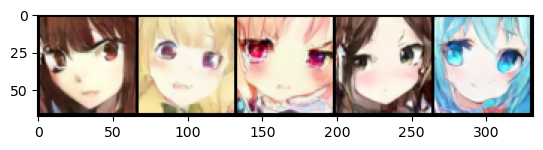

In [22]:
EPOCHS = 500
for epoch in range(201, EPOCHS + 1):
    for step, (images, _) in enumerate(dataloader):
        """This is the implementation of Algorithm 1 in the paper: https://arxiv.org/abs/2006.11239 """
        
        images = images.to(DEVICE)
        t = diffusion.sample_timesteps(n=len(images))
        x_t, noise = diffusion.noise_image_at_time_t(images, t)  # shape: (N, C, H, W); t is (N, 1)
        
        predicted_noise = model(x_t, t)
        loss = mse(predicted_noise, noise)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        if (epoch % 5 == 0 and step == 0) or (epoch == 1 and step == 0):
            save_checkpoint(model, optimizer, epoch, path=f'model.chk')
            sampled_images = diffusion.sample(model, n=5)
            plot_tensor_images(sampled_images, path=f'model_epoch{epoch}.png', nrow=10)

## Snapshots of training

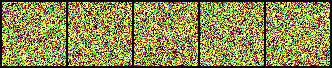

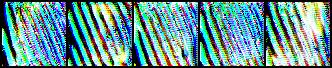

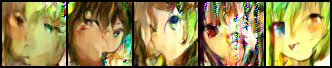

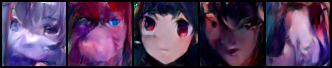

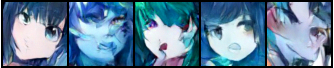

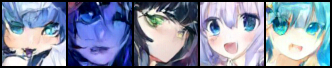

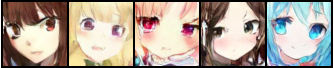

## Plot sample images

999it [02:49,  5.90it/s]


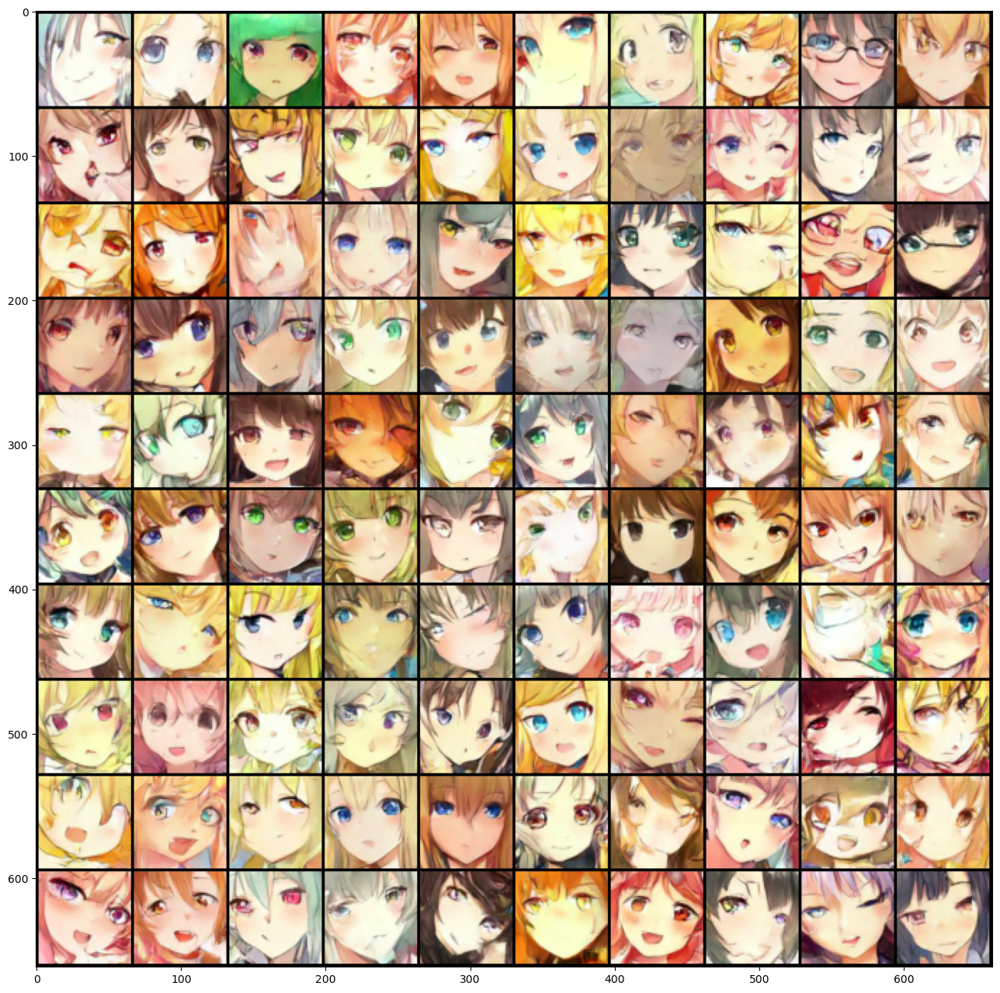

In [91]:
sampled_images = diffusion.sample(model, n=100)
plt.figure(figsize=(16,16))
plot_tensor_images(sampled_images, nrow=10)

In [23]:
save_checkpoint(model, optimizer, epoch, path=f'model_500.chk')